In [1]:
import numpy as np
import pandas as pd
import csv
import os
import matplotlib
import matplotlib.pyplot as plt
import math
import torch
import spinup
import multiprocessing as mp

from torch.autograd import Variable
from sklearn.linear_model import LinearRegression
from matplotlib import cm
from matplotlib.ticker import LinearLocator
from spinup.algos.pytorch.ddpg.core import MLPActorCritic

%matplotlib notebook

In [2]:
from src import *
from src.constants import DT, MAX_X, MAX_Y, BALL_ERROR_SCALING, BALL_D_ERROR_SCALING, BALL_INTEGRAL_ERROR_SCALING

In [3]:
train = True

In [4]:
with open('src/data/benchmark_trajectory.json') as json_file:
    benchmark_data = json.load(json_file)

In [5]:
t = np.array(benchmark_data['t'])
test_trajectory = np.array(benchmark_data['target'])
benchmark_trajectory = np.array(benchmark_data['trajectory'])
benchmark_angle = np.array(benchmark_data['angle'])
benchmark_u = np.array(benchmark_data['u'])

# Exploration

In [6]:
epoch = 250

In [7]:
root = 'src/data/dyn_pid_controller/explo'

In [17]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [50]
gamma = 0.99
act = torch.nn.ReLU
name='le0.6_[50]_relu_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[50]_relu_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"ReLU",
        "hidden_sizes":	[
            50
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fab6da5c0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[50]_relu_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[50]_relu_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },
    "logger_kwargs":	{
        "exp_n

/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


---------------------------------------
|             Epoch |               1 |
|      AverageEpRet |           -93.3 |
|          StdEpRet |            33.6 |
|          MaxEpRet |           -59.7 |
|          MinEpRet |            -127 |
|  AverageTestEpRet |            -142 |
|      StdTestEpRet |            50.7 |
|      MaxTestEpRet |           -57.3 |
|      MinTestEpRet |            -214 |
|             EpLen |             400 |
|         TestEpLen |             295 |
| TotalEnvInteracts |         1.1e+03 |
|      AverageQVals |          -0.148 |
|          StdQVals |           0.233 |
|          MaxQVals |            7.02 |
|          MinQVals |           -3.92 |
|            LossPi |          0.0661 |
|             LossQ |          0.0756 |
|              Time |            14.1 |
---------------------------------------
---------------------------------------
|             Epoch |               2 |
|      AverageEpRet |             -43 |
|          StdEpRet |            99.3 |


---------------------------------------
|             Epoch |              11 |
|      AverageEpRet |           -59.3 |
|          StdEpRet |            11.2 |
|          MaxEpRet |           -47.7 |
|          MinEpRet |           -74.5 |
|  AverageTestEpRet |           -23.6 |
|      StdTestEpRet |            97.3 |
|      MaxTestEpRet |             121 |
|      MinTestEpRet |            -205 |
|             EpLen |             400 |
|         TestEpLen |             336 |
| TotalEnvInteracts |        1.21e+04 |
|      AverageQVals |            2.96 |
|          StdQVals |            5.29 |
|          MaxQVals |            15.1 |
|          MinQVals |           -39.4 |
|            LossPi |           -3.19 |
|             LossQ |           0.142 |
|              Time |             783 |
---------------------------------------
---------------------------------------
|             Epoch |              12 |
|      AverageEpRet |           -71.9 |
|          StdEpRet |            19.2 |


---------------------------------------
|             Epoch |              21 |
|      AverageEpRet |             163 |
|          StdEpRet |            17.8 |
|          MaxEpRet |             180 |
|          MinEpRet |             139 |
|  AverageTestEpRet |             190 |
|      StdTestEpRet |            31.6 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |             125 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.31e+04 |
|      AverageQVals |            13.1 |
|          StdQVals |            9.58 |
|          MaxQVals |              30 |
|          MinQVals |           -43.4 |
|            LossPi |           -13.5 |
|             LossQ |           0.591 |
|              Time |        1.49e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              22 |
|      AverageEpRet |             225 |
|          StdEpRet |            11.1 |


---------------------------------------
|             Epoch |              31 |
|      AverageEpRet |             131 |
|          StdEpRet |             113 |
|          MaxEpRet |             214 |
|          MinEpRet |             -28 |
|  AverageTestEpRet |            80.1 |
|      StdTestEpRet |             129 |
|      MaxTestEpRet |             286 |
|      MinTestEpRet |            -182 |
|             EpLen |             400 |
|         TestEpLen |             341 |
| TotalEnvInteracts |        3.41e+04 |
|      AverageQVals |            28.8 |
|          StdQVals |            15.1 |
|          MaxQVals |            46.1 |
|          MinQVals |           -64.8 |
|            LossPi |           -29.2 |
|             LossQ |           0.716 |
|              Time |         2.2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              32 |
|      AverageEpRet |             208 |
|          StdEpRet |            4.66 |


---------------------------------------
|             Epoch |              41 |
|      AverageEpRet |            64.7 |
|          StdEpRet |             157 |
|          MaxEpRet |             278 |
|          MinEpRet |           -95.7 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |             205 |
|      MaxTestEpRet |             275 |
|      MinTestEpRet |            -382 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.51e+04 |
|      AverageQVals |            39.4 |
|          StdQVals |            15.6 |
|          MaxQVals |            59.5 |
|          MinQVals |           -42.4 |
|            LossPi |           -39.7 |
|             LossQ |           0.625 |
|              Time |         2.9e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              42 |
|      AverageEpRet |            66.1 |
|          StdEpRet |             117 |


---------------------------------------
|             Epoch |              51 |
|      AverageEpRet |             227 |
|          StdEpRet |            35.4 |
|          MaxEpRet |             253 |
|          MinEpRet |             176 |
|  AverageTestEpRet |             200 |
|      StdTestEpRet |            68.9 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |           -18.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.61e+04 |
|      AverageQVals |            46.9 |
|          StdQVals |              18 |
|          MaxQVals |            67.8 |
|          MinQVals |           -52.8 |
|            LossPi |           -47.2 |
|             LossQ |           0.679 |
|              Time |        3.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              52 |
|      AverageEpRet |             223 |
|          StdEpRet |              23 |


---------------------------------------
|             Epoch |              61 |
|      AverageEpRet |             196 |
|          StdEpRet |            31.6 |
|          MaxEpRet |             219 |
|          MinEpRet |             151 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            99.3 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |            -131 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.71e+04 |
|      AverageQVals |            53.2 |
|          StdQVals |            17.9 |
|          MaxQVals |            74.5 |
|          MinQVals |           -50.4 |
|            LossPi |           -53.5 |
|             LossQ |           0.682 |
|              Time |        4.32e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              62 |
|      AverageEpRet |             177 |
|          StdEpRet |            24.9 |


---------------------------------------
|             Epoch |              71 |
|      AverageEpRet |             151 |
|          StdEpRet |            84.5 |
|          MaxEpRet |             223 |
|          MinEpRet |            32.6 |
|  AverageTestEpRet |             162 |
|      StdTestEpRet |            85.6 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |           -49.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.81e+04 |
|      AverageQVals |            56.5 |
|          StdQVals |            19.7 |
|          MaxQVals |            78.1 |
|          MinQVals |           -64.7 |
|            LossPi |           -56.7 |
|             LossQ |           0.844 |
|              Time |        5.01e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              72 |
|      AverageEpRet |             183 |
|          StdEpRet |            52.7 |


---------------------------------------
|             Epoch |              81 |
|      AverageEpRet |             184 |
|          StdEpRet |            29.1 |
|          MaxEpRet |             213 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             113 |
|      StdTestEpRet |             119 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |            -198 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.91e+04 |
|      AverageQVals |            60.6 |
|          StdQVals |            19.7 |
|          MaxQVals |            79.1 |
|          MinQVals |           -58.3 |
|            LossPi |           -60.9 |
|             LossQ |           0.665 |
|              Time |        5.71e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              82 |
|      AverageEpRet |             169 |
|          StdEpRet |            10.5 |


---------------------------------------
|             Epoch |              91 |
|      AverageEpRet |             116 |
|          StdEpRet |            99.5 |
|          MaxEpRet |             218 |
|          MinEpRet |           -18.9 |
|  AverageTestEpRet |            67.6 |
|      StdTestEpRet |             149 |
|      MaxTestEpRet |             269 |
|      MinTestEpRet |            -260 |
|             EpLen |             400 |
|         TestEpLen |             359 |
| TotalEnvInteracts |           1e+05 |
|      AverageQVals |            62.2 |
|          StdQVals |            18.5 |
|          MaxQVals |            77.9 |
|          MinQVals |           -49.1 |
|            LossPi |           -62.4 |
|             LossQ |           0.465 |
|              Time |        6.41e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              92 |
|      AverageEpRet |            89.9 |
|          StdEpRet |             123 |


---------------------------------------
|             Epoch |             101 |
|      AverageEpRet |           -60.6 |
|          StdEpRet |             215 |
|          MaxEpRet |             239 |
|          MinEpRet |            -259 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |            67.8 |
|      MaxTestEpRet |             275 |
|      MinTestEpRet |           -49.1 |
|             EpLen |             364 |
|         TestEpLen |             384 |
| TotalEnvInteracts |        1.11e+05 |
|      AverageQVals |            62.8 |
|          StdQVals |              19 |
|          MaxQVals |            78.9 |
|          MinQVals |           -45.2 |
|            LossPi |             -63 |
|             LossQ |           0.537 |
|              Time |        7.12e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             102 |
|      AverageEpRet |             223 |
|          StdEpRet |            33.4 |


---------------------------------------
|             Epoch |             111 |
|      AverageEpRet |             148 |
|          StdEpRet |            69.6 |
|          MaxEpRet |             227 |
|          MinEpRet |            57.6 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            54.7 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            74.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.22e+05 |
|      AverageQVals |            64.7 |
|          StdQVals |            18.4 |
|          MaxQVals |            81.9 |
|          MinQVals |           -48.9 |
|            LossPi |           -64.9 |
|             LossQ |           0.487 |
|              Time |        7.81e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             112 |
|      AverageEpRet |             171 |
|          StdEpRet |            66.8 |


---------------------------------------
|             Epoch |             121 |
|      AverageEpRet |             145 |
|          StdEpRet |            51.5 |
|          MaxEpRet |             197 |
|          MinEpRet |            93.8 |
|  AverageTestEpRet |             185 |
|      StdTestEpRet |            62.3 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |           -39.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.33e+05 |
|      AverageQVals |            63.6 |
|          StdQVals |            19.1 |
|          MaxQVals |            82.9 |
|          MinQVals |           -47.4 |
|            LossPi |           -63.8 |
|             LossQ |           0.538 |
|              Time |         8.5e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             122 |
|      AverageEpRet |            93.2 |
|          StdEpRet |             110 |


---------------------------------------
|             Epoch |             131 |
|      AverageEpRet |             161 |
|          StdEpRet |            44.5 |
|          MaxEpRet |             218 |
|          MinEpRet |             109 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |             147 |
|      MaxTestEpRet |             244 |
|      MinTestEpRet |            -371 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.44e+05 |
|      AverageQVals |            64.1 |
|          StdQVals |            17.7 |
|          MaxQVals |            81.8 |
|          MinQVals |           -49.1 |
|            LossPi |           -64.4 |
|             LossQ |             0.6 |
|              Time |         9.2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             132 |
|      AverageEpRet |             159 |
|          StdEpRet |            36.3 |


---------------------------------------
|             Epoch |             141 |
|      AverageEpRet |             148 |
|          StdEpRet |            67.1 |
|          MaxEpRet |             210 |
|          MinEpRet |              55 |
|  AverageTestEpRet |             122 |
|      StdTestEpRet |             102 |
|      MaxTestEpRet |             206 |
|      MinTestEpRet |            -126 |
|             EpLen |             400 |
|         TestEpLen |             370 |
| TotalEnvInteracts |        1.55e+05 |
|      AverageQVals |            63.2 |
|          StdQVals |            17.9 |
|          MaxQVals |            83.1 |
|          MinQVals |           -39.3 |
|            LossPi |           -63.4 |
|             LossQ |           0.588 |
|              Time |        9.91e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             142 |
|      AverageEpRet |             164 |
|          StdEpRet |            70.6 |


---------------------------------------
|             Epoch |             151 |
|      AverageEpRet |             144 |
|          StdEpRet |            76.1 |
|          MaxEpRet |             224 |
|          MinEpRet |            41.6 |
|  AverageTestEpRet |             130 |
|      StdTestEpRet |             103 |
|      MaxTestEpRet |             253 |
|      MinTestEpRet |           -69.7 |
|             EpLen |             400 |
|         TestEpLen |             370 |
| TotalEnvInteracts |        1.66e+05 |
|      AverageQVals |              64 |
|          StdQVals |            18.1 |
|          MaxQVals |            82.9 |
|          MinQVals |           -56.9 |
|            LossPi |           -64.2 |
|             LossQ |           0.601 |
|              Time |        1.05e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             152 |
|      AverageEpRet |             207 |
|          StdEpRet |            56.6 |


---------------------------------------
|             Epoch |             161 |
|      AverageEpRet |            26.8 |
|          StdEpRet |              86 |
|          MaxEpRet |             154 |
|          MinEpRet |           -58.9 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            67.7 |
|      MaxTestEpRet |             271 |
|      MinTestEpRet |            55.6 |
|             EpLen |             272 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.77e+05 |
|      AverageQVals |              64 |
|          StdQVals |            18.4 |
|          MaxQVals |            83.5 |
|          MinQVals |           -45.9 |
|            LossPi |           -64.2 |
|             LossQ |           0.643 |
|              Time |         1.1e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             162 |
|      AverageEpRet |              86 |
|          StdEpRet |            84.9 |


---------------------------------------
|             Epoch |             171 |
|      AverageEpRet |             164 |
|          StdEpRet |            71.4 |
|          MaxEpRet |             229 |
|          MinEpRet |            64.4 |
|  AverageTestEpRet |             190 |
|      StdTestEpRet |            38.2 |
|      MaxTestEpRet |             253 |
|      MinTestEpRet |             122 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.88e+05 |
|      AverageQVals |            64.2 |
|          StdQVals |            18.2 |
|          MaxQVals |            82.4 |
|          MinQVals |           -61.1 |
|            LossPi |           -64.4 |
|             LossQ |           0.627 |
|              Time |        1.14e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             172 |
|      AverageEpRet |             221 |
|          StdEpRet |            25.6 |


---------------------------------------
|             Epoch |             181 |
|      AverageEpRet |             200 |
|          StdEpRet |            12.7 |
|          MaxEpRet |             217 |
|          MinEpRet |             187 |
|  AverageTestEpRet |             173 |
|      StdTestEpRet |            71.5 |
|      MaxTestEpRet |             275 |
|      MinTestEpRet |           0.408 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.99e+05 |
|      AverageQVals |            64.3 |
|          StdQVals |            17.7 |
|          MaxQVals |            81.2 |
|          MinQVals |           -55.3 |
|            LossPi |           -64.5 |
|             LossQ |           0.566 |
|              Time |        1.18e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             182 |
|      AverageEpRet |             190 |
|          StdEpRet |           0.778 |


---------------------------------------
|             Epoch |             191 |
|      AverageEpRet |            56.3 |
|          StdEpRet |             244 |
|          MaxEpRet |             256 |
|          MinEpRet |            -287 |
|  AverageTestEpRet |            61.3 |
|      StdTestEpRet |             209 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |            -332 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.1e+05 |
|      AverageQVals |            65.4 |
|          StdQVals |            16.2 |
|          MaxQVals |            80.5 |
|          MinQVals |             -34 |
|            LossPi |           -65.5 |
|             LossQ |           0.451 |
|              Time |        1.23e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             192 |
|      AverageEpRet |             169 |
|          StdEpRet |            30.1 |


---------------------------------------
|             Epoch |             201 |
|      AverageEpRet |             188 |
|          StdEpRet |            30.7 |
|          MaxEpRet |             222 |
|          MinEpRet |             148 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            42.7 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |             115 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.21e+05 |
|      AverageQVals |            64.9 |
|          StdQVals |            16.1 |
|          MaxQVals |             109 |
|          MinQVals |           -68.3 |
|            LossPi |           -65.1 |
|             LossQ |           0.599 |
|              Time |        1.27e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             202 |
|      AverageEpRet |             128 |
|          StdEpRet |            27.8 |


---------------------------------------
|             Epoch |             211 |
|      AverageEpRet |             193 |
|          StdEpRet |            24.1 |
|          MaxEpRet |             227 |
|          MinEpRet |             174 |
|  AverageTestEpRet |             128 |
|      StdTestEpRet |            87.2 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |           -71.5 |
|             EpLen |             400 |
|         TestEpLen |             384 |
| TotalEnvInteracts |        2.32e+05 |
|      AverageQVals |            67.1 |
|          StdQVals |            14.5 |
|          MaxQVals |            81.2 |
|          MinQVals |             -25 |
|            LossPi |           -67.3 |
|             LossQ |           0.475 |
|              Time |        1.31e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             212 |
|      AverageEpRet |            96.4 |
|          StdEpRet |            62.8 |


---------------------------------------
|             Epoch |             221 |
|      AverageEpRet |             190 |
|          StdEpRet |            43.9 |
|          MaxEpRet |             230 |
|          MinEpRet |             129 |
|  AverageTestEpRet |             175 |
|      StdTestEpRet |            62.8 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |            9.23 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.43e+05 |
|      AverageQVals |            66.2 |
|          StdQVals |            14.5 |
|          MaxQVals |            80.8 |
|          MinQVals |           -31.3 |
|            LossPi |           -66.4 |
|             LossQ |           0.415 |
|              Time |        1.36e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             222 |
|      AverageEpRet |             150 |
|          StdEpRet |            63.5 |


---------------------------------------
|             Epoch |             231 |
|      AverageEpRet |           -9.87 |
|          StdEpRet |             116 |
|          MaxEpRet |             140 |
|          MinEpRet |            -144 |
|  AverageTestEpRet |            68.2 |
|      StdTestEpRet |             135 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |            -203 |
|             EpLen |             400 |
|         TestEpLen |             385 |
| TotalEnvInteracts |        2.54e+05 |
|      AverageQVals |            66.2 |
|          StdQVals |            15.1 |
|          MaxQVals |            80.2 |
|          MinQVals |             -38 |
|            LossPi |           -66.4 |
|             LossQ |           0.397 |
|              Time |         1.4e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             232 |
|      AverageEpRet |             128 |
|          StdEpRet |              46 |


---------------------------------------
|             Epoch |             241 |
|      AverageEpRet |             172 |
|          StdEpRet |              34 |
|          MaxEpRet |             219 |
|          MinEpRet |             141 |
|  AverageTestEpRet |             145 |
|      StdTestEpRet |            87.6 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |           -65.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.65e+05 |
|      AverageQVals |            65.6 |
|          StdQVals |            15.6 |
|          MaxQVals |              79 |
|          MinQVals |           -46.6 |
|            LossPi |           -65.7 |
|             LossQ |           0.455 |
|              Time |        1.45e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             242 |
|      AverageEpRet |             164 |
|          StdEpRet |            63.4 |


{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0.04402079, 0.00943778], dtype=float32), array([0.02575662, 0.0580942 ], dtype=float32), array([0.00193671, 0.00180836], dtype=float32))


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0001662292140261454


<IPython.core.display.Javascript object>


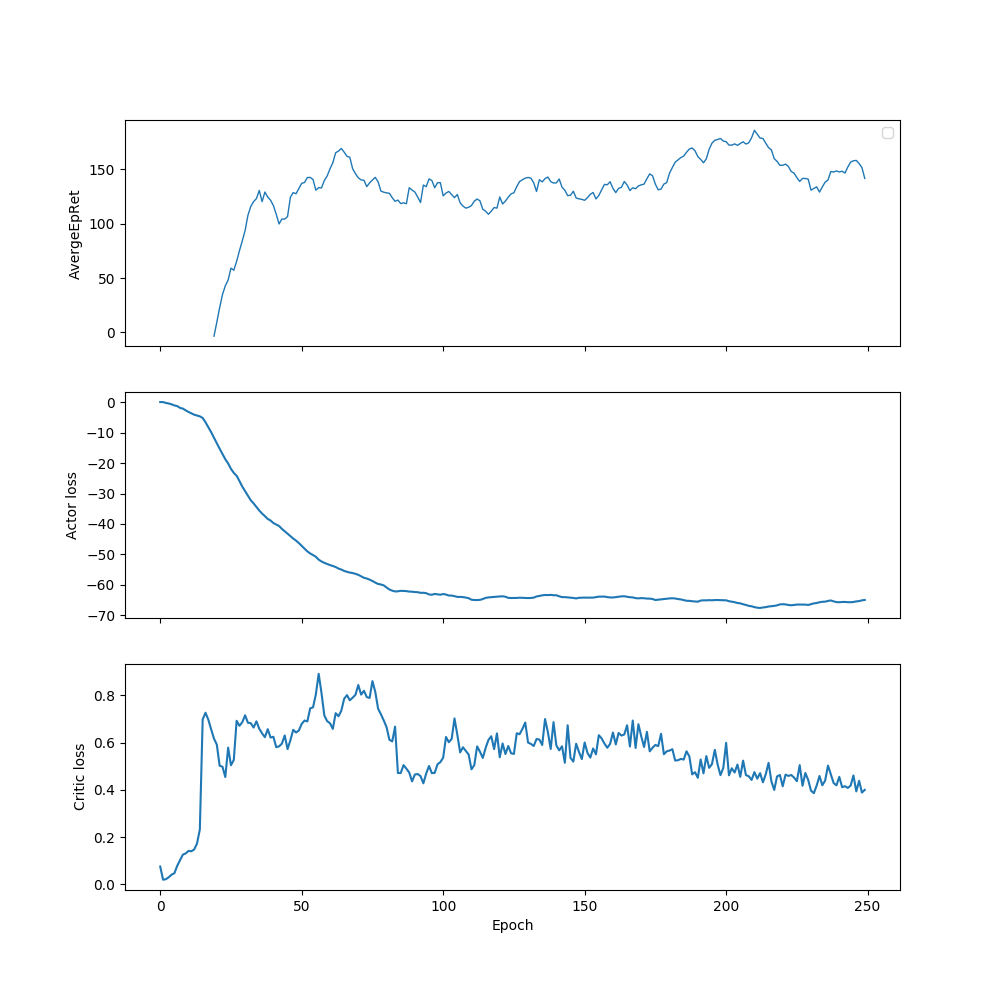

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


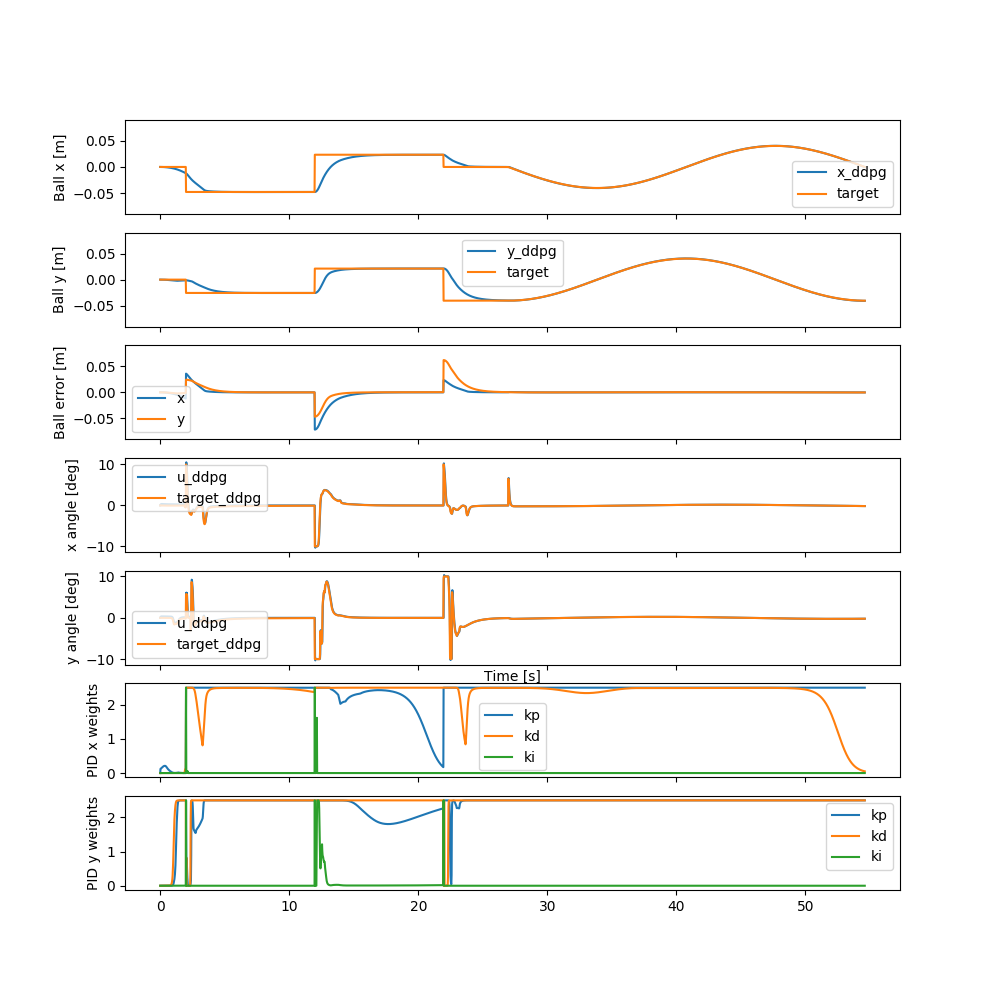

In [18]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 75000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [19]:
w = trained_ac.pi.state_dict()

saved_weights = {}
for key, value in w.items():
    saved_weights[key] = value.detach().numpy().tolist()
    
with open('{}/{}/pyt_save/model.json'.format(root, name), 'w') as json_file:
    json.dump(saved_weights, json_file, indent=1)

In [20]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [100]
gamma = 0.99
act = torch.nn.ReLU
name='le0.6_[100]_relu_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[100]_relu_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"ReLU",
        "hidden_sizes":	[
            100
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa82f7f60>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[100]_relu_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[100]_relu_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },
    "logger_kwargs":	{
        "e

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -72.5 |
|          StdEpRet |            4.38 |
|          MaxEpRet |           -67.6 |
|          MinEpRet |           -78.2 |
|  AverageTestEpRet |            -131 |
|      StdTestEpRet |             120 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |            -283 |
|             EpLen |             400 |
|         TestEpLen |             277 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            1.13 |
|          StdQVals |            4.94 |
|          MaxQVals |            12.9 |
|          MinQVals |           -43.4 |
|            LossPi |           -1.33 |
|             LossQ |           0.101 |
|              Time |             253 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -23.2 |
|          StdEpRet |            39.5 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            -102 |
|          StdEpRet |             138 |
|          MaxEpRet |              10 |
|          MinEpRet |            -338 |
|  AverageTestEpRet |            -107 |
|      StdTestEpRet |            86.3 |
|      MaxTestEpRet |            97.7 |
|      MinTestEpRet |            -260 |
|             EpLen |             252 |
|         TestEpLen |             216 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            6.98 |
|          StdQVals |            8.96 |
|          MaxQVals |            30.6 |
|          MinQVals |             -63 |
|            LossPi |           -7.22 |
|             LossQ |           0.688 |
|              Time |             675 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |           -90.5 |
|          StdEpRet |             184 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             111 |
|          StdEpRet |             158 |
|          MaxEpRet |             242 |
|          MinEpRet |            -112 |
|  AverageTestEpRet |            8.65 |
|      StdTestEpRet |             170 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |            -240 |
|             EpLen |             400 |
|         TestEpLen |             356 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            14.5 |
|          StdQVals |            15.3 |
|          MaxQVals |            37.2 |
|          MinQVals |             -56 |
|            LossPi |             -15 |
|             LossQ |            1.07 |
|              Time |        1.12e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             122 |
|          StdEpRet |             181 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             175 |
|          StdEpRet |            14.9 |
|          MaxEpRet |             190 |
|          MinEpRet |             160 |
|  AverageTestEpRet |             132 |
|      StdTestEpRet |             123 |
|      MaxTestEpRet |             238 |
|      MinTestEpRet |            -338 |
|             EpLen |             400 |
|         TestEpLen |             399 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            28.1 |
|          StdQVals |            17.4 |
|          MaxQVals |              53 |
|          MinQVals |           -65.8 |
|            LossPi |           -28.5 |
|             LossQ |           0.999 |
|              Time |        1.62e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             162 |
|          StdEpRet |            22.7 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             133 |
|          StdEpRet |             103 |
|          MaxEpRet |             235 |
|          MinEpRet |           -7.73 |
|  AverageTestEpRet |             193 |
|      StdTestEpRet |            55.4 |
|      MaxTestEpRet |             284 |
|      MinTestEpRet |            73.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            38.8 |
|          StdQVals |            17.9 |
|          MaxQVals |            61.8 |
|          MinQVals |           -66.3 |
|            LossPi |           -39.1 |
|             LossQ |           0.783 |
|              Time |        2.06e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             181 |
|          StdEpRet |              31 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             231 |
|          StdEpRet |            34.4 |
|          MaxEpRet |             261 |
|          MinEpRet |             183 |
|  AverageTestEpRet |             181 |
|      StdTestEpRet |            55.3 |
|      MaxTestEpRet |             266 |
|      MinTestEpRet |            56.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            46.5 |
|          StdQVals |            17.9 |
|          MaxQVals |            66.8 |
|          MinQVals |           -39.7 |
|            LossPi |           -46.9 |
|             LossQ |           0.685 |
|              Time |        2.55e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             204 |
|          StdEpRet |            37.4 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |            45.8 |
|          StdEpRet |             216 |
|          MaxEpRet |             231 |
|          MinEpRet |            -257 |
|  AverageTestEpRet |             209 |
|      StdTestEpRet |            54.7 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |            58.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            50.5 |
|          StdQVals |            19.7 |
|          MaxQVals |            71.4 |
|          MinQVals |             -36 |
|            LossPi |           -50.8 |
|             LossQ |            0.82 |
|              Time |        2.98e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             217 |
|          StdEpRet |            41.9 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             231 |
|          StdEpRet |            9.36 |
|          MaxEpRet |             241 |
|          MinEpRet |             222 |
|  AverageTestEpRet |             104 |
|      StdTestEpRet |             164 |
|      MaxTestEpRet |             281 |
|      MinTestEpRet |            -283 |
|             EpLen |             400 |
|         TestEpLen |             383 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            53.4 |
|          StdQVals |            20.7 |
|          MaxQVals |            74.4 |
|          MinQVals |           -43.5 |
|            LossPi |           -53.7 |
|             LossQ |           0.907 |
|              Time |        3.46e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |            85.7 |
|          StdEpRet |             139 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             251 |
|          StdEpRet |            4.78 |
|          MaxEpRet |             257 |
|          MinEpRet |             247 |
|  AverageTestEpRet |             167 |
|      StdTestEpRet |              89 |
|      MaxTestEpRet |             259 |
|      MinTestEpRet |           -96.4 |
|             EpLen |             400 |
|         TestEpLen |             386 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            55.6 |
|          StdQVals |            21.4 |
|          MaxQVals |            75.7 |
|          MinQVals |           -41.5 |
|            LossPi |           -55.9 |
|             LossQ |               1 |
|              Time |         3.9e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             234 |
|          StdEpRet |            27.4 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             203 |
|          StdEpRet |            27.1 |
|          MaxEpRet |             239 |
|          MinEpRet |             174 |
|  AverageTestEpRet |             196 |
|      StdTestEpRet |            54.3 |
|      MaxTestEpRet |             266 |
|      MinTestEpRet |            31.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            57.8 |
|          StdQVals |            20.8 |
|          MaxQVals |            77.1 |
|          MinQVals |           -39.4 |
|            LossPi |             -58 |
|             LossQ |           0.869 |
|              Time |        4.37e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             201 |
|          StdEpRet |            1.47 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             212 |
|          StdEpRet |            17.7 |
|          MaxEpRet |             236 |
|          MinEpRet |             195 |
|  AverageTestEpRet |             156 |
|      StdTestEpRet |             111 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |            -242 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            59.2 |
|          StdQVals |            20.5 |
|          MaxQVals |            82.8 |
|          MinQVals |           -57.7 |
|            LossPi |           -59.4 |
|             LossQ |           0.949 |
|              Time |        4.84e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             193 |
|          StdEpRet |            37.5 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             192 |
|          StdEpRet |            20.1 |
|          MaxEpRet |             212 |
|          MinEpRet |             171 |
|  AverageTestEpRet |             210 |
|      StdTestEpRet |            38.5 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |            95.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            60.9 |
|          StdQVals |            19.8 |
|          MaxQVals |            78.8 |
|          MinQVals |           -58.8 |
|            LossPi |           -61.1 |
|             LossQ |           0.799 |
|              Time |        5.25e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             152 |
|          StdEpRet |             130 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             135 |
|          StdEpRet |            62.9 |
|          MaxEpRet |             201 |
|          MinEpRet |            50.8 |
|  AverageTestEpRet |             157 |
|      StdTestEpRet |             124 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |            -180 |
|             EpLen |             400 |
|         TestEpLen |             363 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            61.7 |
|          StdQVals |            19.1 |
|          MaxQVals |            79.2 |
|          MinQVals |           -62.2 |
|            LossPi |           -61.9 |
|             LossQ |           0.808 |
|              Time |        5.76e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             166 |
|          StdEpRet |            1.68 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             206 |
|          StdEpRet |            25.8 |
|          MaxEpRet |             242 |
|          MinEpRet |             185 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |              85 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |           -22.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            62.9 |
|          StdQVals |            18.8 |
|          MaxQVals |            80.6 |
|          MinQVals |           -41.9 |
|            LossPi |           -63.2 |
|             LossQ |           0.739 |
|              Time |        6.19e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             188 |
|          StdEpRet |            22.5 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             221 |
|          StdEpRet |            45.5 |
|          MaxEpRet |             266 |
|          MinEpRet |             175 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |             124 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |            -219 |
|             EpLen |             400 |
|         TestEpLen |             384 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            63.5 |
|          StdQVals |            18.3 |
|          MaxQVals |            80.8 |
|          MinQVals |           -67.8 |
|            LossPi |           -63.7 |
|             LossQ |           0.771 |
|              Time |        6.67e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             200 |
|          StdEpRet |            32.5 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             183 |
|          StdEpRet |            55.7 |
|          MaxEpRet |             242 |
|          MinEpRet |             108 |
|  AverageTestEpRet |             191 |
|      StdTestEpRet |            42.4 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |            64.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            64.8 |
|          StdQVals |            18.4 |
|          MaxQVals |            83.2 |
|          MinQVals |           -76.7 |
|            LossPi |           -65.1 |
|             LossQ |           0.682 |
|              Time |        7.08e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             178 |
|          StdEpRet |            55.6 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             152 |
|          StdEpRet |            35.3 |
|          MaxEpRet |             188 |
|          MinEpRet |             117 |
|  AverageTestEpRet |             200 |
|      StdTestEpRet |            39.4 |
|      MaxTestEpRet |             259 |
|      MinTestEpRet |             118 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            65.7 |
|          StdQVals |              18 |
|          MaxQVals |            84.2 |
|          MinQVals |           -37.9 |
|            LossPi |           -65.9 |
|             LossQ |           0.706 |
|              Time |        7.55e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             181 |
|          StdEpRet |            37.1 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             198 |
|          StdEpRet |            21.2 |
|          MaxEpRet |             217 |
|          MinEpRet |             169 |
|  AverageTestEpRet |             162 |
|      StdTestEpRet |             119 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |            -335 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            65.2 |
|          StdQVals |              18 |
|          MaxQVals |            82.1 |
|          MinQVals |           -50.5 |
|            LossPi |           -65.4 |
|             LossQ |           0.663 |
|              Time |        8.01e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             159 |
|          StdEpRet |            49.3 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             164 |
|          StdEpRet |            19.6 |
|          MaxEpRet |             184 |
|          MinEpRet |             144 |
|  AverageTestEpRet |             176 |
|      StdTestEpRet |            79.2 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |            -138 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            64.9 |
|          StdQVals |            17.3 |
|          MaxQVals |            83.4 |
|          MinQVals |             -59 |
|            LossPi |           -65.1 |
|             LossQ |           0.628 |
|              Time |        8.45e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             230 |
|          StdEpRet |              24 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             156 |
|          StdEpRet |              86 |
|          MaxEpRet |             230 |
|          MinEpRet |            35.8 |
|  AverageTestEpRet |             171 |
|      StdTestEpRet |            62.2 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |           0.328 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            64.7 |
|          StdQVals |            17.4 |
|          MaxQVals |            82.5 |
|          MinQVals |             -89 |
|            LossPi |           -64.9 |
|             LossQ |           0.749 |
|              Time |        8.94e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             179 |
|          StdEpRet |            28.5 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             176 |
|          StdEpRet |            19.3 |
|          MaxEpRet |             195 |
|          MinEpRet |             157 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            32.9 |
|      MaxTestEpRet |             282 |
|      MinTestEpRet |             142 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            64.9 |
|          StdQVals |            16.9 |
|          MaxQVals |            80.9 |
|          MinQVals |           -52.4 |
|            LossPi |           -65.1 |
|             LossQ |           0.609 |
|              Time |        9.43e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             217 |
|          StdEpRet |              17 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             159 |
|          StdEpRet |            64.5 |
|          MaxEpRet |             211 |
|          MinEpRet |            68.2 |
|  AverageTestEpRet |             194 |
|      StdTestEpRet |            50.1 |
|      MaxTestEpRet |             262 |
|      MinTestEpRet |             102 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            65.2 |
|          StdQVals |              17 |
|          MaxQVals |             106 |
|          MinQVals |           -80.8 |
|            LossPi |           -65.4 |
|             LossQ |           0.607 |
|              Time |        9.91e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             207 |
|          StdEpRet |            28.1 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             225 |
|          StdEpRet |            26.1 |
|          MaxEpRet |             252 |
|          MinEpRet |             199 |
|  AverageTestEpRet |             194 |
|      StdTestEpRet |            58.6 |
|      MaxTestEpRet |             279 |
|      MinTestEpRet |            38.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |              66 |
|          StdQVals |            16.8 |
|          MaxQVals |            83.9 |
|          MinQVals |           -43.7 |
|            LossPi |           -66.2 |
|             LossQ |           0.519 |
|              Time |        1.03e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             197 |
|          StdEpRet |            25.8 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             184 |
|          StdEpRet |            44.2 |
|          MaxEpRet |             225 |
|          MinEpRet |             122 |
|  AverageTestEpRet |             200 |
|      StdTestEpRet |            53.3 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |            29.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            66.3 |
|          StdQVals |            16.9 |
|          MaxQVals |            82.2 |
|          MinQVals |           -51.5 |
|            LossPi |           -66.5 |
|             LossQ |            0.59 |
|              Time |        1.09e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             204 |
|          StdEpRet |            35.4 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             184 |
|          StdEpRet |            36.8 |
|          MaxEpRet |             221 |
|          MinEpRet |             148 |
|  AverageTestEpRet |             200 |
|      StdTestEpRet |            37.6 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |             128 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            66.5 |
|          StdQVals |              17 |
|          MaxQVals |            83.8 |
|          MinQVals |           -46.2 |
|            LossPi |           -66.6 |
|             LossQ |           0.721 |
|              Time |        1.16e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             184 |
|          StdEpRet |            32.3 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0001714534014491736


<IPython.core.display.Javascript object>


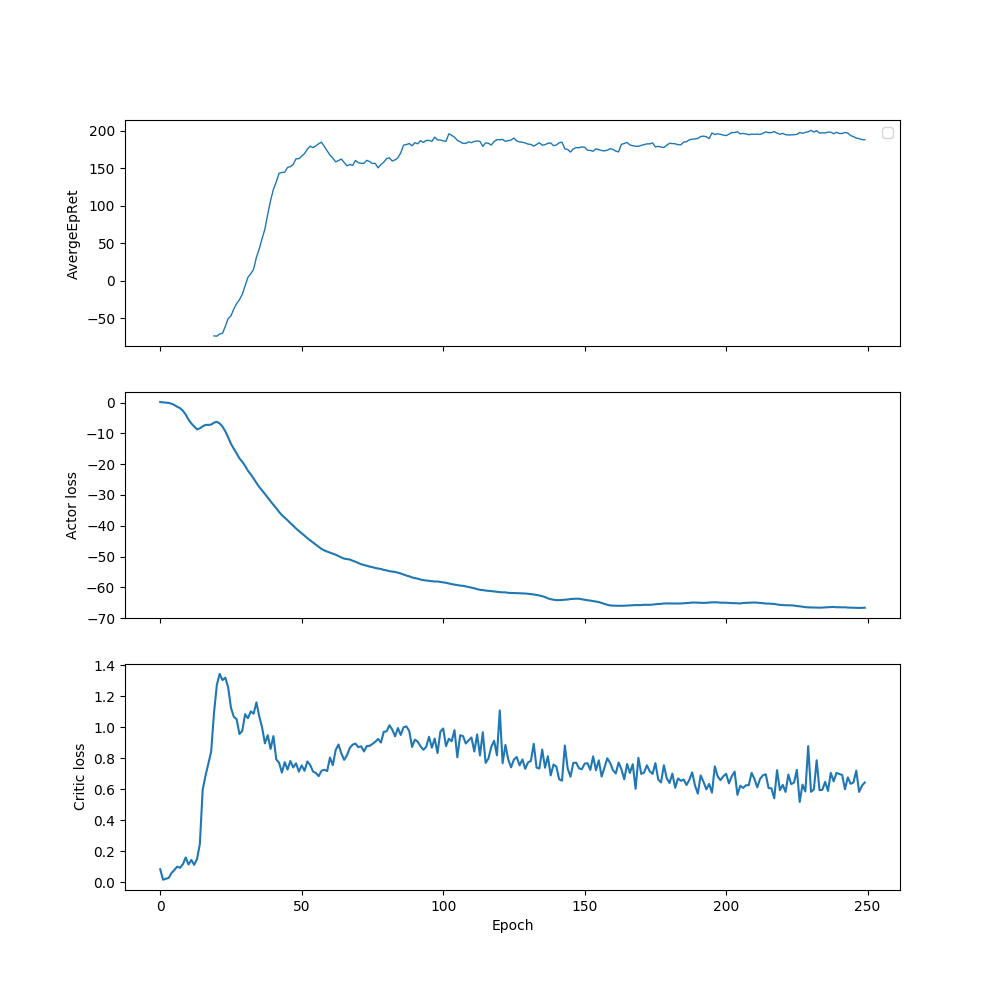

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


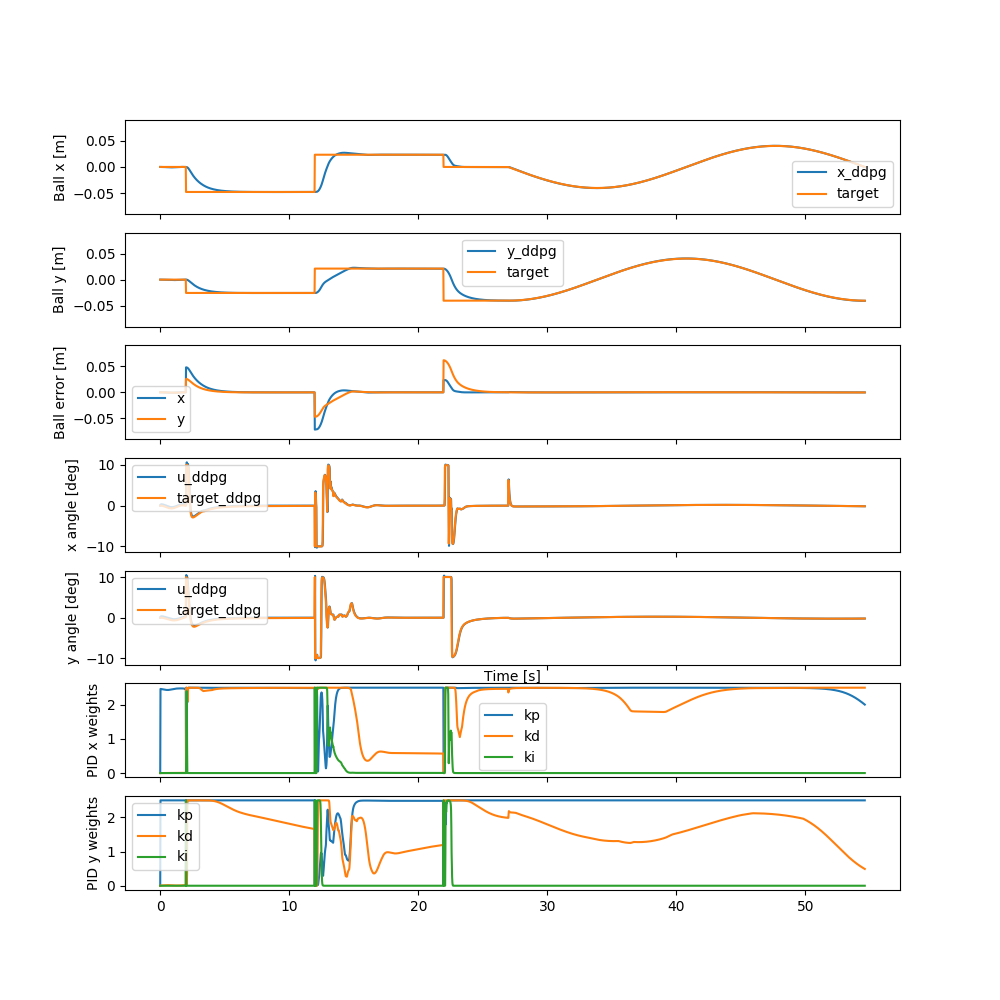

In [21]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [22]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [200]
gamma = 0.99
act = torch.nn.ReLU
name='le0.6_[200]_relu_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[200]_relu_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"ReLU",
        "hidden_sizes":	[
            200
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa8095278>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[200]_relu_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[200]_relu_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },
    "logger_kwargs":	{
        "e

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |            9.38 |
|          StdEpRet |            69.6 |
|          MaxEpRet |            99.7 |
|          MinEpRet |           -69.7 |
|  AverageTestEpRet |           -88.2 |
|      StdTestEpRet |             103 |
|      MaxTestEpRet |             173 |
|      MinTestEpRet |            -314 |
|             EpLen |             400 |
|         TestEpLen |             285 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |         -0.0216 |
|          StdQVals |            5.37 |
|          MaxQVals |            11.5 |
|          MinQVals |           -42.4 |
|            LossPi |          -0.168 |
|             LossQ |          0.0954 |
|              Time |             443 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -61.6 |
|          StdEpRet |            84.1 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |             -65 |
|          StdEpRet |             176 |
|          MaxEpRet |             168 |
|          MinEpRet |            -256 |
|  AverageTestEpRet |             108 |
|      StdTestEpRet |             137 |
|      MaxTestEpRet |             249 |
|      MinTestEpRet |            -167 |
|             EpLen |             310 |
|         TestEpLen |             323 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            4.49 |
|          StdQVals |            8.65 |
|          MaxQVals |            19.1 |
|          MinQVals |           -80.4 |
|            LossPi |           -4.79 |
|             LossQ |           0.386 |
|              Time |         1.2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             170 |
|          StdEpRet |            7.74 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             250 |
|          StdEpRet |            17.5 |
|          MaxEpRet |             267 |
|          MinEpRet |             232 |
|  AverageTestEpRet |             171 |
|      StdTestEpRet |            90.3 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |           -63.6 |
|             EpLen |             400 |
|         TestEpLen |             369 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            20.1 |
|          StdQVals |            14.4 |
|          MaxQVals |            41.4 |
|          MinQVals |           -64.7 |
|            LossPi |           -20.5 |
|             LossQ |           0.388 |
|              Time |        1.95e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             177 |
|          StdEpRet |              53 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             223 |
|          StdEpRet |            26.2 |
|          MaxEpRet |             256 |
|          MinEpRet |             192 |
|  AverageTestEpRet |             161 |
|      StdTestEpRet |             112 |
|      MaxTestEpRet |             279 |
|      MinTestEpRet |             -96 |
|             EpLen |             400 |
|         TestEpLen |             374 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            35.5 |
|          StdQVals |            17.8 |
|          MaxQVals |              56 |
|          MinQVals |           -51.4 |
|            LossPi |           -35.8 |
|             LossQ |           0.559 |
|              Time |        2.71e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             209 |
|          StdEpRet |           0.642 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             170 |
|          StdEpRet |            83.5 |
|          MaxEpRet |             286 |
|          MinEpRet |            93.5 |
|  AverageTestEpRet |             100 |
|      StdTestEpRet |             141 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |            -242 |
|             EpLen |             400 |
|         TestEpLen |             340 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            46.7 |
|          StdQVals |            17.8 |
|          MaxQVals |            65.9 |
|          MinQVals |             -53 |
|            LossPi |             -47 |
|             LossQ |           0.589 |
|              Time |        3.47e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |            98.1 |
|          StdEpRet |            77.7 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             181 |
|          StdEpRet |             103 |
|          MaxEpRet |             261 |
|          MinEpRet |            35.7 |
|  AverageTestEpRet |             157 |
|      StdTestEpRet |            87.8 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |           -60.2 |
|             EpLen |             400 |
|         TestEpLen |             371 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |              53 |
|          StdQVals |            18.6 |
|          MaxQVals |             133 |
|          MinQVals |           -65.2 |
|            LossPi |           -53.3 |
|             LossQ |           0.719 |
|              Time |        4.23e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             197 |
|          StdEpRet |            24.7 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             237 |
|          StdEpRet |            18.7 |
|          MaxEpRet |             257 |
|          MinEpRet |             212 |
|  AverageTestEpRet |             194 |
|      StdTestEpRet |            75.3 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |           -67.8 |
|             EpLen |             400 |
|         TestEpLen |             384 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            57.4 |
|          StdQVals |            18.8 |
|          MaxQVals |            82.1 |
|          MinQVals |           -57.7 |
|            LossPi |           -57.7 |
|             LossQ |           0.555 |
|              Time |           5e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             224 |
|          StdEpRet |            23.6 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             265 |
|          StdEpRet |            12.7 |
|          MaxEpRet |             278 |
|          MinEpRet |             253 |
|  AverageTestEpRet |             114 |
|      StdTestEpRet |             151 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |            -289 |
|             EpLen |             400 |
|         TestEpLen |             384 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |              61 |
|          StdQVals |            18.4 |
|          MaxQVals |            90.1 |
|          MinQVals |           -63.5 |
|            LossPi |           -61.2 |
|             LossQ |           0.669 |
|              Time |        5.76e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             206 |
|          StdEpRet |            44.3 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             178 |
|          StdEpRet |            78.8 |
|          MaxEpRet |             256 |
|          MinEpRet |              70 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |             105 |
|      MaxTestEpRet |             252 |
|      MinTestEpRet |            -107 |
|             EpLen |             400 |
|         TestEpLen |             356 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            63.8 |
|          StdQVals |            18.1 |
|          MaxQVals |             131 |
|          MinQVals |           -68.6 |
|            LossPi |           -64.1 |
|             LossQ |           0.707 |
|              Time |        6.54e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             163 |
|          StdEpRet |              17 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             240 |
|          StdEpRet |            19.4 |
|          MaxEpRet |             257 |
|          MinEpRet |             213 |
|  AverageTestEpRet |             185 |
|      StdTestEpRet |            97.3 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |            -121 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |              65 |
|          StdQVals |            17.5 |
|          MaxQVals |            84.9 |
|          MinQVals |           -37.7 |
|            LossPi |           -65.2 |
|             LossQ |           0.551 |
|              Time |        7.28e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             228 |
|          StdEpRet |            14.1 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             209 |
|          StdEpRet |            48.7 |
|          MaxEpRet |             259 |
|          MinEpRet |             143 |
|  AverageTestEpRet |             197 |
|      StdTestEpRet |            76.9 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |           -43.2 |
|             EpLen |             400 |
|         TestEpLen |             384 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            65.2 |
|          StdQVals |            17.5 |
|          MaxQVals |              83 |
|          MinQVals |           -36.3 |
|            LossPi |           -65.5 |
|             LossQ |           0.427 |
|              Time |        8.05e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             250 |
|          StdEpRet |            1.79 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             233 |
|          StdEpRet |            12.9 |
|          MaxEpRet |             246 |
|          MinEpRet |             220 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            66.2 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |            -2.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            65.9 |
|          StdQVals |            17.6 |
|          MaxQVals |            91.1 |
|          MinQVals |           -77.6 |
|            LossPi |           -66.1 |
|             LossQ |           0.681 |
|              Time |        8.81e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             169 |
|          StdEpRet |            94.9 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             189 |
|          StdEpRet |            19.2 |
|          MaxEpRet |             210 |
|          MinEpRet |             164 |
|  AverageTestEpRet |             133 |
|      StdTestEpRet |             128 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |            -119 |
|             EpLen |             400 |
|         TestEpLen |             356 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            66.5 |
|          StdQVals |            17.1 |
|          MaxQVals |              82 |
|          MinQVals |           -81.1 |
|            LossPi |           -66.7 |
|             LossQ |           0.512 |
|              Time |        9.57e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             215 |
|          StdEpRet |            46.3 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             203 |
|          StdEpRet |            46.3 |
|          MaxEpRet |             243 |
|          MinEpRet |             138 |
|  AverageTestEpRet |             182 |
|      StdTestEpRet |            83.9 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |           -83.8 |
|             EpLen |             400 |
|         TestEpLen |             387 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            66.3 |
|          StdQVals |              17 |
|          MaxQVals |            82.8 |
|          MinQVals |           -51.9 |
|            LossPi |           -66.5 |
|             LossQ |           0.481 |
|              Time |        1.03e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             185 |
|          StdEpRet |            63.5 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             172 |
|          StdEpRet |            52.5 |
|          MaxEpRet |             226 |
|          MinEpRet |             101 |
|  AverageTestEpRet |             179 |
|      StdTestEpRet |            48.4 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |            60.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            66.1 |
|          StdQVals |            17.2 |
|          MaxQVals |            86.2 |
|          MinQVals |           -77.1 |
|            LossPi |           -66.3 |
|             LossQ |           0.587 |
|              Time |        1.11e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             197 |
|          StdEpRet |              18 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             229 |
|          StdEpRet |            7.02 |
|          MaxEpRet |             237 |
|          MinEpRet |             220 |
|  AverageTestEpRet |             215 |
|      StdTestEpRet |            39.4 |
|      MaxTestEpRet |             288 |
|      MinTestEpRet |             119 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            66.6 |
|          StdQVals |            17.3 |
|          MaxQVals |            83.5 |
|          MinQVals |           -44.4 |
|            LossPi |           -66.7 |
|             LossQ |           0.479 |
|              Time |        1.19e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             191 |
|          StdEpRet |           0.267 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             227 |
|          StdEpRet |            10.7 |
|          MaxEpRet |             242 |
|          MinEpRet |             218 |
|  AverageTestEpRet |             215 |
|      StdTestEpRet |            42.7 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |             117 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            67.3 |
|          StdQVals |            16.7 |
|          MaxQVals |            84.1 |
|          MinQVals |           -45.1 |
|            LossPi |           -67.5 |
|             LossQ |           0.369 |
|              Time |        1.28e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             170 |
|          StdEpRet |            72.3 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             182 |
|          StdEpRet |            17.8 |
|          MaxEpRet |             208 |
|          MinEpRet |             169 |
|  AverageTestEpRet |             176 |
|      StdTestEpRet |            82.7 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |           -65.6 |
|             EpLen |             400 |
|         TestEpLen |             386 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            67.6 |
|          StdQVals |            16.3 |
|          MaxQVals |             108 |
|          MinQVals |           -68.3 |
|            LossPi |           -67.8 |
|             LossQ |           0.597 |
|              Time |        1.36e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             213 |
|          StdEpRet |            22.3 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             198 |
|          StdEpRet |            31.1 |
|          MaxEpRet |             242 |
|          MinEpRet |             174 |
|  AverageTestEpRet |             216 |
|      StdTestEpRet |            53.1 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |            21.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            67.9 |
|          StdQVals |            15.7 |
|          MaxQVals |             107 |
|          MinQVals |           -71.7 |
|            LossPi |           -68.1 |
|             LossQ |           0.485 |
|              Time |        1.43e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             170 |
|          StdEpRet |            16.4 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             146 |
|          StdEpRet |            39.9 |
|          MaxEpRet |             189 |
|          MinEpRet |            93.1 |
|  AverageTestEpRet |             221 |
|      StdTestEpRet |            43.8 |
|      MaxTestEpRet |             286 |
|      MinTestEpRet |             118 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            67.9 |
|          StdQVals |            15.7 |
|          MaxQVals |              83 |
|          MinQVals |           -72.5 |
|            LossPi |             -68 |
|             LossQ |           0.466 |
|              Time |        1.51e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             181 |
|          StdEpRet |             3.9 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             183 |
|          StdEpRet |            11.7 |
|          MaxEpRet |             195 |
|          MinEpRet |             172 |
|  AverageTestEpRet |             188 |
|      StdTestEpRet |            38.8 |
|      MaxTestEpRet |             286 |
|      MinTestEpRet |            92.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            68.2 |
|          StdQVals |            15.4 |
|          MaxQVals |            83.3 |
|          MinQVals |             -98 |
|            LossPi |           -68.4 |
|             LossQ |           0.509 |
|              Time |        1.59e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             214 |
|          StdEpRet |            6.97 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             216 |
|          StdEpRet |            5.46 |
|          MaxEpRet |             223 |
|          MinEpRet |             209 |
|  AverageTestEpRet |             206 |
|      StdTestEpRet |            38.7 |
|      MaxTestEpRet |             271 |
|      MinTestEpRet |             154 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            69.1 |
|          StdQVals |            15.1 |
|          MaxQVals |            82.5 |
|          MinQVals |           -57.3 |
|            LossPi |           -69.3 |
|             LossQ |           0.482 |
|              Time |        1.66e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             223 |
|          StdEpRet |            19.3 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             188 |
|          StdEpRet |            1.74 |
|          MaxEpRet |             190 |
|          MinEpRet |             186 |
|  AverageTestEpRet |             216 |
|      StdTestEpRet |            35.5 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |             167 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |              69 |
|          StdQVals |            14.5 |
|          MaxQVals |            95.4 |
|          MinQVals |           -98.6 |
|            LossPi |           -69.2 |
|             LossQ |           0.376 |
|              Time |        1.74e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             183 |
|          StdEpRet |            29.5 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             198 |
|          StdEpRet |            34.9 |
|          MaxEpRet |             227 |
|          MinEpRet |             149 |
|  AverageTestEpRet |             179 |
|      StdTestEpRet |            58.3 |
|      MaxTestEpRet |             262 |
|      MinTestEpRet |           -10.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            69.6 |
|          StdQVals |              15 |
|          MaxQVals |             121 |
|          MinQVals |           -74.9 |
|            LossPi |           -69.7 |
|             LossQ |           0.498 |
|              Time |        1.78e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             142 |
|          StdEpRet |              70 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             222 |
|          StdEpRet |            22.1 |
|          MaxEpRet |             244 |
|          MinEpRet |             199 |
|  AverageTestEpRet |             195 |
|      StdTestEpRet |            78.4 |
|      MaxTestEpRet |             292 |
|      MinTestEpRet |           -64.7 |
|             EpLen |             400 |
|         TestEpLen |             385 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            69.8 |
|          StdQVals |            15.5 |
|          MaxQVals |            96.2 |
|          MinQVals |           -50.9 |
|            LossPi |           -69.9 |
|             LossQ |           0.523 |
|              Time |        1.78e+04 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             175 |
|          StdEpRet |            31.9 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.00018095584055879475


<IPython.core.display.Javascript object>


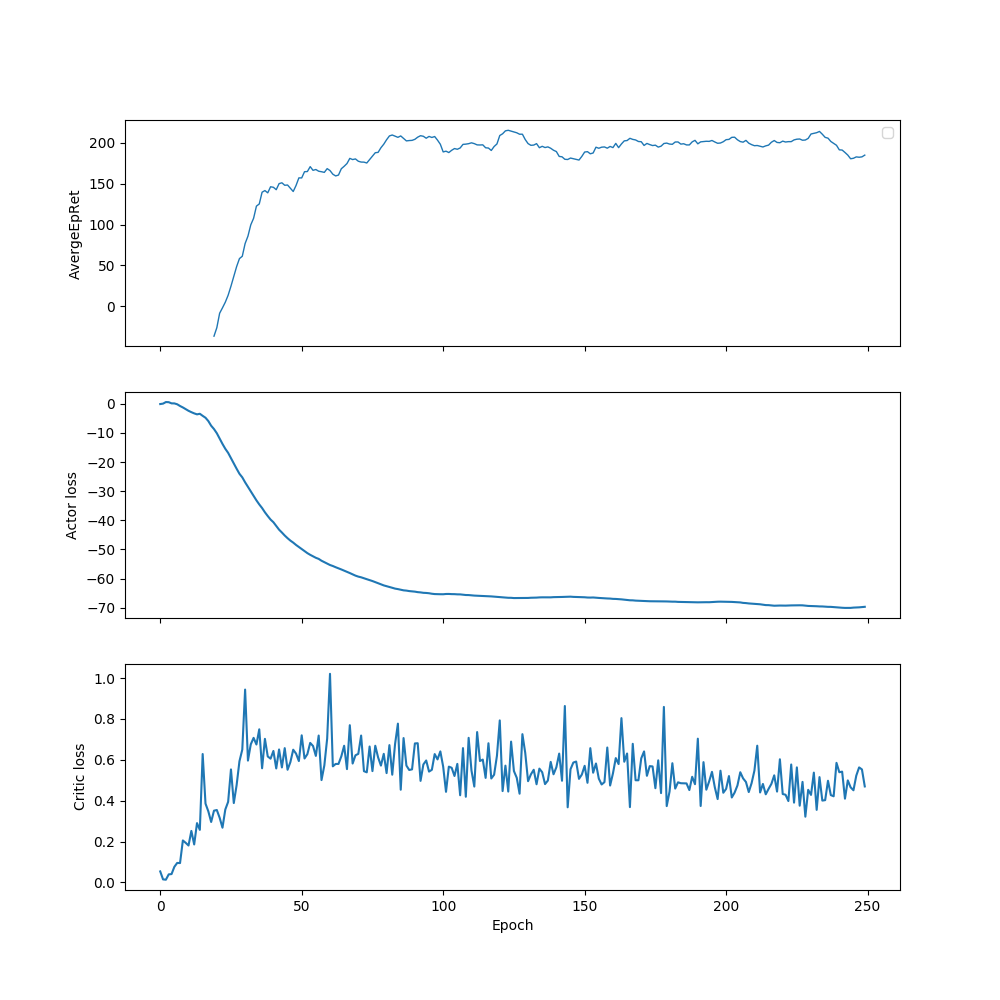

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


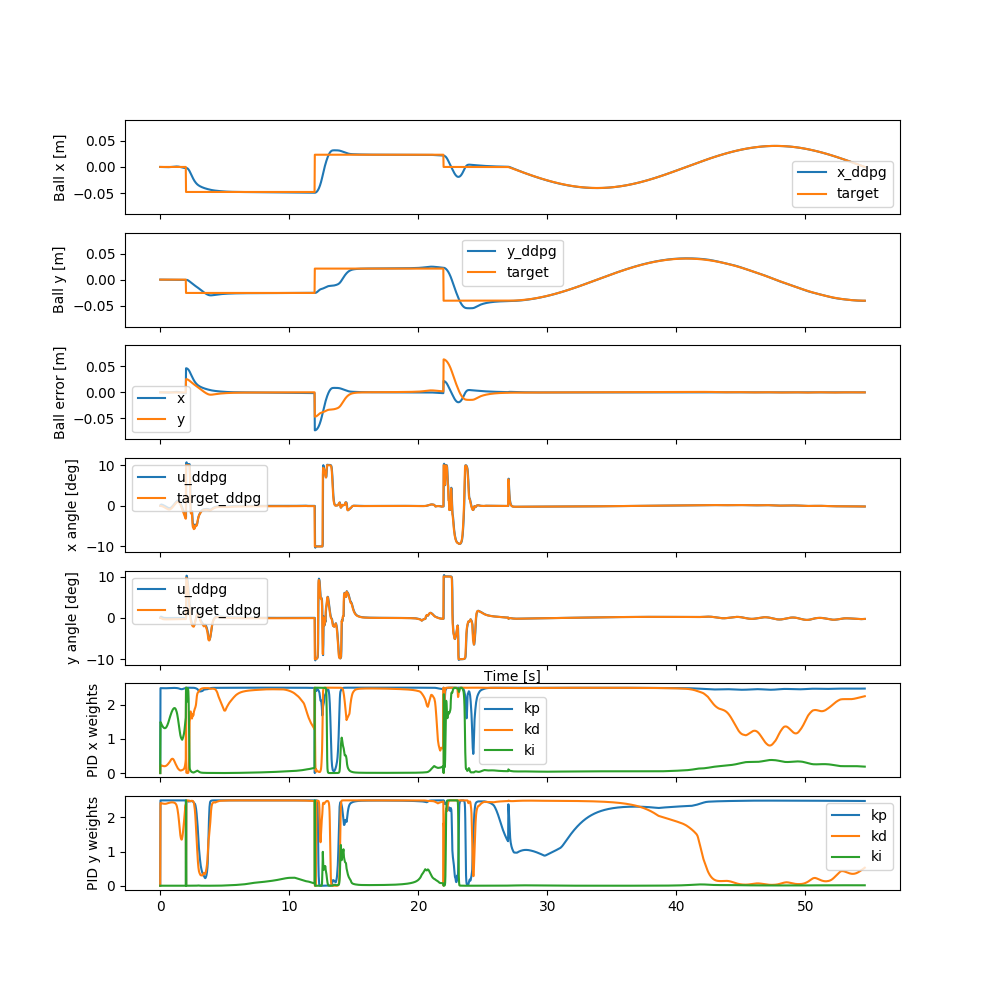

In [23]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [24]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [400]
gamma = 0.99
act = torch.nn.ReLU
name='le0.6_[400]_relu_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[400]_relu_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"ReLU",
        "hidden_sizes":	[
            400
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa3d90e80>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[400]_relu_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[400]_relu_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },
    "logger_kwargs":	{
        "e

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |            -107 |
|          StdEpRet |            19.8 |
|          MaxEpRet |           -80.7 |
|          MinEpRet |            -129 |
|  AverageTestEpRet |           0.593 |
|      StdTestEpRet |             141 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |            -176 |
|             EpLen |             400 |
|         TestEpLen |             338 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.76 |
|          StdQVals |            6.23 |
|          MaxQVals |            16.1 |
|          MinQVals |           -53.8 |
|            LossPi |              -4 |
|             LossQ |           0.126 |
|              Time |              55 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -67.6 |
|          StdEpRet |            56.3 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |             115 |
|          StdEpRet |            30.5 |
|          MaxEpRet |             146 |
|          MinEpRet |            84.6 |
|  AverageTestEpRet |            24.1 |
|      StdTestEpRet |             137 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |            -215 |
|             EpLen |             400 |
|         TestEpLen |             343 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |             9.9 |
|          StdQVals |            9.25 |
|          MaxQVals |            35.9 |
|          MinQVals |           -85.4 |
|            LossPi |           -10.2 |
|             LossQ |           0.386 |
|              Time |             138 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             118 |
|          StdEpRet |             122 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             237 |
|          StdEpRet |            20.5 |
|          MaxEpRet |             254 |
|          MinEpRet |             208 |
|  AverageTestEpRet |             128 |
|      StdTestEpRet |             114 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |            -129 |
|             EpLen |             400 |
|         TestEpLen |             386 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |              23 |
|          StdQVals |            14.3 |
|          MaxQVals |            46.3 |
|          MinQVals |            -121 |
|            LossPi |           -23.3 |
|             LossQ |           0.768 |
|              Time |             219 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             140 |
|          StdEpRet |             158 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             141 |
|          StdEpRet |            77.3 |
|          MaxEpRet |             233 |
|          MinEpRet |            43.6 |
|  AverageTestEpRet |             133 |
|      StdTestEpRet |             101 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |           -76.6 |
|             EpLen |             400 |
|         TestEpLen |             386 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |              37 |
|          StdQVals |            16.2 |
|          MaxQVals |            63.8 |
|          MinQVals |           -74.1 |
|            LossPi |           -37.3 |
|             LossQ |           0.567 |
|              Time |             305 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             172 |
|          StdEpRet |            13.6 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             146 |
|          StdEpRet |            32.6 |
|          MaxEpRet |             179 |
|          MinEpRet |             113 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |             108 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |           -96.8 |
|             EpLen |             400 |
|         TestEpLen |             386 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |              45 |
|          StdQVals |            17.7 |
|          MaxQVals |            68.9 |
|          MinQVals |           -72.9 |
|            LossPi |           -45.2 |
|             LossQ |           0.584 |
|              Time |             390 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             193 |
|          StdEpRet |            38.8 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             186 |
|          StdEpRet |            86.2 |
|          MaxEpRet |             260 |
|          MinEpRet |            65.1 |
|  AverageTestEpRet |             186 |
|      StdTestEpRet |             124 |
|      MaxTestEpRet |             282 |
|      MinTestEpRet |            -218 |
|             EpLen |             400 |
|         TestEpLen |             388 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            51.9 |
|          StdQVals |            18.2 |
|          MaxQVals |            74.3 |
|          MinQVals |             -49 |
|            LossPi |           -52.2 |
|             LossQ |           0.602 |
|              Time |             477 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             131 |
|          StdEpRet |              23 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             204 |
|          StdEpRet |            23.3 |
|          MaxEpRet |             236 |
|          MinEpRet |             181 |
|  AverageTestEpRet |             150 |
|      StdTestEpRet |            94.2 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |           -58.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            56.8 |
|          StdQVals |            17.8 |
|          MaxQVals |             109 |
|          MinQVals |           -96.1 |
|            LossPi |           -57.1 |
|             LossQ |           0.695 |
|              Time |             560 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             163 |
|          StdEpRet |            68.4 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             182 |
|          StdEpRet |            39.3 |
|          MaxEpRet |             221 |
|          MinEpRet |             142 |
|  AverageTestEpRet |             161 |
|      StdTestEpRet |            88.4 |
|      MaxTestEpRet |             266 |
|      MinTestEpRet |           -80.6 |
|             EpLen |             400 |
|         TestEpLen |             387 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            60.1 |
|          StdQVals |            17.3 |
|          MaxQVals |            91.9 |
|          MinQVals |           -61.5 |
|            LossPi |           -60.4 |
|             LossQ |             0.5 |
|              Time |             648 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             197 |
|          StdEpRet |              70 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             191 |
|          StdEpRet |              62 |
|          MaxEpRet |             259 |
|          MinEpRet |             109 |
|  AverageTestEpRet |             199 |
|      StdTestEpRet |            67.4 |
|      MaxTestEpRet |             286 |
|      MinTestEpRet |            45.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |              62 |
|          StdQVals |              17 |
|          MaxQVals |             163 |
|          MinQVals |            -117 |
|            LossPi |           -62.2 |
|             LossQ |           0.729 |
|              Time |             734 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             225 |
|          StdEpRet |            3.78 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             208 |
|          StdEpRet |            25.9 |
|          MaxEpRet |             229 |
|          MinEpRet |             171 |
|  AverageTestEpRet |             196 |
|      StdTestEpRet |             107 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |            -238 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            63.1 |
|          StdQVals |            17.3 |
|          MaxQVals |             109 |
|          MinQVals |            -101 |
|            LossPi |           -63.4 |
|             LossQ |           0.734 |
|              Time |             824 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             209 |
|          StdEpRet |            47.4 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             206 |
|          StdEpRet |            66.7 |
|          MaxEpRet |             279 |
|          MinEpRet |             118 |
|  AverageTestEpRet |             194 |
|      StdTestEpRet |            54.7 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |              87 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            64.2 |
|          StdQVals |            17.1 |
|          MaxQVals |            99.2 |
|          MinQVals |           -79.7 |
|            LossPi |           -64.4 |
|             LossQ |           0.716 |
|              Time |             914 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             209 |
|          StdEpRet |            56.5 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             235 |
|          StdEpRet |            7.77 |
|          MaxEpRet |             244 |
|          MinEpRet |             225 |
|  AverageTestEpRet |             185 |
|      StdTestEpRet |            86.6 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |           -77.7 |
|             EpLen |             400 |
|         TestEpLen |             385 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            65.3 |
|          StdQVals |            16.7 |
|          MaxQVals |             109 |
|          MinQVals |           -86.7 |
|            LossPi |           -65.6 |
|             LossQ |           0.705 |
|              Time |             998 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             225 |
|          StdEpRet |            24.2 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             230 |
|          StdEpRet |            20.5 |
|          MaxEpRet |             250 |
|          MinEpRet |             202 |
|  AverageTestEpRet |             185 |
|      StdTestEpRet |             138 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |            -384 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            66.8 |
|          StdQVals |            15.5 |
|          MaxQVals |              83 |
|          MinQVals |           -31.2 |
|            LossPi |           -67.1 |
|             LossQ |           0.419 |
|              Time |        1.08e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             242 |
|          StdEpRet |            6.37 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             221 |
|          StdEpRet |            21.7 |
|          MaxEpRet |             245 |
|          MinEpRet |             192 |
|  AverageTestEpRet |             185 |
|      StdTestEpRet |             137 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |            -383 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |              67 |
|          StdQVals |              16 |
|          MaxQVals |             117 |
|          MinQVals |           -49.8 |
|            LossPi |           -67.2 |
|             LossQ |           0.444 |
|              Time |        1.17e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             245 |
|          StdEpRet |            8.18 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             195 |
|          StdEpRet |            43.4 |
|          MaxEpRet |             232 |
|          MinEpRet |             134 |
|  AverageTestEpRet |             187 |
|      StdTestEpRet |            95.4 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |           -66.8 |
|             EpLen |             400 |
|         TestEpLen |             386 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            67.8 |
|          StdQVals |            15.8 |
|          MaxQVals |             109 |
|          MinQVals |           -86.3 |
|            LossPi |             -68 |
|             LossQ |           0.565 |
|              Time |        1.26e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             193 |
|          StdEpRet |            34.1 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             224 |
|          StdEpRet |            11.5 |
|          MaxEpRet |             235 |
|          MinEpRet |             208 |
|  AverageTestEpRet |             198 |
|      StdTestEpRet |             101 |
|      MaxTestEpRet |             292 |
|      MinTestEpRet |            -200 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            67.9 |
|          StdQVals |            15.4 |
|          MaxQVals |            83.4 |
|          MinQVals |           -41.1 |
|            LossPi |           -68.1 |
|             LossQ |           0.529 |
|              Time |        1.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             223 |
|          StdEpRet |            18.2 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             210 |
|          StdEpRet |            52.2 |
|          MaxEpRet |             271 |
|          MinEpRet |             144 |
|  AverageTestEpRet |             158 |
|      StdTestEpRet |             107 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |           -78.6 |
|             EpLen |             400 |
|         TestEpLen |             353 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            67.7 |
|          StdQVals |            15.3 |
|          MaxQVals |             111 |
|          MinQVals |             -62 |
|            LossPi |           -67.9 |
|             LossQ |           0.632 |
|              Time |        1.43e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             125 |
|          StdEpRet |            52.7 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             111 |
|          StdEpRet |            12.5 |
|          MaxEpRet |             123 |
|          MinEpRet |            98.5 |
|  AverageTestEpRet |             224 |
|      StdTestEpRet |            30.1 |
|      MaxTestEpRet |             266 |
|      MinTestEpRet |             146 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            67.8 |
|          StdQVals |            15.3 |
|          MaxQVals |            82.4 |
|          MinQVals |           -49.8 |
|            LossPi |             -68 |
|             LossQ |           0.556 |
|              Time |        1.52e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             226 |
|          StdEpRet |            6.29 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             240 |
|          StdEpRet |            20.7 |
|          MaxEpRet |             267 |
|          MinEpRet |             216 |
|  AverageTestEpRet |             191 |
|      StdTestEpRet |            44.9 |
|      MaxTestEpRet |             249 |
|      MinTestEpRet |              92 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            67.7 |
|          StdQVals |            15.3 |
|          MaxQVals |            82.3 |
|          MinQVals |           -43.4 |
|            LossPi |           -67.9 |
|             LossQ |           0.471 |
|              Time |         1.6e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             222 |
|          StdEpRet |            37.1 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |            72.8 |
|          StdEpRet |            22.1 |
|          MaxEpRet |            94.8 |
|          MinEpRet |            50.7 |
|  AverageTestEpRet |             155 |
|      StdTestEpRet |             104 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |            -140 |
|             EpLen |             400 |
|         TestEpLen |             374 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            67.9 |
|          StdQVals |            15.4 |
|          MaxQVals |            82.6 |
|          MinQVals |           -53.7 |
|            LossPi |             -68 |
|             LossQ |           0.384 |
|              Time |        1.69e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             171 |
|          StdEpRet |            56.4 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             252 |
|          StdEpRet |            17.9 |
|          MaxEpRet |             269 |
|          MinEpRet |             227 |
|  AverageTestEpRet |             172 |
|      StdTestEpRet |             139 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |            -328 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            68.1 |
|          StdQVals |            15.3 |
|          MaxQVals |            82.8 |
|          MinQVals |             -33 |
|            LossPi |           -68.2 |
|             LossQ |           0.338 |
|              Time |        1.78e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             167 |
|          StdEpRet |             110 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             169 |
|          StdEpRet |              33 |
|          MaxEpRet |             202 |
|          MinEpRet |             136 |
|  AverageTestEpRet |             212 |
|      StdTestEpRet |            54.8 |
|      MaxTestEpRet |             282 |
|      MinTestEpRet |            37.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |              68 |
|          StdQVals |            15.3 |
|          MaxQVals |             114 |
|          MinQVals |           -88.5 |
|            LossPi |           -68.1 |
|             LossQ |           0.505 |
|              Time |        1.87e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             227 |
|          StdEpRet |            25.6 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             220 |
|          StdEpRet |              18 |
|          MaxEpRet |             243 |
|          MinEpRet |             199 |
|  AverageTestEpRet |             222 |
|      StdTestEpRet |            61.5 |
|      MaxTestEpRet |             273 |
|      MinTestEpRet |            7.28 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |              68 |
|          StdQVals |            15.2 |
|          MaxQVals |            82.2 |
|          MinQVals |             -41 |
|            LossPi |           -68.2 |
|             LossQ |           0.368 |
|              Time |        1.95e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             212 |
|          StdEpRet |            64.7 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             198 |
|          StdEpRet |              22 |
|          MaxEpRet |             220 |
|          MinEpRet |             176 |
|  AverageTestEpRet |             216 |
|      StdTestEpRet |            39.6 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |             124 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            68.1 |
|          StdQVals |            15.3 |
|          MaxQVals |            91.8 |
|          MinQVals |           -82.1 |
|            LossPi |           -68.2 |
|             LossQ |           0.496 |
|              Time |        2.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             218 |
|          StdEpRet |              20 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             182 |
|          StdEpRet |            31.9 |
|          MaxEpRet |             222 |
|          MinEpRet |             143 |
|  AverageTestEpRet |             192 |
|      StdTestEpRet |            81.5 |
|      MaxTestEpRet |             277 |
|      MinTestEpRet |           -94.6 |
|             EpLen |             400 |
|         TestEpLen |             386 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            68.1 |
|          StdQVals |            15.1 |
|          MaxQVals |             199 |
|          MinQVals |           -83.6 |
|            LossPi |           -68.3 |
|             LossQ |           0.598 |
|              Time |        2.12e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             212 |
|          StdEpRet |            75.3 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.00016305476543121365


<IPython.core.display.Javascript object>


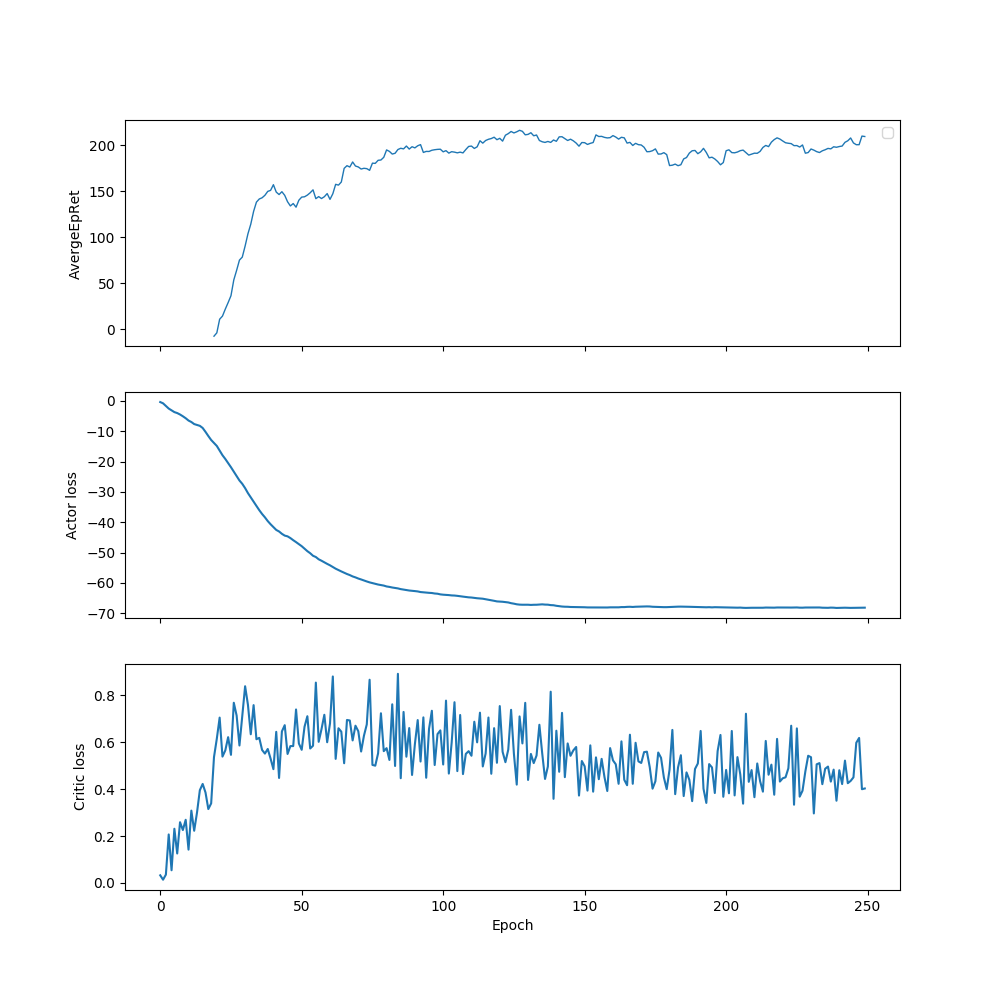

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


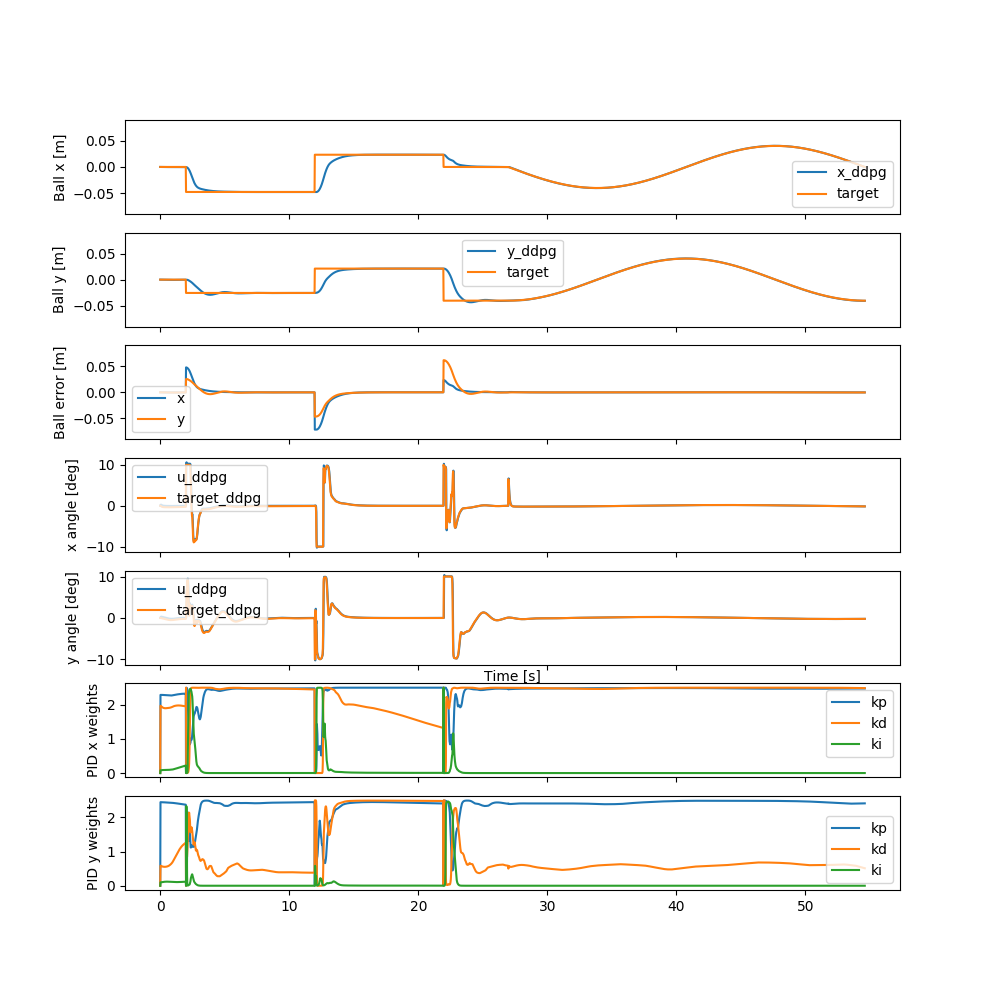

In [25]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [26]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [100]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[100]_sigmoid_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[100]_sigmoid_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            100
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa3b27b70>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[100]_sigmoid_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[100]_sigmoid_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },
    "logger_kwargs":	

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -55.1 |
|          StdEpRet |            44.4 |
|          MaxEpRet |            3.28 |
|          MinEpRet |            -104 |
|  AverageTestEpRet |            -131 |
|      StdTestEpRet |            86.2 |
|      MaxTestEpRet |            83.7 |
|      MinTestEpRet |            -248 |
|             EpLen |             400 |
|         TestEpLen |             346 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            1.97 |
|          StdQVals |            2.77 |
|          MaxQVals |            9.68 |
|          MinQVals |             -10 |
|            LossPi |           -2.33 |
|             LossQ |          0.0404 |
|              Time |            45.8 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -26.2 |
|          StdEpRet |            55.5 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            98.9 |
|          StdEpRet |              60 |
|          MaxEpRet |             171 |
|          MinEpRet |              24 |
|  AverageTestEpRet |              90 |
|      StdTestEpRet |             136 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |            -199 |
|             EpLen |             400 |
|         TestEpLen |             392 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            20.1 |
|          StdQVals |            8.04 |
|          MaxQVals |            40.8 |
|          MinQVals |           -8.08 |
|            LossPi |           -20.4 |
|             LossQ |           0.134 |
|              Time |             119 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |           -17.6 |
|          StdEpRet |             160 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             178 |
|          StdEpRet |            5.84 |
|          MaxEpRet |             184 |
|          MinEpRet |             172 |
|  AverageTestEpRet |             182 |
|      StdTestEpRet |            36.7 |
|      MaxTestEpRet |             266 |
|      MinTestEpRet |             101 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            34.2 |
|          StdQVals |            13.6 |
|          MaxQVals |            62.2 |
|          MinQVals |           -15.6 |
|            LossPi |           -34.6 |
|             LossQ |           0.187 |
|              Time |             190 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             214 |
|          StdEpRet |            35.4 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             198 |
|          StdEpRet |            10.3 |
|          MaxEpRet |             212 |
|          MinEpRet |             188 |
|  AverageTestEpRet |             169 |
|      StdTestEpRet |            71.4 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |           -74.1 |
|             EpLen |             400 |
|         TestEpLen |             386 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            47.5 |
|          StdQVals |            14.2 |
|          MaxQVals |              70 |
|          MinQVals |           -14.5 |
|            LossPi |           -47.9 |
|             LossQ |           0.152 |
|              Time |             264 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             169 |
|          StdEpRet |              19 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             197 |
|          StdEpRet |            48.8 |
|          MaxEpRet |             246 |
|          MinEpRet |             149 |
|  AverageTestEpRet |             133 |
|      StdTestEpRet |            79.5 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |           -86.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |              55 |
|          StdQVals |            14.1 |
|          MaxQVals |            72.1 |
|          MinQVals |           -9.51 |
|            LossPi |           -55.4 |
|             LossQ |           0.146 |
|              Time |             338 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             205 |
|          StdEpRet |            10.6 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             155 |
|          StdEpRet |            36.5 |
|          MaxEpRet |             203 |
|          MinEpRet |             114 |
|  AverageTestEpRet |             161 |
|      StdTestEpRet |            45.1 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |            62.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            59.9 |
|          StdQVals |              13 |
|          MaxQVals |            75.4 |
|          MinQVals |           -3.94 |
|            LossPi |           -60.2 |
|             LossQ |            0.13 |
|              Time |             412 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             197 |
|          StdEpRet |            14.4 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             207 |
|          StdEpRet |            24.9 |
|          MaxEpRet |             232 |
|          MinEpRet |             182 |
|  AverageTestEpRet |             212 |
|      StdTestEpRet |            42.5 |
|      MaxTestEpRet |             269 |
|      MinTestEpRet |              91 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            62.3 |
|          StdQVals |              13 |
|          MaxQVals |            76.8 |
|          MinQVals |           -9.59 |
|            LossPi |           -62.5 |
|             LossQ |           0.113 |
|              Time |             486 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             206 |
|          StdEpRet |            14.5 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             216 |
|          StdEpRet |            33.2 |
|          MaxEpRet |             262 |
|          MinEpRet |             185 |
|  AverageTestEpRet |             224 |
|      StdTestEpRet |            27.9 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |             171 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |              63 |
|          StdQVals |            12.7 |
|          MaxQVals |            75.2 |
|          MinQVals |           -13.8 |
|            LossPi |           -63.2 |
|             LossQ |           0.116 |
|              Time |             558 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             229 |
|          StdEpRet |            19.8 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             207 |
|          StdEpRet |            31.3 |
|          MaxEpRet |             239 |
|          MinEpRet |             176 |
|  AverageTestEpRet |             211 |
|      StdTestEpRet |            45.8 |
|      MaxTestEpRet |             285 |
|      MinTestEpRet |            93.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |              64 |
|          StdQVals |            12.7 |
|          MaxQVals |            74.8 |
|          MinQVals |           -8.68 |
|            LossPi |           -64.2 |
|             LossQ |           0.117 |
|              Time |             631 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             173 |
|          StdEpRet |              19 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             231 |
|          StdEpRet |            32.8 |
|          MaxEpRet |             275 |
|          MinEpRet |             196 |
|  AverageTestEpRet |             202 |
|      StdTestEpRet |            49.8 |
|      MaxTestEpRet |             252 |
|      MinTestEpRet |            59.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            64.6 |
|          StdQVals |            12.5 |
|          MaxQVals |            74.6 |
|          MinQVals |           -2.63 |
|            LossPi |           -64.8 |
|             LossQ |           0.112 |
|              Time |             704 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             213 |
|          StdEpRet |            26.1 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             224 |
|          StdEpRet |              10 |
|          MaxEpRet |             234 |
|          MinEpRet |             214 |
|  AverageTestEpRet |             204 |
|      StdTestEpRet |            34.5 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |             148 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            65.6 |
|          StdQVals |            12.5 |
|          MaxQVals |            75.7 |
|          MinQVals |           -6.01 |
|            LossPi |           -65.8 |
|             LossQ |           0.121 |
|              Time |             776 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             221 |
|          StdEpRet |            23.1 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             202 |
|          StdEpRet |            35.2 |
|          MaxEpRet |             247 |
|          MinEpRet |             161 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            31.1 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |             157 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            65.9 |
|          StdQVals |            12.7 |
|          MaxQVals |            76.4 |
|          MinQVals |           -2.02 |
|            LossPi |           -66.1 |
|             LossQ |           0.117 |
|              Time |             853 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             234 |
|          StdEpRet |            37.7 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             216 |
|          StdEpRet |            10.6 |
|          MaxEpRet |             227 |
|          MinEpRet |             206 |
|  AverageTestEpRet |             202 |
|      StdTestEpRet |            30.7 |
|      MaxTestEpRet |             265 |
|      MinTestEpRet |             139 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            66.7 |
|          StdQVals |              12 |
|          MaxQVals |            76.9 |
|          MinQVals |           -5.17 |
|            LossPi |           -66.9 |
|             LossQ |           0.136 |
|              Time |             927 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             213 |
|          StdEpRet |            24.8 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             210 |
|          StdEpRet |            13.6 |
|          MaxEpRet |             222 |
|          MinEpRet |             191 |
|  AverageTestEpRet |             205 |
|      StdTestEpRet |            27.3 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |             160 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            67.4 |
|          StdQVals |              12 |
|          MaxQVals |            80.6 |
|          MinQVals |           -2.84 |
|            LossPi |           -67.6 |
|             LossQ |           0.113 |
|              Time |             999 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             174 |
|          StdEpRet |            60.7 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             216 |
|          StdEpRet |            51.5 |
|          MaxEpRet |             268 |
|          MinEpRet |             165 |
|  AverageTestEpRet |             222 |
|      StdTestEpRet |              30 |
|      MaxTestEpRet |             271 |
|      MinTestEpRet |             159 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |              67 |
|          StdQVals |            12.1 |
|          MaxQVals |            78.9 |
|          MinQVals |           -1.57 |
|            LossPi |           -67.2 |
|             LossQ |           0.112 |
|              Time |        1.07e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             181 |
|          StdEpRet |            59.1 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             218 |
|          StdEpRet |            26.4 |
|          MaxEpRet |             239 |
|          MinEpRet |             181 |
|  AverageTestEpRet |             213 |
|      StdTestEpRet |            28.4 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |             163 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            67.3 |
|          StdQVals |            12.1 |
|          MaxQVals |            77.1 |
|          MinQVals |           -10.4 |
|            LossPi |           -67.5 |
|             LossQ |           0.127 |
|              Time |        1.14e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             219 |
|          StdEpRet |            36.9 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             186 |
|          StdEpRet |            17.9 |
|          MaxEpRet |             204 |
|          MinEpRet |             168 |
|  AverageTestEpRet |             219 |
|      StdTestEpRet |            38.7 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |             110 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            67.4 |
|          StdQVals |            11.8 |
|          MaxQVals |            76.1 |
|          MinQVals |            -8.1 |
|            LossPi |           -67.5 |
|             LossQ |           0.129 |
|              Time |        1.22e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             196 |
|          StdEpRet |            16.6 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             243 |
|          StdEpRet |            15.6 |
|          MaxEpRet |             265 |
|          MinEpRet |             230 |
|  AverageTestEpRet |             218 |
|      StdTestEpRet |            34.5 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |             149 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            67.6 |
|          StdQVals |            11.6 |
|          MaxQVals |            75.9 |
|          MinQVals |           -10.3 |
|            LossPi |           -67.8 |
|             LossQ |           0.159 |
|              Time |         1.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             223 |
|          StdEpRet |            6.82 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             197 |
|          StdEpRet |            61.9 |
|          MaxEpRet |             259 |
|          MinEpRet |             135 |
|  AverageTestEpRet |             213 |
|      StdTestEpRet |              36 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |             153 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            67.7 |
|          StdQVals |            11.7 |
|          MaxQVals |            77.8 |
|          MinQVals |           -7.55 |
|            LossPi |           -67.9 |
|             LossQ |            0.14 |
|              Time |        1.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             208 |
|          StdEpRet |            43.9 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             203 |
|          StdEpRet |              29 |
|          MaxEpRet |             243 |
|          MinEpRet |             178 |
|  AverageTestEpRet |             217 |
|      StdTestEpRet |            33.9 |
|      MaxTestEpRet |             279 |
|      MinTestEpRet |             157 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            67.7 |
|          StdQVals |            11.9 |
|          MaxQVals |              78 |
|          MinQVals |           -6.85 |
|            LossPi |           -67.9 |
|             LossQ |           0.133 |
|              Time |        1.45e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             213 |
|          StdEpRet |            32.7 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             228 |
|          StdEpRet |            29.8 |
|          MaxEpRet |             258 |
|          MinEpRet |             198 |
|  AverageTestEpRet |             215 |
|      StdTestEpRet |            33.5 |
|      MaxTestEpRet |             265 |
|      MinTestEpRet |             145 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            67.6 |
|          StdQVals |            12.2 |
|          MaxQVals |            76.6 |
|          MinQVals |           -11.6 |
|            LossPi |           -67.7 |
|             LossQ |           0.141 |
|              Time |        1.53e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             221 |
|          StdEpRet |            56.2 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             234 |
|          StdEpRet |            15.3 |
|          MaxEpRet |             255 |
|          MinEpRet |             220 |
|  AverageTestEpRet |             214 |
|      StdTestEpRet |            28.4 |
|      MaxTestEpRet |             273 |
|      MinTestEpRet |             152 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            67.7 |
|          StdQVals |            11.9 |
|          MaxQVals |            76.3 |
|          MinQVals |           -9.57 |
|            LossPi |           -67.8 |
|             LossQ |           0.141 |
|              Time |         1.6e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             196 |
|          StdEpRet |            35.9 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             222 |
|          StdEpRet |            10.7 |
|          MaxEpRet |             233 |
|          MinEpRet |             212 |
|  AverageTestEpRet |             197 |
|      StdTestEpRet |            48.5 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |            78.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            67.9 |
|          StdQVals |              12 |
|          MaxQVals |            77.1 |
|          MinQVals |           -6.99 |
|            LossPi |             -68 |
|             LossQ |           0.155 |
|              Time |        1.68e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             181 |
|          StdEpRet |            11.8 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             202 |
|          StdEpRet |            27.2 |
|          MaxEpRet |             238 |
|          MinEpRet |             173 |
|  AverageTestEpRet |             224 |
|      StdTestEpRet |            36.6 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |             136 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            68.3 |
|          StdQVals |            11.4 |
|          MaxQVals |            76.4 |
|          MinQVals |           -4.78 |
|            LossPi |           -68.5 |
|             LossQ |            0.14 |
|              Time |        1.75e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             229 |
|          StdEpRet |            32.5 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             215 |
|          StdEpRet |            48.3 |
|          MaxEpRet |             263 |
|          MinEpRet |             167 |
|  AverageTestEpRet |             204 |
|      StdTestEpRet |            44.6 |
|      MaxTestEpRet |             271 |
|      MinTestEpRet |             122 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            68.1 |
|          StdQVals |            11.7 |
|          MaxQVals |            76.2 |
|          MinQVals |           -3.05 |
|            LossPi |           -68.2 |
|             LossQ |            0.14 |
|              Time |        1.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             210 |
|          StdEpRet |            32.8 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.00016318006559556418


<IPython.core.display.Javascript object>


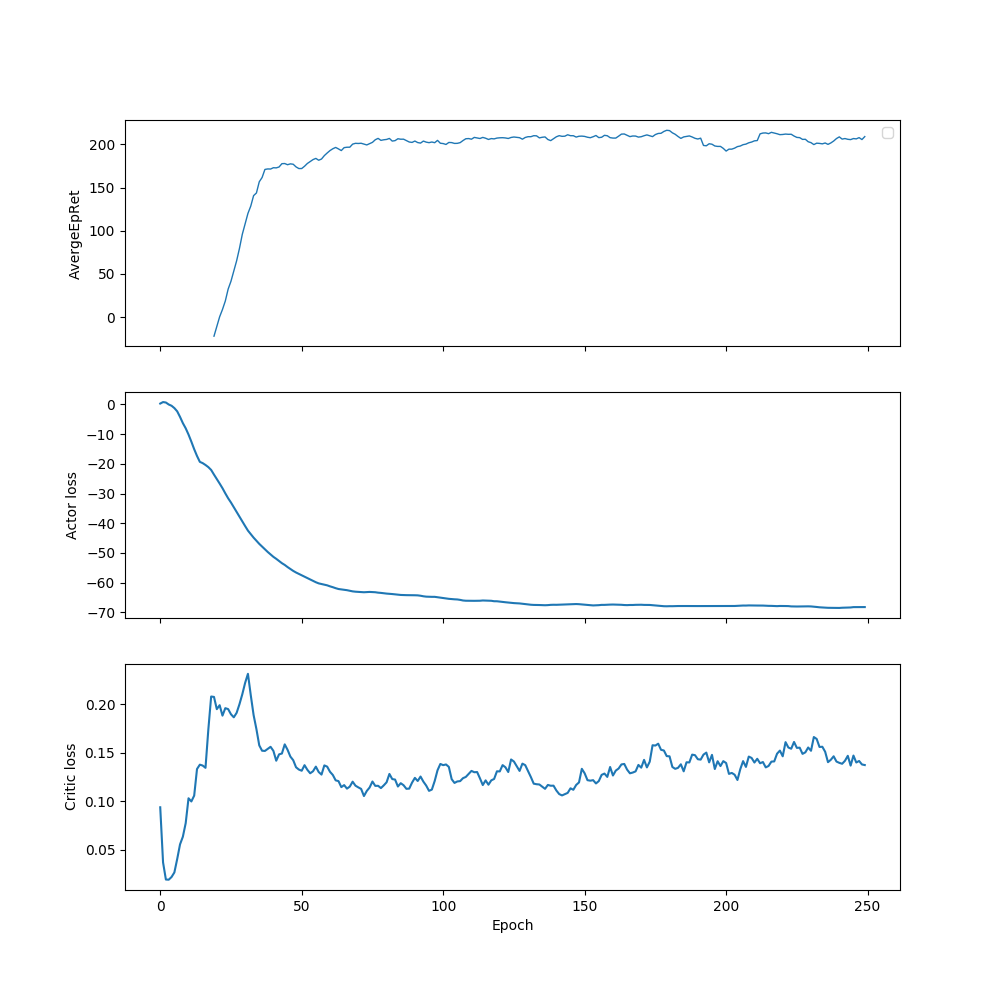

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


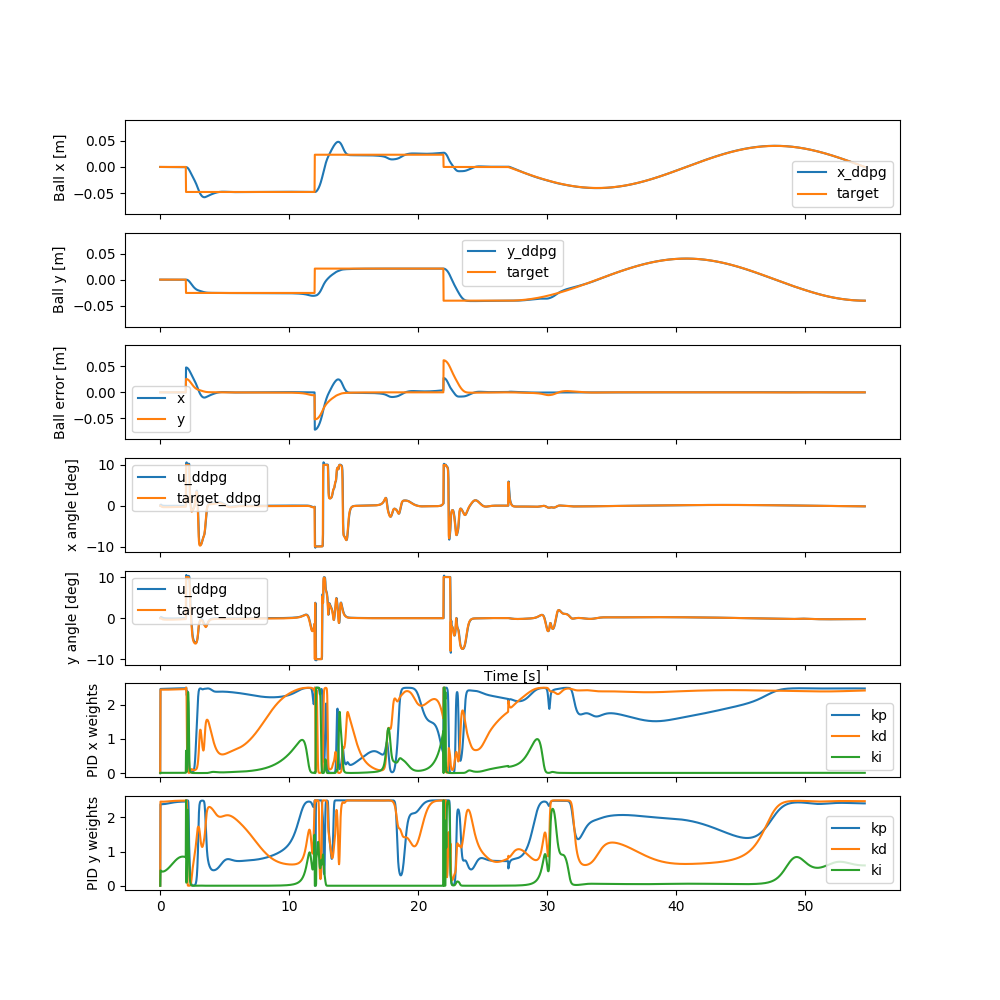

In [27]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [28]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [200]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[200]_sigmoid_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[200]_sigmoid_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            200
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa3870be0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[200]_sigmoid_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[200]_sigmoid_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },
    "logger_kwargs":	

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -79.9 |
|          StdEpRet |            58.4 |
|          MaxEpRet |           -15.4 |
|          MinEpRet |            -157 |
|  AverageTestEpRet |            30.7 |
|      StdTestEpRet |            67.5 |
|      MaxTestEpRet |             170 |
|      MinTestEpRet |           -57.4 |
|             EpLen |             400 |
|         TestEpLen |             353 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            1.69 |
|          StdQVals |            3.32 |
|          MaxQVals |            8.23 |
|          MinQVals |           -12.8 |
|            LossPi |              -2 |
|             LossQ |          0.0152 |
|              Time |            54.5 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -84.3 |
|          StdEpRet |            31.3 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |              60 |
|          StdEpRet |            24.1 |
|          MaxEpRet |            84.1 |
|          MinEpRet |            35.9 |
|  AverageTestEpRet |            69.8 |
|      StdTestEpRet |            33.2 |
|      MaxTestEpRet |             164 |
|      MinTestEpRet |              23 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            10.7 |
|          StdQVals |            5.92 |
|          MaxQVals |            22.7 |
|          MinQVals |           -22.2 |
|            LossPi |           -10.9 |
|             LossQ |          0.0506 |
|              Time |             143 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |              66 |
|          StdEpRet |              17 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            66.9 |
|          StdEpRet |              16 |
|          MaxEpRet |            88.2 |
|          MinEpRet |            49.8 |
|  AverageTestEpRet |            77.4 |
|      StdTestEpRet |            23.1 |
|      MaxTestEpRet |             130 |
|      MinTestEpRet |            45.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            16.4 |
|          StdQVals |            7.89 |
|          MaxQVals |            33.6 |
|          MinQVals |           -24.1 |
|            LossPi |           -16.6 |
|             LossQ |          0.0587 |
|              Time |             229 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |            90.4 |
|          StdEpRet |              32 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |            58.3 |
|          StdEpRet |            4.22 |
|          MaxEpRet |            62.5 |
|          MinEpRet |            54.1 |
|  AverageTestEpRet |            77.5 |
|      StdTestEpRet |            22.9 |
|      MaxTestEpRet |             133 |
|      MinTestEpRet |            33.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            21.7 |
|          StdQVals |             8.2 |
|          MaxQVals |            39.1 |
|          MinQVals |           -24.6 |
|            LossPi |           -21.8 |
|             LossQ |          0.0606 |
|              Time |             319 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |            54.6 |
|          StdEpRet |              44 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |            63.1 |
|          StdEpRet |            8.91 |
|          MaxEpRet |            69.7 |
|          MinEpRet |            50.5 |
|  AverageTestEpRet |            90.9 |
|      StdTestEpRet |            43.3 |
|      MaxTestEpRet |             200 |
|      MinTestEpRet |            36.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            24.7 |
|          StdQVals |            7.98 |
|          MaxQVals |            43.4 |
|          MinQVals |           -19.7 |
|            LossPi |           -24.9 |
|             LossQ |          0.0659 |
|              Time |             405 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             118 |
|          StdEpRet |            36.6 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |            96.2 |
|          StdEpRet |            5.22 |
|          MaxEpRet |             101 |
|          MinEpRet |              91 |
|  AverageTestEpRet |             112 |
|      StdTestEpRet |            44.5 |
|      MaxTestEpRet |             208 |
|      MinTestEpRet |            31.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            26.8 |
|          StdQVals |             8.2 |
|          MaxQVals |              46 |
|          MinQVals |           -23.4 |
|            LossPi |             -27 |
|             LossQ |           0.063 |
|              Time |             498 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |            68.2 |
|          StdEpRet |            17.4 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             100 |
|          StdEpRet |            3.42 |
|          MaxEpRet |             104 |
|          MinEpRet |            96.1 |
|  AverageTestEpRet |            91.7 |
|      StdTestEpRet |            29.4 |
|      MaxTestEpRet |             162 |
|      MinTestEpRet |            39.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            28.1 |
|          StdQVals |            8.13 |
|          MaxQVals |            47.3 |
|          MinQVals |           -24.3 |
|            LossPi |           -28.2 |
|             LossQ |          0.0608 |
|              Time |             583 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |            67.8 |
|          StdEpRet |            17.2 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |            74.6 |
|          StdEpRet |            24.2 |
|          MaxEpRet |            98.8 |
|          MinEpRet |            50.4 |
|  AverageTestEpRet |            85.1 |
|      StdTestEpRet |              25 |
|      MaxTestEpRet |             150 |
|      MinTestEpRet |            54.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            29.1 |
|          StdQVals |            7.83 |
|          MaxQVals |            47.8 |
|          MinQVals |           -23.6 |
|            LossPi |           -29.2 |
|             LossQ |          0.0628 |
|              Time |             673 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             106 |
|          StdEpRet |            29.1 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |            60.6 |
|          StdEpRet |              16 |
|          MaxEpRet |            77.1 |
|          MinEpRet |            38.9 |
|  AverageTestEpRet |            89.5 |
|      StdTestEpRet |            26.4 |
|      MaxTestEpRet |             159 |
|      MinTestEpRet |            49.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            29.8 |
|          StdQVals |            7.64 |
|          MaxQVals |            48.5 |
|          MinQVals |           -22.8 |
|            LossPi |           -29.9 |
|             LossQ |          0.0537 |
|              Time |             763 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |            96.8 |
|          StdEpRet |            35.2 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |            90.7 |
|          StdEpRet |            16.7 |
|          MaxEpRet |             107 |
|          MinEpRet |            73.9 |
|  AverageTestEpRet |            93.8 |
|      StdTestEpRet |            26.9 |
|      MaxTestEpRet |             152 |
|      MinTestEpRet |            55.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            30.3 |
|          StdQVals |            7.71 |
|          MaxQVals |            49.2 |
|          MinQVals |           -20.4 |
|            LossPi |           -30.3 |
|             LossQ |          0.0603 |
|              Time |             851 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |            93.3 |
|          StdEpRet |            4.53 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |            89.4 |
|          StdEpRet |              10 |
|          MaxEpRet |             103 |
|          MinEpRet |            80.1 |
|  AverageTestEpRet |            88.1 |
|      StdTestEpRet |            26.9 |
|      MaxTestEpRet |             170 |
|      MinTestEpRet |            44.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            30.2 |
|          StdQVals |            7.74 |
|          MaxQVals |            49.5 |
|          MinQVals |           -23.7 |
|            LossPi |           -30.3 |
|             LossQ |          0.0676 |
|              Time |             943 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |            75.2 |
|          StdEpRet |            14.5 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |            81.3 |
|          StdEpRet |            19.1 |
|          MaxEpRet |             100 |
|          MinEpRet |            62.2 |
|  AverageTestEpRet |            84.2 |
|      StdTestEpRet |              25 |
|      MaxTestEpRet |             151 |
|      MinTestEpRet |            39.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            30.3 |
|          StdQVals |            7.58 |
|          MaxQVals |            49.9 |
|          MinQVals |           -21.4 |
|            LossPi |           -30.4 |
|             LossQ |          0.0723 |
|              Time |        1.03e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |            92.2 |
|          StdEpRet |             9.8 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |              94 |
|          StdEpRet |            7.91 |
|          MaxEpRet |             105 |
|          MinEpRet |              87 |
|  AverageTestEpRet |              91 |
|      StdTestEpRet |            36.9 |
|      MaxTestEpRet |             188 |
|      MinTestEpRet |            49.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            30.6 |
|          StdQVals |            7.31 |
|          MaxQVals |            48.5 |
|          MinQVals |             -27 |
|            LossPi |           -30.7 |
|             LossQ |           0.067 |
|              Time |        1.11e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |            81.6 |
|          StdEpRet |            17.5 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |            84.5 |
|          StdEpRet |            19.6 |
|          MaxEpRet |             104 |
|          MinEpRet |            64.8 |
|  AverageTestEpRet |            95.8 |
|      StdTestEpRet |            31.1 |
|      MaxTestEpRet |             166 |
|      MinTestEpRet |            29.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |              31 |
|          StdQVals |            7.38 |
|          MaxQVals |            47.2 |
|          MinQVals |           -25.6 |
|            LossPi |           -31.1 |
|             LossQ |          0.0792 |
|              Time |         1.2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |              81 |
|          StdEpRet |            15.1 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |            79.8 |
|          StdEpRet |             8.6 |
|          MaxEpRet |            87.8 |
|          MinEpRet |            67.9 |
|  AverageTestEpRet |            74.3 |
|      StdTestEpRet |            23.7 |
|      MaxTestEpRet |             117 |
|      MinTestEpRet |            33.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            31.3 |
|          StdQVals |            6.93 |
|          MaxQVals |            46.4 |
|          MinQVals |           -28.8 |
|            LossPi |           -31.4 |
|             LossQ |          0.0763 |
|              Time |        1.29e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |            62.8 |
|          StdEpRet |            25.9 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |            86.2 |
|          StdEpRet |            8.85 |
|          MaxEpRet |            95.1 |
|          MinEpRet |            77.4 |
|  AverageTestEpRet |            75.5 |
|      StdTestEpRet |            36.7 |
|      MaxTestEpRet |             136 |
|      MinTestEpRet |          -0.721 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            31.4 |
|          StdQVals |            7.04 |
|          MaxQVals |            46.1 |
|          MinQVals |           -25.3 |
|            LossPi |           -31.5 |
|             LossQ |          0.0893 |
|              Time |        1.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |            58.5 |
|          StdEpRet |            10.7 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |            82.3 |
|          StdEpRet |            22.6 |
|          MaxEpRet |             112 |
|          MinEpRet |            57.7 |
|  AverageTestEpRet |            85.9 |
|      StdTestEpRet |            27.3 |
|      MaxTestEpRet |             137 |
|      MinTestEpRet |            24.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |              31 |
|          StdQVals |            6.96 |
|          MaxQVals |            46.1 |
|          MinQVals |           -24.5 |
|            LossPi |             -31 |
|             LossQ |          0.0645 |
|              Time |        1.47e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |            78.9 |
|          StdEpRet |            14.5 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |            96.6 |
|          StdEpRet |            10.3 |
|          MaxEpRet |             107 |
|          MinEpRet |            86.3 |
|  AverageTestEpRet |              98 |
|      StdTestEpRet |            42.6 |
|      MaxTestEpRet |             193 |
|      MinTestEpRet |            45.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            30.9 |
|          StdQVals |            6.77 |
|          MaxQVals |            45.7 |
|          MinQVals |           -30.6 |
|            LossPi |             -31 |
|             LossQ |            0.08 |
|              Time |        1.56e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |            56.2 |
|          StdEpRet |            21.8 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |            81.4 |
|          StdEpRet |            31.8 |
|          MaxEpRet |             110 |
|          MinEpRet |            37.1 |
|  AverageTestEpRet |            78.2 |
|      StdTestEpRet |            24.7 |
|      MaxTestEpRet |             127 |
|      MinTestEpRet |            37.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            30.9 |
|          StdQVals |            6.87 |
|          MaxQVals |            45.8 |
|          MinQVals |           -22.5 |
|            LossPi |             -31 |
|             LossQ |          0.0855 |
|              Time |        1.65e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |            58.6 |
|          StdEpRet |            7.63 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |            69.8 |
|          StdEpRet |            24.8 |
|          MaxEpRet |            94.5 |
|          MinEpRet |              45 |
|  AverageTestEpRet |            86.4 |
|      StdTestEpRet |            30.9 |
|      MaxTestEpRet |             168 |
|      MinTestEpRet |            47.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            30.8 |
|          StdQVals |             7.1 |
|          MaxQVals |            46.3 |
|          MinQVals |           -22.6 |
|            LossPi |           -30.9 |
|             LossQ |          0.0733 |
|              Time |        1.74e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |            66.9 |
|          StdEpRet |            34.1 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |            93.4 |
|          StdEpRet |            12.4 |
|          MaxEpRet |             105 |
|          MinEpRet |            76.3 |
|  AverageTestEpRet |            86.3 |
|      StdTestEpRet |            22.3 |
|      MaxTestEpRet |             144 |
|      MinTestEpRet |            55.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            30.5 |
|          StdQVals |            7.08 |
|          MaxQVals |            44.9 |
|          MinQVals |           -26.6 |
|            LossPi |           -30.6 |
|             LossQ |          0.0724 |
|              Time |        1.83e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |            74.2 |
|          StdEpRet |            15.4 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |            75.1 |
|          StdEpRet |            13.6 |
|          MaxEpRet |            88.7 |
|          MinEpRet |            61.5 |
|  AverageTestEpRet |              92 |
|      StdTestEpRet |            29.2 |
|      MaxTestEpRet |             160 |
|      MinTestEpRet |            31.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            30.4 |
|          StdQVals |            7.03 |
|          MaxQVals |            44.6 |
|          MinQVals |           -25.1 |
|            LossPi |           -30.5 |
|             LossQ |          0.0779 |
|              Time |        1.91e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |            81.3 |
|          StdEpRet |            8.59 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |              48 |
|          StdEpRet |            27.4 |
|          MaxEpRet |              75 |
|          MinEpRet |            10.5 |
|  AverageTestEpRet |            82.3 |
|      StdTestEpRet |            20.9 |
|      MaxTestEpRet |             116 |
|      MinTestEpRet |            42.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            30.2 |
|          StdQVals |            6.97 |
|          MaxQVals |            44.4 |
|          MinQVals |           -22.5 |
|            LossPi |           -30.2 |
|             LossQ |          0.0783 |
|              Time |           2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |            2.22 |
|          StdEpRet |              87 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |            62.4 |
|          StdEpRet |            4.72 |
|          MaxEpRet |            67.1 |
|          MinEpRet |            57.7 |
|  AverageTestEpRet |            81.8 |
|      StdTestEpRet |            34.7 |
|      MaxTestEpRet |             145 |
|      MinTestEpRet |           -11.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |              32 |
|          StdQVals |            7.46 |
|          MaxQVals |            53.3 |
|          MinQVals |           -26.1 |
|            LossPi |           -32.1 |
|             LossQ |          0.0984 |
|              Time |        2.09e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |            65.5 |
|          StdEpRet |            28.6 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |            75.1 |
|          StdEpRet |            27.7 |
|          MaxEpRet |             105 |
|          MinEpRet |            38.4 |
|  AverageTestEpRet |            79.6 |
|      StdTestEpRet |            20.8 |
|      MaxTestEpRet |             113 |
|      MinTestEpRet |            27.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            32.7 |
|          StdQVals |            7.29 |
|          MaxQVals |            53.2 |
|          MinQVals |           -21.7 |
|            LossPi |           -32.8 |
|             LossQ |           0.093 |
|              Time |        2.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |            50.3 |
|          StdEpRet |            23.2 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0005890131220984355


<IPython.core.display.Javascript object>


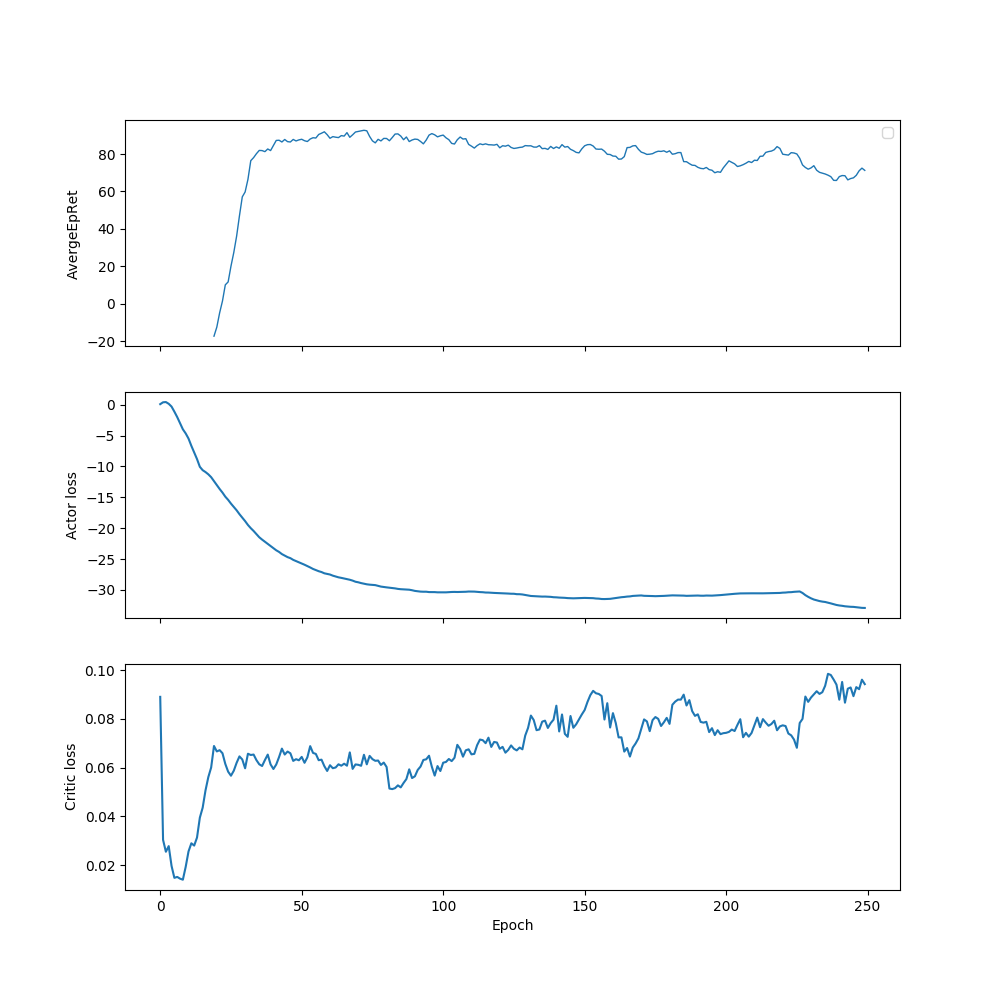

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


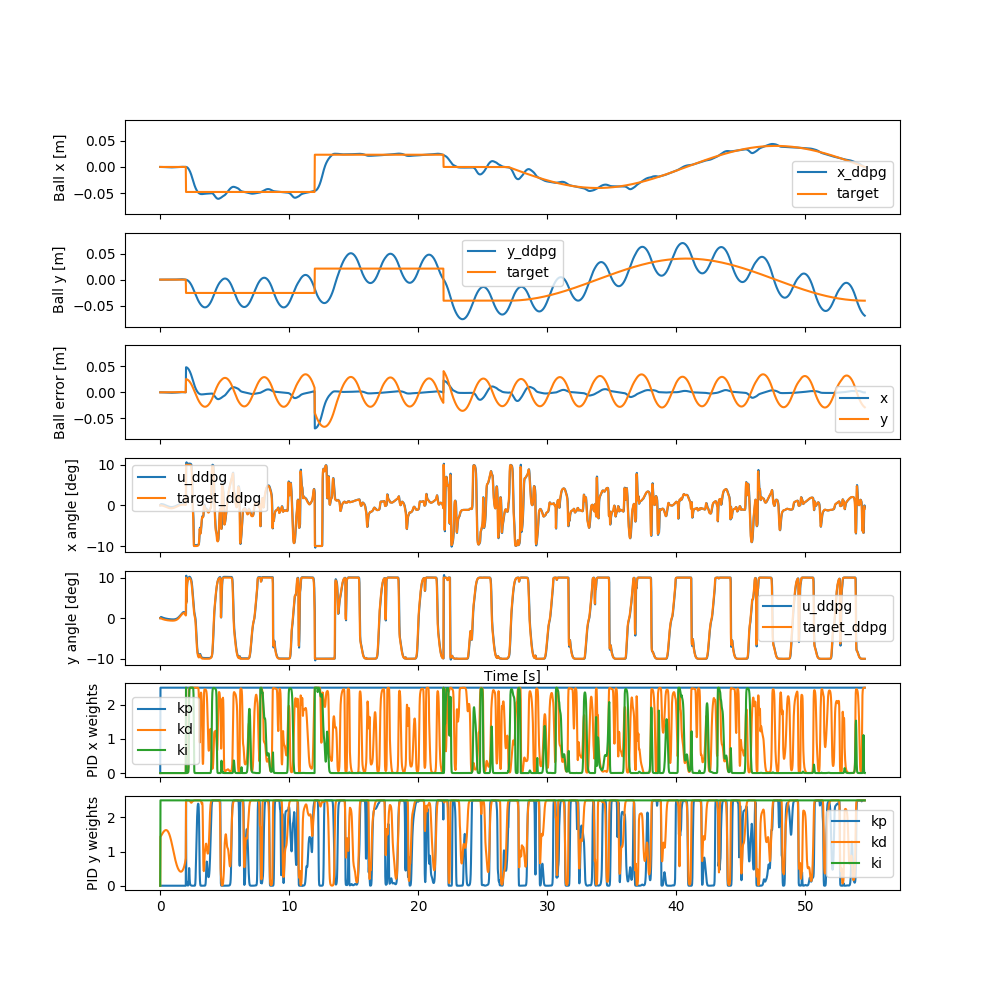

In [29]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [30]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [400]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[400]_sigmoid_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[400]_sigmoid_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            400
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa35d4cc0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[400]_sigmoid_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[400]_sigmoid_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },
    "logger_kwargs":	

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -71.7 |
|          StdEpRet |            27.9 |
|          MaxEpRet |           -41.8 |
|          MinEpRet |            -109 |
|  AverageTestEpRet |            -226 |
|      StdTestEpRet |            83.5 |
|      MaxTestEpRet |             -33 |
|      MinTestEpRet |            -337 |
|             EpLen |             400 |
|         TestEpLen |             309 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.91 |
|          StdQVals |             2.7 |
|          MaxQVals |            12.3 |
|          MinQVals |           -6.19 |
|            LossPi |           -4.26 |
|             LossQ |          0.0277 |
|              Time |            72.3 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -34.6 |
|          StdEpRet |             102 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            -120 |
|          StdEpRet |              74 |
|          MaxEpRet |             -46 |
|          MinEpRet |            -221 |
|  AverageTestEpRet |           -61.6 |
|      StdTestEpRet |            74.4 |
|      MaxTestEpRet |            83.5 |
|      MinTestEpRet |            -263 |
|             EpLen |             253 |
|         TestEpLen |             221 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            11.9 |
|          StdQVals |            6.33 |
|          MaxQVals |            30.7 |
|          MinQVals |           -6.91 |
|            LossPi |           -12.1 |
|             LossQ |          0.0611 |
|              Time |             188 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            -124 |
|          StdEpRet |             102 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             179 |
|          StdEpRet |            16.8 |
|          MaxEpRet |             198 |
|          MinEpRet |             157 |
|  AverageTestEpRet |             184 |
|      StdTestEpRet |              46 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |              92 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            27.1 |
|          StdQVals |            12.3 |
|          MaxQVals |            48.7 |
|          MinQVals |           -18.7 |
|            LossPi |           -27.5 |
|             LossQ |           0.132 |
|              Time |             311 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             179 |
|          StdEpRet |            36.2 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             176 |
|          StdEpRet |            40.9 |
|          MaxEpRet |             232 |
|          MinEpRet |             135 |
|  AverageTestEpRet |             207 |
|      StdTestEpRet |              45 |
|      MaxTestEpRet |             275 |
|      MinTestEpRet |             125 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            40.3 |
|          StdQVals |            15.2 |
|          MaxQVals |            62.4 |
|          MinQVals |           -15.8 |
|            LossPi |           -40.7 |
|             LossQ |          0.0975 |
|              Time |             428 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             227 |
|          StdEpRet |           0.205 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             138 |
|          StdEpRet |             110 |
|          MaxEpRet |             253 |
|          MinEpRet |           -35.4 |
|  AverageTestEpRet |             179 |
|      StdTestEpRet |            64.2 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |           -47.5 |
|             EpLen |             322 |
|         TestEpLen |             384 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            52.4 |
|          StdQVals |            15.1 |
|          MaxQVals |            72.2 |
|          MinQVals |           -6.81 |
|            LossPi |           -52.8 |
|             LossQ |           0.132 |
|              Time |             546 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             150 |
|          StdEpRet |            44.6 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             207 |
|          StdEpRet |            30.3 |
|          MaxEpRet |             249 |
|          MinEpRet |             180 |
|  AverageTestEpRet |             191 |
|      StdTestEpRet |            40.7 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |             109 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            59.7 |
|          StdQVals |            14.1 |
|          MaxQVals |            77.7 |
|          MinQVals |          -0.216 |
|            LossPi |           -60.1 |
|             LossQ |           0.134 |
|              Time |             667 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             188 |
|          StdEpRet |            36.3 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             212 |
|          StdEpRet |            39.2 |
|          MaxEpRet |             251 |
|          MinEpRet |             173 |
|  AverageTestEpRet |             191 |
|      StdTestEpRet |            43.1 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |             115 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            63.5 |
|          StdQVals |              14 |
|          MaxQVals |            78.2 |
|          MinQVals |         -0.0737 |
|            LossPi |           -63.9 |
|             LossQ |           0.178 |
|              Time |             784 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             184 |
|          StdEpRet |            58.5 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             174 |
|          StdEpRet |            20.9 |
|          MaxEpRet |             202 |
|          MinEpRet |             151 |
|  AverageTestEpRet |             182 |
|      StdTestEpRet |            50.8 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |             103 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            65.5 |
|          StdQVals |            13.9 |
|          MaxQVals |            79.2 |
|          MinQVals |           -3.84 |
|            LossPi |           -65.8 |
|             LossQ |           0.153 |
|              Time |             902 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             206 |
|          StdEpRet |            56.7 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             219 |
|          StdEpRet |            14.9 |
|          MaxEpRet |             238 |
|          MinEpRet |             202 |
|  AverageTestEpRet |             210 |
|      StdTestEpRet |              31 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |             142 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            66.9 |
|          StdQVals |            13.6 |
|          MaxQVals |            79.2 |
|          MinQVals |           -5.13 |
|            LossPi |           -67.2 |
|             LossQ |           0.139 |
|              Time |        1.03e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             182 |
|          StdEpRet |            36.6 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |            74.5 |
|          StdEpRet |            71.3 |
|          MaxEpRet |             171 |
|          MinEpRet |          -0.317 |
|  AverageTestEpRet |             189 |
|      StdTestEpRet |            66.8 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |           -3.78 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            68.6 |
|          StdQVals |              13 |
|          MaxQVals |            80.6 |
|          MinQVals |           -5.84 |
|            LossPi |           -68.9 |
|             LossQ |            0.15 |
|              Time |        1.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             141 |
|          StdEpRet |            40.9 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             188 |
|          StdEpRet |            28.6 |
|          MaxEpRet |             217 |
|          MinEpRet |             159 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |              74 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |           -72.2 |
|             EpLen |             400 |
|         TestEpLen |             385 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            69.6 |
|          StdQVals |            12.7 |
|          MaxQVals |            81.1 |
|          MinQVals |           -4.62 |
|            LossPi |           -69.9 |
|             LossQ |           0.148 |
|              Time |        1.26e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             210 |
|          StdEpRet |            45.3 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             222 |
|          StdEpRet |            9.97 |
|          MaxEpRet |             233 |
|          MinEpRet |             209 |
|  AverageTestEpRet |             209 |
|      StdTestEpRet |            35.1 |
|      MaxTestEpRet |             257 |
|      MinTestEpRet |             136 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |              70 |
|          StdQVals |              13 |
|          MaxQVals |              82 |
|          MinQVals |           -11.9 |
|            LossPi |           -70.2 |
|             LossQ |           0.145 |
|              Time |        1.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             185 |
|          StdEpRet |            30.3 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             182 |
|          StdEpRet |            17.3 |
|          MaxEpRet |             200 |
|          MinEpRet |             159 |
|  AverageTestEpRet |             211 |
|      StdTestEpRet |            33.9 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |             134 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            69.9 |
|          StdQVals |            13.1 |
|          MaxQVals |            82.3 |
|          MinQVals |           -14.4 |
|            LossPi |           -70.1 |
|             LossQ |           0.142 |
|              Time |         1.5e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             210 |
|          StdEpRet |            41.1 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             171 |
|          StdEpRet |            15.9 |
|          MaxEpRet |             187 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             201 |
|      StdTestEpRet |            35.4 |
|      MaxTestEpRet |             273 |
|      MinTestEpRet |             138 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |              70 |
|          StdQVals |            13.1 |
|          MaxQVals |            85.9 |
|          MinQVals |           -12.1 |
|            LossPi |           -70.2 |
|             LossQ |           0.158 |
|              Time |        1.62e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             213 |
|          StdEpRet |            31.1 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             220 |
|          StdEpRet |            20.1 |
|          MaxEpRet |             242 |
|          MinEpRet |             193 |
|  AverageTestEpRet |             189 |
|      StdTestEpRet |            76.5 |
|      MaxTestEpRet |             262 |
|      MinTestEpRet |           -74.8 |
|             EpLen |             400 |
|         TestEpLen |             387 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            70.6 |
|          StdQVals |            12.9 |
|          MaxQVals |            82.5 |
|          MinQVals |           -13.4 |
|            LossPi |           -70.8 |
|             LossQ |           0.155 |
|              Time |        1.74e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             239 |
|          StdEpRet |              24 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             151 |
|          StdEpRet |            52.4 |
|          MaxEpRet |             206 |
|          MinEpRet |            80.6 |
|  AverageTestEpRet |             183 |
|      StdTestEpRet |            42.4 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |            72.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            70.5 |
|          StdQVals |            12.8 |
|          MaxQVals |              81 |
|          MinQVals |           -4.44 |
|            LossPi |           -70.7 |
|             LossQ |           0.143 |
|              Time |        1.86e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             172 |
|          StdEpRet |            19.3 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             176 |
|          StdEpRet |            9.03 |
|          MaxEpRet |             185 |
|          MinEpRet |             167 |
|  AverageTestEpRet |             210 |
|      StdTestEpRet |            37.2 |
|      MaxTestEpRet |             267 |
|      MinTestEpRet |             117 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            70.4 |
|          StdQVals |            13.1 |
|          MaxQVals |            80.8 |
|          MinQVals |           -8.71 |
|            LossPi |           -70.6 |
|             LossQ |           0.144 |
|              Time |        1.98e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             221 |
|          StdEpRet |            34.7 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             170 |
|          StdEpRet |            69.9 |
|          MaxEpRet |             261 |
|          MinEpRet |            90.3 |
|  AverageTestEpRet |             218 |
|      StdTestEpRet |            44.3 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |             114 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            70.5 |
|          StdQVals |            12.7 |
|          MaxQVals |            80.6 |
|          MinQVals |             -16 |
|            LossPi |           -70.7 |
|             LossQ |           0.147 |
|              Time |         2.1e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             230 |
|          StdEpRet |            39.8 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             228 |
|          StdEpRet |            13.1 |
|          MaxEpRet |             241 |
|          MinEpRet |             214 |
|  AverageTestEpRet |             212 |
|      StdTestEpRet |            46.6 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |            97.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            70.6 |
|          StdQVals |            12.7 |
|          MaxQVals |            81.8 |
|          MinQVals |           -9.29 |
|            LossPi |           -70.8 |
|             LossQ |           0.156 |
|              Time |        2.22e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             217 |
|          StdEpRet |            26.3 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             226 |
|          StdEpRet |            24.8 |
|          MaxEpRet |             247 |
|          MinEpRet |             192 |
|  AverageTestEpRet |             204 |
|      StdTestEpRet |            48.9 |
|      MaxTestEpRet |             284 |
|      MinTestEpRet |             127 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            70.9 |
|          StdQVals |            13.2 |
|          MaxQVals |              83 |
|          MinQVals |           -12.5 |
|            LossPi |           -71.2 |
|             LossQ |           0.159 |
|              Time |        2.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             228 |
|          StdEpRet |              55 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             201 |
|          StdEpRet |            21.1 |
|          MaxEpRet |             222 |
|          MinEpRet |             180 |
|  AverageTestEpRet |             195 |
|      StdTestEpRet |            51.8 |
|      MaxTestEpRet |             282 |
|      MinTestEpRet |            86.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            70.9 |
|          StdQVals |            12.4 |
|          MaxQVals |            82.1 |
|          MinQVals |           -3.71 |
|            LossPi |           -71.1 |
|             LossQ |           0.138 |
|              Time |        2.46e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             206 |
|          StdEpRet |            35.6 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             212 |
|          StdEpRet |            12.1 |
|          MaxEpRet |             222 |
|          MinEpRet |             195 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            30.2 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |             125 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            70.6 |
|          StdQVals |            12.2 |
|          MaxQVals |            80.6 |
|          MinQVals |           -9.88 |
|            LossPi |           -70.8 |
|             LossQ |           0.143 |
|              Time |        2.58e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             190 |
|          StdEpRet |            9.88 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             195 |
|          StdEpRet |            30.7 |
|          MaxEpRet |             226 |
|          MinEpRet |             165 |
|  AverageTestEpRet |             208 |
|      StdTestEpRet |            30.8 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |             141 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            70.2 |
|          StdQVals |            12.3 |
|          MaxQVals |            84.2 |
|          MinQVals |           -6.45 |
|            LossPi |           -70.4 |
|             LossQ |           0.158 |
|              Time |         2.7e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             229 |
|          StdEpRet |            23.4 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             187 |
|          StdEpRet |            49.4 |
|          MaxEpRet |             243 |
|          MinEpRet |             123 |
|  AverageTestEpRet |             189 |
|      StdTestEpRet |            28.8 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |             147 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            70.7 |
|          StdQVals |            12.9 |
|          MaxQVals |            81.9 |
|          MinQVals |           -9.16 |
|            LossPi |           -70.9 |
|             LossQ |           0.143 |
|              Time |        2.83e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             216 |
|          StdEpRet |            8.33 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             191 |
|          StdEpRet |            47.7 |
|          MaxEpRet |             239 |
|          MinEpRet |             144 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            57.8 |
|      MaxTestEpRet |             281 |
|      MinTestEpRet |            1.71 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            70.9 |
|          StdQVals |            12.6 |
|          MaxQVals |            80.4 |
|          MinQVals |           -12.6 |
|            LossPi |           -71.1 |
|             LossQ |           0.156 |
|              Time |        2.95e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             197 |
|          StdEpRet |            53.7 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.00015817035906636278


<IPython.core.display.Javascript object>


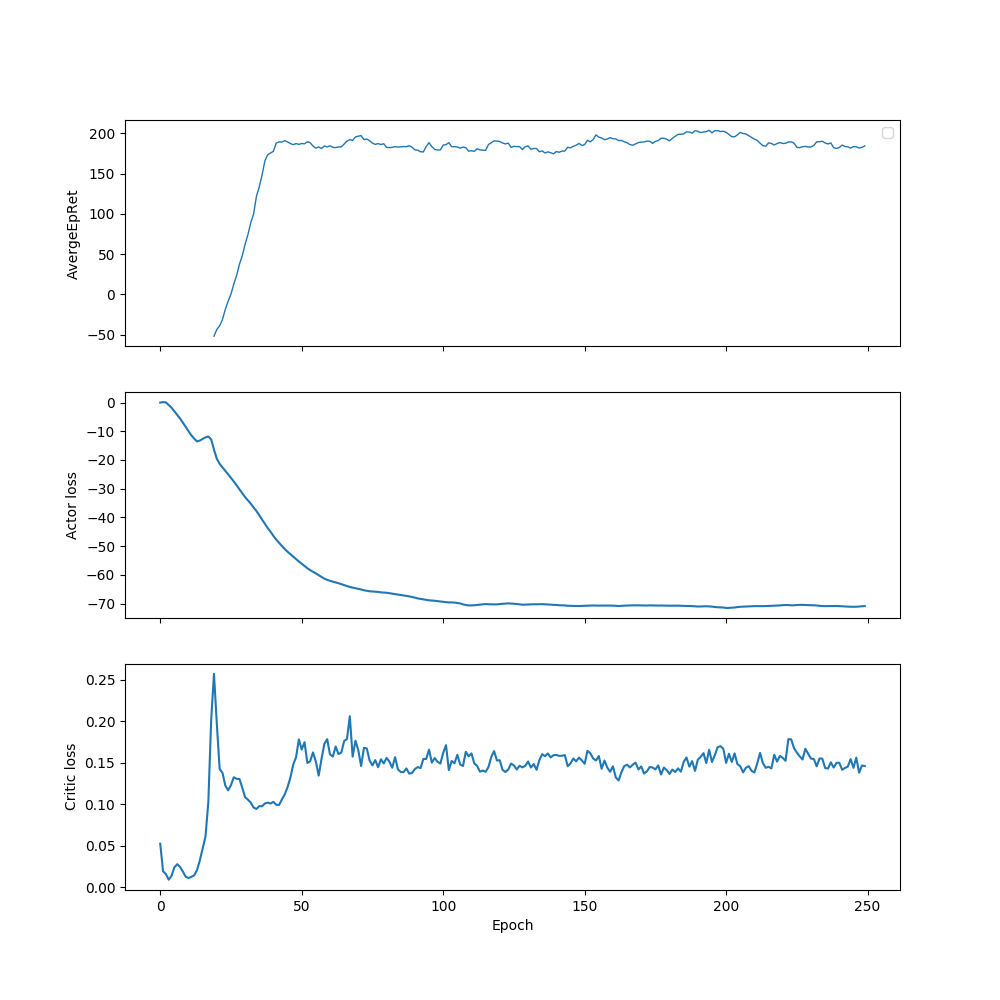

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


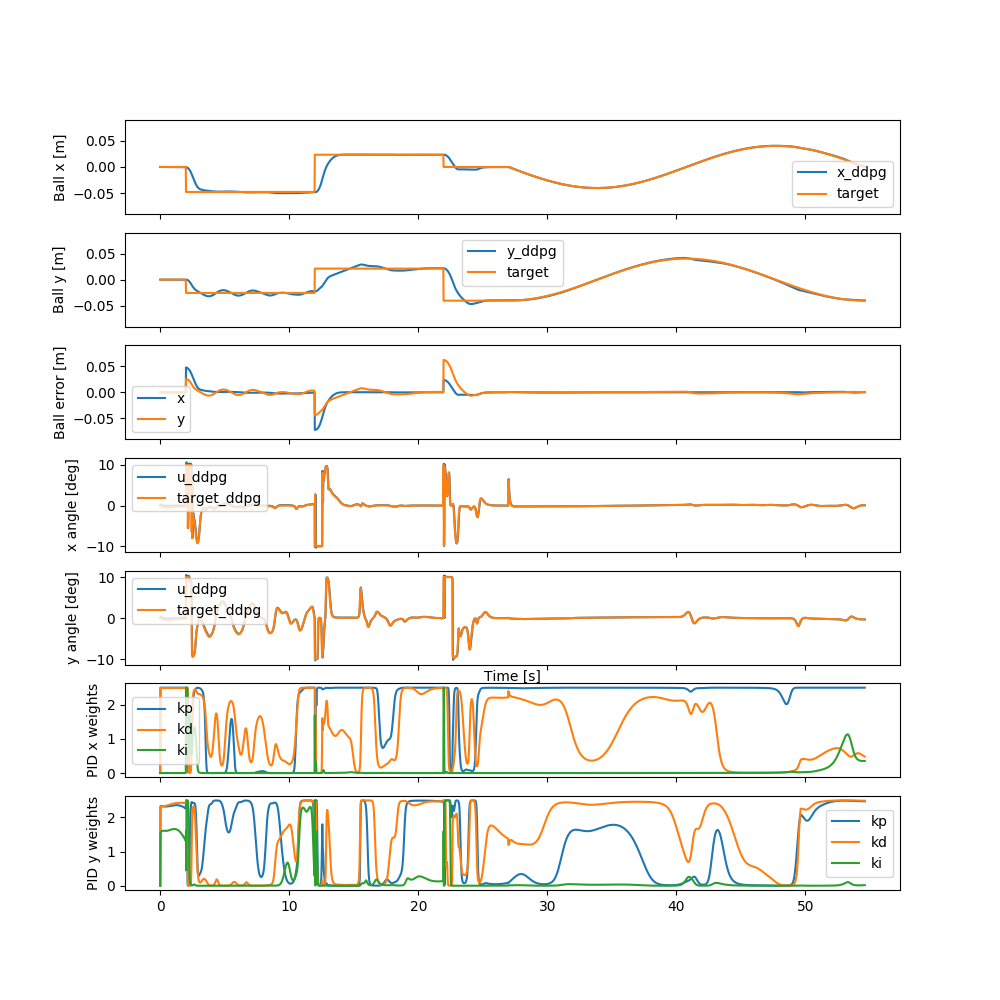

In [31]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [32]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [50,25]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[50,25]_sigmoid_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[50,25]_sigmoid_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            50,
            25
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa3379da0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[50,25]_sigmoid_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[50,25]_sigmoid_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },


---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -20.5 |
|          StdEpRet |            54.5 |
|          MaxEpRet |            48.9 |
|          MinEpRet |           -84.3 |
|  AverageTestEpRet |           -55.2 |
|      StdTestEpRet |            34.8 |
|      MaxTestEpRet |            6.37 |
|      MinTestEpRet |            -147 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            2.79 |
|          StdQVals |            3.11 |
|          MaxQVals |            11.7 |
|          MinQVals |           -6.47 |
|            LossPi |           -3.01 |
|             LossQ |            0.02 |
|              Time |            51.3 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -80.2 |
|          StdEpRet |            49.8 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            60.1 |
|          StdEpRet |            31.1 |
|          MaxEpRet |            91.2 |
|          MinEpRet |              29 |
|  AverageTestEpRet |            84.1 |
|      StdTestEpRet |              79 |
|      MaxTestEpRet |             212 |
|      MinTestEpRet |           -55.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            12.8 |
|          StdQVals |            5.64 |
|          MaxQVals |            22.9 |
|          MinQVals |           -12.6 |
|            LossPi |           -13.1 |
|             LossQ |          0.0765 |
|              Time |             139 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             118 |
|          StdEpRet |            13.7 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            66.5 |
|          StdEpRet |            51.6 |
|          MaxEpRet |             139 |
|          MinEpRet |            25.8 |
|  AverageTestEpRet |             116 |
|      StdTestEpRet |            85.9 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |           -97.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            26.4 |
|          StdQVals |            8.04 |
|          MaxQVals |              37 |
|          MinQVals |             -22 |
|            LossPi |           -26.8 |
|             LossQ |           0.275 |
|              Time |             225 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |            98.7 |
|          StdEpRet |            71.7 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             164 |
|          StdEpRet |              47 |
|          MaxEpRet |             211 |
|          MinEpRet |             117 |
|  AverageTestEpRet |             182 |
|      StdTestEpRet |            42.5 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |            74.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            37.7 |
|          StdQVals |            9.38 |
|          MaxQVals |            48.9 |
|          MinQVals |           -6.77 |
|            LossPi |             -38 |
|             LossQ |           0.161 |
|              Time |             310 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             151 |
|          StdEpRet |            35.9 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             150 |
|          StdEpRet |            66.3 |
|          MaxEpRet |             206 |
|          MinEpRet |              57 |
|  AverageTestEpRet |             143 |
|      StdTestEpRet |            89.9 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |           -88.2 |
|             EpLen |             400 |
|         TestEpLen |             386 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            45.1 |
|          StdQVals |            11.5 |
|          MaxQVals |            57.3 |
|          MinQVals |           -7.11 |
|            LossPi |           -45.4 |
|             LossQ |           0.158 |
|              Time |             398 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             184 |
|          StdEpRet |              40 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             198 |
|          StdEpRet |            11.8 |
|          MaxEpRet |             210 |
|          MinEpRet |             187 |
|  AverageTestEpRet |             180 |
|      StdTestEpRet |            53.5 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |            78.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |              51 |
|          StdQVals |            11.3 |
|          MaxQVals |            62.7 |
|          MinQVals |           -5.37 |
|            LossPi |           -51.3 |
|             LossQ |           0.149 |
|              Time |             483 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             184 |
|          StdEpRet |            34.2 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             151 |
|          StdEpRet |            44.4 |
|          MaxEpRet |             196 |
|          MinEpRet |             107 |
|  AverageTestEpRet |             140 |
|      StdTestEpRet |            68.5 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |           -16.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            54.6 |
|          StdQVals |            11.6 |
|          MaxQVals |            66.4 |
|          MinQVals |           -1.78 |
|            LossPi |           -54.8 |
|             LossQ |           0.183 |
|              Time |             565 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |            30.5 |
|          StdEpRet |            99.2 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             180 |
|          StdEpRet |            20.9 |
|          MaxEpRet |             201 |
|          MinEpRet |             159 |
|  AverageTestEpRet |             189 |
|      StdTestEpRet |            49.1 |
|      MaxTestEpRet |             269 |
|      MinTestEpRet |            71.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            57.4 |
|          StdQVals |            12.8 |
|          MaxQVals |            68.7 |
|          MinQVals |           -13.5 |
|            LossPi |           -57.6 |
|             LossQ |            0.22 |
|              Time |             650 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             208 |
|          StdEpRet |            27.6 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             164 |
|          StdEpRet |            19.9 |
|          MaxEpRet |             180 |
|          MinEpRet |             136 |
|  AverageTestEpRet |             169 |
|      StdTestEpRet |            64.5 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |            20.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            60.3 |
|          StdQVals |            12.7 |
|          MaxQVals |            70.5 |
|          MinQVals |           -17.7 |
|            LossPi |           -60.6 |
|             LossQ |           0.207 |
|              Time |             738 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             199 |
|          StdEpRet |            62.4 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             172 |
|          StdEpRet |            45.2 |
|          MaxEpRet |             221 |
|          MinEpRet |             112 |
|  AverageTestEpRet |             204 |
|      StdTestEpRet |            35.9 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |             111 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            61.6 |
|          StdQVals |            12.9 |
|          MaxQVals |            72.7 |
|          MinQVals |           -20.4 |
|            LossPi |           -61.8 |
|             LossQ |           0.201 |
|              Time |             822 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             170 |
|          StdEpRet |              54 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             128 |
|          StdEpRet |              61 |
|          MaxEpRet |             189 |
|          MinEpRet |            66.9 |
|  AverageTestEpRet |             201 |
|      StdTestEpRet |            39.7 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |             126 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            62.2 |
|          StdQVals |              13 |
|          MaxQVals |            73.4 |
|          MinQVals |           -19.8 |
|            LossPi |           -62.4 |
|             LossQ |           0.193 |
|              Time |             906 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             227 |
|          StdEpRet |              19 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             210 |
|          StdEpRet |            42.3 |
|          MaxEpRet |             257 |
|          MinEpRet |             154 |
|  AverageTestEpRet |             189 |
|      StdTestEpRet |            45.1 |
|      MaxTestEpRet |             277 |
|      MinTestEpRet |              65 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |              63 |
|          StdQVals |            12.9 |
|          MaxQVals |            73.5 |
|          MinQVals |           -17.8 |
|            LossPi |           -63.2 |
|             LossQ |           0.205 |
|              Time |             990 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             210 |
|          StdEpRet |            44.1 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             223 |
|          StdEpRet |            25.4 |
|          MaxEpRet |             248 |
|          MinEpRet |             197 |
|  AverageTestEpRet |             222 |
|      StdTestEpRet |            25.9 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |             177 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            63.2 |
|          StdQVals |            12.7 |
|          MaxQVals |            73.2 |
|          MinQVals |            -8.4 |
|            LossPi |           -63.4 |
|             LossQ |           0.203 |
|              Time |        1.08e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             218 |
|          StdEpRet |            22.8 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             181 |
|          StdEpRet |            27.2 |
|          MaxEpRet |             205 |
|          MinEpRet |             143 |
|  AverageTestEpRet |             219 |
|      StdTestEpRet |            43.7 |
|      MaxTestEpRet |             281 |
|      MinTestEpRet |             118 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            63.3 |
|          StdQVals |            12.9 |
|          MaxQVals |            73.6 |
|          MinQVals |            -8.4 |
|            LossPi |           -63.4 |
|             LossQ |           0.197 |
|              Time |        1.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             197 |
|          StdEpRet |            23.5 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             185 |
|          StdEpRet |            34.3 |
|          MaxEpRet |             219 |
|          MinEpRet |             150 |
|  AverageTestEpRet |             194 |
|      StdTestEpRet |            78.5 |
|      MaxTestEpRet |             279 |
|      MinTestEpRet |            -104 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |              64 |
|          StdQVals |            13.2 |
|          MaxQVals |            74.3 |
|          MinQVals |           -17.9 |
|            LossPi |           -64.1 |
|             LossQ |           0.226 |
|              Time |        1.25e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             193 |
|          StdEpRet |            51.2 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             161 |
|          StdEpRet |            74.6 |
|          MaxEpRet |             222 |
|          MinEpRet |            55.8 |
|  AverageTestEpRet |             199 |
|      StdTestEpRet |            44.4 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |            62.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            64.7 |
|          StdQVals |            13.4 |
|          MaxQVals |            74.8 |
|          MinQVals |           -19.7 |
|            LossPi |           -64.9 |
|             LossQ |            0.21 |
|              Time |        1.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             188 |
|          StdEpRet |            33.7 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             182 |
|          StdEpRet |            11.8 |
|          MaxEpRet |             194 |
|          MinEpRet |             170 |
|  AverageTestEpRet |             198 |
|      StdTestEpRet |            30.6 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |             145 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            65.2 |
|          StdQVals |            13.5 |
|          MaxQVals |            75.9 |
|          MinQVals |           -16.3 |
|            LossPi |           -65.4 |
|             LossQ |           0.194 |
|              Time |        1.42e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             179 |
|          StdEpRet |            23.8 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             187 |
|          StdEpRet |            24.5 |
|          MaxEpRet |             208 |
|          MinEpRet |             153 |
|  AverageTestEpRet |             202 |
|      StdTestEpRet |              47 |
|      MaxTestEpRet |             290 |
|      MinTestEpRet |             104 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            65.2 |
|          StdQVals |            13.7 |
|          MaxQVals |            76.1 |
|          MinQVals |           -17.1 |
|            LossPi |           -65.3 |
|             LossQ |           0.204 |
|              Time |        1.51e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             199 |
|          StdEpRet |            15.4 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             226 |
|          StdEpRet |            41.9 |
|          MaxEpRet |             268 |
|          MinEpRet |             184 |
|  AverageTestEpRet |             206 |
|      StdTestEpRet |            30.1 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |             142 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            65.3 |
|          StdQVals |            13.8 |
|          MaxQVals |            75.7 |
|          MinQVals |           -25.3 |
|            LossPi |           -65.5 |
|             LossQ |           0.208 |
|              Time |         1.6e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             176 |
|          StdEpRet |            4.96 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             206 |
|          StdEpRet |            2.27 |
|          MaxEpRet |             209 |
|          MinEpRet |             204 |
|  AverageTestEpRet |             210 |
|      StdTestEpRet |            34.8 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |             142 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            65.4 |
|          StdQVals |            13.9 |
|          MaxQVals |            76.7 |
|          MinQVals |           -28.6 |
|            LossPi |           -65.5 |
|             LossQ |           0.182 |
|              Time |        1.68e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             222 |
|          StdEpRet |            17.5 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             224 |
|          StdEpRet |              16 |
|          MaxEpRet |             240 |
|          MinEpRet |             208 |
|  AverageTestEpRet |             208 |
|      StdTestEpRet |            36.3 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |             131 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            65.8 |
|          StdQVals |            13.6 |
|          MaxQVals |            77.5 |
|          MinQVals |           -21.4 |
|            LossPi |             -66 |
|             LossQ |           0.206 |
|              Time |        1.76e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             196 |
|          StdEpRet |            25.3 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             228 |
|          StdEpRet |            20.8 |
|          MaxEpRet |             249 |
|          MinEpRet |             200 |
|  AverageTestEpRet |             185 |
|      StdTestEpRet |            41.9 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |             111 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            66.4 |
|          StdQVals |            13.3 |
|          MaxQVals |            77.8 |
|          MinQVals |           -20.7 |
|            LossPi |           -66.5 |
|             LossQ |             0.2 |
|              Time |        1.84e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             184 |
|          StdEpRet |            45.6 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             178 |
|          StdEpRet |            18.7 |
|          MaxEpRet |             196 |
|          MinEpRet |             152 |
|  AverageTestEpRet |             201 |
|      StdTestEpRet |            41.7 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |             113 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            66.4 |
|          StdQVals |            13.1 |
|          MaxQVals |            78.7 |
|          MinQVals |           -20.9 |
|            LossPi |           -66.5 |
|             LossQ |           0.216 |
|              Time |        1.93e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             250 |
|          StdEpRet |            30.2 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             230 |
|          StdEpRet |            24.7 |
|          MaxEpRet |             264 |
|          MinEpRet |             208 |
|  AverageTestEpRet |             213 |
|      StdTestEpRet |            35.3 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |             123 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            66.3 |
|          StdQVals |            12.8 |
|          MaxQVals |            76.5 |
|          MinQVals |           -16.7 |
|            LossPi |           -66.5 |
|             LossQ |           0.216 |
|              Time |        2.01e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             227 |
|          StdEpRet |            31.4 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             227 |
|          StdEpRet |            18.6 |
|          MaxEpRet |             254 |
|          MinEpRet |             213 |
|  AverageTestEpRet |             207 |
|      StdTestEpRet |              30 |
|      MaxTestEpRet |             257 |
|      MinTestEpRet |             154 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            66.6 |
|          StdQVals |            12.5 |
|          MaxQVals |              76 |
|          MinQVals |           -26.8 |
|            LossPi |           -66.7 |
|             LossQ |           0.197 |
|              Time |         2.1e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             195 |
|          StdEpRet |            28.7 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0001612885162439833


<IPython.core.display.Javascript object>


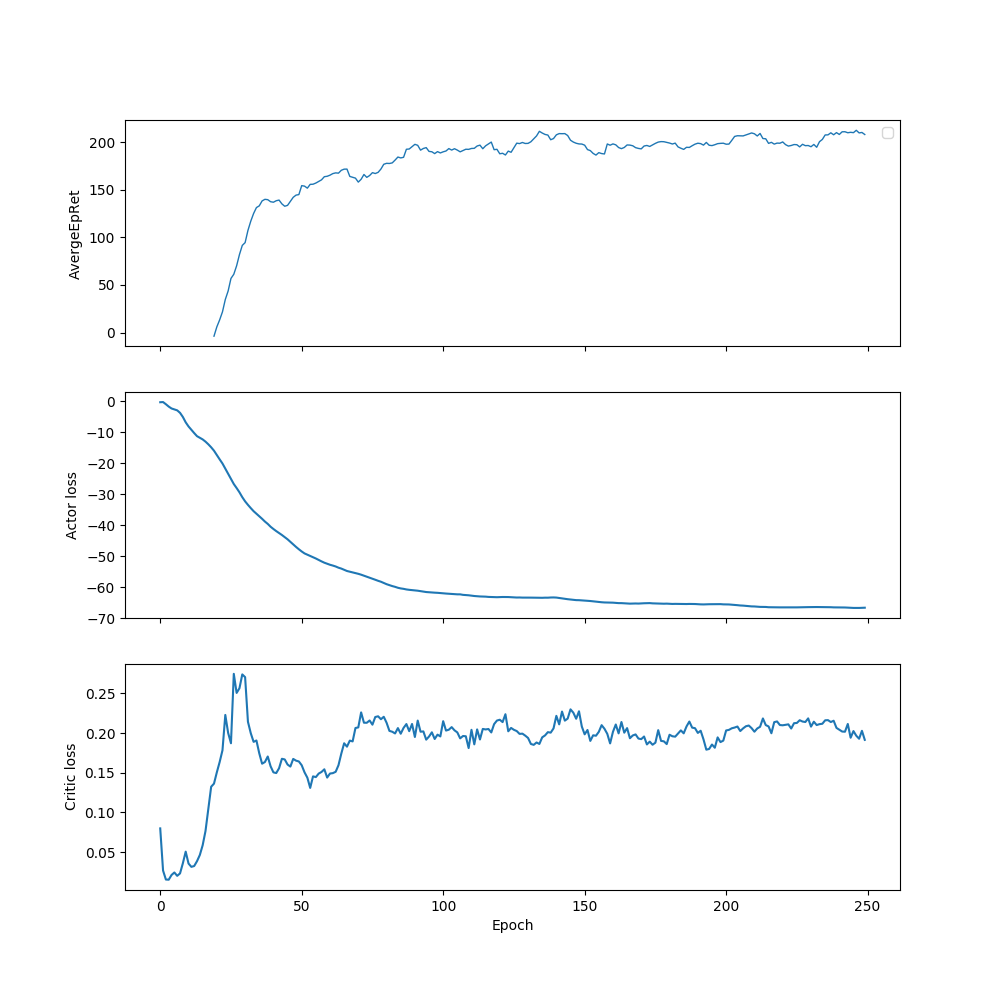

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


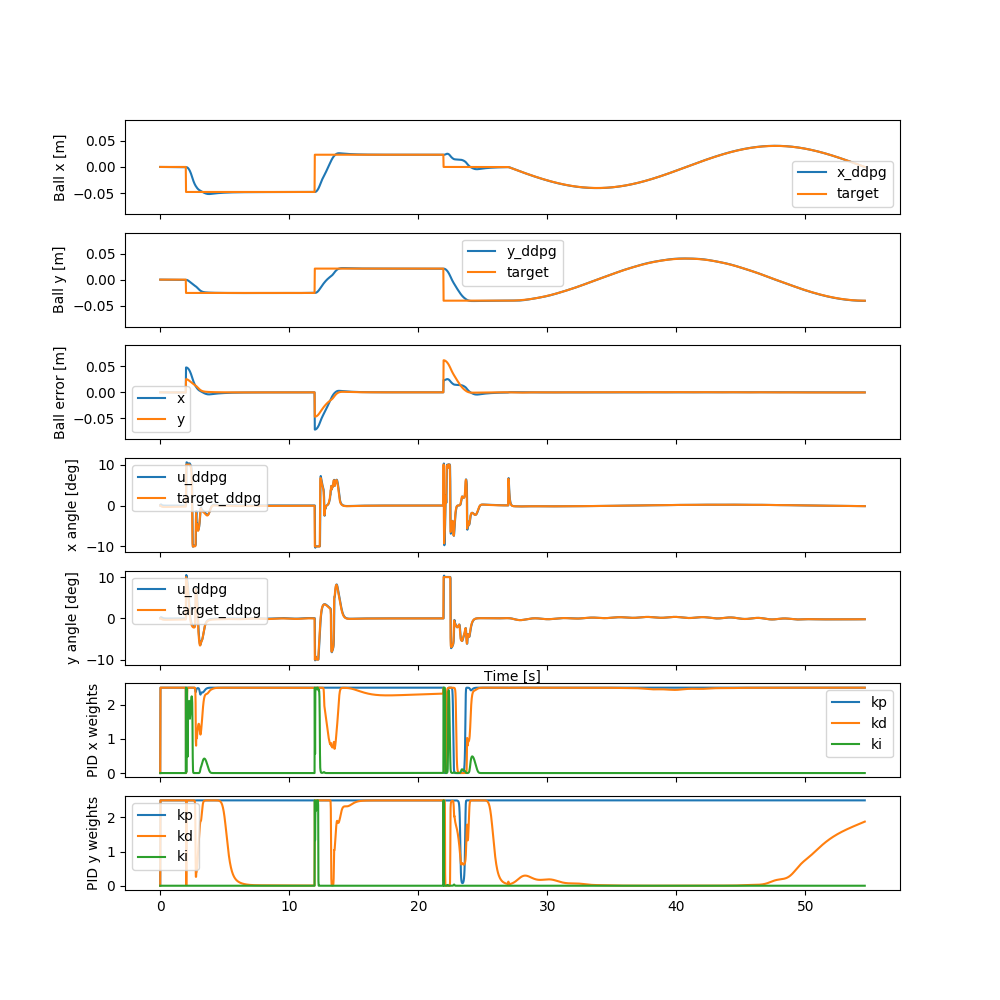

In [33]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [34]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [100,50]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[100,50]_sigmoid_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[100,50]_sigmoid_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            100,
            50
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa30940f0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[100,50]_sigmoid_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[100,50]_sigmoid_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
   

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -76.9 |
|          StdEpRet |            67.8 |
|          MaxEpRet |           -2.66 |
|          MinEpRet |            -166 |
|  AverageTestEpRet |            -114 |
|      StdTestEpRet |             149 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |            -303 |
|             EpLen |             400 |
|         TestEpLen |             295 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |             4.7 |
|          StdQVals |            3.49 |
|          MaxQVals |            11.3 |
|          MinQVals |           -14.8 |
|            LossPi |           -5.15 |
|             LossQ |          0.0414 |
|              Time |            59.2 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |            -123 |
|          StdEpRet |            17.6 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            29.3 |
|          StdEpRet |             206 |
|          MaxEpRet |             190 |
|          MinEpRet |            -261 |
|  AverageTestEpRet |             107 |
|      StdTestEpRet |            68.5 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |             -19 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            16.7 |
|          StdQVals |            6.74 |
|          MaxQVals |            27.7 |
|          MinQVals |           -16.9 |
|            LossPi |           -17.1 |
|             LossQ |           0.122 |
|              Time |             149 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             105 |
|          StdEpRet |              18 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             174 |
|          StdEpRet |            27.7 |
|          MaxEpRet |             201 |
|          MinEpRet |             146 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |            62.4 |
|      MaxTestEpRet |             249 |
|      MinTestEpRet |              38 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            31.8 |
|          StdQVals |            9.07 |
|          MaxQVals |            42.2 |
|          MinQVals |           -14.8 |
|            LossPi |           -32.2 |
|             LossQ |           0.143 |
|              Time |             250 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             162 |
|          StdEpRet |            27.4 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             178 |
|          StdEpRet |            70.8 |
|          MaxEpRet |             266 |
|          MinEpRet |            93.1 |
|  AverageTestEpRet |             130 |
|      StdTestEpRet |             118 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |            -203 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            40.2 |
|          StdQVals |            11.8 |
|          MaxQVals |            52.4 |
|          MinQVals |           -8.54 |
|            LossPi |           -40.5 |
|             LossQ |           0.131 |
|              Time |             352 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             142 |
|          StdEpRet |             111 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             165 |
|          StdEpRet |            66.2 |
|          MaxEpRet |             231 |
|          MinEpRet |            98.9 |
|  AverageTestEpRet |             187 |
|      StdTestEpRet |            48.7 |
|      MaxTestEpRet |             253 |
|      MinTestEpRet |            92.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            47.3 |
|          StdQVals |            12.2 |
|          MaxQVals |            58.6 |
|          MinQVals |           -8.53 |
|            LossPi |           -47.6 |
|             LossQ |           0.108 |
|              Time |             447 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             218 |
|          StdEpRet |            18.5 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             114 |
|          StdEpRet |             101 |
|          MaxEpRet |             231 |
|          MinEpRet |           -14.9 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            67.2 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |             -81 |
|             EpLen |             400 |
|         TestEpLen |             387 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            51.7 |
|          StdQVals |              13 |
|          MaxQVals |            62.6 |
|          MinQVals |           -10.3 |
|            LossPi |           -51.9 |
|             LossQ |           0.109 |
|              Time |             551 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             212 |
|          StdEpRet |            5.44 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             257 |
|          StdEpRet |            13.7 |
|          MaxEpRet |             270 |
|          MinEpRet |             243 |
|  AverageTestEpRet |             210 |
|      StdTestEpRet |              43 |
|      MaxTestEpRet |             267 |
|      MinTestEpRet |             121 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            55.4 |
|          StdQVals |            12.7 |
|          MaxQVals |            65.6 |
|          MinQVals |           -5.27 |
|            LossPi |           -55.6 |
|             LossQ |           0.102 |
|              Time |             651 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             178 |
|          StdEpRet |            9.74 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             221 |
|          StdEpRet |            21.3 |
|          MaxEpRet |             251 |
|          MinEpRet |             203 |
|  AverageTestEpRet |             201 |
|      StdTestEpRet |            62.1 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |              26 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            57.7 |
|          StdQVals |            12.6 |
|          MaxQVals |            67.3 |
|          MinQVals |           -13.1 |
|            LossPi |             -58 |
|             LossQ |           0.104 |
|              Time |             750 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             204 |
|          StdEpRet |            13.1 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             203 |
|          StdEpRet |              14 |
|          MaxEpRet |             217 |
|          MinEpRet |             189 |
|  AverageTestEpRet |             216 |
|      StdTestEpRet |            51.6 |
|      MaxTestEpRet |             286 |
|      MinTestEpRet |            41.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            59.5 |
|          StdQVals |            12.9 |
|          MaxQVals |            68.9 |
|          MinQVals |           -7.23 |
|            LossPi |           -59.7 |
|             LossQ |          0.0958 |
|              Time |             848 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             239 |
|          StdEpRet |            20.8 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             226 |
|          StdEpRet |            17.3 |
|          MaxEpRet |             250 |
|          MinEpRet |             211 |
|  AverageTestEpRet |             214 |
|      StdTestEpRet |            34.1 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |             136 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            60.8 |
|          StdQVals |            13.2 |
|          MaxQVals |            70.4 |
|          MinQVals |           -10.1 |
|            LossPi |             -61 |
|             LossQ |           0.105 |
|              Time |             943 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             237 |
|          StdEpRet |            35.8 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             195 |
|          StdEpRet |            79.5 |
|          MaxEpRet |             275 |
|          MinEpRet |             116 |
|  AverageTestEpRet |             205 |
|      StdTestEpRet |            43.9 |
|      MaxTestEpRet |             282 |
|      MinTestEpRet |             110 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            61.6 |
|          StdQVals |            12.9 |
|          MaxQVals |            70.6 |
|          MinQVals |           -12.6 |
|            LossPi |           -61.8 |
|             LossQ |          0.0817 |
|              Time |        1.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             231 |
|          StdEpRet |            33.6 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             206 |
|          StdEpRet |            23.4 |
|          MaxEpRet |             227 |
|          MinEpRet |             173 |
|  AverageTestEpRet |             210 |
|      StdTestEpRet |            38.3 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |             112 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            62.5 |
|          StdQVals |            12.8 |
|          MaxQVals |            71.3 |
|          MinQVals |           -8.94 |
|            LossPi |           -62.7 |
|             LossQ |           0.086 |
|              Time |        1.14e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             211 |
|          StdEpRet |              84 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             195 |
|          StdEpRet |            15.6 |
|          MaxEpRet |             211 |
|          MinEpRet |             180 |
|  AverageTestEpRet |             221 |
|      StdTestEpRet |              28 |
|      MaxTestEpRet |             273 |
|      MinTestEpRet |             166 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            63.3 |
|          StdQVals |            12.8 |
|          MaxQVals |            72.1 |
|          MinQVals |           -4.02 |
|            LossPi |           -63.4 |
|             LossQ |          0.0861 |
|              Time |        1.24e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             217 |
|          StdEpRet |            22.5 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             225 |
|          StdEpRet |            29.4 |
|          MaxEpRet |             247 |
|          MinEpRet |             183 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            32.7 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |             161 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            64.1 |
|          StdQVals |            12.6 |
|          MaxQVals |              73 |
|          MinQVals |           -21.4 |
|            LossPi |           -64.3 |
|             LossQ |          0.0919 |
|              Time |        1.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             207 |
|          StdEpRet |            9.34 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             202 |
|          StdEpRet |            8.59 |
|          MaxEpRet |             211 |
|          MinEpRet |             194 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |              37 |
|      MaxTestEpRet |             286 |
|      MinTestEpRet |             128 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            64.8 |
|          StdQVals |            12.4 |
|          MaxQVals |            73.4 |
|          MinQVals |           -18.4 |
|            LossPi |             -65 |
|             LossQ |           0.085 |
|              Time |        1.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             210 |
|          StdEpRet |            24.3 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             187 |
|          StdEpRet |            35.3 |
|          MaxEpRet |             234 |
|          MinEpRet |             150 |
|  AverageTestEpRet |             207 |
|      StdTestEpRet |            35.8 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |             138 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            64.9 |
|          StdQVals |            12.7 |
|          MaxQVals |            73.3 |
|          MinQVals |           -22.7 |
|            LossPi |           -65.1 |
|             LossQ |          0.0849 |
|              Time |        1.54e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             214 |
|          StdEpRet |            31.4 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             257 |
|          StdEpRet |            24.6 |
|          MaxEpRet |             282 |
|          MinEpRet |             232 |
|  AverageTestEpRet |             215 |
|      StdTestEpRet |            39.7 |
|      MaxTestEpRet |             283 |
|      MinTestEpRet |             108 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            65.1 |
|          StdQVals |            12.3 |
|          MaxQVals |            73.1 |
|          MinQVals |           -23.5 |
|            LossPi |           -65.3 |
|             LossQ |          0.0851 |
|              Time |        1.64e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             185 |
|          StdEpRet |              47 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             203 |
|          StdEpRet |              13 |
|          MaxEpRet |             217 |
|          MinEpRet |             186 |
|  AverageTestEpRet |             193 |
|      StdTestEpRet |              36 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |             121 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            65.3 |
|          StdQVals |            12.7 |
|          MaxQVals |            73.8 |
|          MinQVals |           -26.3 |
|            LossPi |           -65.5 |
|             LossQ |          0.0885 |
|              Time |        1.75e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             195 |
|          StdEpRet |            14.3 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             194 |
|          StdEpRet |             6.6 |
|          MaxEpRet |             201 |
|          MinEpRet |             188 |
|  AverageTestEpRet |             222 |
|      StdTestEpRet |            35.6 |
|      MaxTestEpRet |             283 |
|      MinTestEpRet |             163 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            65.7 |
|          StdQVals |            12.4 |
|          MaxQVals |            73.9 |
|          MinQVals |           -11.6 |
|            LossPi |           -65.8 |
|             LossQ |          0.0844 |
|              Time |        1.85e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             194 |
|          StdEpRet |            20.7 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             221 |
|          StdEpRet |            25.4 |
|          MaxEpRet |             257 |
|          MinEpRet |             200 |
|  AverageTestEpRet |             223 |
|      StdTestEpRet |            28.7 |
|      MaxTestEpRet |             279 |
|      MinTestEpRet |             148 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            66.4 |
|          StdQVals |            12.3 |
|          MaxQVals |            74.2 |
|          MinQVals |           -19.9 |
|            LossPi |           -66.5 |
|             LossQ |          0.0903 |
|              Time |        1.95e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             218 |
|          StdEpRet |            22.7 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             263 |
|          StdEpRet |            1.46 |
|          MaxEpRet |             264 |
|          MinEpRet |             261 |
|  AverageTestEpRet |             220 |
|      StdTestEpRet |            32.2 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |             159 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            66.4 |
|          StdQVals |            12.1 |
|          MaxQVals |            73.7 |
|          MinQVals |           -7.24 |
|            LossPi |           -66.5 |
|             LossQ |          0.0822 |
|              Time |        2.05e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             178 |
|          StdEpRet |            32.3 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             210 |
|          StdEpRet |            16.7 |
|          MaxEpRet |             226 |
|          MinEpRet |             187 |
|  AverageTestEpRet |             219 |
|      StdTestEpRet |            33.2 |
|      MaxTestEpRet |             285 |
|      MinTestEpRet |             148 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            66.1 |
|          StdQVals |              12 |
|          MaxQVals |            73.6 |
|          MinQVals |           -6.99 |
|            LossPi |           -66.2 |
|             LossQ |          0.0826 |
|              Time |        2.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             213 |
|          StdEpRet |            27.6 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             234 |
|          StdEpRet |            37.3 |
|          MaxEpRet |             271 |
|          MinEpRet |             196 |
|  AverageTestEpRet |             223 |
|      StdTestEpRet |            21.7 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |             185 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            66.1 |
|          StdQVals |            12.1 |
|          MaxQVals |            73.5 |
|          MinQVals |           -7.05 |
|            LossPi |           -66.3 |
|             LossQ |          0.0878 |
|              Time |        2.24e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             207 |
|          StdEpRet |            35.9 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             214 |
|          StdEpRet |            26.6 |
|          MaxEpRet |             251 |
|          MinEpRet |             191 |
|  AverageTestEpRet |             218 |
|      StdTestEpRet |              34 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |             139 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            66.3 |
|          StdQVals |            11.8 |
|          MaxQVals |            73.2 |
|          MinQVals |           -7.95 |
|            LossPi |           -66.5 |
|             LossQ |          0.0879 |
|              Time |        2.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             240 |
|          StdEpRet |            3.69 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             213 |
|          StdEpRet |            38.3 |
|          MaxEpRet |             251 |
|          MinEpRet |             175 |
|  AverageTestEpRet |             211 |
|      StdTestEpRet |            41.6 |
|      MaxTestEpRet |             275 |
|      MinTestEpRet |             113 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            66.3 |
|          StdQVals |            12.1 |
|          MaxQVals |            73.6 |
|          MinQVals |           -9.94 |
|            LossPi |           -66.5 |
|             LossQ |          0.0841 |
|              Time |        2.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             208 |
|          StdEpRet |            36.1 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0001515800618084856


<IPython.core.display.Javascript object>


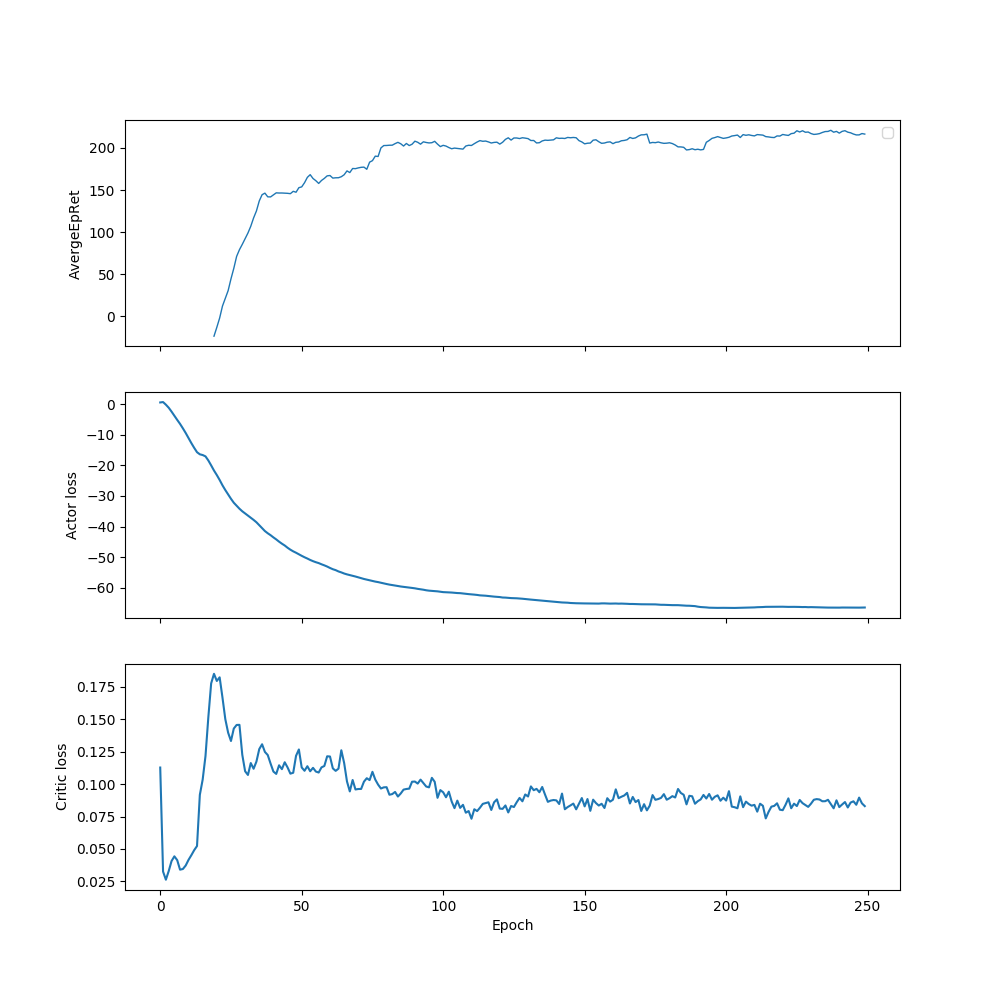

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


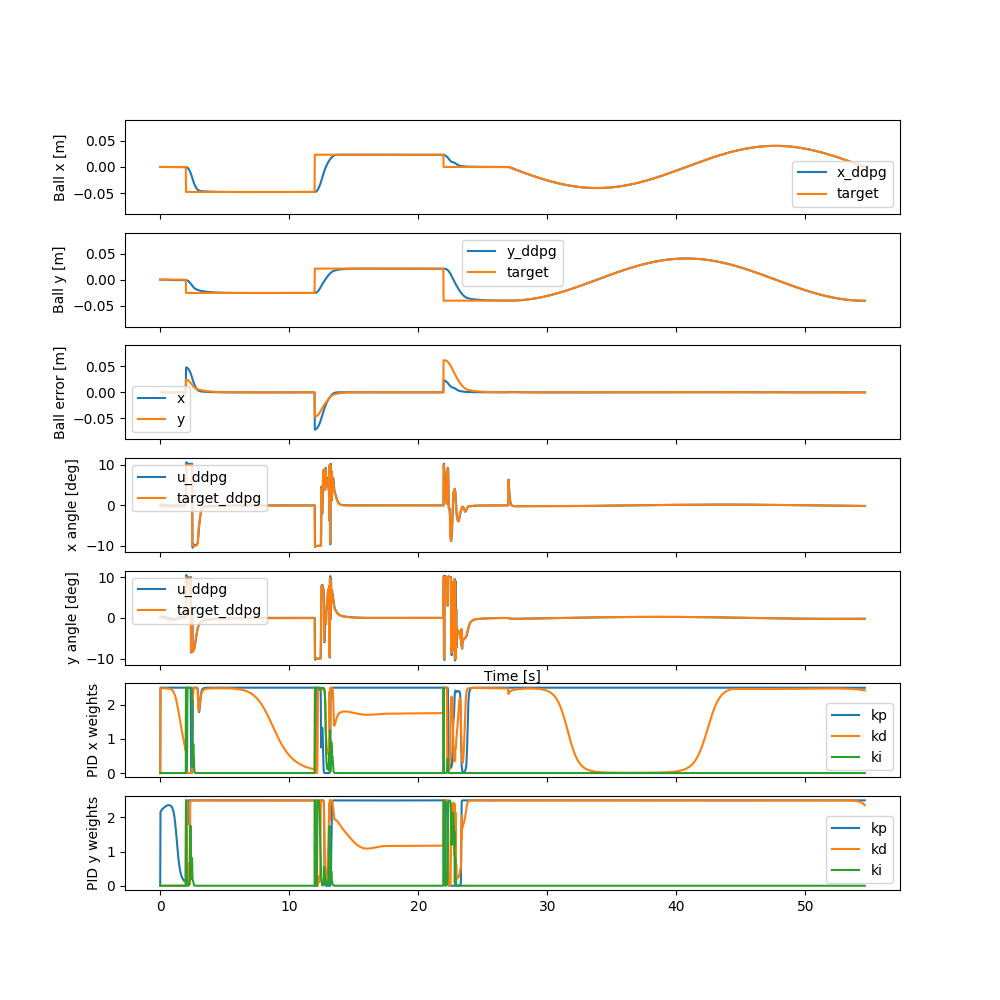

In [35]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [36]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [100,100]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[100,100]_sigmoid_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[100,100]_sigmoid_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            100,
            100
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa2e2a198>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[100,100]_sigmoid_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[100,100]_sigmoid_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |             -65 |
|          StdEpRet |            66.6 |
|          MaxEpRet |            25.3 |
|          MinEpRet |            -133 |
|  AverageTestEpRet |            -139 |
|      StdTestEpRet |             151 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |            -324 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            2.33 |
|          StdQVals |            5.25 |
|          MaxQVals |            11.5 |
|          MinQVals |           -20.4 |
|            LossPi |           -2.54 |
|             LossQ |          0.0609 |
|              Time |            66.5 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -72.6 |
|          StdEpRet |            52.4 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |           -76.3 |
|          StdEpRet |             166 |
|          MaxEpRet |            89.3 |
|          MinEpRet |            -242 |
|  AverageTestEpRet |            -107 |
|      StdTestEpRet |             157 |
|      MaxTestEpRet |             186 |
|      MinTestEpRet |            -315 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            4.22 |
|          StdQVals |               8 |
|          MaxQVals |            14.7 |
|          MinQVals |           -35.3 |
|            LossPi |           -4.34 |
|             LossQ |          0.0911 |
|              Time |             176 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            -216 |
|          StdEpRet |            81.2 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            51.3 |
|          StdEpRet |              24 |
|          MaxEpRet |            85.1 |
|          MinEpRet |            31.5 |
|  AverageTestEpRet |            73.4 |
|      StdTestEpRet |            40.9 |
|      MaxTestEpRet |             173 |
|      MinTestEpRet |            16.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            9.33 |
|          StdQVals |             7.2 |
|          MaxQVals |            20.2 |
|          MinQVals |           -29.5 |
|            LossPi |           -9.51 |
|             LossQ |          0.0427 |
|              Time |             287 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |            23.8 |
|          StdEpRet |            11.7 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |            70.4 |
|          StdEpRet |            62.4 |
|          MaxEpRet |             133 |
|          MinEpRet |            8.05 |
|  AverageTestEpRet |              79 |
|      StdTestEpRet |            61.9 |
|      MaxTestEpRet |             237 |
|      MinTestEpRet |           -7.64 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            12.3 |
|          StdQVals |            8.74 |
|          MaxQVals |            25.7 |
|          MinQVals |           -37.6 |
|            LossPi |           -12.4 |
|             LossQ |          0.0864 |
|              Time |             397 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |            30.1 |
|          StdEpRet |            21.5 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |            79.5 |
|          StdEpRet |            35.2 |
|          MaxEpRet |             125 |
|          MinEpRet |            39.3 |
|  AverageTestEpRet |            61.8 |
|      StdTestEpRet |            51.7 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |            19.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            14.9 |
|          StdQVals |            10.4 |
|          MaxQVals |            36.6 |
|          MinQVals |           -36.2 |
|            LossPi |             -15 |
|             LossQ |           0.118 |
|              Time |             503 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |            39.5 |
|          StdEpRet |            6.59 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |            99.6 |
|          StdEpRet |            9.73 |
|          MaxEpRet |             109 |
|          MinEpRet |            89.9 |
|  AverageTestEpRet |              50 |
|      StdTestEpRet |            31.1 |
|      MaxTestEpRet |             116 |
|      MinTestEpRet |           -4.18 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            17.2 |
|          StdQVals |            12.3 |
|          MaxQVals |            43.6 |
|          MinQVals |           -37.6 |
|            LossPi |           -17.3 |
|             LossQ |           0.183 |
|              Time |             621 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             103 |
|          StdEpRet |             106 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |          -0.273 |
|          StdEpRet |            10.4 |
|          MaxEpRet |            9.69 |
|          MinEpRet |           -14.7 |
|  AverageTestEpRet |            79.5 |
|      StdTestEpRet |            60.6 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |            12.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            19.6 |
|          StdQVals |            11.3 |
|          MaxQVals |            47.6 |
|          MinQVals |           -35.9 |
|            LossPi |           -19.7 |
|             LossQ |           0.212 |
|              Time |             732 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |            20.9 |
|          StdEpRet |            17.5 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |            21.3 |
|          StdEpRet |              33 |
|          MaxEpRet |            54.3 |
|          MinEpRet |           -11.7 |
|  AverageTestEpRet |            68.1 |
|      StdTestEpRet |            47.1 |
|      MaxTestEpRet |             164 |
|      MinTestEpRet |               2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            19.9 |
|          StdQVals |            12.7 |
|          MaxQVals |            50.9 |
|          MinQVals |           -34.1 |
|            LossPi |             -20 |
|             LossQ |           0.244 |
|              Time |             844 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |            81.7 |
|          StdEpRet |            63.9 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |            24.6 |
|          StdEpRet |            14.8 |
|          MaxEpRet |            42.7 |
|          MinEpRet |            6.58 |
|  AverageTestEpRet |            75.6 |
|      StdTestEpRet |            66.7 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |            13.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            21.1 |
|          StdQVals |            12.7 |
|          MaxQVals |            51.4 |
|          MinQVals |           -37.3 |
|            LossPi |           -21.2 |
|             LossQ |           0.181 |
|              Time |             956 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |            20.1 |
|          StdEpRet |            7.93 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |            26.7 |
|          StdEpRet |            5.65 |
|          MaxEpRet |            32.3 |
|          MinEpRet |              21 |
|  AverageTestEpRet |            65.6 |
|      StdTestEpRet |            50.5 |
|      MaxTestEpRet |             197 |
|      MinTestEpRet |            3.77 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            21.6 |
|          StdQVals |            12.7 |
|          MaxQVals |            53.6 |
|          MinQVals |           -38.6 |
|            LossPi |           -21.7 |
|             LossQ |           0.146 |
|              Time |        1.07e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |            99.7 |
|          StdEpRet |            65.1 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |            33.7 |
|          StdEpRet |            15.9 |
|          MaxEpRet |            56.1 |
|          MinEpRet |            20.9 |
|  AverageTestEpRet |            52.3 |
|      StdTestEpRet |            48.1 |
|      MaxTestEpRet |             160 |
|      MinTestEpRet |            -1.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |              22 |
|          StdQVals |              13 |
|          MaxQVals |            54.7 |
|          MinQVals |           -35.2 |
|            LossPi |           -22.1 |
|             LossQ |           0.143 |
|              Time |        1.19e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             115 |
|          StdEpRet |            41.3 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |            95.5 |
|          StdEpRet |            22.3 |
|          MaxEpRet |             118 |
|          MinEpRet |            73.2 |
|  AverageTestEpRet |              69 |
|      StdTestEpRet |            50.3 |
|      MaxTestEpRet |             186 |
|      MinTestEpRet |             8.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            22.2 |
|          StdQVals |            13.6 |
|          MaxQVals |            56.7 |
|          MinQVals |           -36.7 |
|            LossPi |           -22.3 |
|             LossQ |            0.13 |
|              Time |        1.31e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |            77.1 |
|          StdEpRet |            63.1 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |            44.1 |
|          StdEpRet |            45.3 |
|          MaxEpRet |             108 |
|          MinEpRet |              10 |
|  AverageTestEpRet |            46.1 |
|      StdTestEpRet |            31.4 |
|      MaxTestEpRet |             115 |
|      MinTestEpRet |            3.25 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            22.4 |
|          StdQVals |            13.7 |
|          MaxQVals |            58.6 |
|          MinQVals |           -37.8 |
|            LossPi |           -22.4 |
|             LossQ |            0.12 |
|              Time |        1.42e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |            60.7 |
|          StdEpRet |              33 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |            15.7 |
|          StdEpRet |            8.06 |
|          MaxEpRet |            23.7 |
|          MinEpRet |            7.59 |
|  AverageTestEpRet |            65.4 |
|      StdTestEpRet |              38 |
|      MaxTestEpRet |             161 |
|      MinTestEpRet |            11.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            22.3 |
|          StdQVals |              14 |
|          MaxQVals |            60.5 |
|          MinQVals |           -37.2 |
|            LossPi |           -22.4 |
|             LossQ |            0.13 |
|              Time |        1.54e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |            63.9 |
|          StdEpRet |              15 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |            87.6 |
|          StdEpRet |            65.8 |
|          MaxEpRet |             176 |
|          MinEpRet |            18.4 |
|  AverageTestEpRet |            59.6 |
|      StdTestEpRet |            39.5 |
|      MaxTestEpRet |             156 |
|      MinTestEpRet |            1.15 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            22.2 |
|          StdQVals |            13.8 |
|          MaxQVals |              62 |
|          MinQVals |           -34.6 |
|            LossPi |           -22.3 |
|             LossQ |           0.118 |
|              Time |        1.67e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |            44.1 |
|          StdEpRet |            29.2 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |            67.6 |
|          StdEpRet |            9.71 |
|          MaxEpRet |            77.3 |
|          MinEpRet |            57.9 |
|  AverageTestEpRet |            42.1 |
|      StdTestEpRet |            34.9 |
|      MaxTestEpRet |             122 |
|      MinTestEpRet |           -17.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            22.4 |
|          StdQVals |            14.1 |
|          MaxQVals |            63.3 |
|          MinQVals |             -34 |
|            LossPi |           -22.5 |
|             LossQ |           0.128 |
|              Time |        1.79e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |              34 |
|          StdEpRet |            10.6 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |            74.6 |
|          StdEpRet |            78.1 |
|          MaxEpRet |             183 |
|          MinEpRet |            4.11 |
|  AverageTestEpRet |            68.2 |
|      StdTestEpRet |            39.5 |
|      MaxTestEpRet |             156 |
|      MinTestEpRet |            3.31 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            22.6 |
|          StdQVals |            14.1 |
|          MaxQVals |              64 |
|          MinQVals |             -35 |
|            LossPi |           -22.7 |
|             LossQ |           0.121 |
|              Time |        1.91e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |            34.2 |
|          StdEpRet |            12.4 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |            28.3 |
|          StdEpRet |            16.6 |
|          MaxEpRet |            44.9 |
|          MinEpRet |            11.6 |
|  AverageTestEpRet |            74.3 |
|      StdTestEpRet |            61.6 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |           -1.97 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            22.5 |
|          StdQVals |            14.1 |
|          MaxQVals |              65 |
|          MinQVals |           -34.4 |
|            LossPi |           -22.5 |
|             LossQ |           0.121 |
|              Time |        2.03e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |            92.6 |
|          StdEpRet |            24.6 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             118 |
|          StdEpRet |            64.5 |
|          MaxEpRet |             191 |
|          MinEpRet |            34.4 |
|  AverageTestEpRet |            58.6 |
|      StdTestEpRet |            49.4 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |           0.295 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            22.5 |
|          StdQVals |              14 |
|          MaxQVals |            66.3 |
|          MinQVals |             -35 |
|            LossPi |           -22.6 |
|             LossQ |           0.112 |
|              Time |        2.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |            47.9 |
|          StdEpRet |            39.5 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |            52.7 |
|          StdEpRet |            19.2 |
|          MaxEpRet |              72 |
|          MinEpRet |            33.5 |
|  AverageTestEpRet |            70.5 |
|      StdTestEpRet |            64.7 |
|      MaxTestEpRet |             224 |
|      MinTestEpRet |           -5.63 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            22.7 |
|          StdQVals |            14.2 |
|          MaxQVals |              67 |
|          MinQVals |           -34.9 |
|            LossPi |           -22.8 |
|             LossQ |           0.112 |
|              Time |        2.27e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |            59.1 |
|          StdEpRet |            78.7 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |            58.3 |
|          StdEpRet |            69.2 |
|          MaxEpRet |             149 |
|          MinEpRet |           -19.4 |
|  AverageTestEpRet |            62.3 |
|      StdTestEpRet |            68.5 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |           -6.75 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            22.8 |
|          StdQVals |            14.4 |
|          MaxQVals |            67.5 |
|          MinQVals |             -35 |
|            LossPi |           -22.8 |
|             LossQ |            0.11 |
|              Time |        2.39e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |            57.5 |
|          StdEpRet |            55.9 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |            68.6 |
|          StdEpRet |            27.3 |
|          MaxEpRet |            95.8 |
|          MinEpRet |            41.3 |
|  AverageTestEpRet |            64.4 |
|      StdTestEpRet |            52.5 |
|      MaxTestEpRet |             216 |
|      MinTestEpRet |           -1.88 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            22.8 |
|          StdQVals |            14.6 |
|          MaxQVals |              68 |
|          MinQVals |           -35.9 |
|            LossPi |           -22.9 |
|             LossQ |           0.121 |
|              Time |         2.5e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |            62.8 |
|          StdEpRet |              48 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |            73.7 |
|          StdEpRet |            6.35 |
|          MaxEpRet |            79.9 |
|          MinEpRet |              65 |
|  AverageTestEpRet |            85.9 |
|      StdTestEpRet |            51.3 |
|      MaxTestEpRet |             201 |
|      MinTestEpRet |            22.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            22.9 |
|          StdQVals |            14.6 |
|          MaxQVals |            68.4 |
|          MinQVals |             -37 |
|            LossPi |           -22.9 |
|             LossQ |           0.119 |
|              Time |        2.63e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |            74.9 |
|          StdEpRet |            37.3 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |            52.4 |
|          StdEpRet |              19 |
|          MaxEpRet |            71.4 |
|          MinEpRet |            33.3 |
|  AverageTestEpRet |            61.2 |
|      StdTestEpRet |            61.4 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |          -0.573 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            22.9 |
|          StdQVals |            14.4 |
|          MaxQVals |            68.6 |
|          MinQVals |           -37.9 |
|            LossPi |           -22.9 |
|             LossQ |           0.124 |
|              Time |        2.75e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |              46 |
|          StdEpRet |            42.9 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |            51.3 |
|          StdEpRet |            24.3 |
|          MaxEpRet |            72.4 |
|          MinEpRet |            17.3 |
|  AverageTestEpRet |            73.8 |
|      StdTestEpRet |            60.5 |
|      MaxTestEpRet |             203 |
|      MinTestEpRet |           -7.11 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            22.9 |
|          StdQVals |            14.4 |
|          MaxQVals |            68.5 |
|          MinQVals |           -38.5 |
|            LossPi |           -22.9 |
|             LossQ |           0.122 |
|              Time |        2.86e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |            73.9 |
|          StdEpRet |            55.8 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0005559473115806549


<IPython.core.display.Javascript object>


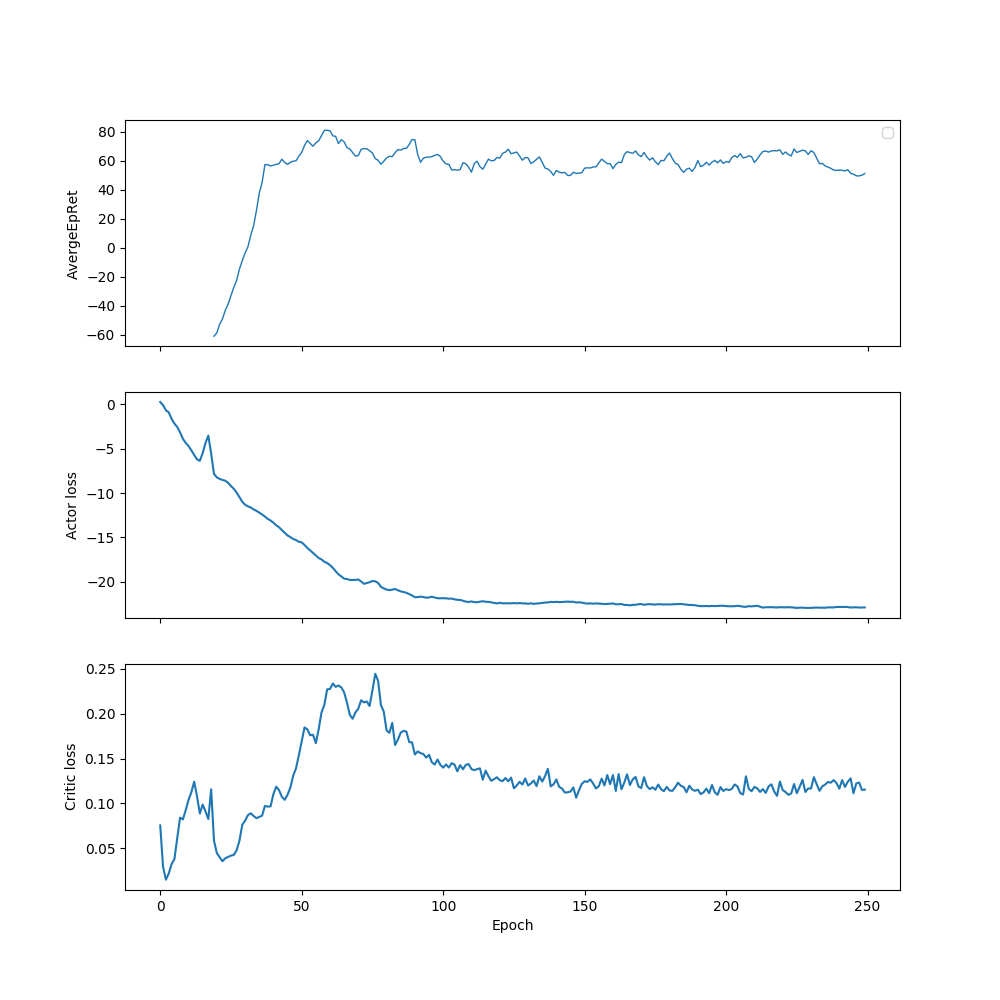

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


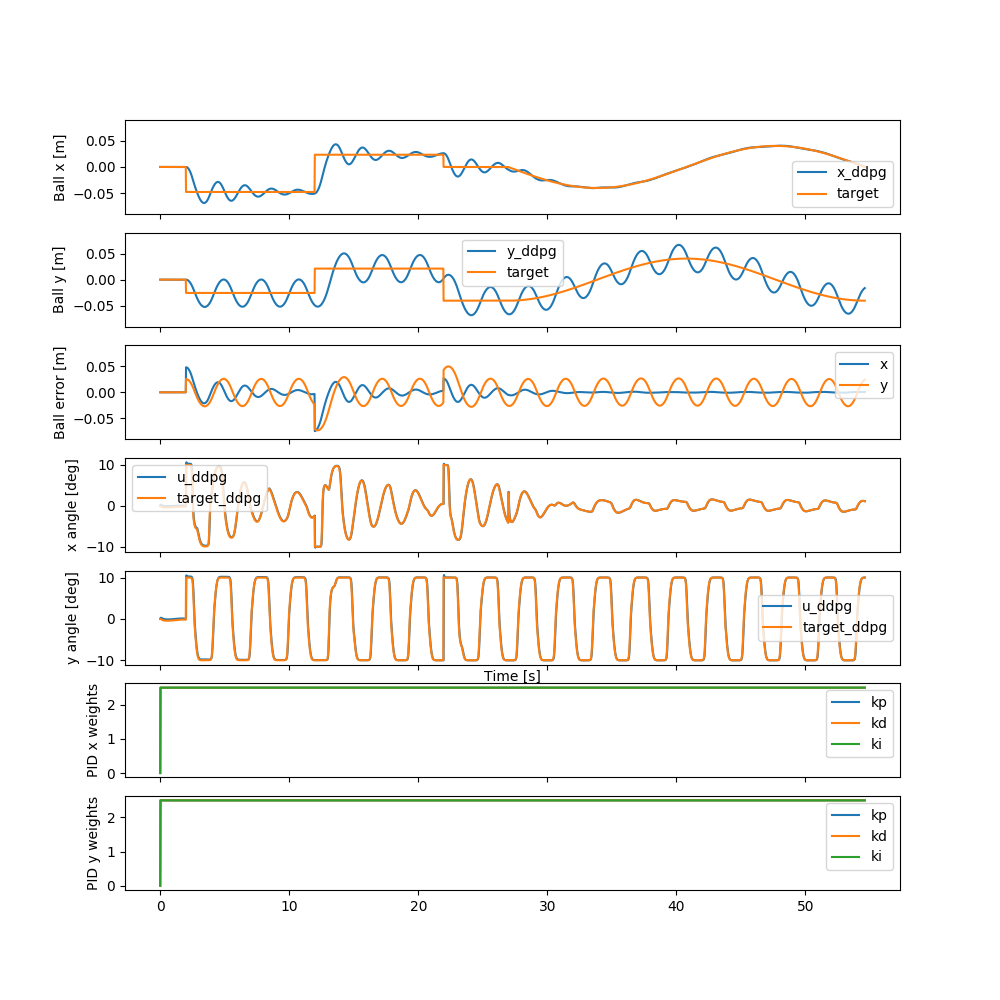

In [37]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [38]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [200,100]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[200,100]_sigmoid_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[200,100]_sigmoid_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            200,
            100
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa1ae5400>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[200,100]_sigmoid_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[200,100]_sigmoid_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |            42.5 |
|          StdEpRet |            79.6 |
|          MaxEpRet |             152 |
|          MinEpRet |           -34.5 |
|  AverageTestEpRet |            38.3 |
|      StdTestEpRet |            35.7 |
|      MaxTestEpRet |             110 |
|      MinTestEpRet |           -4.99 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.18 |
|          StdQVals |            2.44 |
|          MaxQVals |            8.04 |
|          MinQVals |           -8.18 |
|            LossPi |           -3.48 |
|             LossQ |          0.0111 |
|              Time |            91.5 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |             -76 |
|          StdEpRet |            47.8 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |             178 |
|          StdEpRet |            30.4 |
|          MaxEpRet |             208 |
|          MinEpRet |             148 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |            47.3 |
|      MaxTestEpRet |             215 |
|      MinTestEpRet |            12.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            15.2 |
|          StdQVals |            6.52 |
|          MaxQVals |            24.4 |
|          MinQVals |           -18.5 |
|            LossPi |           -15.5 |
|             LossQ |          0.0885 |
|              Time |             239 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             119 |
|          StdEpRet |            10.5 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             212 |
|          StdEpRet |            5.66 |
|          MaxEpRet |             217 |
|          MinEpRet |             204 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |             100 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |            -148 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            27.6 |
|          StdQVals |            8.64 |
|          MaxQVals |              39 |
|          MinQVals |           -21.9 |
|            LossPi |           -27.9 |
|             LossQ |           0.112 |
|              Time |             387 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             160 |
|          StdEpRet |            36.9 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             179 |
|          StdEpRet |            28.4 |
|          MaxEpRet |             218 |
|          MinEpRet |             152 |
|  AverageTestEpRet |             114 |
|      StdTestEpRet |             159 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |            -325 |
|             EpLen |             400 |
|         TestEpLen |             392 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            40.4 |
|          StdQVals |            10.2 |
|          MaxQVals |            52.1 |
|          MinQVals |             -13 |
|            LossPi |           -40.8 |
|             LossQ |            0.11 |
|              Time |             534 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             198 |
|          StdEpRet |            55.4 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |           -67.3 |
|          StdEpRet |             183 |
|          MaxEpRet |             116 |
|          MinEpRet |            -250 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |             119 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |           -86.1 |
|             EpLen |             400 |
|         TestEpLen |             345 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            47.5 |
|          StdQVals |            11.7 |
|          MaxQVals |            59.1 |
|          MinQVals |             -11 |
|            LossPi |           -47.8 |
|             LossQ |           0.107 |
|              Time |             679 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             189 |
|          StdEpRet |            47.5 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             101 |
|          StdEpRet |             191 |
|          MaxEpRet |             252 |
|          MinEpRet |            -168 |
|  AverageTestEpRet |             121 |
|      StdTestEpRet |             123 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |            -130 |
|             EpLen |             400 |
|         TestEpLen |             352 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            53.2 |
|          StdQVals |            11.6 |
|          MaxQVals |            63.5 |
|          MinQVals |           -13.4 |
|            LossPi |           -53.5 |
|             LossQ |          0.0832 |
|              Time |             824 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             213 |
|          StdEpRet |            33.3 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             194 |
|          StdEpRet |            36.5 |
|          MaxEpRet |             245 |
|          MinEpRet |             163 |
|  AverageTestEpRet |             134 |
|      StdTestEpRet |             114 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |            -135 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |              56 |
|          StdQVals |            12.4 |
|          MaxQVals |            66.4 |
|          MinQVals |           -12.3 |
|            LossPi |           -56.3 |
|             LossQ |           0.109 |
|              Time |             974 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |            66.2 |
|          StdEpRet |             119 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             128 |
|          StdEpRet |            15.6 |
|          MaxEpRet |             143 |
|          MinEpRet |             112 |
|  AverageTestEpRet |             172 |
|      StdTestEpRet |            91.4 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |            -104 |
|             EpLen |             400 |
|         TestEpLen |             375 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            58.3 |
|          StdQVals |            12.4 |
|          MaxQVals |              68 |
|          MinQVals |           -4.94 |
|            LossPi |           -58.6 |
|             LossQ |          0.0929 |
|              Time |        1.12e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             214 |
|          StdEpRet |            52.4 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             125 |
|          StdEpRet |             126 |
|          MaxEpRet |             217 |
|          MinEpRet |           -53.8 |
|  AverageTestEpRet |             180 |
|      StdTestEpRet |            62.7 |
|      MaxTestEpRet |             269 |
|      MinTestEpRet |           -50.7 |
|             EpLen |             303 |
|         TestEpLen |             384 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            60.2 |
|          StdQVals |            12.7 |
|          MaxQVals |            69.6 |
|          MinQVals |           -11.1 |
|            LossPi |           -60.5 |
|             LossQ |          0.0967 |
|              Time |        1.27e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             245 |
|          StdEpRet |            12.2 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             189 |
|          StdEpRet |            42.3 |
|          MaxEpRet |             224 |
|          MinEpRet |             129 |
|  AverageTestEpRet |             181 |
|      StdTestEpRet |            57.1 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |           -20.3 |
|             EpLen |             400 |
|         TestEpLen |             384 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            61.4 |
|          StdQVals |            12.4 |
|          MaxQVals |            70.3 |
|          MinQVals |           -10.7 |
|            LossPi |           -61.7 |
|             LossQ |          0.0862 |
|              Time |        1.42e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             211 |
|          StdEpRet |            45.6 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             202 |
|          StdEpRet |              38 |
|          MaxEpRet |             252 |
|          MinEpRet |             160 |
|  AverageTestEpRet |             204 |
|      StdTestEpRet |            30.8 |
|      MaxTestEpRet |             265 |
|      MinTestEpRet |             136 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            62.2 |
|          StdQVals |            12.1 |
|          MaxQVals |            70.4 |
|          MinQVals |           -9.48 |
|            LossPi |           -62.4 |
|             LossQ |          0.0888 |
|              Time |        1.56e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             233 |
|          StdEpRet |            35.4 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             211 |
|          StdEpRet |            28.5 |
|          MaxEpRet |             248 |
|          MinEpRet |             178 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            60.3 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |           -11.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            62.7 |
|          StdQVals |              12 |
|          MaxQVals |            70.8 |
|          MinQVals |           -11.3 |
|            LossPi |           -62.9 |
|             LossQ |          0.0955 |
|              Time |        1.71e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             234 |
|          StdEpRet |            18.3 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             222 |
|          StdEpRet |              22 |
|          MaxEpRet |             254 |
|          MinEpRet |             206 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            31.2 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |             146 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |              63 |
|          StdQVals |            12.2 |
|          MaxQVals |            70.9 |
|          MinQVals |            -9.7 |
|            LossPi |           -63.2 |
|             LossQ |          0.0744 |
|              Time |        1.86e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             227 |
|          StdEpRet |            28.7 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             173 |
|          StdEpRet |             123 |
|          MaxEpRet |             262 |
|          MinEpRet |           -1.53 |
|  AverageTestEpRet |             199 |
|      StdTestEpRet |            34.2 |
|      MaxTestEpRet |             271 |
|      MinTestEpRet |             146 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            63.2 |
|          StdQVals |            12.5 |
|          MaxQVals |            71.3 |
|          MinQVals |           -8.93 |
|            LossPi |           -63.4 |
|             LossQ |          0.0774 |
|              Time |           2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             215 |
|          StdEpRet |            29.5 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             202 |
|          StdEpRet |            25.8 |
|          MaxEpRet |             223 |
|          MinEpRet |             166 |
|  AverageTestEpRet |             185 |
|      StdTestEpRet |            47.4 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |            85.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            63.7 |
|          StdQVals |            12.4 |
|          MaxQVals |            71.5 |
|          MinQVals |           -10.2 |
|            LossPi |           -63.9 |
|             LossQ |          0.0777 |
|              Time |        2.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             191 |
|          StdEpRet |            46.4 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             230 |
|          StdEpRet |            17.4 |
|          MaxEpRet |             250 |
|          MinEpRet |             207 |
|  AverageTestEpRet |             178 |
|      StdTestEpRet |            78.5 |
|      MaxTestEpRet |             266 |
|      MinTestEpRet |           -59.4 |
|             EpLen |             400 |
|         TestEpLen |             388 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |              64 |
|          StdQVals |            12.3 |
|          MaxQVals |            71.3 |
|          MinQVals |           -9.33 |
|            LossPi |           -64.2 |
|             LossQ |          0.0794 |
|              Time |         2.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             186 |
|          StdEpRet |            23.6 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             177 |
|          StdEpRet |            63.6 |
|          MaxEpRet |             223 |
|          MinEpRet |            86.8 |
|  AverageTestEpRet |             209 |
|      StdTestEpRet |            43.1 |
|      MaxTestEpRet |             277 |
|      MinTestEpRet |            88.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            64.1 |
|          StdQVals |            12.1 |
|          MaxQVals |            71.2 |
|          MinQVals |             -12 |
|            LossPi |           -64.3 |
|             LossQ |            0.07 |
|              Time |        2.45e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             206 |
|          StdEpRet |            29.8 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             168 |
|          StdEpRet |            9.21 |
|          MaxEpRet |             175 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             192 |
|      StdTestEpRet |            73.4 |
|      MaxTestEpRet |             265 |
|      MinTestEpRet |           -83.8 |
|             EpLen |             400 |
|         TestEpLen |             386 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            64.4 |
|          StdQVals |            11.7 |
|          MaxQVals |            71.2 |
|          MinQVals |            -7.2 |
|            LossPi |           -64.6 |
|             LossQ |          0.0828 |
|              Time |         2.6e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             207 |
|          StdEpRet |            43.9 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             156 |
|          StdEpRet |            55.4 |
|          MaxEpRet |             223 |
|          MinEpRet |            86.9 |
|  AverageTestEpRet |             216 |
|      StdTestEpRet |            41.2 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |             147 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            64.6 |
|          StdQVals |            11.6 |
|          MaxQVals |            71.2 |
|          MinQVals |           -11.4 |
|            LossPi |           -64.8 |
|             LossQ |          0.0725 |
|              Time |        2.74e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             204 |
|          StdEpRet |           0.992 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             226 |
|          StdEpRet |            2.94 |
|          MaxEpRet |             231 |
|          MinEpRet |             224 |
|  AverageTestEpRet |             201 |
|      StdTestEpRet |            31.4 |
|      MaxTestEpRet |             252 |
|      MinTestEpRet |             134 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            64.8 |
|          StdQVals |            11.7 |
|          MaxQVals |            71.9 |
|          MinQVals |             -13 |
|            LossPi |             -65 |
|             LossQ |          0.0797 |
|              Time |        2.89e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             208 |
|          StdEpRet |            37.9 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             187 |
|          StdEpRet |            20.3 |
|          MaxEpRet |             212 |
|          MinEpRet |             162 |
|  AverageTestEpRet |             202 |
|      StdTestEpRet |            26.4 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |             163 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            65.3 |
|          StdQVals |            11.5 |
|          MaxQVals |            72.1 |
|          MinQVals |           -8.57 |
|            LossPi |           -65.5 |
|             LossQ |          0.0809 |
|              Time |        3.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             196 |
|          StdEpRet |            12.1 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             199 |
|          StdEpRet |            13.2 |
|          MaxEpRet |             213 |
|          MinEpRet |             181 |
|  AverageTestEpRet |             221 |
|      StdTestEpRet |            45.4 |
|      MaxTestEpRet |             273 |
|      MinTestEpRet |             113 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            65.6 |
|          StdQVals |            11.6 |
|          MaxQVals |            72.4 |
|          MinQVals |           -9.71 |
|            LossPi |           -65.7 |
|             LossQ |          0.0801 |
|              Time |        3.19e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             213 |
|          StdEpRet |            18.7 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             214 |
|          StdEpRet |            36.3 |
|          MaxEpRet |             253 |
|          MinEpRet |             166 |
|  AverageTestEpRet |             216 |
|      StdTestEpRet |            34.5 |
|      MaxTestEpRet |             266 |
|      MinTestEpRet |             152 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            65.8 |
|          StdQVals |            11.6 |
|          MaxQVals |            72.7 |
|          MinQVals |           -5.68 |
|            LossPi |             -66 |
|             LossQ |          0.0742 |
|              Time |        3.33e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             212 |
|          StdEpRet |            25.3 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             206 |
|          StdEpRet |            19.8 |
|          MaxEpRet |             233 |
|          MinEpRet |             187 |
|  AverageTestEpRet |             216 |
|      StdTestEpRet |              31 |
|      MaxTestEpRet |             267 |
|      MinTestEpRet |             144 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            65.9 |
|          StdQVals |            11.5 |
|          MaxQVals |            72.5 |
|          MinQVals |           -10.5 |
|            LossPi |           -66.1 |
|             LossQ |          0.0795 |
|              Time |        3.48e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             194 |
|          StdEpRet |            14.5 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             197 |
|          StdEpRet |            28.7 |
|          MaxEpRet |             226 |
|          MinEpRet |             158 |
|  AverageTestEpRet |             220 |
|      StdTestEpRet |            30.5 |
|      MaxTestEpRet |             279 |
|      MinTestEpRet |             163 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            66.1 |
|          StdQVals |            11.6 |
|          MaxQVals |            72.7 |
|          MinQVals |           -7.64 |
|            LossPi |           -66.3 |
|             LossQ |           0.082 |
|              Time |        3.63e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             222 |
|          StdEpRet |            35.6 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0001423801662058556


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


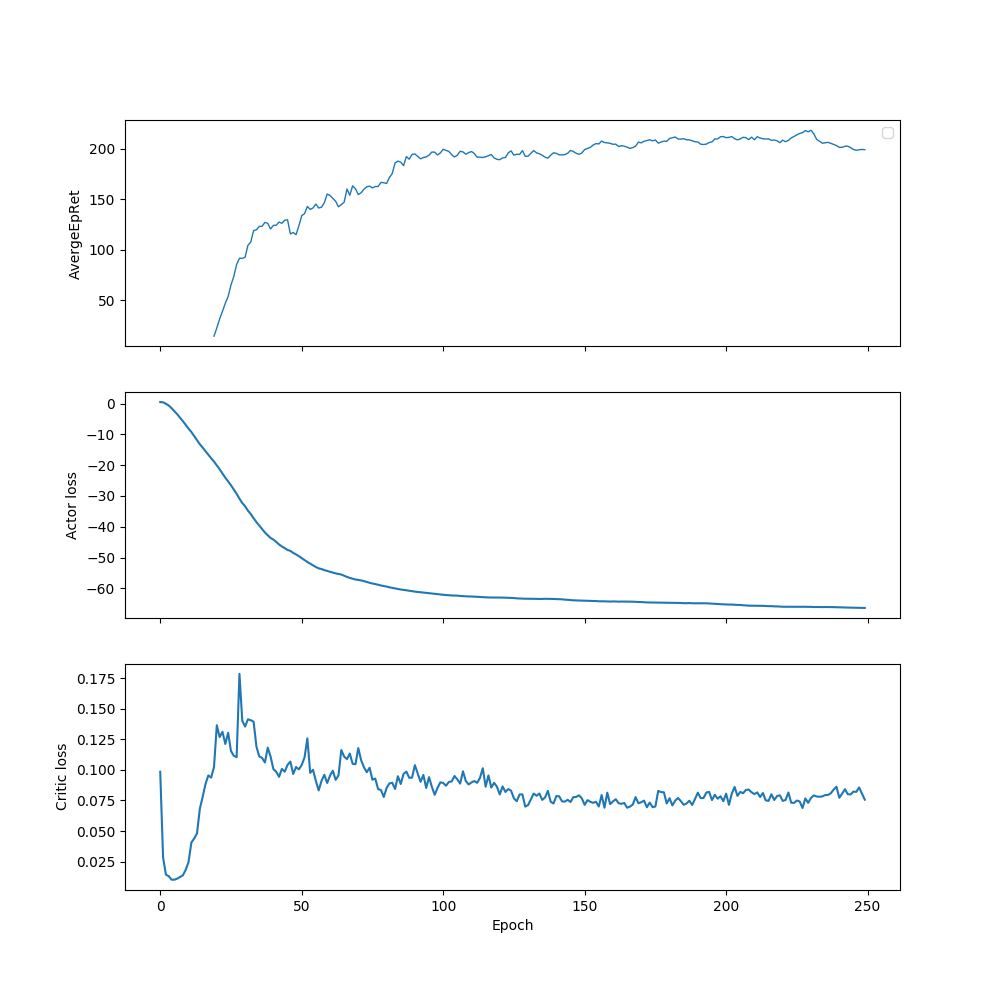

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


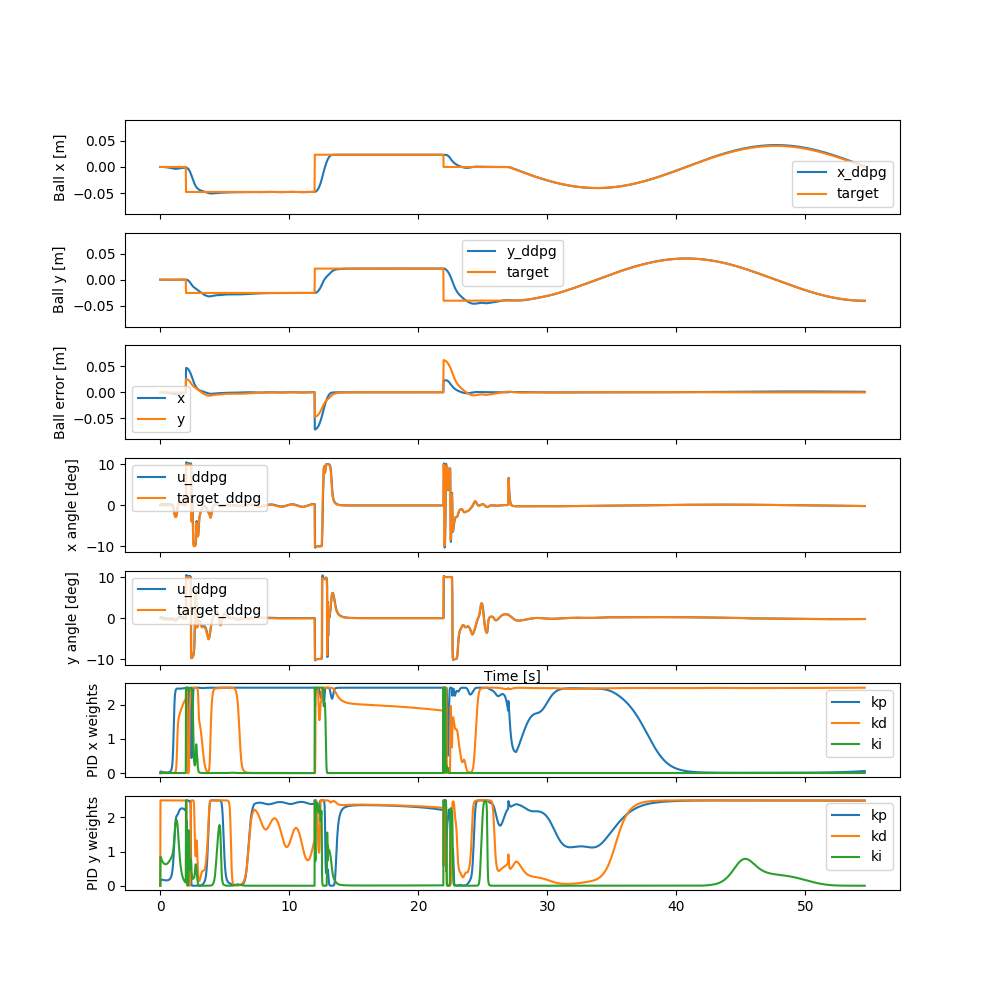

In [39]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [40]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [100,50,25]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[100,50,25]_sigmoid_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[100,50,25]_sigmoid_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            100,
            50,
            25
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa1877d68>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[100,50,25]_sigmoid_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[100,50,25]_sigmoid_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
  

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -5.01 |
|          StdEpRet |            89.3 |
|          MaxEpRet |             118 |
|          MinEpRet |           -91.2 |
|  AverageTestEpRet |            54.7 |
|      StdTestEpRet |              32 |
|      MaxTestEpRet |             128 |
|      MinTestEpRet |           -1.01 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            2.24 |
|          StdQVals |            3.37 |
|          MaxQVals |            7.04 |
|          MinQVals |           -10.5 |
|            LossPi |           -2.58 |
|             LossQ |            0.02 |
|              Time |            71.1 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -64.1 |
|          StdEpRet |            66.8 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            15.8 |
|          StdEpRet |            26.8 |
|          MaxEpRet |            42.6 |
|          MinEpRet |             -11 |
|  AverageTestEpRet |            61.5 |
|      StdTestEpRet |            59.8 |
|      MaxTestEpRet |             262 |
|      MinTestEpRet |           0.438 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            7.48 |
|          StdQVals |            4.81 |
|          MaxQVals |            13.5 |
|          MinQVals |           -15.7 |
|            LossPi |           -7.61 |
|             LossQ |          0.0279 |
|              Time |             187 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            82.8 |
|          StdEpRet |            10.3 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            30.5 |
|          StdEpRet |            11.3 |
|          MaxEpRet |            46.4 |
|          MinEpRet |            21.3 |
|  AverageTestEpRet |              57 |
|      StdTestEpRet |            56.6 |
|      MaxTestEpRet |             242 |
|      MinTestEpRet |          0.0583 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            11.9 |
|          StdQVals |            7.49 |
|          MaxQVals |              21 |
|          MinQVals |           -23.8 |
|            LossPi |           -12.1 |
|             LossQ |           0.112 |
|              Time |             308 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |            81.4 |
|          StdEpRet |            56.2 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |            66.2 |
|          StdEpRet |            26.1 |
|          MaxEpRet |            92.3 |
|          MinEpRet |            40.1 |
|  AverageTestEpRet |            86.1 |
|      StdTestEpRet |            70.7 |
|      MaxTestEpRet |             292 |
|      MinTestEpRet |            5.74 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            14.7 |
|          StdQVals |               8 |
|          MaxQVals |            25.8 |
|          MinQVals |           -27.2 |
|            LossPi |           -14.8 |
|             LossQ |           0.166 |
|              Time |             475 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |            73.5 |
|          StdEpRet |            69.5 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |            68.5 |
|          StdEpRet |            43.5 |
|          MaxEpRet |             126 |
|          MinEpRet |            20.9 |
|  AverageTestEpRet |            65.1 |
|      StdTestEpRet |            55.3 |
|      MaxTestEpRet |             188 |
|      MinTestEpRet |            4.48 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            17.1 |
|          StdQVals |             8.9 |
|          MaxQVals |            29.8 |
|          MinQVals |           -26.6 |
|            LossPi |           -17.1 |
|             LossQ |           0.176 |
|              Time |             643 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             130 |
|          StdEpRet |            95.2 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |            11.8 |
|          StdEpRet |            4.09 |
|          MaxEpRet |            15.9 |
|          MinEpRet |            7.67 |
|  AverageTestEpRet |            69.2 |
|      StdTestEpRet |            65.5 |
|      MaxTestEpRet |             242 |
|      MinTestEpRet |            -9.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |              18 |
|          StdQVals |            9.97 |
|          MaxQVals |              34 |
|          MinQVals |             -27 |
|            LossPi |             -18 |
|             LossQ |           0.208 |
|              Time |             780 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |            59.8 |
|          StdEpRet |            18.1 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |            53.3 |
|          StdEpRet |            36.5 |
|          MaxEpRet |             105 |
|          MinEpRet |              24 |
|  AverageTestEpRet |              49 |
|      StdTestEpRet |            40.5 |
|      MaxTestEpRet |             173 |
|      MinTestEpRet |            3.24 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            19.2 |
|          StdQVals |            10.3 |
|          MaxQVals |              38 |
|          MinQVals |           -26.6 |
|            LossPi |           -19.2 |
|             LossQ |           0.208 |
|              Time |             917 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |            31.5 |
|          StdEpRet |            31.2 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |            5.66 |
|          StdEpRet |            1.97 |
|          MaxEpRet |            7.62 |
|          MinEpRet |            3.69 |
|  AverageTestEpRet |            78.3 |
|      StdTestEpRet |              50 |
|      MaxTestEpRet |             173 |
|      MinTestEpRet |            2.17 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            20.2 |
|          StdQVals |            11.1 |
|          MaxQVals |            42.5 |
|          MinQVals |           -24.7 |
|            LossPi |           -20.2 |
|             LossQ |           0.179 |
|              Time |        1.05e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             142 |
|          StdEpRet |            50.2 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |            94.4 |
|          StdEpRet |            47.2 |
|          MaxEpRet |             157 |
|          MinEpRet |            42.5 |
|  AverageTestEpRet |            78.6 |
|      StdTestEpRet |            69.3 |
|      MaxTestEpRet |             265 |
|      MinTestEpRet |            5.86 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            21.2 |
|          StdQVals |              12 |
|          MaxQVals |            45.5 |
|          MinQVals |           -22.5 |
|            LossPi |           -21.2 |
|             LossQ |           0.175 |
|              Time |        1.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |            42.5 |
|          StdEpRet |            49.6 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             182 |
|          StdEpRet |            12.1 |
|          MaxEpRet |             194 |
|          MinEpRet |             170 |
|  AverageTestEpRet |            64.6 |
|      StdTestEpRet |              53 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |            7.72 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            22.1 |
|          StdQVals |            12.6 |
|          MaxQVals |            48.7 |
|          MinQVals |           -22.4 |
|            LossPi |           -22.1 |
|             LossQ |            0.19 |
|              Time |         1.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |            36.6 |
|          StdEpRet |            11.4 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             157 |
|          StdEpRet |              51 |
|          MaxEpRet |             221 |
|          MinEpRet |            96.1 |
|  AverageTestEpRet |            59.9 |
|      StdTestEpRet |            54.6 |
|      MaxTestEpRet |             253 |
|      MinTestEpRet |            9.73 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            22.8 |
|          StdQVals |            13.3 |
|          MaxQVals |            51.6 |
|          MinQVals |           -23.3 |
|            LossPi |           -22.8 |
|             LossQ |           0.162 |
|              Time |        1.42e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             108 |
|          StdEpRet |            68.9 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |            12.5 |
|          StdEpRet |            3.47 |
|          MaxEpRet |              16 |
|          MinEpRet |            9.02 |
|  AverageTestEpRet |            59.1 |
|      StdTestEpRet |            51.1 |
|      MaxTestEpRet |             215 |
|      MinTestEpRet |           -10.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |              23 |
|          StdQVals |            14.1 |
|          MaxQVals |            54.1 |
|          MinQVals |           -25.6 |
|            LossPi |             -23 |
|             LossQ |           0.174 |
|              Time |        1.55e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |            54.6 |
|          StdEpRet |            42.9 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |            17.6 |
|          StdEpRet |            10.8 |
|          MaxEpRet |            30.2 |
|          MinEpRet |            3.77 |
|  AverageTestEpRet |              75 |
|      StdTestEpRet |            56.3 |
|      MaxTestEpRet |             196 |
|      MinTestEpRet |            2.23 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            22.9 |
|          StdQVals |            13.9 |
|          MaxQVals |            55.9 |
|          MinQVals |           -27.3 |
|            LossPi |           -22.9 |
|             LossQ |           0.172 |
|              Time |        1.67e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |            25.4 |
|          StdEpRet |            14.8 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |            43.5 |
|          StdEpRet |               9 |
|          MaxEpRet |            52.5 |
|          MinEpRet |            34.5 |
|  AverageTestEpRet |            61.7 |
|      StdTestEpRet |            61.3 |
|      MaxTestEpRet |             242 |
|      MinTestEpRet |            3.62 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            22.9 |
|          StdQVals |            14.2 |
|          MaxQVals |            57.5 |
|          MinQVals |           -28.2 |
|            LossPi |           -22.9 |
|             LossQ |           0.183 |
|              Time |        1.79e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             155 |
|          StdEpRet |            55.2 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |            64.2 |
|          StdEpRet |              29 |
|          MaxEpRet |             105 |
|          MinEpRet |            38.2 |
|  AverageTestEpRet |            65.4 |
|      StdTestEpRet |            52.4 |
|      MaxTestEpRet |             206 |
|      MinTestEpRet |           -1.44 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            23.5 |
|          StdQVals |            14.5 |
|          MaxQVals |              59 |
|          MinQVals |           -28.8 |
|            LossPi |           -23.5 |
|             LossQ |           0.201 |
|              Time |        1.91e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |            49.7 |
|          StdEpRet |            38.6 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |            44.1 |
|          StdEpRet |            13.8 |
|          MaxEpRet |            57.9 |
|          MinEpRet |            30.3 |
|  AverageTestEpRet |              38 |
|      StdTestEpRet |            24.7 |
|      MaxTestEpRet |            82.3 |
|      MinTestEpRet |            -9.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            24.5 |
|          StdQVals |            14.6 |
|          MaxQVals |              60 |
|          MinQVals |           -29.2 |
|            LossPi |           -24.6 |
|             LossQ |           0.181 |
|              Time |        2.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |            32.2 |
|          StdEpRet |              20 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |            69.4 |
|          StdEpRet |            58.1 |
|          MaxEpRet |             151 |
|          MinEpRet |            25.5 |
|  AverageTestEpRet |              72 |
|      StdTestEpRet |            54.2 |
|      MaxTestEpRet |             215 |
|      MinTestEpRet |            13.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            24.2 |
|          StdQVals |            14.2 |
|          MaxQVals |            60.4 |
|          MinQVals |           -29.4 |
|            LossPi |           -24.3 |
|             LossQ |           0.163 |
|              Time |        2.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             154 |
|          StdEpRet |            72.9 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             117 |
|          StdEpRet |              57 |
|          MaxEpRet |             174 |
|          MinEpRet |            60.3 |
|  AverageTestEpRet |            59.7 |
|      StdTestEpRet |              42 |
|      MaxTestEpRet |             159 |
|      MinTestEpRet |            2.99 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            23.8 |
|          StdQVals |            13.9 |
|          MaxQVals |            61.2 |
|          MinQVals |           -28.7 |
|            LossPi |           -23.8 |
|             LossQ |           0.163 |
|              Time |        2.28e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |              60 |
|          StdEpRet |            39.8 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |            25.7 |
|          StdEpRet |            7.67 |
|          MaxEpRet |            36.2 |
|          MinEpRet |            18.1 |
|  AverageTestEpRet |              68 |
|      StdTestEpRet |            62.9 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |            1.25 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            23.7 |
|          StdQVals |            13.9 |
|          MaxQVals |            61.5 |
|          MinQVals |           -28.8 |
|            LossPi |           -23.7 |
|             LossQ |           0.162 |
|              Time |        2.41e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |            41.5 |
|          StdEpRet |            17.1 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |              91 |
|          StdEpRet |              36 |
|          MaxEpRet |             127 |
|          MinEpRet |              55 |
|  AverageTestEpRet |            61.9 |
|      StdTestEpRet |            48.4 |
|      MaxTestEpRet |             195 |
|      MinTestEpRet |           -1.11 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            23.8 |
|          StdQVals |              14 |
|          MaxQVals |            61.6 |
|          MinQVals |           -28.8 |
|            LossPi |           -23.8 |
|             LossQ |           0.155 |
|              Time |        2.53e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |              35 |
|          StdEpRet |            12.3 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |            61.9 |
|          StdEpRet |            52.4 |
|          MaxEpRet |             129 |
|          MinEpRet |            1.61 |
|  AverageTestEpRet |            59.6 |
|      StdTestEpRet |            49.5 |
|      MaxTestEpRet |             203 |
|      MinTestEpRet |            1.68 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            24.3 |
|          StdQVals |            14.2 |
|          MaxQVals |            63.3 |
|          MinQVals |           -29.1 |
|            LossPi |           -24.3 |
|             LossQ |           0.142 |
|              Time |        2.65e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |            20.4 |
|          StdEpRet |            7.29 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |            66.1 |
|          StdEpRet |            35.3 |
|          MaxEpRet |             101 |
|          MinEpRet |            30.8 |
|  AverageTestEpRet |            63.6 |
|      StdTestEpRet |            41.1 |
|      MaxTestEpRet |             171 |
|      MinTestEpRet |            11.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            24.7 |
|          StdQVals |            14.6 |
|          MaxQVals |            63.3 |
|          MinQVals |           -29.7 |
|            LossPi |           -24.8 |
|             LossQ |           0.144 |
|              Time |        2.78e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |              49 |
|          StdEpRet |            7.51 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |            46.2 |
|          StdEpRet |            27.7 |
|          MaxEpRet |              81 |
|          MinEpRet |            13.1 |
|  AverageTestEpRet |            53.5 |
|      StdTestEpRet |            43.6 |
|      MaxTestEpRet |             184 |
|      MinTestEpRet |             1.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            24.8 |
|          StdQVals |            14.7 |
|          MaxQVals |            63.5 |
|          MinQVals |           -29.8 |
|            LossPi |           -24.8 |
|             LossQ |           0.143 |
|              Time |         2.9e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |            57.3 |
|          StdEpRet |            67.1 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |            68.5 |
|          StdEpRet |            38.4 |
|          MaxEpRet |             107 |
|          MinEpRet |            30.1 |
|  AverageTestEpRet |            66.2 |
|      StdTestEpRet |            65.8 |
|      MaxTestEpRet |             225 |
|      MinTestEpRet |            -9.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            24.7 |
|          StdQVals |            14.8 |
|          MaxQVals |            63.9 |
|          MinQVals |           -30.6 |
|            LossPi |           -24.7 |
|             LossQ |           0.147 |
|              Time |        3.03e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |            90.8 |
|          StdEpRet |            31.6 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |            41.2 |
|          StdEpRet |            10.4 |
|          MaxEpRet |            53.4 |
|          MinEpRet |              28 |
|  AverageTestEpRet |            72.3 |
|      StdTestEpRet |            57.3 |
|      MaxTestEpRet |             225 |
|      MinTestEpRet |            17.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            24.5 |
|          StdQVals |            14.8 |
|          MaxQVals |              64 |
|          MinQVals |             -31 |
|            LossPi |           -24.5 |
|             LossQ |           0.144 |
|              Time |        3.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |            75.4 |
|          StdEpRet |            63.3 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0005559473115806549


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


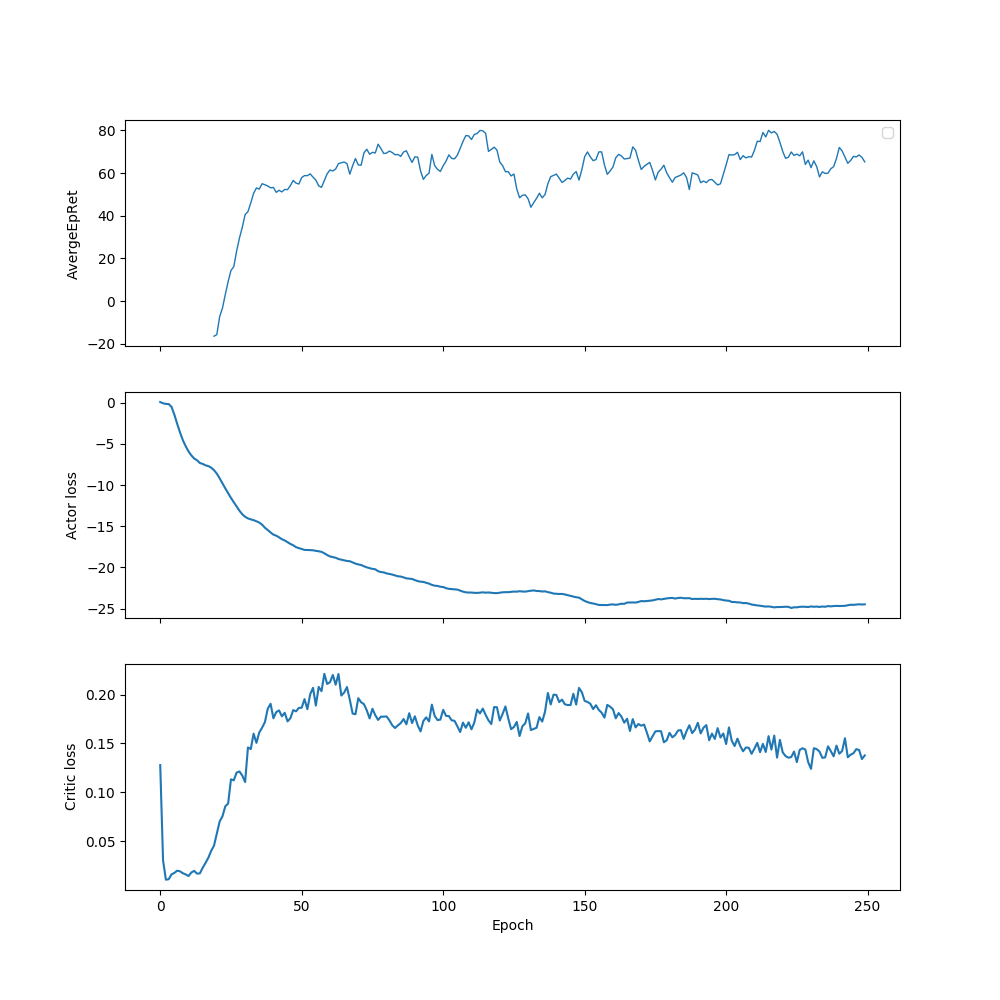

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


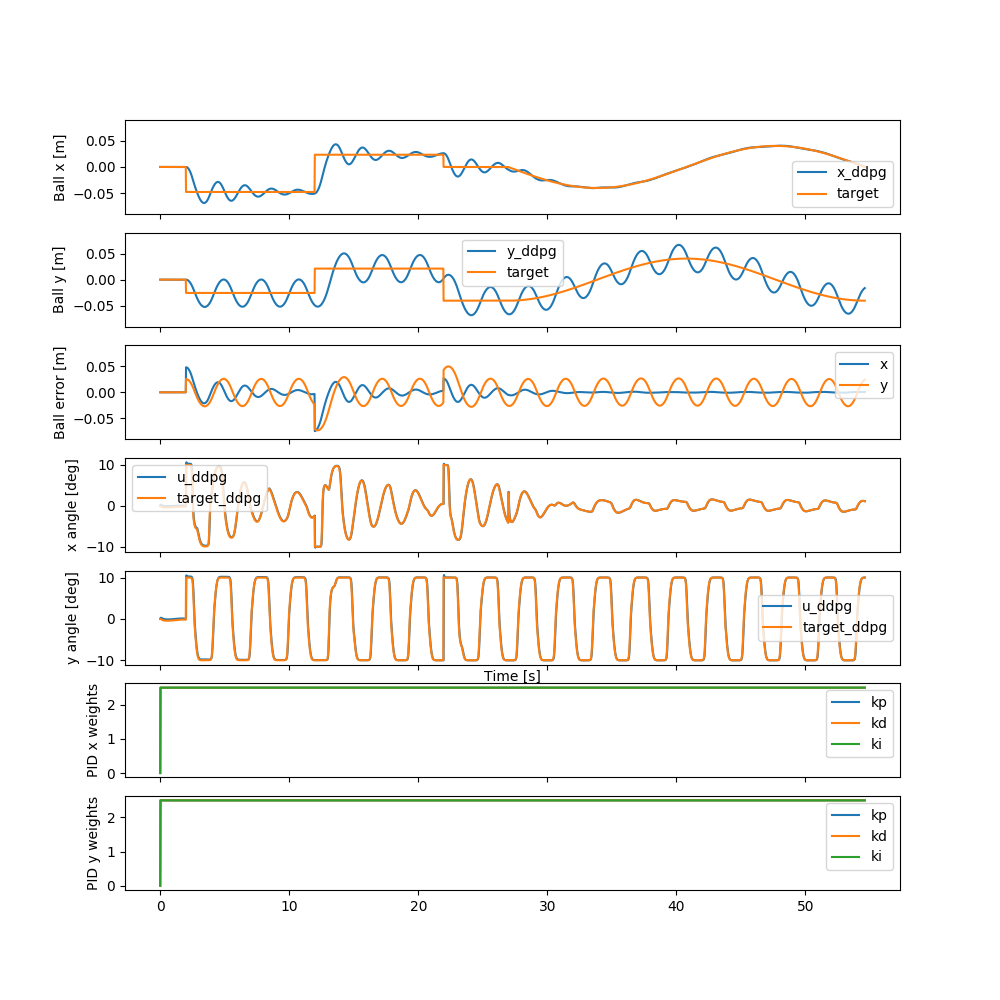

In [41]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [42]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [50,50,25]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[50,50,25]_sigmoid_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[50,50,25]_sigmoid_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            50,
            50,
            25
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa1593b00>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[50,50,25]_sigmoid_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[50,50,25]_sigmoid_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
      

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |            -5.3 |
|          StdEpRet |            69.5 |
|          MaxEpRet |            67.5 |
|          MinEpRet |             -99 |
|  AverageTestEpRet |           -22.6 |
|      StdTestEpRet |            82.6 |
|      MaxTestEpRet |             205 |
|      MinTestEpRet |            -132 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.92 |
|          StdQVals |            2.66 |
|          MaxQVals |            9.01 |
|          MinQVals |           -7.97 |
|            LossPi |           -4.31 |
|             LossQ |          0.0167 |
|              Time |            65.9 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -48.7 |
|          StdEpRet |              38 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            56.7 |
|          StdEpRet |            4.68 |
|          MaxEpRet |            61.4 |
|          MinEpRet |              52 |
|  AverageTestEpRet |            46.4 |
|      StdTestEpRet |            64.4 |
|      MaxTestEpRet |             194 |
|      MinTestEpRet |             -59 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            11.3 |
|          StdQVals |            5.51 |
|          MaxQVals |            20.1 |
|          MinQVals |           -12.5 |
|            LossPi |           -11.5 |
|             LossQ |          0.0567 |
|              Time |             176 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            56.1 |
|          StdEpRet |            79.6 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            95.2 |
|          StdEpRet |            88.6 |
|          MaxEpRet |             216 |
|          MinEpRet |            5.51 |
|  AverageTestEpRet |           -4.46 |
|      StdTestEpRet |             139 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |            -334 |
|             EpLen |             400 |
|         TestEpLen |             366 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            21.7 |
|          StdQVals |            6.61 |
|          MaxQVals |            29.1 |
|          MinQVals |           -10.6 |
|            LossPi |           -22.1 |
|             LossQ |           0.118 |
|              Time |             289 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |            37.8 |
|          StdEpRet |             121 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             159 |
|          StdEpRet |            18.7 |
|          MaxEpRet |             178 |
|          MinEpRet |             141 |
|  AverageTestEpRet |            99.3 |
|      StdTestEpRet |             119 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            -190 |
|             EpLen |             400 |
|         TestEpLen |             394 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            30.5 |
|          StdQVals |            8.75 |
|          MaxQVals |            40.4 |
|          MinQVals |           -6.91 |
|            LossPi |           -30.9 |
|             LossQ |           0.151 |
|              Time |             398 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             128 |
|          StdEpRet |            75.3 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             203 |
|          StdEpRet |            9.59 |
|          MaxEpRet |             215 |
|          MinEpRet |             192 |
|  AverageTestEpRet |             180 |
|      StdTestEpRet |            74.5 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |           -68.9 |
|             EpLen |             400 |
|         TestEpLen |             386 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            38.5 |
|          StdQVals |            11.3 |
|          MaxQVals |            49.9 |
|          MinQVals |           -5.76 |
|            LossPi |           -38.8 |
|             LossQ |           0.215 |
|              Time |             505 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             148 |
|          StdEpRet |            28.7 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             210 |
|          StdEpRet |           0.264 |
|          MaxEpRet |             210 |
|          MinEpRet |             209 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |            77.4 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |           -93.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |              46 |
|          StdQVals |            11.2 |
|          MaxQVals |            56.3 |
|          MinQVals |            2.07 |
|            LossPi |           -46.3 |
|             LossQ |           0.159 |
|              Time |             614 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             228 |
|          StdEpRet |            13.4 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             188 |
|          StdEpRet |              41 |
|          MaxEpRet |             238 |
|          MinEpRet |             138 |
|  AverageTestEpRet |             190 |
|      StdTestEpRet |            34.1 |
|      MaxTestEpRet |             237 |
|      MinTestEpRet |            77.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            50.9 |
|          StdQVals |            11.9 |
|          MaxQVals |            61.4 |
|          MinQVals |           -2.18 |
|            LossPi |           -51.2 |
|             LossQ |           0.173 |
|              Time |             718 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             191 |
|          StdEpRet |            22.2 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             128 |
|          StdEpRet |            28.8 |
|          MaxEpRet |             157 |
|          MinEpRet |            98.9 |
|  AverageTestEpRet |             171 |
|      StdTestEpRet |            41.3 |
|      MaxTestEpRet |             239 |
|      MinTestEpRet |            91.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            54.2 |
|          StdQVals |            12.4 |
|          MaxQVals |            64.8 |
|          MinQVals |           -7.38 |
|            LossPi |           -54.4 |
|             LossQ |           0.141 |
|              Time |             827 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             189 |
|          StdEpRet |            31.1 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             225 |
|          StdEpRet |            29.4 |
|          MaxEpRet |             266 |
|          MinEpRet |             200 |
|  AverageTestEpRet |             215 |
|      StdTestEpRet |            33.5 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |             155 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            56.8 |
|          StdQVals |            12.5 |
|          MaxQVals |            67.4 |
|          MinQVals |           -8.13 |
|            LossPi |           -57.1 |
|             LossQ |           0.142 |
|              Time |             936 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             216 |
|          StdEpRet |            11.8 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             212 |
|          StdEpRet |            1.25 |
|          MaxEpRet |             213 |
|          MinEpRet |             211 |
|  AverageTestEpRet |             197 |
|      StdTestEpRet |            42.2 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |            94.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            58.7 |
|          StdQVals |            12.6 |
|          MaxQVals |            68.8 |
|          MinQVals |           -5.27 |
|            LossPi |           -58.9 |
|             LossQ |           0.148 |
|              Time |        1.05e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             249 |
|          StdEpRet |            12.8 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             228 |
|          StdEpRet |            26.1 |
|          MaxEpRet |             265 |
|          MinEpRet |             206 |
|  AverageTestEpRet |             194 |
|      StdTestEpRet |            51.2 |
|      MaxTestEpRet |             267 |
|      MinTestEpRet |            13.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |              60 |
|          StdQVals |            12.5 |
|          MaxQVals |            69.5 |
|          MinQVals |           -7.61 |
|            LossPi |           -60.2 |
|             LossQ |           0.125 |
|              Time |        1.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             226 |
|          StdEpRet |            32.7 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |            62.3 |
|          StdEpRet |             229 |
|          MaxEpRet |             226 |
|          MinEpRet |            -262 |
|  AverageTestEpRet |             192 |
|      StdTestEpRet |            64.5 |
|      MaxTestEpRet |             282 |
|      MinTestEpRet |           -42.1 |
|             EpLen |             365 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            60.5 |
|          StdQVals |            12.9 |
|          MaxQVals |            70.1 |
|          MinQVals |           -4.46 |
|            LossPi |           -60.7 |
|             LossQ |            0.14 |
|              Time |        1.27e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             206 |
|          StdEpRet |              16 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             170 |
|          StdEpRet |            8.18 |
|          MaxEpRet |             180 |
|          MinEpRet |             160 |
|  AverageTestEpRet |             182 |
|      StdTestEpRet |              41 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |             108 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            61.5 |
|          StdQVals |            12.9 |
|          MaxQVals |              71 |
|          MinQVals |           -20.7 |
|            LossPi |           -61.7 |
|             LossQ |            0.15 |
|              Time |        1.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             219 |
|          StdEpRet |            47.2 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             171 |
|          StdEpRet |            49.9 |
|          MaxEpRet |             220 |
|          MinEpRet |             121 |
|  AverageTestEpRet |             181 |
|      StdTestEpRet |              39 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |            92.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            62.4 |
|          StdQVals |            12.9 |
|          MaxQVals |            71.1 |
|          MinQVals |           -24.6 |
|            LossPi |           -62.6 |
|             LossQ |           0.165 |
|              Time |        1.49e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             224 |
|          StdEpRet |              49 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             147 |
|          StdEpRet |            53.4 |
|          MaxEpRet |             214 |
|          MinEpRet |              83 |
|  AverageTestEpRet |             211 |
|      StdTestEpRet |            49.2 |
|      MaxTestEpRet |             277 |
|      MinTestEpRet |            89.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            62.8 |
|          StdQVals |            12.7 |
|          MaxQVals |            71.5 |
|          MinQVals |           -17.1 |
|            LossPi |             -63 |
|             LossQ |           0.155 |
|              Time |         1.6e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             192 |
|          StdEpRet |            45.9 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             173 |
|          StdEpRet |              42 |
|          MaxEpRet |             215 |
|          MinEpRet |             131 |
|  AverageTestEpRet |             211 |
|      StdTestEpRet |            35.3 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |             141 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |              63 |
|          StdQVals |              13 |
|          MaxQVals |            72.3 |
|          MinQVals |             -14 |
|            LossPi |           -63.1 |
|             LossQ |           0.164 |
|              Time |        1.71e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             172 |
|          StdEpRet |            49.7 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             229 |
|          StdEpRet |            8.23 |
|          MaxEpRet |             239 |
|          MinEpRet |             219 |
|  AverageTestEpRet |             185 |
|      StdTestEpRet |            39.8 |
|      MaxTestEpRet |             265 |
|      MinTestEpRet |             123 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            63.2 |
|          StdQVals |              13 |
|          MaxQVals |            73.1 |
|          MinQVals |           -16.8 |
|            LossPi |           -63.4 |
|             LossQ |           0.144 |
|              Time |        1.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             169 |
|          StdEpRet |            16.1 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             186 |
|          StdEpRet |            51.8 |
|          MaxEpRet |             238 |
|          MinEpRet |             135 |
|  AverageTestEpRet |             201 |
|      StdTestEpRet |              76 |
|      MaxTestEpRet |             277 |
|      MinTestEpRet |           -90.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            63.2 |
|          StdQVals |            13.5 |
|          MaxQVals |            72.9 |
|          MinQVals |           -17.3 |
|            LossPi |           -63.4 |
|             LossQ |           0.146 |
|              Time |        1.93e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             248 |
|          StdEpRet |            16.8 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             260 |
|          StdEpRet |            1.77 |
|          MaxEpRet |             262 |
|          MinEpRet |             257 |
|  AverageTestEpRet |             181 |
|      StdTestEpRet |            78.6 |
|      MaxTestEpRet |             273 |
|      MinTestEpRet |           -98.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            63.9 |
|          StdQVals |            13.2 |
|          MaxQVals |            73.3 |
|          MinQVals |           -21.6 |
|            LossPi |             -64 |
|             LossQ |           0.142 |
|              Time |        2.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             214 |
|          StdEpRet |            37.2 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             196 |
|          StdEpRet |            30.6 |
|          MaxEpRet |             226 |
|          MinEpRet |             165 |
|  AverageTestEpRet |             205 |
|      StdTestEpRet |            41.5 |
|      MaxTestEpRet |             288 |
|      MinTestEpRet |            86.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            64.3 |
|          StdQVals |            13.1 |
|          MaxQVals |            73.9 |
|          MinQVals |           -22.6 |
|            LossPi |           -64.4 |
|             LossQ |           0.155 |
|              Time |        2.14e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             207 |
|          StdEpRet |            24.3 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             227 |
|          StdEpRet |              29 |
|          MaxEpRet |             259 |
|          MinEpRet |             189 |
|  AverageTestEpRet |             196 |
|      StdTestEpRet |            63.4 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |           -8.53 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            64.2 |
|          StdQVals |              13 |
|          MaxQVals |            73.4 |
|          MinQVals |           -19.4 |
|            LossPi |           -64.3 |
|             LossQ |           0.131 |
|              Time |        2.25e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             189 |
|          StdEpRet |            44.3 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             221 |
|          StdEpRet |            28.8 |
|          MaxEpRet |             250 |
|          MinEpRet |             192 |
|  AverageTestEpRet |             215 |
|      StdTestEpRet |            35.3 |
|      MaxTestEpRet |             267 |
|      MinTestEpRet |             152 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            64.1 |
|          StdQVals |            13.2 |
|          MaxQVals |            72.5 |
|          MinQVals |             -21 |
|            LossPi |           -64.3 |
|             LossQ |           0.126 |
|              Time |        2.37e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             197 |
|          StdEpRet |            13.9 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             226 |
|          StdEpRet |            40.4 |
|          MaxEpRet |             283 |
|          MinEpRet |             197 |
|  AverageTestEpRet |             225 |
|      StdTestEpRet |            38.2 |
|      MaxTestEpRet |             273 |
|      MinTestEpRet |             146 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            64.2 |
|          StdQVals |            13.2 |
|          MaxQVals |            72.5 |
|          MinQVals |           -29.7 |
|            LossPi |           -64.4 |
|             LossQ |           0.119 |
|              Time |        2.47e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             229 |
|          StdEpRet |            20.9 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             183 |
|          StdEpRet |            3.13 |
|          MaxEpRet |             187 |
|          MinEpRet |             180 |
|  AverageTestEpRet |             208 |
|      StdTestEpRet |            33.9 |
|      MaxTestEpRet |             278 |
|      MinTestEpRet |             165 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            64.5 |
|          StdQVals |            13.1 |
|          MaxQVals |            72.9 |
|          MinQVals |           -38.1 |
|            LossPi |           -64.7 |
|             LossQ |           0.109 |
|              Time |        2.59e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             201 |
|          StdEpRet |            31.1 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             201 |
|          StdEpRet |            21.2 |
|          MaxEpRet |             225 |
|          MinEpRet |             173 |
|  AverageTestEpRet |             227 |
|      StdTestEpRet |            31.3 |
|      MaxTestEpRet |             267 |
|      MinTestEpRet |             157 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            64.9 |
|          StdQVals |              13 |
|          MaxQVals |            73.5 |
|          MinQVals |           -39.4 |
|            LossPi |             -65 |
|             LossQ |           0.118 |
|              Time |         2.7e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             236 |
|          StdEpRet |            18.4 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0001626487122136108


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


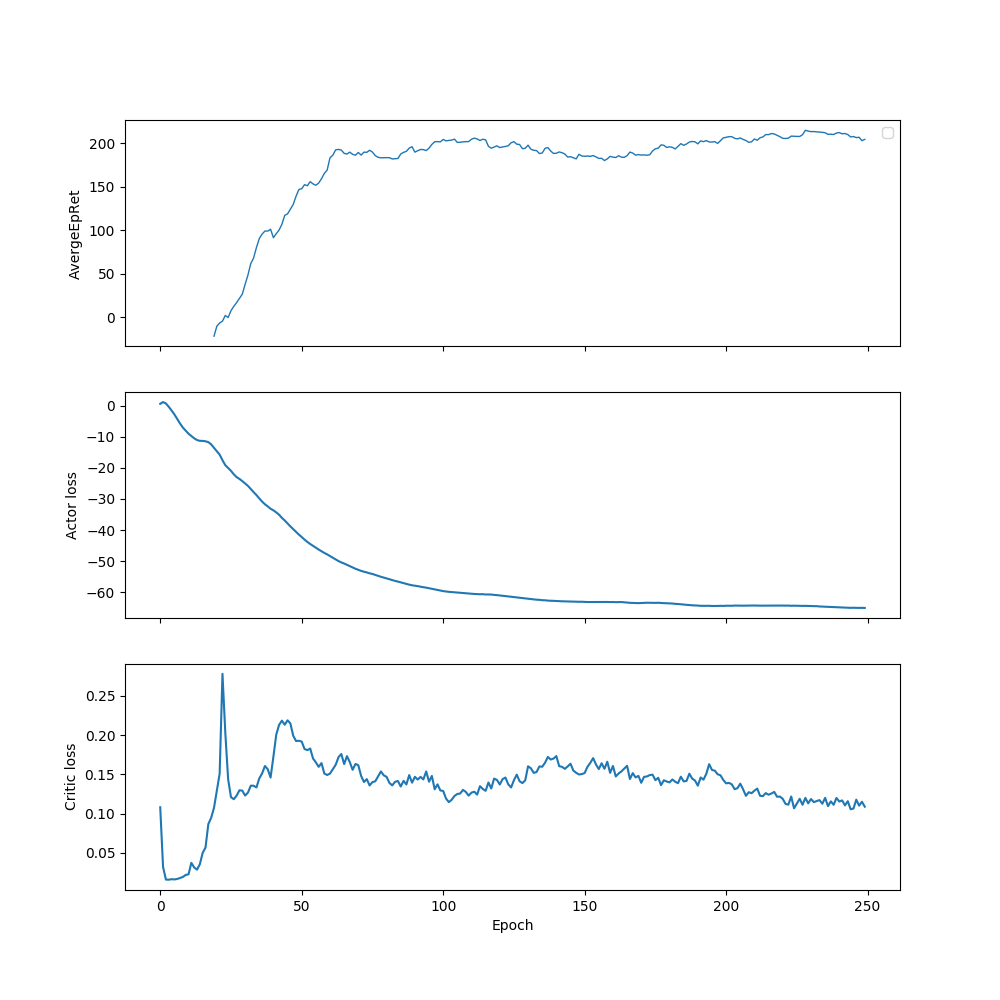

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


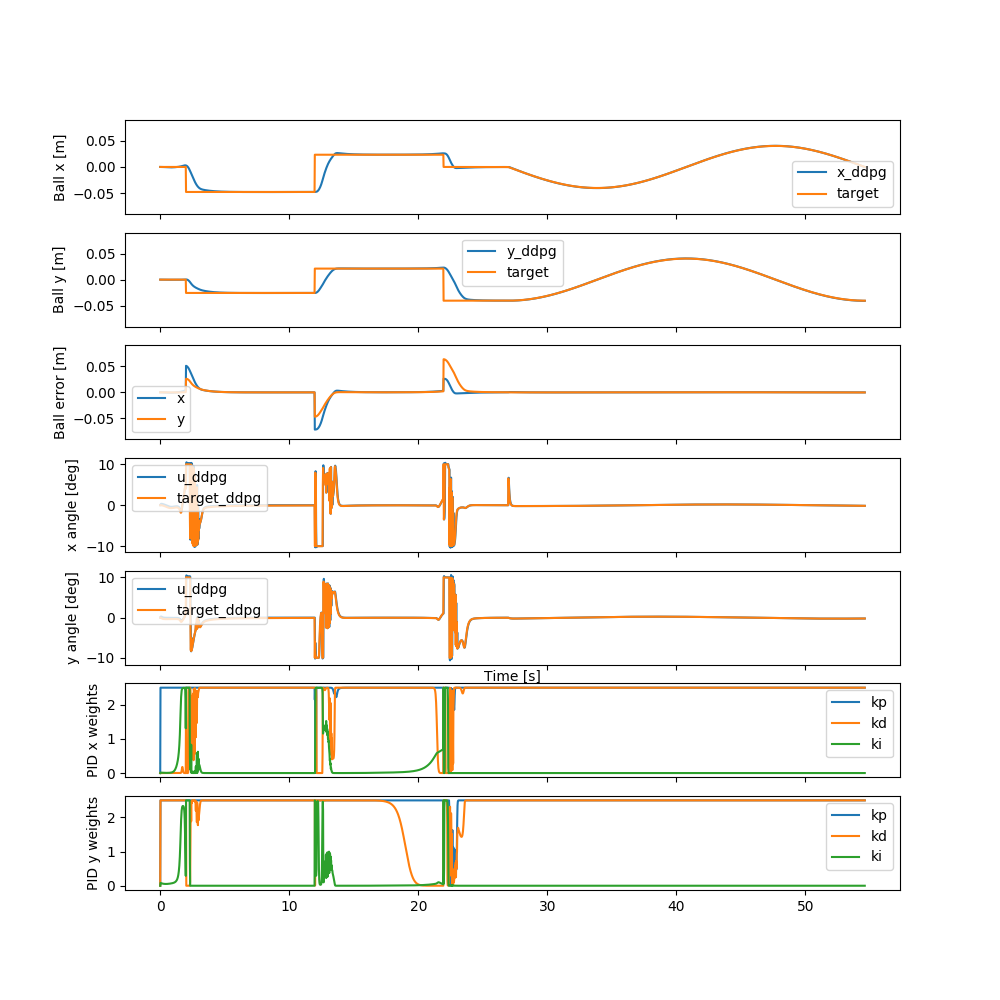

In [43]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [44]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [200,100,50]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[200,100,50]_sigmoid_0.99'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[200,100,50]_sigmoid_0.99/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            200,
            100,
            50
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f3fa1332e80>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[200,100,50]_sigmoid_0.99",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[200,100,50]_sigmoid_0.99/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -41.3 |
|          StdEpRet |            55.7 |
|          MaxEpRet |            29.6 |
|          MinEpRet |            -107 |
|  AverageTestEpRet |            43.2 |
|      StdTestEpRet |              48 |
|      MaxTestEpRet |             121 |
|      MinTestEpRet |           -18.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.85 |
|          StdQVals |            3.26 |
|          MaxQVals |              10 |
|          MinQVals |           -9.92 |
|            LossPi |           -4.28 |
|             LossQ |          0.0133 |
|              Time |             104 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |            -104 |
|          StdEpRet |            37.3 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |             160 |
|          StdEpRet |            44.1 |
|          MaxEpRet |             205 |
|          MinEpRet |             116 |
|  AverageTestEpRet |            87.1 |
|      StdTestEpRet |            90.7 |
|      MaxTestEpRet |             203 |
|      MinTestEpRet |           -92.7 |
|             EpLen |             400 |
|         TestEpLen |             359 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            13.6 |
|          StdQVals |            6.05 |
|          MaxQVals |            22.8 |
|          MinQVals |           -12.6 |
|            LossPi |           -13.9 |
|             LossQ |          0.0476 |
|              Time |             282 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             189 |
|          StdEpRet |            30.1 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             208 |
|          StdEpRet |            19.4 |
|          MaxEpRet |             228 |
|          MinEpRet |             189 |
|  AverageTestEpRet |             114 |
|      StdTestEpRet |             108 |
|      MaxTestEpRet |             244 |
|      MinTestEpRet |             -74 |
|             EpLen |             400 |
|         TestEpLen |             355 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            24.7 |
|          StdQVals |            10.1 |
|          MaxQVals |            36.4 |
|          MinQVals |           -12.6 |
|            LossPi |             -25 |
|             LossQ |           0.134 |
|              Time |             455 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             191 |
|          StdEpRet |            19.5 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             156 |
|          StdEpRet |            45.7 |
|          MaxEpRet |             202 |
|          MinEpRet |             111 |
|  AverageTestEpRet |             113 |
|      StdTestEpRet |             117 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |            -123 |
|             EpLen |             400 |
|         TestEpLen |             385 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            37.1 |
|          StdQVals |            10.8 |
|          MaxQVals |            47.9 |
|          MinQVals |           -12.2 |
|            LossPi |           -37.5 |
|             LossQ |            0.11 |
|              Time |             630 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             162 |
|          StdEpRet |            16.1 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             132 |
|          StdEpRet |            15.8 |
|          MaxEpRet |             154 |
|          MinEpRet |             119 |
|  AverageTestEpRet |             200 |
|      StdTestEpRet |            45.2 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |             113 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            46.2 |
|          StdQVals |            11.4 |
|          MaxQVals |            56.7 |
|          MinQVals |           -3.57 |
|            LossPi |           -46.5 |
|             LossQ |            0.13 |
|              Time |             808 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             170 |
|          StdEpRet |            18.5 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             218 |
|          StdEpRet |            22.6 |
|          MaxEpRet |             236 |
|          MinEpRet |             186 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            77.8 |
|      MaxTestEpRet |             267 |
|      MinTestEpRet |           -44.4 |
|             EpLen |             400 |
|         TestEpLen |             385 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            52.1 |
|          StdQVals |            12.1 |
|          MaxQVals |            62.4 |
|          MinQVals |           -5.91 |
|            LossPi |           -52.4 |
|             LossQ |            0.12 |
|              Time |             981 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             185 |
|          StdEpRet |            15.3 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             195 |
|          StdEpRet |            21.9 |
|          MaxEpRet |             215 |
|          MinEpRet |             165 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            45.4 |
|      MaxTestEpRet |             271 |
|      MinTestEpRet |             123 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            56.4 |
|          StdQVals |            11.9 |
|          MaxQVals |            66.2 |
|          MinQVals |            1.42 |
|            LossPi |           -56.7 |
|             LossQ |           0.117 |
|              Time |        1.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             225 |
|          StdEpRet |            12.3 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             228 |
|          StdEpRet |              31 |
|          MaxEpRet |             260 |
|          MinEpRet |             186 |
|  AverageTestEpRet |             212 |
|      StdTestEpRet |            53.3 |
|      MaxTestEpRet |             286 |
|      MinTestEpRet |              81 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            58.9 |
|          StdQVals |            12.5 |
|          MaxQVals |            68.7 |
|          MinQVals |           -1.47 |
|            LossPi |           -59.2 |
|             LossQ |           0.122 |
|              Time |        1.33e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             203 |
|          StdEpRet |            25.7 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             159 |
|          StdEpRet |            70.7 |
|          MaxEpRet |             224 |
|          MinEpRet |            61.1 |
|  AverageTestEpRet |             198 |
|      StdTestEpRet |            92.1 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |            -166 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |              61 |
|          StdQVals |            12.2 |
|          MaxQVals |            70.4 |
|          MinQVals |           -4.02 |
|            LossPi |           -61.2 |
|             LossQ |           0.114 |
|              Time |        1.51e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             205 |
|          StdEpRet |            21.9 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             128 |
|          StdEpRet |             115 |
|          MaxEpRet |             242 |
|          MinEpRet |            12.6 |
|  AverageTestEpRet |             204 |
|      StdTestEpRet |              65 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |             -48 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            62.2 |
|          StdQVals |            12.5 |
|          MaxQVals |            71.1 |
|          MinQVals |           -5.48 |
|            LossPi |           -62.4 |
|             LossQ |          0.0986 |
|              Time |        1.69e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             240 |
|          StdEpRet |            4.91 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             230 |
|          StdEpRet |            7.02 |
|          MaxEpRet |             239 |
|          MinEpRet |             222 |
|  AverageTestEpRet |             215 |
|      StdTestEpRet |            52.6 |
|      MaxTestEpRet |             286 |
|      MinTestEpRet |            26.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            63.1 |
|          StdQVals |            12.4 |
|          MaxQVals |            71.5 |
|          MinQVals |           -4.26 |
|            LossPi |           -63.3 |
|             LossQ |          0.0847 |
|              Time |        1.87e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             233 |
|          StdEpRet |            14.5 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             226 |
|          StdEpRet |            10.1 |
|          MaxEpRet |             240 |
|          MinEpRet |             215 |
|  AverageTestEpRet |             229 |
|      StdTestEpRet |            33.7 |
|      MaxTestEpRet |             284 |
|      MinTestEpRet |             124 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |              64 |
|          StdQVals |            12.3 |
|          MaxQVals |              72 |
|          MinQVals |           -4.72 |
|            LossPi |           -64.2 |
|             LossQ |          0.0828 |
|              Time |        2.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             250 |
|          StdEpRet |            33.3 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             218 |
|          StdEpRet |            36.5 |
|          MaxEpRet |             268 |
|          MinEpRet |             181 |
|  AverageTestEpRet |             220 |
|      StdTestEpRet |            28.5 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |             155 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            64.6 |
|          StdQVals |            11.8 |
|          MaxQVals |            72.4 |
|          MinQVals |           -6.99 |
|            LossPi |           -64.8 |
|             LossQ |          0.0736 |
|              Time |        2.22e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             234 |
|          StdEpRet |            10.5 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             237 |
|          StdEpRet |            11.4 |
|          MaxEpRet |             253 |
|          MinEpRet |             228 |
|  AverageTestEpRet |             224 |
|      StdTestEpRet |            35.7 |
|      MaxTestEpRet |             282 |
|      MinTestEpRet |             128 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            65.2 |
|          StdQVals |            11.8 |
|          MaxQVals |            73.2 |
|          MinQVals |           -4.57 |
|            LossPi |           -65.4 |
|             LossQ |          0.0719 |
|              Time |         2.4e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             246 |
|          StdEpRet |            5.85 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             236 |
|          StdEpRet |            30.4 |
|          MaxEpRet |             268 |
|          MinEpRet |             195 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            46.2 |
|      MaxTestEpRet |             284 |
|      MinTestEpRet |            66.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            65.6 |
|          StdQVals |            11.8 |
|          MaxQVals |            73.2 |
|          MinQVals |             -10 |
|            LossPi |           -65.7 |
|             LossQ |          0.0733 |
|              Time |        2.58e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             213 |
|          StdEpRet |            17.3 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             201 |
|          StdEpRet |            27.9 |
|          MaxEpRet |             232 |
|          MinEpRet |             164 |
|  AverageTestEpRet |             226 |
|      StdTestEpRet |            37.3 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |             128 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            65.9 |
|          StdQVals |            11.8 |
|          MaxQVals |            73.6 |
|          MinQVals |           -11.3 |
|            LossPi |           -66.1 |
|             LossQ |          0.0731 |
|              Time |        2.75e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             215 |
|          StdEpRet |            15.1 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             137 |
|          StdEpRet |             138 |
|          MaxEpRet |             255 |
|          MinEpRet |           -56.1 |
|  AverageTestEpRet |             195 |
|      StdTestEpRet |            67.2 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |           -59.2 |
|             EpLen |             305 |
|         TestEpLen |             387 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |              66 |
|          StdQVals |              12 |
|          MaxQVals |            73.5 |
|          MinQVals |           -4.36 |
|            LossPi |           -66.2 |
|             LossQ |          0.0725 |
|              Time |        2.93e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             226 |
|          StdEpRet |            43.3 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             202 |
|          StdEpRet |            26.5 |
|          MaxEpRet |             234 |
|          MinEpRet |             169 |
|  AverageTestEpRet |             218 |
|      StdTestEpRet |            28.5 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |             179 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            66.4 |
|          StdQVals |            11.7 |
|          MaxQVals |            73.5 |
|          MinQVals |           -7.25 |
|            LossPi |           -66.6 |
|             LossQ |          0.0656 |
|              Time |        3.11e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             239 |
|          StdEpRet |            4.49 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             184 |
|          StdEpRet |            39.9 |
|          MaxEpRet |             222 |
|          MinEpRet |             129 |
|  AverageTestEpRet |             216 |
|      StdTestEpRet |            35.1 |
|      MaxTestEpRet |             277 |
|      MinTestEpRet |             136 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            66.5 |
|          StdQVals |            11.9 |
|          MaxQVals |            73.9 |
|          MinQVals |           -15.9 |
|            LossPi |           -66.6 |
|             LossQ |          0.0627 |
|              Time |        3.28e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             222 |
|          StdEpRet |            25.9 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             203 |
|          StdEpRet |            26.7 |
|          MaxEpRet |             237 |
|          MinEpRet |             172 |
|  AverageTestEpRet |             220 |
|      StdTestEpRet |            51.7 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |            27.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            66.7 |
|          StdQVals |            11.8 |
|          MaxQVals |            74.4 |
|          MinQVals |           -20.2 |
|            LossPi |           -66.8 |
|             LossQ |          0.0638 |
|              Time |        3.46e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             220 |
|          StdEpRet |            3.32 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             246 |
|          StdEpRet |            29.8 |
|          MaxEpRet |             283 |
|          MinEpRet |             210 |
|  AverageTestEpRet |             219 |
|      StdTestEpRet |            38.9 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |            96.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |              67 |
|          StdQVals |            11.8 |
|          MaxQVals |            74.5 |
|          MinQVals |           -16.8 |
|            LossPi |           -67.1 |
|             LossQ |          0.0631 |
|              Time |        3.63e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             249 |
|          StdEpRet |            13.1 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             199 |
|          StdEpRet |            41.2 |
|          MaxEpRet |             253 |
|          MinEpRet |             152 |
|  AverageTestEpRet |             222 |
|      StdTestEpRet |            73.8 |
|      MaxTestEpRet |             289 |
|      MinTestEpRet |           -46.4 |
|             EpLen |             400 |
|         TestEpLen |             384 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            67.6 |
|          StdQVals |            11.3 |
|          MaxQVals |            74.7 |
|          MinQVals |           -12.9 |
|            LossPi |           -67.7 |
|             LossQ |          0.0739 |
|              Time |        3.81e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             233 |
|          StdEpRet |            3.24 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             241 |
|          StdEpRet |            14.8 |
|          MaxEpRet |             258 |
|          MinEpRet |             222 |
|  AverageTestEpRet |             212 |
|      StdTestEpRet |            33.6 |
|      MaxTestEpRet |             279 |
|      MinTestEpRet |             129 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            67.8 |
|          StdQVals |            11.7 |
|          MaxQVals |            75.5 |
|          MinQVals |           -15.6 |
|            LossPi |             -68 |
|             LossQ |          0.0824 |
|              Time |        3.99e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             180 |
|          StdEpRet |            65.8 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             184 |
|          StdEpRet |            46.4 |
|          MaxEpRet |             231 |
|          MinEpRet |             138 |
|  AverageTestEpRet |             212 |
|      StdTestEpRet |            35.5 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |             108 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            67.9 |
|          StdQVals |            11.6 |
|          MaxQVals |              75 |
|          MinQVals |           -5.48 |
|            LossPi |           -68.1 |
|             LossQ |          0.0811 |
|              Time |        4.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             215 |
|          StdEpRet |            24.7 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             243 |
|          StdEpRet |            13.8 |
|          MaxEpRet |             259 |
|          MinEpRet |             225 |
|  AverageTestEpRet |             227 |
|      StdTestEpRet |            33.7 |
|      MaxTestEpRet |             271 |
|      MinTestEpRet |             155 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |              68 |
|          StdQVals |            11.4 |
|          MaxQVals |            74.7 |
|          MinQVals |           -13.6 |
|            LossPi |           -68.1 |
|             LossQ |          0.0846 |
|              Time |        4.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             243 |
|          StdEpRet |              29 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0001439045772731956


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


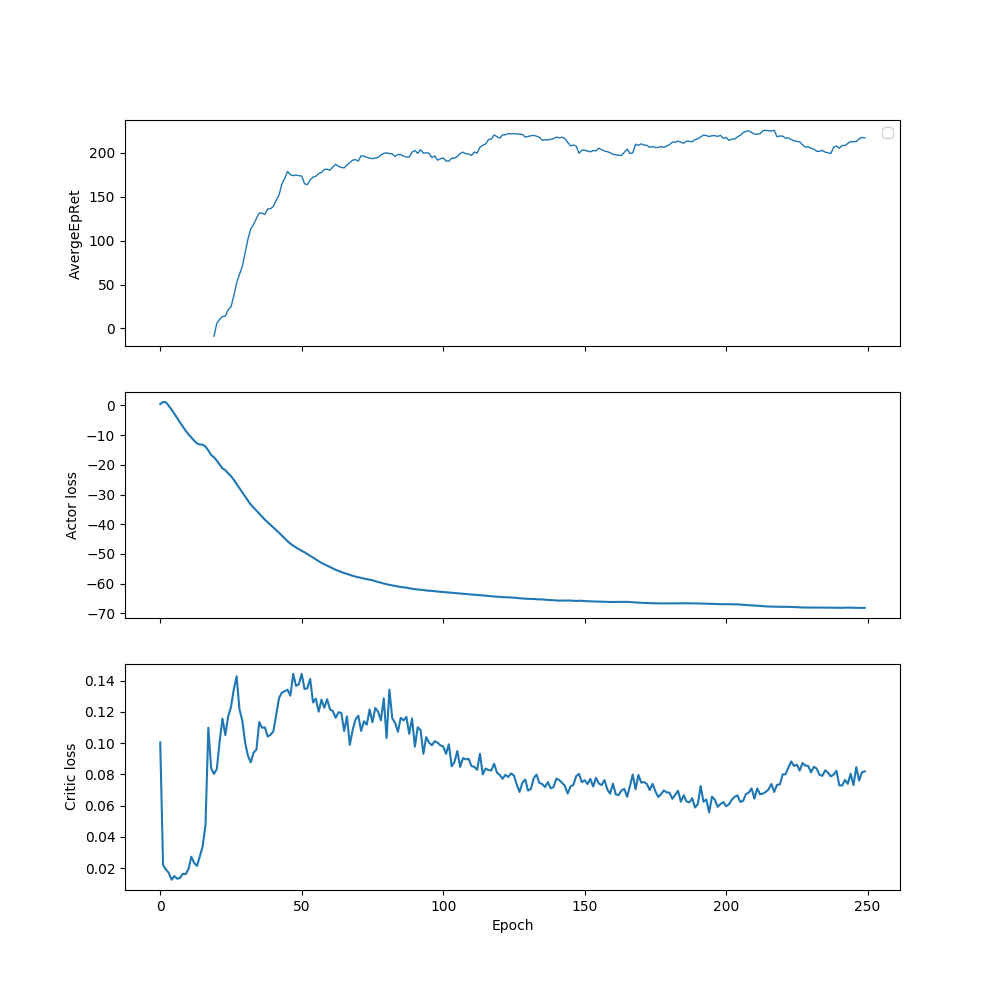

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


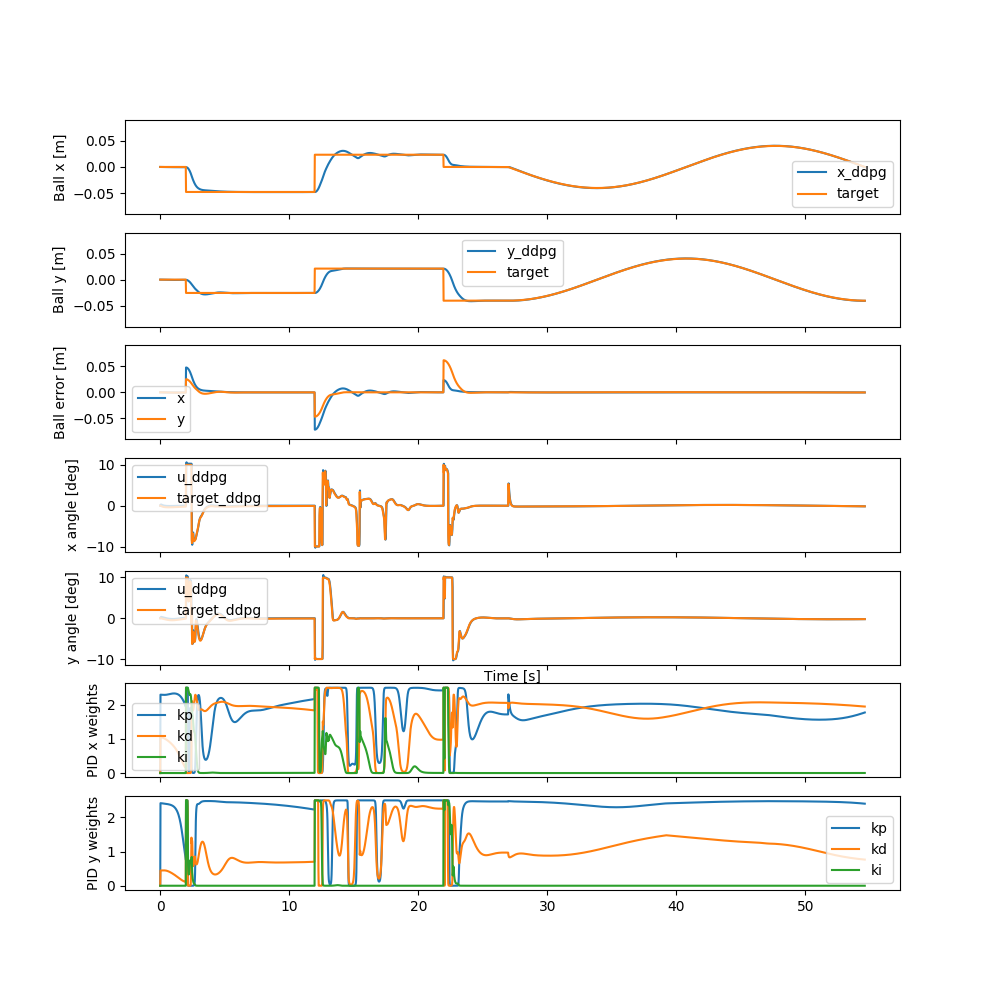

In [45]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [42]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = quadratic_e_reward_penality
w = 0.3
hidden_size = [100]
gamma = 0.99
act = torch.nn.Tanh
name='pep0.3_[100]_tanh_0.99'

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([-0.00765409,  0.06069467], dtype=float32), array([ 0.01487083, -0.04918933], dtype=float32), array([-0.00125245,  0.00242644], dtype=float32))
-0.0003186401912213778


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


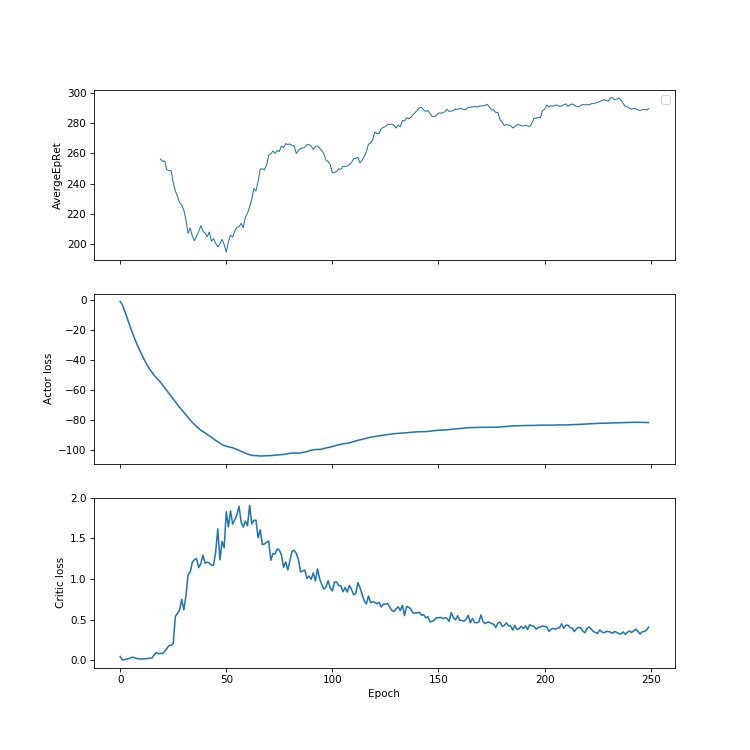

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


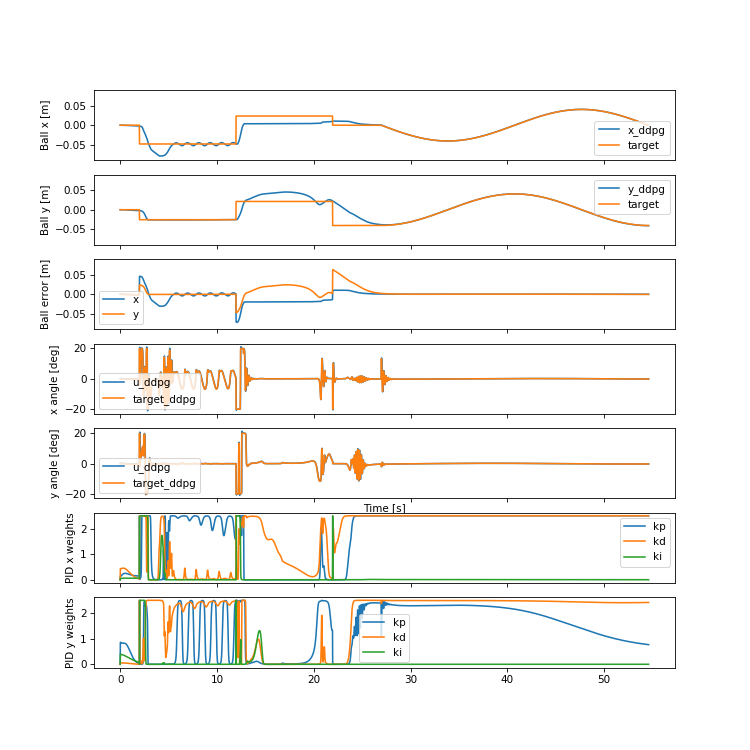

In [43]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [48]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_de_reward
w = 15
hidden_size = [100]
gamma = 0.99
act = torch.nn.Tanh
name='de15_[100]_tanh_0.99'

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([-0.00373839,  0.05592158], dtype=float32), array([ 0.02450035, -0.06809094], dtype=float32), array([ 0.00235041, -0.00291907], dtype=float32))
-0.0005630869775173455


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


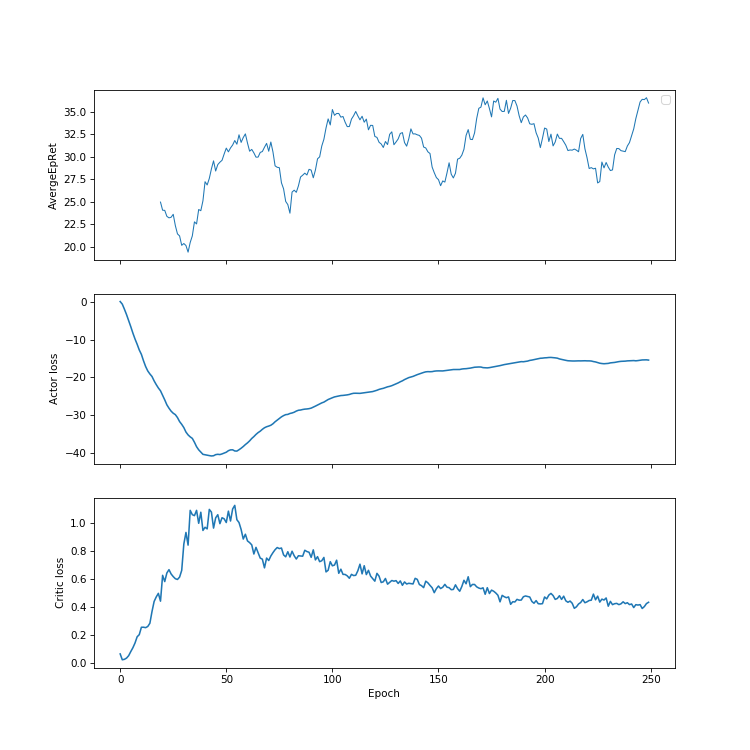

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


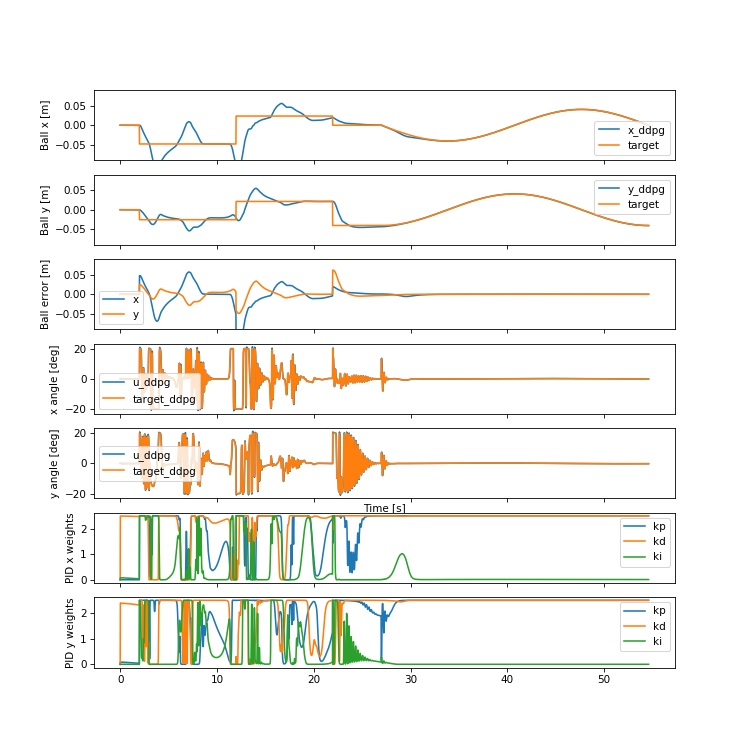

In [49]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [52]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.3
hidden_size = [100, 50]
gamma = 0.99
act = torch.nn.ReLU
name='le0.3_[100, 50]_relu_0.99'

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0.03359334, 0.04217907], dtype=float32), array([ 0.02262251, -0.03532873], dtype=float32), array([ 0.00115804, -0.00215583], dtype=float32))
-0.00013962961847682938


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


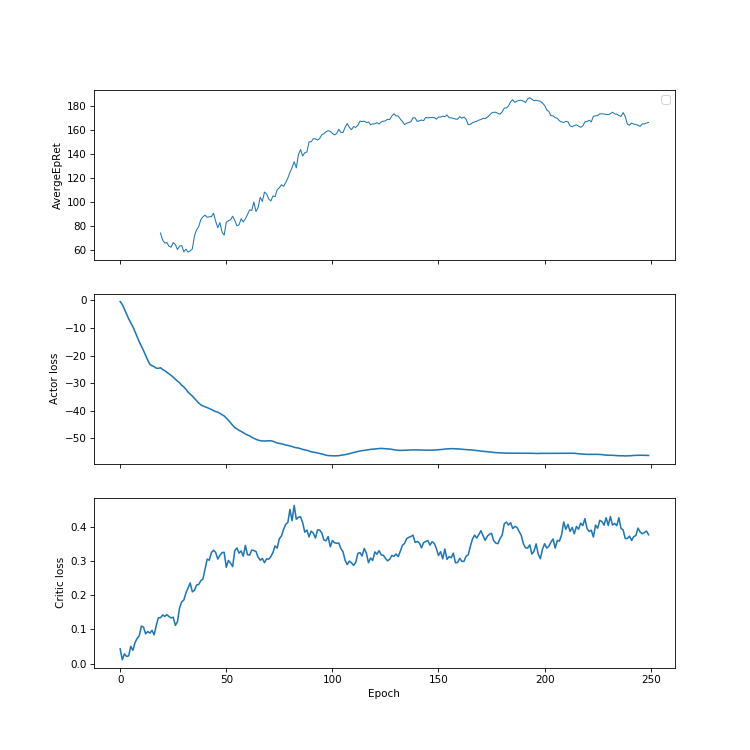

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


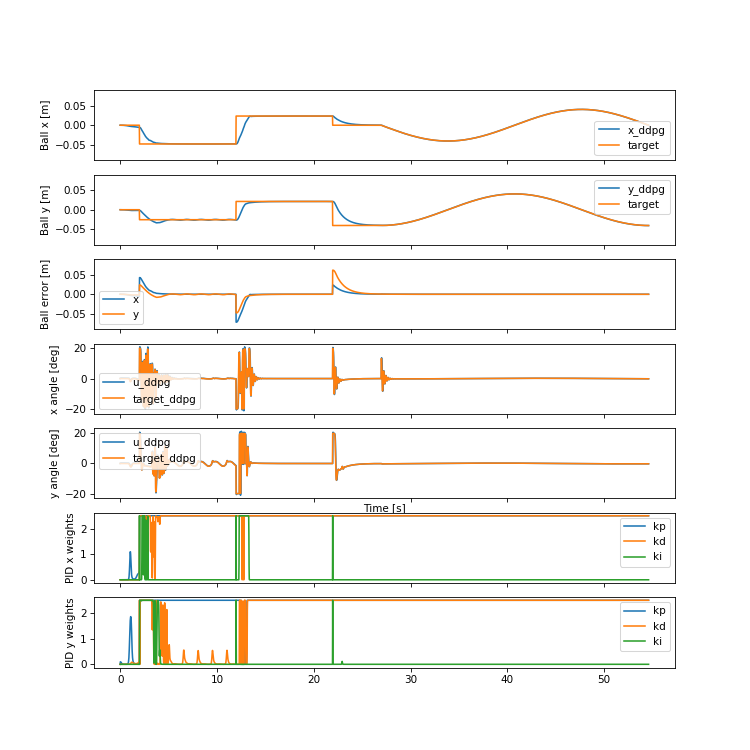

In [53]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [54]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = quadratic_e_reward
w = 1
hidden_size = [100, 75]
gamma = 0.99
act = torch.nn.ReLU
name='pe1_[100, 75]_relu_0.99'

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0.06711907, 0.04784623], dtype=float32), array([-0.01079832, -0.05809857], dtype=float32), array([ 0.00013647, -0.00105607], dtype=float32))
-0.0003180209280188914


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


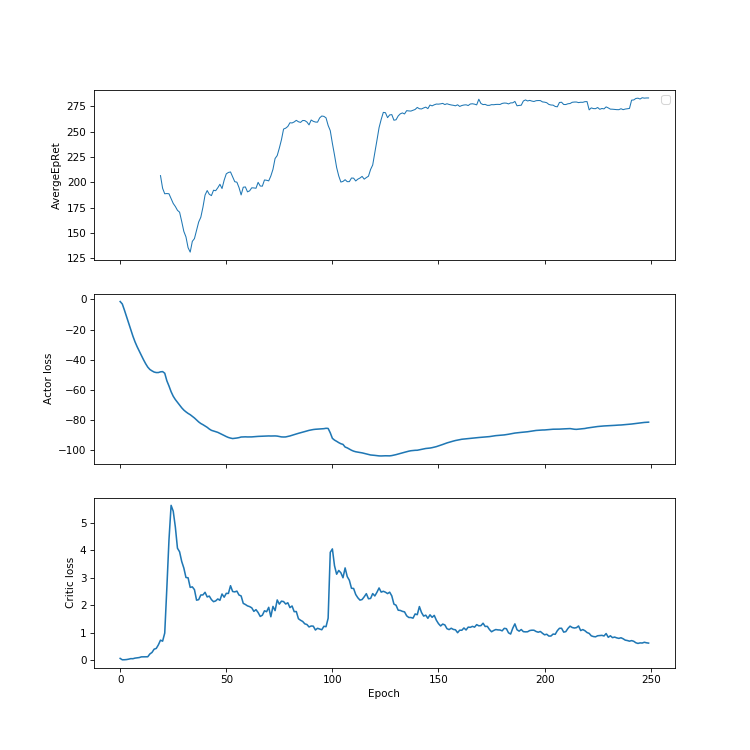

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


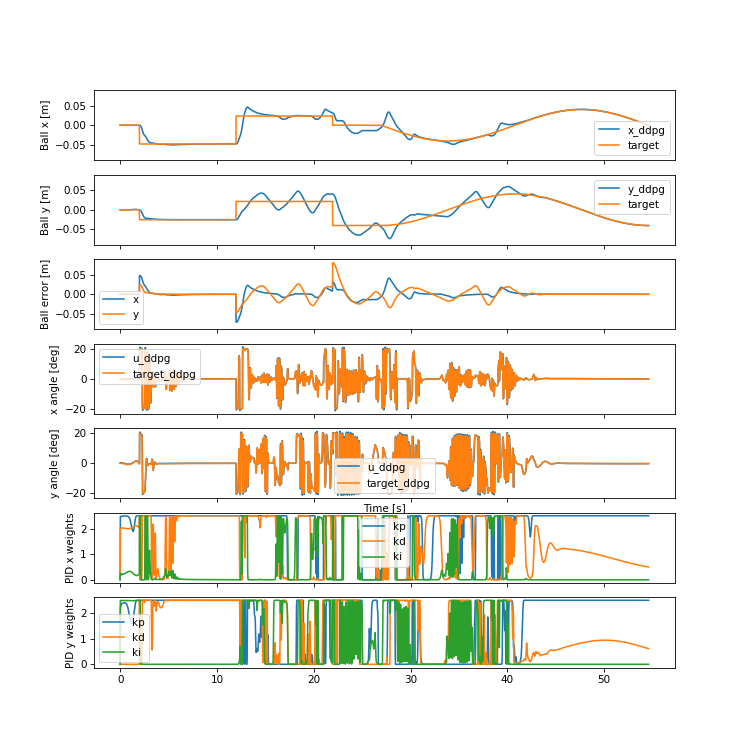

In [55]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [56]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = quadratic_e_reward_penality
w = 0.3
hidden_size = [150, 75]
gamma = 0.99
act = torch.nn.ReLU
name='pep0.3_[150, 75]_relu_0.99'

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([ 0.06112725, -0.04454582], dtype=float32), array([-0.01148351,  0.04807443], dtype=float32), array([-0.00012153, -0.00271462], dtype=float32))
-0.0006004154753709533


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


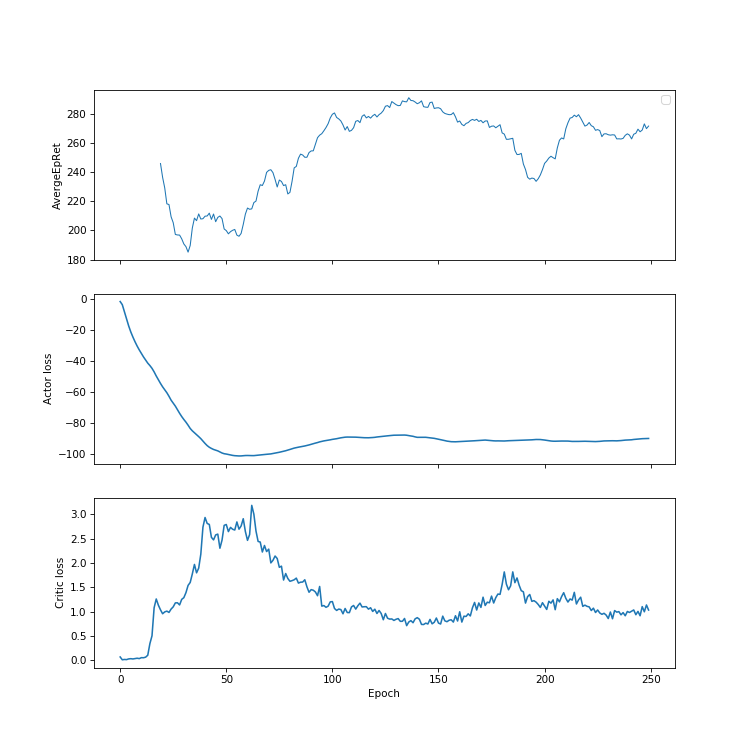

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


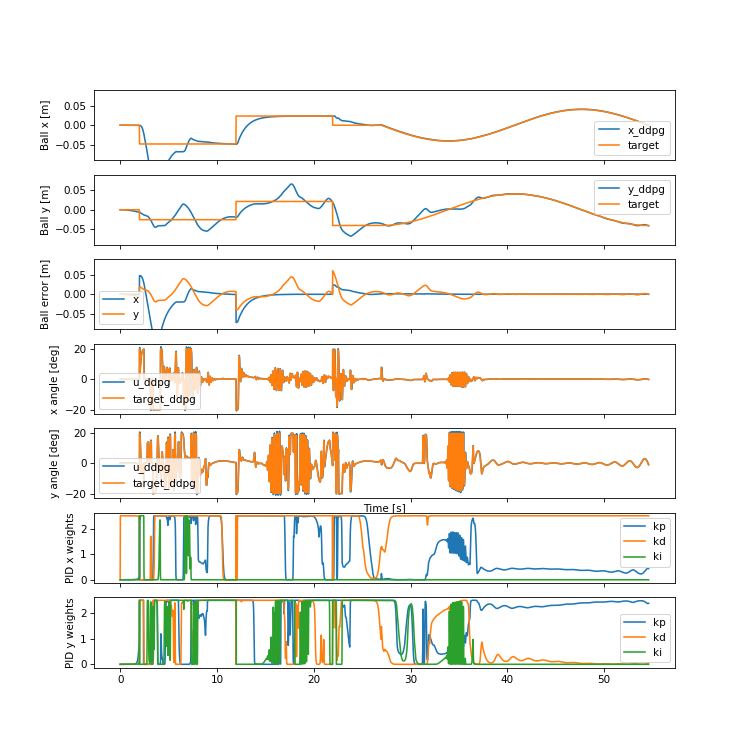

In [57]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [58]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_de_reward
w = 15
hidden_size = [100, 100]
gamma = 0.99
act = torch.nn.ReLU
name='de15_[100, 100]_relu_0.99'

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([ 0.04594594, -0.00691368], dtype=float32), array([-0.06501514, -0.07160159], dtype=float32), array([ 0.00259414, -0.0027415 ], dtype=float32))
-0.0005866993846094442


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


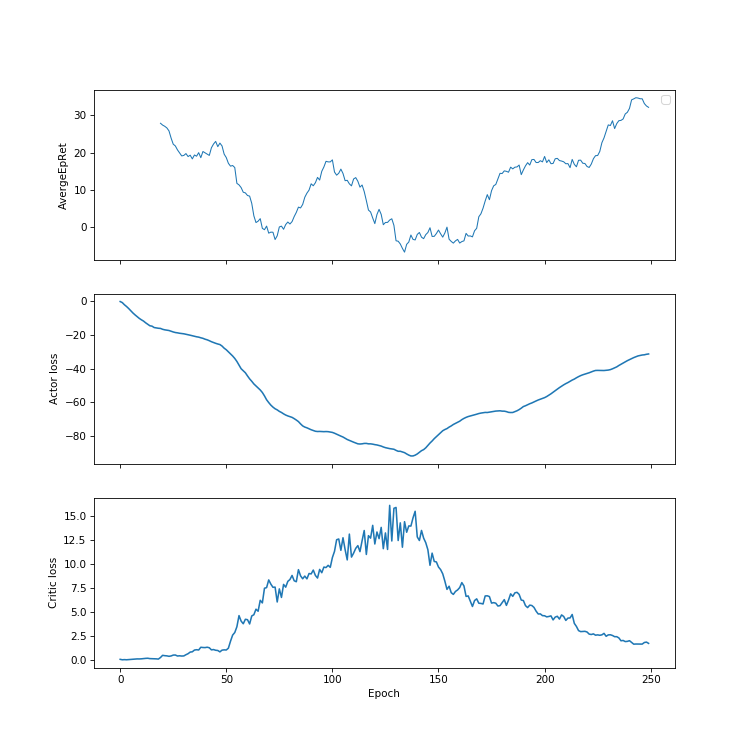

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


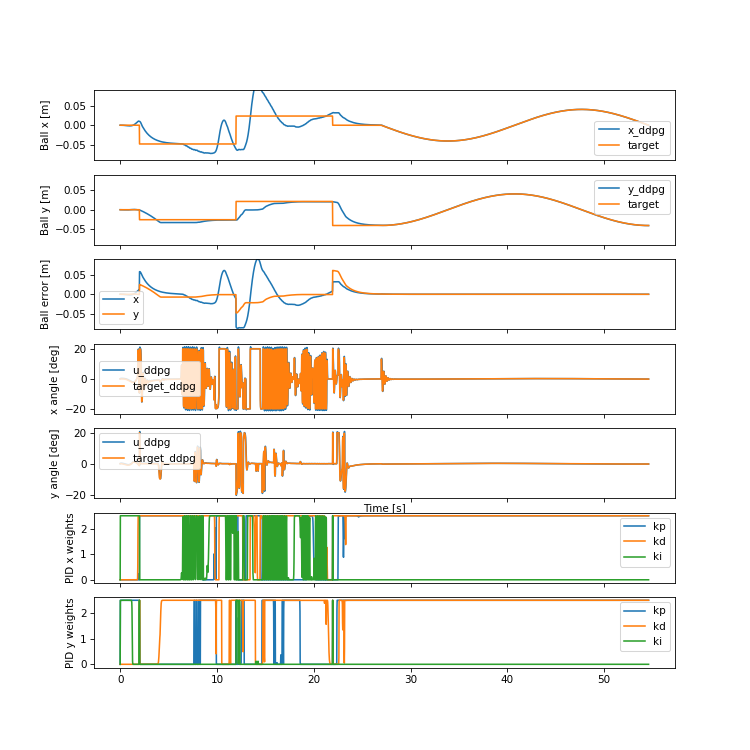

In [59]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [10]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [50]
gamma = 0.99
act = torch.nn.ReLU
name='le0.6_[50]_relu_0.99_long'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[50]_relu_0.99_long/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"ReLU",
        "hidden_sizes":	[
            50
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	350,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f52cb4ed9b0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[50]_relu_0.99_long",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[50]_relu_0.99_long/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },
    "logger_kwargs":	{

/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


---------------------------------------
|             Epoch |               1 |
|      AverageEpRet |             284 |
|          StdEpRet |            2.15 |
|          MaxEpRet |             287 |
|          MinEpRet |             282 |
|  AverageTestEpRet |             295 |
|      StdTestEpRet |         0.00255 |
|      MaxTestEpRet |             295 |
|      MinTestEpRet |             295 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.1e+03 |
|      AverageQVals |           0.871 |
|          StdQVals |           0.318 |
|          MaxQVals |            1.62 |
|          MinQVals |          -0.226 |
|            LossPi |           -1.01 |
|             LossQ |          0.0906 |
|              Time |            4.27 |
---------------------------------------
---------------------------------------
|             Epoch |               2 |
|      AverageEpRet |             282 |
|          StdEpRet |            2.86 |


---------------------------------------
|             Epoch |              11 |
|      AverageEpRet |             284 |
|          StdEpRet |            1.29 |
|          MaxEpRet |             285 |
|          MinEpRet |             282 |
|  AverageTestEpRet |           -77.9 |
|      StdTestEpRet |            12.2 |
|      MaxTestEpRet |             -58 |
|      MinTestEpRet |            -101 |
|             EpLen |             400 |
|         TestEpLen |             290 |
| TotalEnvInteracts |        1.21e+04 |
|      AverageQVals |            32.3 |
|          StdQVals |           0.978 |
|          MaxQVals |            34.3 |
|          MinQVals |            27.4 |
|            LossPi |           -32.3 |
|             LossQ |        0.000639 |
|              Time |            84.5 |
---------------------------------------
---------------------------------------
|             Epoch |              12 |
|      AverageEpRet |             282 |
|          StdEpRet |           0.665 |


---------------------------------------
|             Epoch |              21 |
|      AverageEpRet |             289 |
|          StdEpRet |            2.69 |
|          MaxEpRet |             292 |
|          MinEpRet |             286 |
|  AverageTestEpRet |             291 |
|      StdTestEpRet |        9.58e-05 |
|      MaxTestEpRet |             291 |
|      MinTestEpRet |             291 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.31e+04 |
|      AverageQVals |            44.4 |
|          StdQVals |            18.1 |
|          MaxQVals |            65.7 |
|          MinQVals |           -80.2 |
|            LossPi |           -44.6 |
|             LossQ |           0.546 |
|              Time |             160 |
---------------------------------------
---------------------------------------
|             Epoch |              22 |
|      AverageEpRet |             290 |
|          StdEpRet |            1.73 |


---------------------------------------
|             Epoch |              31 |
|      AverageEpRet |             185 |
|          StdEpRet |            42.8 |
|          MaxEpRet |             239 |
|          MinEpRet |             134 |
|  AverageTestEpRet |             244 |
|      StdTestEpRet |            51.4 |
|      MaxTestEpRet |             262 |
|      MinTestEpRet |            49.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.41e+04 |
|      AverageQVals |            55.5 |
|          StdQVals |            14.3 |
|          MaxQVals |             106 |
|          MinQVals |           -36.9 |
|            LossPi |           -55.7 |
|             LossQ |           0.377 |
|              Time |             245 |
---------------------------------------
---------------------------------------
|             Epoch |              32 |
|      AverageEpRet |             138 |
|          StdEpRet |            57.2 |


---------------------------------------
|             Epoch |              41 |
|      AverageEpRet |             268 |
|          StdEpRet |            32.2 |
|          MaxEpRet |             297 |
|          MinEpRet |             223 |
|  AverageTestEpRet |             297 |
|      StdTestEpRet |        0.000273 |
|      MaxTestEpRet |             297 |
|      MinTestEpRet |             297 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.51e+04 |
|      AverageQVals |            64.9 |
|          StdQVals |            10.5 |
|          MaxQVals |             114 |
|          MinQVals |           -15.7 |
|            LossPi |           -65.2 |
|             LossQ |           0.295 |
|              Time |             319 |
---------------------------------------
---------------------------------------
|             Epoch |              42 |
|      AverageEpRet |             297 |
|          StdEpRet |          0.0909 |


---------------------------------------
|             Epoch |              51 |
|      AverageEpRet |             180 |
|          StdEpRet |              20 |
|          MaxEpRet |             199 |
|          MinEpRet |             152 |
|  AverageTestEpRet |             243 |
|      StdTestEpRet |            17.3 |
|      MaxTestEpRet |             259 |
|      MinTestEpRet |             191 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.61e+04 |
|      AverageQVals |              70 |
|          StdQVals |            12.4 |
|          MaxQVals |             121 |
|          MinQVals |           -41.2 |
|            LossPi |           -70.2 |
|             LossQ |           0.321 |
|              Time |             403 |
---------------------------------------
---------------------------------------
|             Epoch |              52 |
|      AverageEpRet |             252 |
|          StdEpRet |            4.23 |


---------------------------------------
|             Epoch |              61 |
|      AverageEpRet |             295 |
|          StdEpRet |            1.23 |
|          MaxEpRet |             297 |
|          MinEpRet |             294 |
|  AverageTestEpRet |             295 |
|      StdTestEpRet |         0.00102 |
|      MaxTestEpRet |             295 |
|      MinTestEpRet |             295 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.71e+04 |
|      AverageQVals |            75.3 |
|          StdQVals |            12.2 |
|          MaxQVals |             142 |
|          MinQVals |           -27.2 |
|            LossPi |           -75.6 |
|             LossQ |           0.265 |
|              Time |             477 |
---------------------------------------
---------------------------------------
|             Epoch |              62 |
|      AverageEpRet |             295 |
|          StdEpRet |          0.0134 |


---------------------------------------
|             Epoch |              71 |
|      AverageEpRet |             277 |
|          StdEpRet |            1.19 |
|          MaxEpRet |             278 |
|          MinEpRet |             276 |
|  AverageTestEpRet |             279 |
|      StdTestEpRet |          0.0802 |
|      MaxTestEpRet |             279 |
|      MinTestEpRet |             279 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.81e+04 |
|      AverageQVals |            78.8 |
|          StdQVals |              14 |
|          MaxQVals |             181 |
|          MinQVals |             -60 |
|            LossPi |             -79 |
|             LossQ |           0.399 |
|              Time |             550 |
---------------------------------------
---------------------------------------
|             Epoch |              72 |
|      AverageEpRet |             284 |
|          StdEpRet |            3.14 |


---------------------------------------
|             Epoch |              81 |
|      AverageEpRet |             158 |
|          StdEpRet |            11.9 |
|          MaxEpRet |             174 |
|          MinEpRet |             145 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            4.31 |
|      MaxTestEpRet |             186 |
|      MinTestEpRet |             165 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.91e+04 |
|      AverageQVals |            78.8 |
|          StdQVals |              11 |
|          MaxQVals |             135 |
|          MinQVals |           -44.7 |
|            LossPi |             -79 |
|             LossQ |           0.285 |
|              Time |             625 |
---------------------------------------
---------------------------------------
|             Epoch |              82 |
|      AverageEpRet |             217 |
|          StdEpRet |            14.8 |


---------------------------------------
|             Epoch |              91 |
|      AverageEpRet |             191 |
|          StdEpRet |            29.4 |
|          MaxEpRet |             217 |
|          MinEpRet |             150 |
|  AverageTestEpRet |             127 |
|      StdTestEpRet |            70.3 |
|      MaxTestEpRet |             228 |
|      MinTestEpRet |            55.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |           1e+05 |
|      AverageQVals |            79.1 |
|          StdQVals |            10.8 |
|          MaxQVals |             125 |
|          MinQVals |           -50.3 |
|            LossPi |           -79.3 |
|             LossQ |           0.262 |
|              Time |             699 |
---------------------------------------
---------------------------------------
|             Epoch |              92 |
|      AverageEpRet |             252 |
|          StdEpRet |            18.4 |


---------------------------------------
|             Epoch |             101 |
|      AverageEpRet |             229 |
|          StdEpRet |            9.06 |
|          MaxEpRet |             237 |
|          MinEpRet |             216 |
|  AverageTestEpRet |             241 |
|      StdTestEpRet |            15.9 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |             224 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.11e+05 |
|      AverageQVals |            79.3 |
|          StdQVals |            10.9 |
|          MaxQVals |             112 |
|          MinQVals |           -46.4 |
|            LossPi |           -79.5 |
|             LossQ |            0.23 |
|              Time |             770 |
---------------------------------------
---------------------------------------
|             Epoch |             102 |
|      AverageEpRet |             232 |
|          StdEpRet |            21.5 |


---------------------------------------
|             Epoch |             111 |
|      AverageEpRet |             246 |
|          StdEpRet |            4.74 |
|          MaxEpRet |             252 |
|          MinEpRet |             241 |
|  AverageTestEpRet |             236 |
|      StdTestEpRet |            18.5 |
|      MaxTestEpRet |             266 |
|      MinTestEpRet |             212 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.22e+05 |
|      AverageQVals |            76.4 |
|          StdQVals |            11.6 |
|          MaxQVals |             140 |
|          MinQVals |           -57.5 |
|            LossPi |           -76.7 |
|             LossQ |           0.277 |
|              Time |             839 |
---------------------------------------
---------------------------------------
|             Epoch |             112 |
|      AverageEpRet |             214 |
|          StdEpRet |            28.1 |


---------------------------------------
|             Epoch |             121 |
|      AverageEpRet |             114 |
|          StdEpRet |            17.4 |
|          MaxEpRet |             137 |
|          MinEpRet |            94.3 |
|  AverageTestEpRet |             108 |
|      StdTestEpRet |           0.638 |
|      MaxTestEpRet |             111 |
|      MinTestEpRet |             108 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.33e+05 |
|      AverageQVals |            77.5 |
|          StdQVals |            10.2 |
|          MaxQVals |             122 |
|          MinQVals |           -53.4 |
|            LossPi |           -77.7 |
|             LossQ |           0.255 |
|              Time |             909 |
---------------------------------------
---------------------------------------
|             Epoch |             122 |
|      AverageEpRet |            79.2 |
|          StdEpRet |            54.3 |


---------------------------------------
|             Epoch |             131 |
|      AverageEpRet |             262 |
|          StdEpRet |            31.7 |
|          MaxEpRet |             286 |
|          MinEpRet |             218 |
|  AverageTestEpRet |             293 |
|      StdTestEpRet |           0.624 |
|      MaxTestEpRet |             294 |
|      MinTestEpRet |             291 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.44e+05 |
|      AverageQVals |            75.4 |
|          StdQVals |            9.25 |
|          MaxQVals |             106 |
|          MinQVals |           -73.9 |
|            LossPi |           -75.6 |
|             LossQ |           0.219 |
|              Time |             977 |
---------------------------------------
---------------------------------------
|             Epoch |             132 |
|      AverageEpRet |             293 |
|          StdEpRet |           0.171 |


---------------------------------------
|             Epoch |             141 |
|      AverageEpRet |            37.3 |
|          StdEpRet |            12.2 |
|          MaxEpRet |            54.5 |
|          MinEpRet |            27.4 |
|  AverageTestEpRet |            26.2 |
|      StdTestEpRet |            3.84 |
|      MaxTestEpRet |            41.3 |
|      MinTestEpRet |            21.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.55e+05 |
|      AverageQVals |            76.6 |
|          StdQVals |            10.6 |
|          MaxQVals |             113 |
|          MinQVals |           -45.4 |
|            LossPi |           -76.9 |
|             LossQ |           0.388 |
|              Time |        1.05e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             142 |
|      AverageEpRet |            45.1 |
|          StdEpRet |            7.57 |


---------------------------------------
|             Epoch |             151 |
|      AverageEpRet |             282 |
|          StdEpRet |            16.4 |
|          MaxEpRet |             299 |
|          MinEpRet |             260 |
|  AverageTestEpRet |             299 |
|      StdTestEpRet |        6.82e-06 |
|      MaxTestEpRet |             299 |
|      MinTestEpRet |             299 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.66e+05 |
|      AverageQVals |            76.8 |
|          StdQVals |            11.7 |
|          MaxQVals |             109 |
|          MinQVals |           -43.2 |
|            LossPi |           -77.1 |
|             LossQ |           0.424 |
|              Time |        1.11e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             152 |
|      AverageEpRet |             288 |
|          StdEpRet |            8.04 |


---------------------------------------
|             Epoch |             161 |
|      AverageEpRet |             286 |
|          StdEpRet |           0.612 |
|          MaxEpRet |             286 |
|          MinEpRet |             285 |
|  AverageTestEpRet |             286 |
|      StdTestEpRet |         0.00973 |
|      MaxTestEpRet |             286 |
|      MinTestEpRet |             286 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.77e+05 |
|      AverageQVals |            80.9 |
|          StdQVals |            14.3 |
|          MaxQVals |             119 |
|          MinQVals |           -61.3 |
|            LossPi |           -81.1 |
|             LossQ |            0.43 |
|              Time |        1.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             162 |
|      AverageEpRet |             286 |
|          StdEpRet |            0.22 |


---------------------------------------
|             Epoch |             171 |
|      AverageEpRet |             262 |
|          StdEpRet |            10.4 |
|          MaxEpRet |             276 |
|          MinEpRet |             254 |
|  AverageTestEpRet |             259 |
|      StdTestEpRet |             8.4 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |             252 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.88e+05 |
|      AverageQVals |            81.7 |
|          StdQVals |            14.6 |
|          MaxQVals |             126 |
|          MinQVals |           -96.2 |
|            LossPi |             -82 |
|             LossQ |           0.478 |
|              Time |        1.26e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             172 |
|      AverageEpRet |             244 |
|          StdEpRet |            27.5 |


---------------------------------------
|             Epoch |             181 |
|      AverageEpRet |             268 |
|          StdEpRet |            1.04 |
|          MaxEpRet |             269 |
|          MinEpRet |             267 |
|  AverageTestEpRet |             272 |
|      StdTestEpRet |        6.29e-05 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |             272 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.99e+05 |
|      AverageQVals |            82.4 |
|          StdQVals |            13.6 |
|          MaxQVals |             143 |
|          MinQVals |           -79.9 |
|            LossPi |           -82.7 |
|             LossQ |           0.408 |
|              Time |        1.37e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             182 |
|      AverageEpRet |             272 |
|          StdEpRet |           0.438 |


---------------------------------------
|             Epoch |             191 |
|      AverageEpRet |             279 |
|          StdEpRet |            6.42 |
|          MaxEpRet |             285 |
|          MinEpRet |             270 |
|  AverageTestEpRet |             272 |
|      StdTestEpRet |           0.111 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |             272 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.1e+05 |
|      AverageQVals |            82.1 |
|          StdQVals |            10.9 |
|          MaxQVals |             130 |
|          MinQVals |             -66 |
|            LossPi |           -82.4 |
|             LossQ |           0.396 |
|              Time |        1.49e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             192 |
|      AverageEpRet |             271 |
|          StdEpRet |            6.15 |


---------------------------------------
|             Epoch |             201 |
|      AverageEpRet |             258 |
|          StdEpRet |            7.85 |
|          MaxEpRet |             267 |
|          MinEpRet |             248 |
|  AverageTestEpRet |             288 |
|      StdTestEpRet |           0.109 |
|      MaxTestEpRet |             288 |
|      MinTestEpRet |             288 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.21e+05 |
|      AverageQVals |            81.8 |
|          StdQVals |            11.6 |
|          MaxQVals |             145 |
|          MinQVals |           -77.2 |
|            LossPi |             -82 |
|             LossQ |           0.439 |
|              Time |        1.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             202 |
|      AverageEpRet |             287 |
|          StdEpRet |           0.311 |


---------------------------------------
|             Epoch |             211 |
|      AverageEpRet |             234 |
|          StdEpRet |            71.4 |
|          MaxEpRet |             285 |
|          MinEpRet |             133 |
|  AverageTestEpRet |             237 |
|      StdTestEpRet |            6.55 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |             235 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.32e+05 |
|      AverageQVals |              84 |
|          StdQVals |            11.2 |
|          MaxQVals |             139 |
|          MinQVals |           -86.1 |
|            LossPi |           -84.2 |
|             LossQ |            0.37 |
|              Time |        1.73e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             212 |
|      AverageEpRet |             250 |
|          StdEpRet |              24 |


---------------------------------------
|             Epoch |             221 |
|      AverageEpRet |             299 |
|          StdEpRet |           0.135 |
|          MaxEpRet |             299 |
|          MinEpRet |             299 |
|  AverageTestEpRet |             299 |
|      StdTestEpRet |        3.05e-05 |
|      MaxTestEpRet |             299 |
|      MinTestEpRet |             299 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.43e+05 |
|      AverageQVals |            81.5 |
|          StdQVals |            9.94 |
|          MaxQVals |             151 |
|          MinQVals |           -85.1 |
|            LossPi |           -81.7 |
|             LossQ |           0.323 |
|              Time |        1.86e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             222 |
|      AverageEpRet |             299 |
|          StdEpRet |         0.00101 |


---------------------------------------
|             Epoch |             231 |
|      AverageEpRet |             269 |
|          StdEpRet |            3.41 |
|          MaxEpRet |             272 |
|          MinEpRet |             264 |
|  AverageTestEpRet |             263 |
|      StdTestEpRet |          0.0927 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |             263 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.54e+05 |
|      AverageQVals |            82.5 |
|          StdQVals |            8.08 |
|          MaxQVals |             214 |
|          MinQVals |           -51.1 |
|            LossPi |           -82.8 |
|             LossQ |           0.501 |
|              Time |        1.97e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             232 |
|      AverageEpRet |             214 |
|          StdEpRet |            32.5 |


---------------------------------------
|             Epoch |             241 |
|      AverageEpRet |             188 |
|          StdEpRet |            16.5 |
|          MaxEpRet |             204 |
|          MinEpRet |             165 |
|  AverageTestEpRet |             107 |
|      StdTestEpRet |            88.5 |
|      MaxTestEpRet |             192 |
|      MinTestEpRet |           -29.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.65e+05 |
|      AverageQVals |            85.1 |
|          StdQVals |            9.48 |
|          MaxQVals |             251 |
|          MinQVals |            3.15 |
|            LossPi |           -85.5 |
|             LossQ |           0.794 |
|              Time |         2.1e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             242 |
|      AverageEpRet |            41.1 |
|          StdEpRet |            67.3 |


---------------------------------------
|             Epoch |             251 |
|      AverageEpRet |             295 |
|          StdEpRet |           0.171 |
|          MaxEpRet |             295 |
|          MinEpRet |             295 |
|  AverageTestEpRet |             294 |
|      StdTestEpRet |        6.55e-05 |
|      MaxTestEpRet |             294 |
|      MinTestEpRet |             294 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.76e+05 |
|      AverageQVals |              87 |
|          StdQVals |            10.7 |
|          MaxQVals |             214 |
|          MinQVals |           -25.7 |
|            LossPi |           -87.3 |
|             LossQ |           0.692 |
|              Time |        2.22e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             252 |
|      AverageEpRet |             295 |
|          StdEpRet |           0.299 |


---------------------------------------
|             Epoch |             261 |
|      AverageEpRet |             278 |
|          StdEpRet |            2.46 |
|          MaxEpRet |             280 |
|          MinEpRet |             274 |
|  AverageTestEpRet |             281 |
|      StdTestEpRet |         0.00018 |
|      MaxTestEpRet |             281 |
|      MinTestEpRet |             281 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.87e+05 |
|      AverageQVals |            86.2 |
|          StdQVals |            8.26 |
|          MaxQVals |             162 |
|          MinQVals |           -1.38 |
|            LossPi |           -86.4 |
|             LossQ |            0.36 |
|              Time |        2.33e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             262 |
|      AverageEpRet |             269 |
|          StdEpRet |            11.7 |


---------------------------------------
|             Epoch |             271 |
|      AverageEpRet |             289 |
|          StdEpRet |             2.5 |
|          MaxEpRet |             291 |
|          MinEpRet |             285 |
|  AverageTestEpRet |             291 |
|      StdTestEpRet |         0.00018 |
|      MaxTestEpRet |             291 |
|      MinTestEpRet |             291 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.98e+05 |
|      AverageQVals |            81.5 |
|          StdQVals |            7.89 |
|          MaxQVals |             138 |
|          MinQVals |           -44.7 |
|            LossPi |           -81.7 |
|             LossQ |           0.284 |
|              Time |        2.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             272 |
|      AverageEpRet |             289 |
|          StdEpRet |           0.771 |


---------------------------------------
|             Epoch |             281 |
|      AverageEpRet |             290 |
|          StdEpRet |            1.03 |
|          MaxEpRet |             292 |
|          MinEpRet |             289 |
|  AverageTestEpRet |             288 |
|      StdTestEpRet |        6.22e-05 |
|      MaxTestEpRet |             288 |
|      MinTestEpRet |             288 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.09e+05 |
|      AverageQVals |            79.2 |
|          StdQVals |            8.84 |
|          MaxQVals |             192 |
|          MinQVals |           -71.9 |
|            LossPi |           -79.4 |
|             LossQ |           0.485 |
|              Time |        2.56e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             282 |
|      AverageEpRet |             289 |
|          StdEpRet |            1.76 |


---------------------------------------
|             Epoch |             291 |
|      AverageEpRet |             290 |
|          StdEpRet |            1.21 |
|          MaxEpRet |             292 |
|          MinEpRet |             290 |
|  AverageTestEpRet |             283 |
|      StdTestEpRet |        3.27e-05 |
|      MaxTestEpRet |             283 |
|      MinTestEpRet |             283 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         3.2e+05 |
|      AverageQVals |            80.3 |
|          StdQVals |            8.08 |
|          MaxQVals |             256 |
|          MinQVals |           -21.5 |
|            LossPi |           -80.6 |
|             LossQ |           0.787 |
|              Time |        2.66e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             292 |
|      AverageEpRet |             272 |
|          StdEpRet |            2.29 |


---------------------------------------
|             Epoch |             301 |
|      AverageEpRet |             230 |
|          StdEpRet |            30.2 |
|          MaxEpRet |             271 |
|          MinEpRet |             199 |
|  AverageTestEpRet |             268 |
|      StdTestEpRet |            11.9 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |             218 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.31e+05 |
|      AverageQVals |            80.8 |
|          StdQVals |            7.51 |
|          MaxQVals |             222 |
|          MinQVals |           -2.47 |
|            LossPi |           -80.9 |
|             LossQ |           0.205 |
|              Time |        2.74e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             302 |
|      AverageEpRet |             258 |
|          StdEpRet |            14.2 |


---------------------------------------
|             Epoch |             311 |
|      AverageEpRet |             289 |
|          StdEpRet |            4.63 |
|          MaxEpRet |             292 |
|          MinEpRet |             282 |
|  AverageTestEpRet |             291 |
|      StdTestEpRet |         6.1e-05 |
|      MaxTestEpRet |             291 |
|      MinTestEpRet |             291 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.42e+05 |
|      AverageQVals |            79.2 |
|          StdQVals |            5.99 |
|          MaxQVals |             184 |
|          MinQVals |           -1.11 |
|            LossPi |           -79.4 |
|             LossQ |            0.34 |
|              Time |        2.81e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             312 |
|      AverageEpRet |             291 |
|          StdEpRet |            0.23 |


---------------------------------------
|             Epoch |             321 |
|      AverageEpRet |             261 |
|          StdEpRet |            1.26 |
|          MaxEpRet |             262 |
|          MinEpRet |             259 |
|  AverageTestEpRet |             278 |
|      StdTestEpRet |          0.0342 |
|      MaxTestEpRet |             278 |
|      MinTestEpRet |             278 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.53e+05 |
|      AverageQVals |            79.1 |
|          StdQVals |            5.86 |
|          MaxQVals |             181 |
|          MinQVals |            14.8 |
|            LossPi |           -79.2 |
|             LossQ |           0.232 |
|              Time |        2.89e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             322 |
|      AverageEpRet |             274 |
|          StdEpRet |           0.959 |


---------------------------------------
|             Epoch |             331 |
|      AverageEpRet |             272 |
|          StdEpRet |            11.9 |
|          MaxEpRet |             283 |
|          MinEpRet |             255 |
|  AverageTestEpRet |             283 |
|      StdTestEpRet |         0.00118 |
|      MaxTestEpRet |             283 |
|      MinTestEpRet |             283 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.64e+05 |
|      AverageQVals |            77.6 |
|          StdQVals |            6.63 |
|          MaxQVals |             151 |
|          MinQVals |           -11.7 |
|            LossPi |           -77.7 |
|             LossQ |           0.156 |
|              Time |        2.95e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             332 |
|      AverageEpRet |             279 |
|          StdEpRet |            2.99 |


---------------------------------------
|             Epoch |             341 |
|      AverageEpRet |             287 |
|          StdEpRet |            5.71 |
|          MaxEpRet |             292 |
|          MinEpRet |             279 |
|  AverageTestEpRet |             291 |
|      StdTestEpRet |        5.99e-05 |
|      MaxTestEpRet |             291 |
|      MinTestEpRet |             291 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.75e+05 |
|      AverageQVals |            75.3 |
|          StdQVals |            7.45 |
|          MaxQVals |             132 |
|          MinQVals |           -50.8 |
|            LossPi |           -75.4 |
|             LossQ |           0.119 |
|              Time |        3.03e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             342 |
|      AverageEpRet |             292 |
|          StdEpRet |           0.282 |


{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-3037.4698652840134


<IPython.core.display.Javascript object>


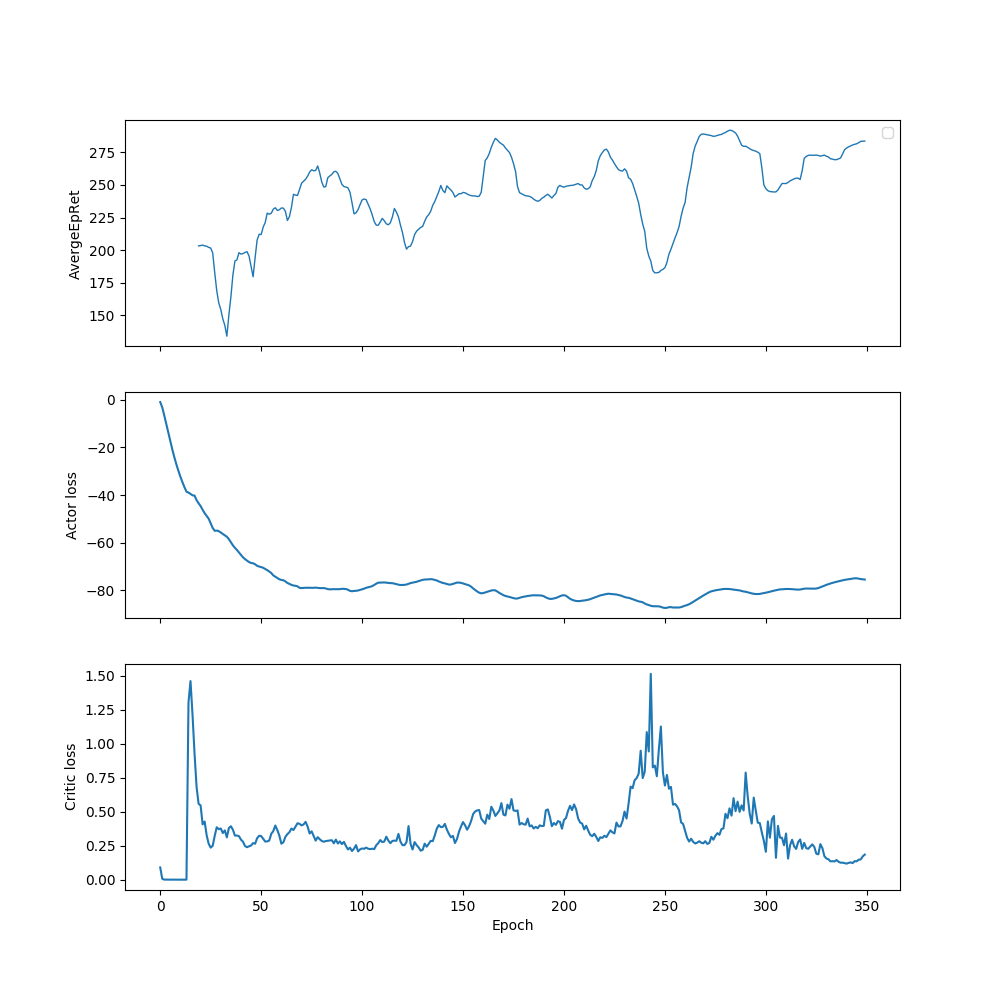

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


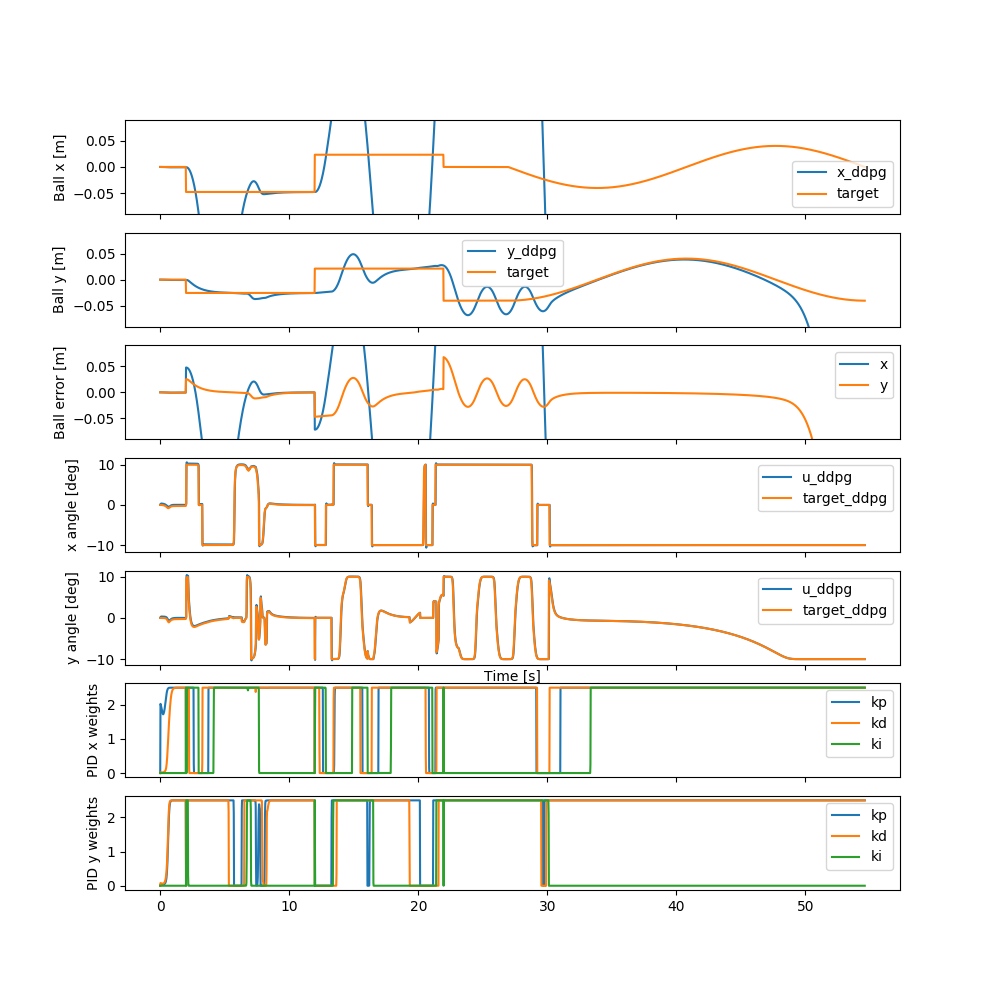

In [13]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [14]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [50,25]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[50,25]_sigmoid_0.99_long'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[50,25]_sigmoid_0.99_long/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            50,
            25
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	350,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f52bacba908>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[50,25]_sigmoid_0.99_long",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[50,25]_sigmoid_0.99_long/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
  

---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |             282 |
|          StdEpRet |           0.121 |
|          MaxEpRet |             282 |
|          MinEpRet |             282 |
|  AverageTestEpRet |           -54.8 |
|      StdTestEpRet |          0.0829 |
|      MaxTestEpRet |           -54.4 |
|      MinTestEpRet |           -54.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         8.8e+03 |
|      AverageQVals |              23 |
|          StdQVals |           0.776 |
|          MaxQVals |            24.4 |
|          MinQVals |            21.3 |
|            LossPi |             -23 |
|             LossQ |        0.000582 |
|              Time |            66.2 |
---------------------------------------
---------------------------------------
|             Epoch |               9 |
|      AverageEpRet |             283 |
|          StdEpRet |            1.61 |


---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             290 |
|          StdEpRet |           0.256 |
|          MaxEpRet |             291 |
|          MinEpRet |             290 |
|  AverageTestEpRet |             290 |
|      StdTestEpRet |        8.19e-05 |
|      MaxTestEpRet |             290 |
|      MinTestEpRet |             290 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.98e+04 |
|      AverageQVals |            43.3 |
|          StdQVals |            2.27 |
|          MaxQVals |            44.7 |
|          MinQVals |            15.4 |
|            LossPi |           -43.4 |
|             LossQ |         0.00348 |
|              Time |             180 |
---------------------------------------
---------------------------------------
|             Epoch |              19 |
|      AverageEpRet |             290 |
|          StdEpRet |           0.592 |


---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             291 |
|          StdEpRet |           0.185 |
|          MaxEpRet |             292 |
|          MinEpRet |             291 |
|  AverageTestEpRet |             291 |
|      StdTestEpRet |               0 |
|      MaxTestEpRet |             291 |
|      MinTestEpRet |             291 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.08e+04 |
|      AverageQVals |            55.8 |
|          StdQVals |            1.07 |
|          MaxQVals |            56.7 |
|          MinQVals |            42.4 |
|            LossPi |           -55.8 |
|             LossQ |        0.000313 |
|              Time |             318 |
---------------------------------------
---------------------------------------
|             Epoch |              29 |
|      AverageEpRet |             291 |
|          StdEpRet |           0.263 |


---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             295 |
|          StdEpRet |           0.178 |
|          MaxEpRet |             295 |
|          MinEpRet |             294 |
|  AverageTestEpRet |             295 |
|      StdTestEpRet |         0.00597 |
|      MaxTestEpRet |             295 |
|      MinTestEpRet |             295 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.18e+04 |
|      AverageQVals |            63.1 |
|          StdQVals |           0.825 |
|          MaxQVals |            63.8 |
|          MinQVals |            46.1 |
|            LossPi |           -63.1 |
|             LossQ |        0.000224 |
|              Time |             460 |
---------------------------------------
---------------------------------------
|             Epoch |              39 |
|      AverageEpRet |             295 |
|          StdEpRet |           0.432 |


---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             295 |
|          StdEpRet |           0.421 |
|          MaxEpRet |             295 |
|          MinEpRet |             294 |
|  AverageTestEpRet |             295 |
|      StdTestEpRet |        2.73e-05 |
|      MaxTestEpRet |             295 |
|      MinTestEpRet |             295 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.28e+04 |
|      AverageQVals |            67.7 |
|          StdQVals |           0.909 |
|          MaxQVals |            68.1 |
|          MinQVals |            48.8 |
|            LossPi |           -67.7 |
|             LossQ |        0.000418 |
|              Time |             577 |
---------------------------------------
---------------------------------------
|             Epoch |              49 |
|      AverageEpRet |             295 |
|          StdEpRet |             0.2 |


---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.192 |
|          MaxEpRet |             300 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             300 |
|      StdTestEpRet |               0 |
|      MaxTestEpRet |             300 |
|      MinTestEpRet |             300 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.38e+04 |
|      AverageQVals |            70.5 |
|          StdQVals |           0.795 |
|          MaxQVals |            70.8 |
|          MinQVals |            55.4 |
|            LossPi |           -70.5 |
|             LossQ |        0.000207 |
|              Time |             716 |
---------------------------------------
---------------------------------------
|             Epoch |              59 |
|      AverageEpRet |             299 |
|          StdEpRet |           0.252 |


---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.138 |
|          MaxEpRet |             300 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             300 |
|      StdTestEpRet |        6.82e-06 |
|      MaxTestEpRet |             300 |
|      MinTestEpRet |             300 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.48e+04 |
|      AverageQVals |            72.2 |
|          StdQVals |           0.813 |
|          MaxQVals |            72.6 |
|          MinQVals |            54.6 |
|            LossPi |           -72.3 |
|             LossQ |        0.000166 |
|              Time |             832 |
---------------------------------------
---------------------------------------
|             Epoch |              69 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.019 |


---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.101 |
|          MaxEpRet |             300 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             300 |
|      StdTestEpRet |        1.36e-05 |
|      MaxTestEpRet |             300 |
|      MinTestEpRet |             300 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.58e+04 |
|      AverageQVals |            73.2 |
|          StdQVals |            1.22 |
|          MaxQVals |            73.9 |
|          MinQVals |              53 |
|            LossPi |           -73.3 |
|             LossQ |        0.000174 |
|              Time |             927 |
---------------------------------------
---------------------------------------
|             Epoch |              79 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.171 |


---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             300 |
|          StdEpRet |            0.43 |
|          MaxEpRet |             300 |
|          MinEpRet |             299 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        4.04e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.68e+04 |
|      AverageQVals |              74 |
|          StdQVals |           0.836 |
|          MaxQVals |            74.5 |
|          MinQVals |            56.2 |
|            LossPi |             -74 |
|             LossQ |        0.000125 |
|              Time |        1.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              89 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.265 |


---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             300 |
|          StdEpRet |            0.37 |
|          MaxEpRet |             300 |
|          MinEpRet |             299 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        3.05e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.08e+05 |
|      AverageQVals |            74.4 |
|          StdQVals |           0.595 |
|          MaxQVals |            74.9 |
|          MinQVals |            64.9 |
|            LossPi |           -74.5 |
|             LossQ |        0.000377 |
|              Time |        1.17e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              99 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.133 |


---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.315 |
|          MaxEpRet |             301 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        5.95e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.19e+05 |
|      AverageQVals |            74.7 |
|          StdQVals |           0.636 |
|          MaxQVals |              75 |
|          MinQVals |            61.8 |
|            LossPi |           -74.7 |
|             LossQ |        0.000171 |
|              Time |        1.32e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             109 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.456 |


---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.411 |
|          MaxEpRet |             301 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             299 |
|      StdTestEpRet |        0.000149 |
|      MaxTestEpRet |             299 |
|      MinTestEpRet |             299 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.3e+05 |
|      AverageQVals |            74.9 |
|          StdQVals |           0.713 |
|          MaxQVals |            75.4 |
|          MinQVals |            58.9 |
|            LossPi |           -74.9 |
|             LossQ |        0.000228 |
|              Time |        1.47e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             119 |
|      AverageEpRet |             300 |
|          StdEpRet |            0.29 |


---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             300 |
|          StdEpRet |          0.0774 |
|          MaxEpRet |             300 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             300 |
|      StdTestEpRet |        2.05e-05 |
|      MaxTestEpRet |             300 |
|      MinTestEpRet |             300 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.41e+05 |
|      AverageQVals |            75.1 |
|          StdQVals |           0.537 |
|          MaxQVals |              76 |
|          MinQVals |            63.9 |
|            LossPi |           -75.1 |
|             LossQ |        0.000181 |
|              Time |        1.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             129 |
|      AverageEpRet |             300 |
|          StdEpRet |          0.0695 |


---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             301 |
|          StdEpRet |           0.068 |
|          MaxEpRet |             301 |
|          MinEpRet |             301 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        2.97e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.52e+05 |
|      AverageQVals |            75.1 |
|          StdQVals |           0.525 |
|          MaxQVals |            75.8 |
|          MinQVals |              64 |
|            LossPi |           -75.1 |
|             LossQ |        0.000172 |
|              Time |        1.74e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             139 |
|      AverageEpRet |             301 |
|          StdEpRet |           0.263 |


---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             301 |
|          StdEpRet |           0.271 |
|          MaxEpRet |             301 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        3.05e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.63e+05 |
|      AverageQVals |            75.1 |
|          StdQVals |           0.586 |
|          MaxQVals |            75.7 |
|          MinQVals |            61.9 |
|            LossPi |           -75.1 |
|             LossQ |        0.000107 |
|              Time |         1.9e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             149 |
|      AverageEpRet |             300 |
|          StdEpRet |          0.0302 |


---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             301 |
|          StdEpRet |           0.123 |
|          MaxEpRet |             301 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        6.82e-06 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.74e+05 |
|      AverageQVals |            75.1 |
|          StdQVals |           0.582 |
|          MaxQVals |            75.8 |
|          MinQVals |            61.9 |
|            LossPi |           -75.1 |
|             LossQ |        0.000136 |
|              Time |        2.06e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             159 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0314 |


---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0617 |
|          MaxEpRet |             301 |
|          MinEpRet |             301 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        2.05e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.85e+05 |
|      AverageQVals |            75.2 |
|          StdQVals |           0.878 |
|          MaxQVals |            76.2 |
|          MinQVals |            57.1 |
|            LossPi |           -75.2 |
|             LossQ |        0.000404 |
|              Time |        2.22e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             169 |
|      AverageEpRet |             300 |
|          StdEpRet |          0.0121 |


---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             300 |
|          StdEpRet |            0.18 |
|          MaxEpRet |             301 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        5.99e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.96e+05 |
|      AverageQVals |            75.3 |
|          StdQVals |           0.413 |
|          MaxQVals |            75.8 |
|          MinQVals |            66.7 |
|            LossPi |           -75.3 |
|             LossQ |        0.000124 |
|              Time |        2.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             179 |
|      AverageEpRet |             300 |
|          StdEpRet |          0.0686 |


---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             300 |
|          StdEpRet |          0.0143 |
|          MaxEpRet |             300 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             300 |
|      StdTestEpRet |        2.05e-05 |
|      MaxTestEpRet |             300 |
|      MinTestEpRet |             300 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.07e+05 |
|      AverageQVals |            75.3 |
|          StdQVals |           0.576 |
|          MaxQVals |            76.1 |
|          MinQVals |            63.2 |
|            LossPi |           -75.3 |
|             LossQ |        0.000146 |
|              Time |        2.55e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             189 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0161 |


---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0973 |
|          MaxEpRet |             301 |
|          MinEpRet |             301 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        3.05e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.18e+05 |
|      AverageQVals |            75.4 |
|          StdQVals |           0.575 |
|          MaxQVals |            76.6 |
|          MinQVals |              63 |
|            LossPi |           -75.4 |
|             LossQ |        0.000188 |
|              Time |        2.72e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             199 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0485 |


---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             301 |
|          StdEpRet |           0.106 |
|          MaxEpRet |             301 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        3.27e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.29e+05 |
|      AverageQVals |            75.3 |
|          StdQVals |           0.641 |
|          MaxQVals |            76.1 |
|          MinQVals |            60.4 |
|            LossPi |           -75.3 |
|             LossQ |        0.000125 |
|              Time |        2.89e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             209 |
|      AverageEpRet |             301 |
|          StdEpRet |           0.197 |


---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0671 |
|          MaxEpRet |             301 |
|          MinEpRet |             301 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        4.04e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.4e+05 |
|      AverageQVals |            75.2 |
|          StdQVals |           0.754 |
|          MaxQVals |            76.2 |
|          MinQVals |            57.2 |
|            LossPi |           -75.2 |
|             LossQ |        0.000162 |
|              Time |        3.06e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             219 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0627 |


---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             301 |
|          StdEpRet |           0.105 |
|          MaxEpRet |             301 |
|          MinEpRet |             301 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |         6.1e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.51e+05 |
|      AverageQVals |            75.2 |
|          StdQVals |           0.771 |
|          MaxQVals |            76.5 |
|          MinQVals |            56.7 |
|            LossPi |           -75.2 |
|             LossQ |        0.000158 |
|              Time |        3.22e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             229 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0227 |


---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             301 |
|          StdEpRet |           0.136 |
|          MaxEpRet |             301 |
|          MinEpRet |             301 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        5.99e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.62e+05 |
|      AverageQVals |            75.2 |
|          StdQVals |           0.784 |
|          MaxQVals |            76.9 |
|          MinQVals |            56.7 |
|            LossPi |           -75.2 |
|             LossQ |        0.000181 |
|              Time |        3.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             239 |
|      AverageEpRet |             301 |
|          StdEpRet |         0.00909 |


---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             301 |
|          StdEpRet |           0.104 |
|          MaxEpRet |             301 |
|          MinEpRet |             301 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        3.05e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.73e+05 |
|      AverageQVals |            75.3 |
|          StdQVals |           0.714 |
|          MaxQVals |            77.1 |
|          MinQVals |            57.3 |
|            LossPi |           -75.3 |
|             LossQ |        0.000208 |
|              Time |        3.55e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             249 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0433 |


---------------------------------------
|             Epoch |             258 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.112 |
|          MaxEpRet |             301 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |         6.1e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.84e+05 |
|      AverageQVals |            75.3 |
|          StdQVals |           0.637 |
|          MaxQVals |            78.7 |
|          MinQVals |            62.9 |
|            LossPi |           -75.3 |
|             LossQ |        0.000567 |
|              Time |        3.68e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             259 |
|      AverageEpRet |             301 |
|          StdEpRet |           0.115 |


---------------------------------------
|             Epoch |             268 |
|      AverageEpRet |             299 |
|          StdEpRet |           0.355 |
|          MaxEpRet |             299 |
|          MinEpRet |             298 |
|  AverageTestEpRet |             298 |
|      StdTestEpRet |        0.000264 |
|      MaxTestEpRet |             298 |
|      MinTestEpRet |             298 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.95e+05 |
|      AverageQVals |            75.6 |
|          StdQVals |           0.619 |
|          MaxQVals |            78.4 |
|          MinQVals |            64.5 |
|            LossPi |           -75.6 |
|             LossQ |        0.000267 |
|              Time |        3.77e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             269 |
|      AverageEpRet |             298 |
|          StdEpRet |          0.0364 |


---------------------------------------
|             Epoch |             278 |
|      AverageEpRet |             296 |
|          StdEpRet |            1.36 |
|          MaxEpRet |             298 |
|          MinEpRet |             295 |
|  AverageTestEpRet |             299 |
|      StdTestEpRet |        0.000594 |
|      MaxTestEpRet |             299 |
|      MinTestEpRet |             299 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.06e+05 |
|      AverageQVals |            75.5 |
|          StdQVals |           0.421 |
|          MaxQVals |            77.7 |
|          MinQVals |            65.6 |
|            LossPi |           -75.5 |
|             LossQ |        0.000204 |
|              Time |        3.87e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             279 |
|      AverageEpRet |             299 |
|          StdEpRet |           0.224 |


---------------------------------------
|             Epoch |             288 |
|      AverageEpRet |             300 |
|          StdEpRet |          0.0985 |
|          MaxEpRet |             300 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             300 |
|      StdTestEpRet |        3.41e-05 |
|      MaxTestEpRet |             300 |
|      MinTestEpRet |             300 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.17e+05 |
|      AverageQVals |            75.3 |
|          StdQVals |           0.405 |
|          MaxQVals |            77.1 |
|          MinQVals |            64.3 |
|            LossPi |           -75.3 |
|             LossQ |        0.000148 |
|              Time |        3.97e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             289 |
|      AverageEpRet |             300 |
|          StdEpRet |          0.0782 |


---------------------------------------
|             Epoch |             298 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0371 |
|          MaxEpRet |             301 |
|          MinEpRet |             301 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |               0 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.28e+05 |
|      AverageQVals |            75.3 |
|          StdQVals |           0.263 |
|          MaxQVals |            76.9 |
|          MinQVals |            72.1 |
|            LossPi |           -75.3 |
|             LossQ |        0.000148 |
|              Time |        4.06e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             299 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0358 |


---------------------------------------
|             Epoch |             308 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0591 |
|          MaxEpRet |             301 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |               0 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.39e+05 |
|      AverageQVals |            75.4 |
|          StdQVals |           0.319 |
|          MaxQVals |            76.8 |
|          MinQVals |            73.6 |
|            LossPi |           -75.4 |
|             LossQ |        0.000133 |
|              Time |        4.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             309 |
|      AverageEpRet |             301 |
|          StdEpRet |            0.12 |


---------------------------------------
|             Epoch |             318 |
|      AverageEpRet |             301 |
|          StdEpRet |          0.0352 |
|          MaxEpRet |             301 |
|          MinEpRet |             301 |
|  AverageTestEpRet |             301 |
|      StdTestEpRet |        3.27e-05 |
|      MaxTestEpRet |             301 |
|      MinTestEpRet |             301 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         3.5e+05 |
|      AverageQVals |            75.4 |
|          StdQVals |           0.328 |
|          MaxQVals |            76.7 |
|          MinQVals |            73.7 |
|            LossPi |           -75.4 |
|             LossQ |        0.000143 |
|              Time |        4.25e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             319 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.129 |


---------------------------------------
|             Epoch |             328 |
|      AverageEpRet |             300 |
|          StdEpRet |          0.0647 |
|          MaxEpRet |             300 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             300 |
|      StdTestEpRet |        3.27e-05 |
|      MaxTestEpRet |             300 |
|      MinTestEpRet |             300 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.61e+05 |
|      AverageQVals |            75.4 |
|          StdQVals |            0.25 |
|          MaxQVals |            76.5 |
|          MinQVals |            73.9 |
|            LossPi |           -75.4 |
|             LossQ |        0.000118 |
|              Time |        4.37e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             329 |
|      AverageEpRet |             300 |
|          StdEpRet |          0.0579 |


---------------------------------------
|             Epoch |             338 |
|      AverageEpRet |             300 |
|          StdEpRet |            0.06 |
|          MaxEpRet |             300 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             300 |
|      StdTestEpRet |        6.22e-05 |
|      MaxTestEpRet |             300 |
|      MinTestEpRet |             300 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.72e+05 |
|      AverageQVals |            75.4 |
|          StdQVals |           0.183 |
|          MaxQVals |            76.5 |
|          MinQVals |              74 |
|            LossPi |           -75.4 |
|             LossQ |        8.58e-05 |
|              Time |        4.51e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             339 |
|      AverageEpRet |             300 |
|          StdEpRet |          0.0351 |


---------------------------------------
|             Epoch |             348 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.045 |
|          MaxEpRet |             300 |
|          MinEpRet |             300 |
|  AverageTestEpRet |             300 |
|      StdTestEpRet |        6.82e-06 |
|      MaxTestEpRet |             300 |
|      MinTestEpRet |             300 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.83e+05 |
|      AverageQVals |            75.3 |
|          StdQVals |           0.148 |
|          MaxQVals |            76.4 |
|          MinQVals |            74.1 |
|            LossPi |           -75.3 |
|             LossQ |        8.28e-05 |
|              Time |        4.66e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             349 |
|      AverageEpRet |             300 |
|          StdEpRet |           0.135 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0004132562588670672


<IPython.core.display.Javascript object>


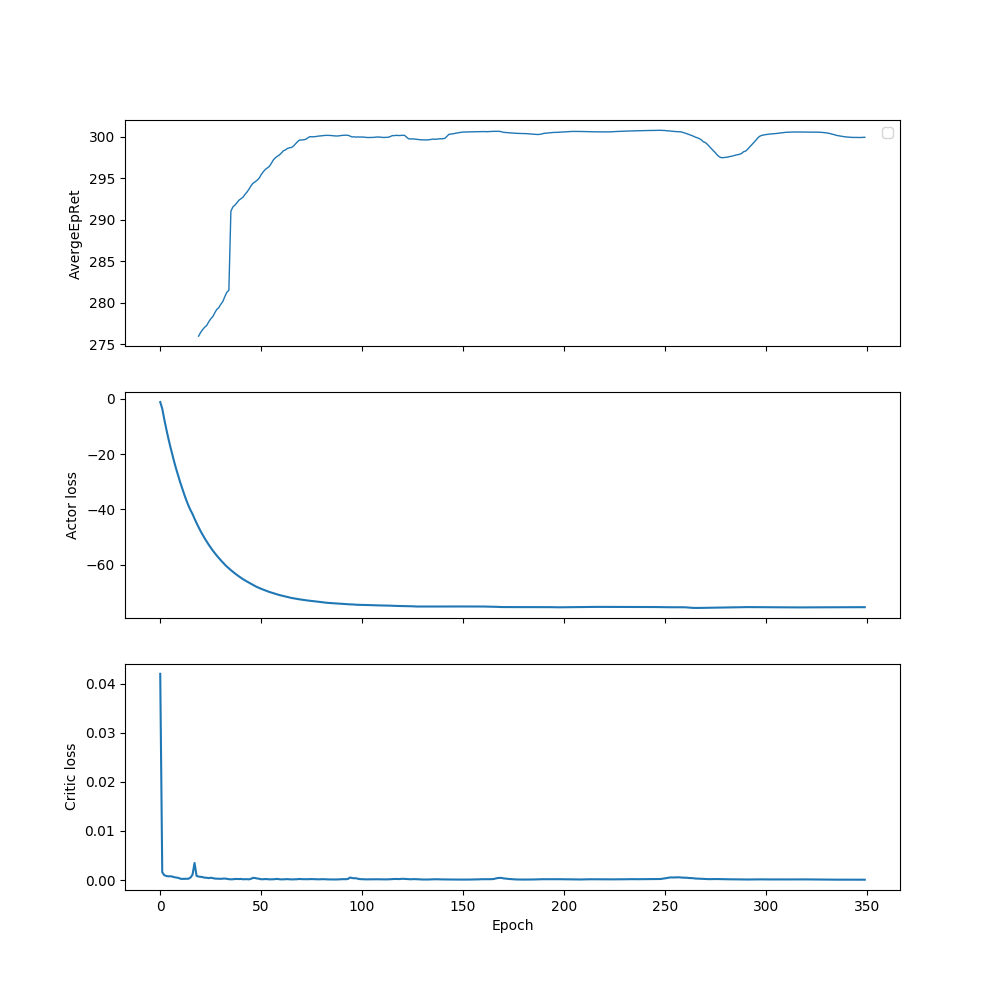

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


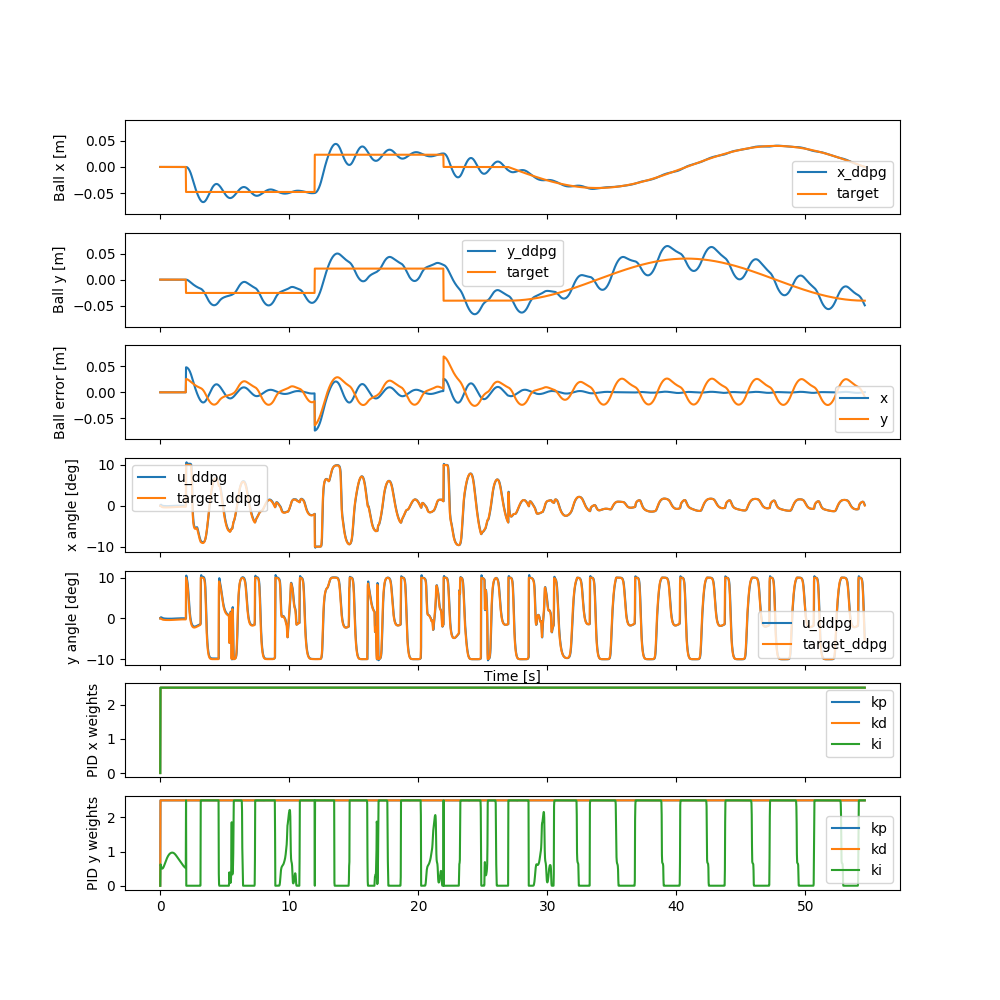

In [15]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [16]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [200]
gamma = 0.99
act = torch.nn.ReLU
name='le0.6_[200]_relu_0.99_long'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[200]_relu_0.99_long/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"ReLU",
        "hidden_sizes":	[
            200
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	350,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f52baa4d8d0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[200]_relu_0.99_long",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[200]_relu_0.99_long/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },
    "logger_kwargs

---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |             283 |
|          StdEpRet |               3 |
|          MaxEpRet |             287 |
|          MinEpRet |             280 |
|  AverageTestEpRet |             283 |
|      StdTestEpRet |               0 |
|      MaxTestEpRet |             283 |
|      MinTestEpRet |             283 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         8.8e+03 |
|      AverageQVals |              24 |
|          StdQVals |           0.969 |
|          MaxQVals |            27.3 |
|          MinQVals |            20.8 |
|            LossPi |           -24.1 |
|             LossQ |        0.000962 |
|              Time |             102 |
---------------------------------------
---------------------------------------
|             Epoch |               9 |
|      AverageEpRet |             286 |
|          StdEpRet |           0.982 |


---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             285 |
|          StdEpRet |           0.308 |
|          MaxEpRet |             285 |
|          MinEpRet |             284 |
|  AverageTestEpRet |             289 |
|      StdTestEpRet |           0.014 |
|      MaxTestEpRet |             289 |
|      MinTestEpRet |             289 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.98e+04 |
|      AverageQVals |            44.6 |
|          StdQVals |            1.29 |
|          MaxQVals |            47.1 |
|          MinQVals |            38.6 |
|            LossPi |           -44.6 |
|             LossQ |         0.00138 |
|              Time |             228 |
---------------------------------------
---------------------------------------
|             Epoch |              19 |
|      AverageEpRet |             285 |
|          StdEpRet |            4.27 |


---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             299 |
|          StdEpRet |          0.0677 |
|          MaxEpRet |             299 |
|          MinEpRet |             299 |
|  AverageTestEpRet |             299 |
|      StdTestEpRet |        0.000102 |
|      MaxTestEpRet |             299 |
|      MinTestEpRet |             299 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.08e+04 |
|      AverageQVals |            58.3 |
|          StdQVals |           0.859 |
|          MaxQVals |            62.1 |
|          MinQVals |            55.9 |
|            LossPi |           -58.3 |
|             LossQ |         0.00131 |
|              Time |             334 |
---------------------------------------
---------------------------------------
|             Epoch |              29 |
|      AverageEpRet |             299 |
|          StdEpRet |           0.212 |


---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             298 |
|          StdEpRet |           0.409 |
|          MaxEpRet |             298 |
|          MinEpRet |             297 |
|  AverageTestEpRet |             298 |
|      StdTestEpRet |        0.000493 |
|      MaxTestEpRet |             298 |
|      MinTestEpRet |             298 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.18e+04 |
|      AverageQVals |            65.6 |
|          StdQVals |           0.625 |
|          MaxQVals |            70.3 |
|          MinQVals |            61.6 |
|            LossPi |           -65.7 |
|             LossQ |         0.00202 |
|              Time |             419 |
---------------------------------------
---------------------------------------
|             Epoch |              39 |
|      AverageEpRet |             298 |
|          StdEpRet |            0.49 |


---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             292 |
|          StdEpRet |             1.9 |
|          MaxEpRet |             295 |
|          MinEpRet |             290 |
|  AverageTestEpRet |             293 |
|      StdTestEpRet |        0.000205 |
|      MaxTestEpRet |             293 |
|      MinTestEpRet |             293 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.28e+04 |
|      AverageQVals |              70 |
|          StdQVals |           0.448 |
|          MaxQVals |            75.1 |
|          MinQVals |            68.9 |
|            LossPi |             -70 |
|             LossQ |         0.00204 |
|              Time |             503 |
---------------------------------------
---------------------------------------
|             Epoch |              49 |
|      AverageEpRet |             292 |
|          StdEpRet |           0.366 |


---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             275 |
|          StdEpRet |            13.4 |
|          MaxEpRet |             289 |
|          MinEpRet |             257 |
|  AverageTestEpRet |             280 |
|      StdTestEpRet |           0.697 |
|      MaxTestEpRet |             283 |
|      MinTestEpRet |             280 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.38e+04 |
|      AverageQVals |            72.4 |
|          StdQVals |           0.627 |
|          MaxQVals |            93.4 |
|          MinQVals |            66.5 |
|            LossPi |           -72.5 |
|             LossQ |          0.0078 |
|              Time |             584 |
---------------------------------------
---------------------------------------
|             Epoch |              59 |
|      AverageEpRet |             280 |
|          StdEpRet |            1.53 |


---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             221 |
|          StdEpRet |            46.1 |
|          MaxEpRet |             273 |
|          MinEpRet |             161 |
|  AverageTestEpRet |             133 |
|      StdTestEpRet |            14.5 |
|      MaxTestEpRet |             196 |
|      MinTestEpRet |             128 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.48e+04 |
|      AverageQVals |            74.1 |
|          StdQVals |            3.84 |
|          MaxQVals |             157 |
|          MinQVals |            -9.7 |
|            LossPi |           -74.2 |
|             LossQ |          0.0236 |
|              Time |             665 |
---------------------------------------
---------------------------------------
|             Epoch |              69 |
|      AverageEpRet |             167 |
|          StdEpRet |            4.38 |


---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             294 |
|          StdEpRet |            1.91 |
|          MaxEpRet |             296 |
|          MinEpRet |             291 |
|  AverageTestEpRet |             295 |
|      StdTestEpRet |         0.00926 |
|      MaxTestEpRet |             295 |
|      MinTestEpRet |             295 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.58e+04 |
|      AverageQVals |            81.2 |
|          StdQVals |            5.14 |
|          MaxQVals |             125 |
|          MinQVals |           -2.62 |
|            LossPi |           -81.4 |
|             LossQ |            0.04 |
|              Time |             742 |
---------------------------------------
---------------------------------------
|             Epoch |              79 |
|      AverageEpRet |             287 |
|          StdEpRet |            4.69 |


---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             274 |
|          StdEpRet |           0.819 |
|          MaxEpRet |             275 |
|          MinEpRet |             273 |
|  AverageTestEpRet |             275 |
|      StdTestEpRet |        6.29e-05 |
|      MaxTestEpRet |             275 |
|      MinTestEpRet |             275 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.68e+04 |
|      AverageQVals |            86.8 |
|          StdQVals |            4.41 |
|          MaxQVals |             116 |
|          MinQVals |            22.5 |
|            LossPi |           -86.9 |
|             LossQ |          0.0392 |
|              Time |             833 |
---------------------------------------
---------------------------------------
|             Epoch |              89 |
|      AverageEpRet |             276 |
|          StdEpRet |            1.61 |


---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |            93.9 |
|          StdEpRet |            3.67 |
|          MaxEpRet |              99 |
|          MinEpRet |            90.5 |
|  AverageTestEpRet |             223 |
|      StdTestEpRet |            0.27 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |             222 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.08e+05 |
|      AverageQVals |            86.2 |
|          StdQVals |            4.24 |
|          MaxQVals |             117 |
|          MinQVals |            34.4 |
|            LossPi |           -86.3 |
|             LossQ |          0.0449 |
|              Time |             944 |
---------------------------------------
---------------------------------------
|             Epoch |              99 |
|      AverageEpRet |             223 |
|          StdEpRet |           0.988 |


---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             274 |
|          StdEpRet |            6.34 |
|          MaxEpRet |             280 |
|          MinEpRet |             265 |
|  AverageTestEpRet |             263 |
|      StdTestEpRet |           0.465 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |             261 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.19e+05 |
|      AverageQVals |            84.5 |
|          StdQVals |            4.25 |
|          MaxQVals |              97 |
|          MinQVals |            27.8 |
|            LossPi |           -84.7 |
|             LossQ |           0.046 |
|              Time |        1.07e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             109 |
|      AverageEpRet |             263 |
|          StdEpRet |            1.09 |


---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             288 |
|          StdEpRet |            10.2 |
|          MaxEpRet |             297 |
|          MinEpRet |             274 |
|  AverageTestEpRet |             277 |
|      StdTestEpRet |          0.0412 |
|      MaxTestEpRet |             277 |
|      MinTestEpRet |             276 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.3e+05 |
|      AverageQVals |            84.2 |
|          StdQVals |            5.49 |
|          MaxQVals |             207 |
|          MinQVals |            37.5 |
|            LossPi |           -84.4 |
|             LossQ |          0.0535 |
|              Time |         1.2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             119 |
|      AverageEpRet |             196 |
|          StdEpRet |            49.6 |


---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |           -84.3 |
|          StdEpRet |            17.3 |
|          MaxEpRet |           -66.7 |
|          MinEpRet |            -108 |
|  AverageTestEpRet |           -66.7 |
|      StdTestEpRet |          0.0699 |
|      MaxTestEpRet |           -66.7 |
|      MinTestEpRet |             -67 |
|             EpLen |             347 |
|         TestEpLen |             289 |
| TotalEnvInteracts |        1.41e+05 |
|      AverageQVals |            88.6 |
|          StdQVals |            13.1 |
|          MaxQVals |             299 |
|          MinQVals |            24.5 |
|            LossPi |           -88.9 |
|             LossQ |            2.49 |
|              Time |        1.33e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             129 |
|      AverageEpRet |            73.4 |
|          StdEpRet |             135 |


---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |            -163 |
|          StdEpRet |             7.7 |
|          MaxEpRet |            -156 |
|          MinEpRet |            -174 |
|  AverageTestEpRet |            -157 |
|      StdTestEpRet |            1.39 |
|      MaxTestEpRet |            -157 |
|      MinTestEpRet |            -163 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.52e+05 |
|      AverageQVals |            92.9 |
|          StdQVals |            9.43 |
|          MaxQVals |             143 |
|          MinQVals |            18.2 |
|            LossPi |           -93.1 |
|             LossQ |            0.68 |
|              Time |        1.46e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             139 |
|      AverageEpRet |            -158 |
|          StdEpRet |            15.4 |


---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             236 |
|          StdEpRet |              24 |
|          MaxEpRet |             270 |
|          MinEpRet |             218 |
|  AverageTestEpRet |             218 |
|      StdTestEpRet |          0.0056 |
|      MaxTestEpRet |             218 |
|      MinTestEpRet |             218 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.63e+05 |
|      AverageQVals |            94.4 |
|          StdQVals |            6.41 |
|          MaxQVals |             159 |
|          MinQVals |            32.7 |
|            LossPi |           -94.8 |
|             LossQ |           0.291 |
|              Time |        1.57e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             149 |
|      AverageEpRet |             218 |
|          StdEpRet |            4.36 |


---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             270 |
|          StdEpRet |            2.18 |
|          MaxEpRet |             273 |
|          MinEpRet |             268 |
|  AverageTestEpRet |             253 |
|      StdTestEpRet |            17.1 |
|      MaxTestEpRet |             270 |
|      MinTestEpRet |             235 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.74e+05 |
|      AverageQVals |            93.5 |
|          StdQVals |            13.3 |
|          MaxQVals |             228 |
|          MinQVals |            48.3 |
|            LossPi |           -93.8 |
|             LossQ |           0.845 |
|              Time |        1.65e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             159 |
|      AverageEpRet |             187 |
|          StdEpRet |            37.7 |


---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             189 |
|          StdEpRet |            82.1 |
|          MaxEpRet |             255 |
|          MinEpRet |            73.5 |
|  AverageTestEpRet |             266 |
|      StdTestEpRet |            1.08 |
|      MaxTestEpRet |             267 |
|      MinTestEpRet |             262 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.85e+05 |
|      AverageQVals |            97.9 |
|          StdQVals |            11.6 |
|          MaxQVals |             162 |
|          MinQVals |           -5.32 |
|            LossPi |           -98.5 |
|             LossQ |           0.414 |
|              Time |        1.74e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             169 |
|      AverageEpRet |             266 |
|          StdEpRet |            1.16 |


---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             262 |
|          StdEpRet |            5.54 |
|          MaxEpRet |             268 |
|          MinEpRet |             255 |
|  AverageTestEpRet |             256 |
|      StdTestEpRet |            10.9 |
|      MaxTestEpRet |             279 |
|      MinTestEpRet |             240 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.96e+05 |
|      AverageQVals |            96.3 |
|          StdQVals |            14.2 |
|          MaxQVals |             136 |
|          MinQVals |           -11.6 |
|            LossPi |           -96.6 |
|             LossQ |           0.166 |
|              Time |        1.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             179 |
|      AverageEpRet |             262 |
|          StdEpRet |            13.9 |


---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |           -73.4 |
|          StdEpRet |            73.5 |
|          MaxEpRet |            29.6 |
|          MinEpRet |            -137 |
|  AverageTestEpRet |            44.7 |
|      StdTestEpRet |             6.5 |
|      MaxTestEpRet |            53.3 |
|      MinTestEpRet |            31.7 |
|             EpLen |             400 |
|         TestEpLen |             396 |
| TotalEnvInteracts |        2.07e+05 |
|      AverageQVals |              97 |
|          StdQVals |            12.7 |
|          MaxQVals |             133 |
|          MinQVals |             -56 |
|            LossPi |           -97.4 |
|             LossQ |           0.184 |
|              Time |         1.9e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             189 |
|      AverageEpRet |              47 |
|          StdEpRet |            21.6 |


---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             279 |
|          StdEpRet |            1.67 |
|          MaxEpRet |             281 |
|          MinEpRet |             277 |
|  AverageTestEpRet |             281 |
|      StdTestEpRet |        4.04e-05 |
|      MaxTestEpRet |             281 |
|      MinTestEpRet |             281 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.18e+05 |
|      AverageQVals |            93.7 |
|          StdQVals |            11.7 |
|          MaxQVals |             139 |
|          MinQVals |           -37.3 |
|            LossPi |             -94 |
|             LossQ |           0.144 |
|              Time |        1.98e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             199 |
|      AverageEpRet |             281 |
|          StdEpRet |            2.39 |


---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             246 |
|          StdEpRet |            7.78 |
|          MaxEpRet |             255 |
|          MinEpRet |             236 |
|  AverageTestEpRet |             239 |
|      StdTestEpRet |            1.19 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |             238 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.29e+05 |
|      AverageQVals |            90.8 |
|          StdQVals |            9.49 |
|          MaxQVals |             119 |
|          MinQVals |           -70.9 |
|            LossPi |           -91.1 |
|             LossQ |           0.197 |
|              Time |        2.05e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             209 |
|      AverageEpRet |             238 |
|          StdEpRet |            1.26 |


---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             280 |
|          StdEpRet |            6.59 |
|          MaxEpRet |             287 |
|          MinEpRet |             271 |
|  AverageTestEpRet |             235 |
|      StdTestEpRet |            4.93 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |             234 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.4e+05 |
|      AverageQVals |            88.7 |
|          StdQVals |            9.14 |
|          MaxQVals |             136 |
|          MinQVals |           -74.1 |
|            LossPi |             -89 |
|             LossQ |           0.259 |
|              Time |        2.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             219 |
|      AverageEpRet |             242 |
|          StdEpRet |           0.161 |


---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             279 |
|          StdEpRet |            1.34 |
|          MaxEpRet |             280 |
|          MinEpRet |             277 |
|  AverageTestEpRet |             276 |
|      StdTestEpRet |            5.79 |
|      MaxTestEpRet |             282 |
|      MinTestEpRet |             261 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.51e+05 |
|      AverageQVals |            84.3 |
|          StdQVals |            12.6 |
|          MaxQVals |             108 |
|          MinQVals |           -84.3 |
|            LossPi |           -84.5 |
|             LossQ |           0.113 |
|              Time |        2.28e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             229 |
|      AverageEpRet |             272 |
|          StdEpRet |             7.1 |


---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             266 |
|          StdEpRet |            7.99 |
|          MaxEpRet |             275 |
|          MinEpRet |             256 |
|  AverageTestEpRet |             265 |
|      StdTestEpRet |            12.3 |
|      MaxTestEpRet |             278 |
|      MinTestEpRet |             234 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.62e+05 |
|      AverageQVals |            80.6 |
|          StdQVals |            13.2 |
|          MaxQVals |             105 |
|          MinQVals |           -44.3 |
|            LossPi |           -80.8 |
|             LossQ |          0.0918 |
|              Time |        2.41e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             239 |
|      AverageEpRet |             275 |
|          StdEpRet |            1.48 |


---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             274 |
|          StdEpRet |            7.76 |
|          MaxEpRet |             280 |
|          MinEpRet |             263 |
|  AverageTestEpRet |             282 |
|      StdTestEpRet |         0.00661 |
|      MaxTestEpRet |             282 |
|      MinTestEpRet |             282 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.73e+05 |
|      AverageQVals |            77.7 |
|          StdQVals |            12.7 |
|          MaxQVals |             112 |
|          MinQVals |           -43.5 |
|            LossPi |           -77.9 |
|             LossQ |           0.117 |
|              Time |        2.54e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             249 |
|      AverageEpRet |             284 |
|          StdEpRet |            2.78 |


---------------------------------------
|             Epoch |             258 |
|      AverageEpRet |             279 |
|          StdEpRet |           0.342 |
|          MaxEpRet |             279 |
|          MinEpRet |             278 |
|  AverageTestEpRet |             280 |
|      StdTestEpRet |        4.78e-05 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |             280 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.84e+05 |
|      AverageQVals |            77.6 |
|          StdQVals |            11.2 |
|          MaxQVals |             101 |
|          MinQVals |           -52.8 |
|            LossPi |           -77.9 |
|             LossQ |           0.132 |
|              Time |        2.66e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             259 |
|      AverageEpRet |             280 |
|          StdEpRet |            2.34 |


---------------------------------------
|             Epoch |             268 |
|      AverageEpRet |             235 |
|          StdEpRet |            4.72 |
|          MaxEpRet |             241 |
|          MinEpRet |             230 |
|  AverageTestEpRet |             265 |
|      StdTestEpRet |            6.17 |
|      MaxTestEpRet |             275 |
|      MinTestEpRet |             250 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.95e+05 |
|      AverageQVals |            81.3 |
|          StdQVals |            9.28 |
|          MaxQVals |             106 |
|          MinQVals |           -16.1 |
|            LossPi |           -81.6 |
|             LossQ |           0.216 |
|              Time |        2.79e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             269 |
|      AverageEpRet |             259 |
|          StdEpRet |            3.47 |


---------------------------------------
|             Epoch |             278 |
|      AverageEpRet |             288 |
|          StdEpRet |            2.14 |
|          MaxEpRet |             291 |
|          MinEpRet |             286 |
|  AverageTestEpRet |             287 |
|      StdTestEpRet |          0.0377 |
|      MaxTestEpRet |             287 |
|      MinTestEpRet |             287 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.06e+05 |
|      AverageQVals |            82.6 |
|          StdQVals |            11.6 |
|          MaxQVals |             114 |
|          MinQVals |           -25.8 |
|            LossPi |           -82.8 |
|             LossQ |           0.127 |
|              Time |        2.89e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             279 |
|      AverageEpRet |             289 |
|          StdEpRet |            2.56 |


---------------------------------------
|             Epoch |             288 |
|      AverageEpRet |             266 |
|          StdEpRet |            6.74 |
|          MaxEpRet |             275 |
|          MinEpRet |             261 |
|  AverageTestEpRet |             273 |
|      StdTestEpRet |         0.00281 |
|      MaxTestEpRet |             273 |
|      MinTestEpRet |             273 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.17e+05 |
|      AverageQVals |            80.5 |
|          StdQVals |            12.3 |
|          MaxQVals |             121 |
|          MinQVals |           -20.6 |
|            LossPi |           -80.7 |
|             LossQ |           0.133 |
|              Time |        3.01e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             289 |
|      AverageEpRet |             275 |
|          StdEpRet |            1.83 |


---------------------------------------
|             Epoch |             298 |
|      AverageEpRet |             276 |
|          StdEpRet |            3.26 |
|          MaxEpRet |             279 |
|          MinEpRet |             271 |
|  AverageTestEpRet |             275 |
|      StdTestEpRet |          0.0151 |
|      MaxTestEpRet |             275 |
|      MinTestEpRet |             275 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.28e+05 |
|      AverageQVals |            82.8 |
|          StdQVals |            11.1 |
|          MaxQVals |             120 |
|          MinQVals |           -14.3 |
|            LossPi |           -83.1 |
|             LossQ |           0.132 |
|              Time |        3.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             299 |
|      AverageEpRet |             274 |
|          StdEpRet |           0.375 |


---------------------------------------
|             Epoch |             308 |
|      AverageEpRet |             232 |
|          StdEpRet |            12.5 |
|          MaxEpRet |             241 |
|          MinEpRet |             214 |
|  AverageTestEpRet |             250 |
|      StdTestEpRet |            3.79 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |             243 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.39e+05 |
|      AverageQVals |            82.9 |
|          StdQVals |            10.2 |
|          MaxQVals |             117 |
|          MinQVals |           -36.2 |
|            LossPi |           -83.2 |
|             LossQ |           0.132 |
|              Time |        3.29e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             309 |
|      AverageEpRet |             251 |
|          StdEpRet |            7.56 |


---------------------------------------
|             Epoch |             318 |
|      AverageEpRet |             275 |
|          StdEpRet |            3.54 |
|          MaxEpRet |             280 |
|          MinEpRet |             272 |
|  AverageTestEpRet |             276 |
|      StdTestEpRet |         0.00149 |
|      MaxTestEpRet |             276 |
|      MinTestEpRet |             276 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         3.5e+05 |
|      AverageQVals |            81.1 |
|          StdQVals |            10.7 |
|          MaxQVals |             140 |
|          MinQVals |           -41.2 |
|            LossPi |           -81.3 |
|             LossQ |           0.125 |
|              Time |        3.41e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             319 |
|      AverageEpRet |             275 |
|          StdEpRet |            4.28 |


---------------------------------------
|             Epoch |             328 |
|      AverageEpRet |             291 |
|          StdEpRet |            1.15 |
|          MaxEpRet |             293 |
|          MinEpRet |             290 |
|  AverageTestEpRet |             290 |
|      StdTestEpRet |         0.00249 |
|      MaxTestEpRet |             290 |
|      MinTestEpRet |             290 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.61e+05 |
|      AverageQVals |              83 |
|          StdQVals |            11.2 |
|          MaxQVals |             170 |
|          MinQVals |           -81.6 |
|            LossPi |           -83.3 |
|             LossQ |           0.169 |
|              Time |        3.54e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             329 |
|      AverageEpRet |             288 |
|          StdEpRet |            2.67 |


---------------------------------------
|             Epoch |             338 |
|      AverageEpRet |             296 |
|          StdEpRet |            1.14 |
|          MaxEpRet |             298 |
|          MinEpRet |             295 |
|  AverageTestEpRet |             298 |
|      StdTestEpRet |        8.55e-05 |
|      MaxTestEpRet |             298 |
|      MinTestEpRet |             298 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.72e+05 |
|      AverageQVals |              85 |
|          StdQVals |            12.6 |
|          MaxQVals |             147 |
|          MinQVals |           -44.3 |
|            LossPi |           -85.3 |
|             LossQ |           0.124 |
|              Time |        3.68e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             339 |
|      AverageEpRet |             298 |
|          StdEpRet |           0.733 |


---------------------------------------
|             Epoch |             348 |
|      AverageEpRet |             275 |
|          StdEpRet |            14.9 |
|          MaxEpRet |             295 |
|          MinEpRet |             260 |
|  AverageTestEpRet |            58.3 |
|      StdTestEpRet |            37.2 |
|      MaxTestEpRet |            97.7 |
|      MinTestEpRet |            20.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.83e+05 |
|      AverageQVals |            85.1 |
|          StdQVals |            14.2 |
|          MaxQVals |             155 |
|          MinQVals |           -50.3 |
|            LossPi |           -85.3 |
|             LossQ |           0.152 |
|              Time |        3.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             349 |
|      AverageEpRet |             186 |
|          StdEpRet |            47.2 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.27596137242154867


<IPython.core.display.Javascript object>


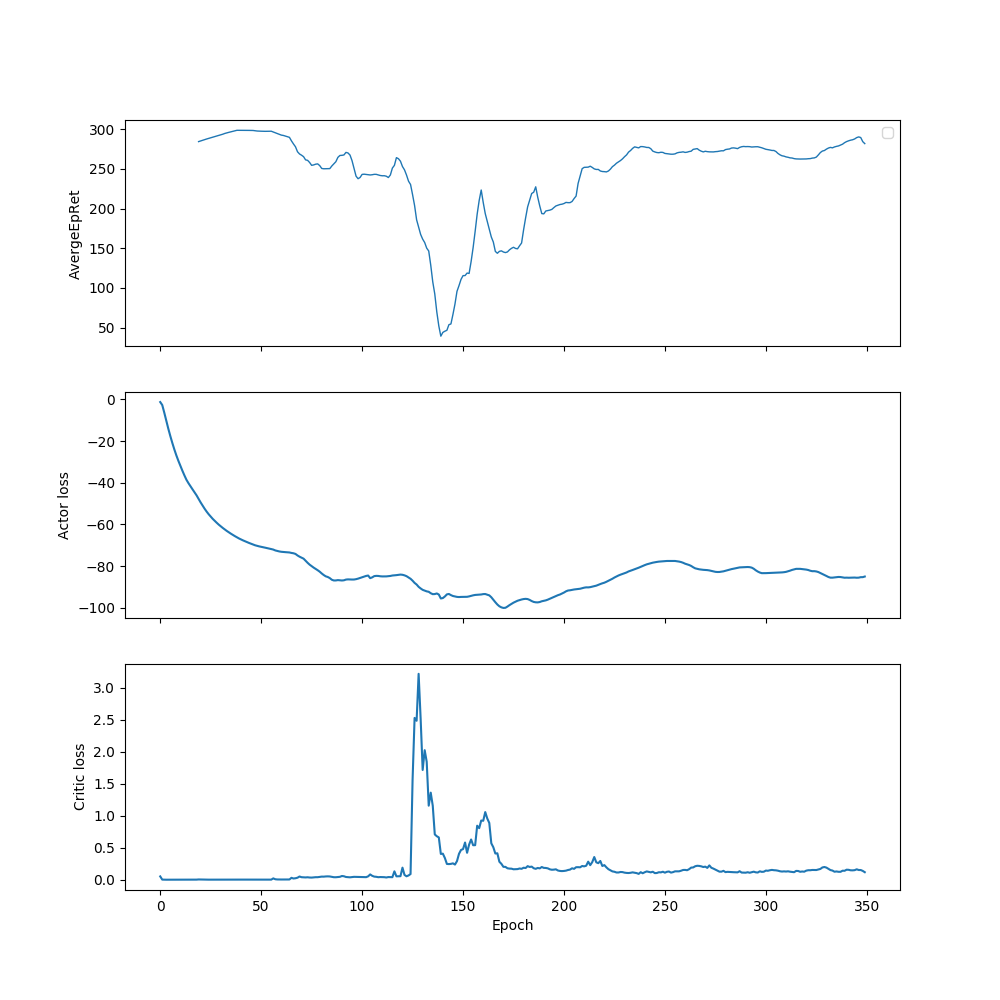

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


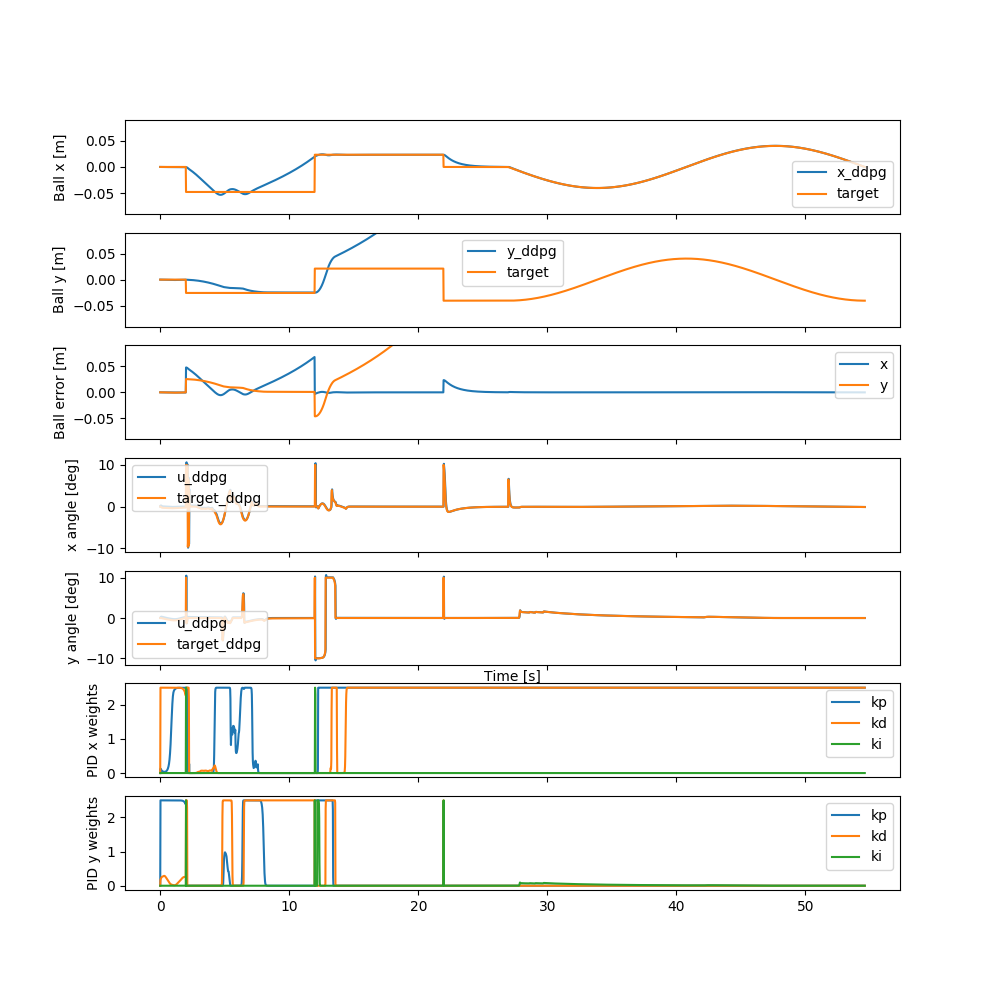

In [17]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [8]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [100]
gamma = 0.99
act = torch.nn.ReLU
name='le0.6_[100]_relu_0.99_hard'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[100]_relu_0.99_hard/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"ReLU",
        "hidden_sizes":	[
            100
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f8f10d30630>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[100]_relu_0.99_hard",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[100]_relu_0.99_hard/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },
    "logger_kwargs

/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


---------------------------------------
|             Epoch |               1 |
|      AverageEpRet |             123 |
|          StdEpRet |            11.7 |
|          MaxEpRet |             135 |
|          MinEpRet |             111 |
|  AverageTestEpRet |            63.6 |
|      StdTestEpRet |            46.2 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |            14.5 |
|             EpLen |             400 |
|         TestEpLen |             391 |
| TotalEnvInteracts |         1.1e+03 |
|      AverageQVals |           0.188 |
|          StdQVals |            0.22 |
|          MaxQVals |            3.54 |
|          MinQVals |           -6.38 |
|            LossPi |          -0.312 |
|             LossQ |           0.136 |
|              Time |            3.58 |
---------------------------------------
---------------------------------------
|             Epoch |               2 |
|      AverageEpRet |            32.7 |
|          StdEpRet |            27.6 |


---------------------------------------
|             Epoch |              11 |
|      AverageEpRet |            64.6 |
|          StdEpRet |              26 |
|          MaxEpRet |             101 |
|          MinEpRet |            44.6 |
|  AverageTestEpRet |            31.4 |
|      StdTestEpRet |            47.3 |
|      MaxTestEpRet |             119 |
|      MinTestEpRet |             -62 |
|             EpLen |             400 |
|         TestEpLen |             387 |
| TotalEnvInteracts |        1.21e+04 |
|      AverageQVals |            31.4 |
|          StdQVals |            8.97 |
|          MaxQVals |            51.9 |
|          MinQVals |           -16.4 |
|            LossPi |           -32.4 |
|             LossQ |            1.53 |
|              Time |            85.6 |
---------------------------------------
---------------------------------------
|             Epoch |              12 |
|      AverageEpRet |            87.5 |
|          StdEpRet |            50.2 |


---------------------------------------
|             Epoch |              21 |
|      AverageEpRet |           -59.7 |
|          StdEpRet |            11.8 |
|          MaxEpRet |           -47.9 |
|          MinEpRet |           -71.4 |
|  AverageTestEpRet |            22.3 |
|      StdTestEpRet |             102 |
|      MaxTestEpRet |             202 |
|      MinTestEpRet |           -86.9 |
|             EpLen |             400 |
|         TestEpLen |             398 |
| TotalEnvInteracts |        2.31e+04 |
|      AverageQVals |            44.8 |
|          StdQVals |            13.3 |
|          MaxQVals |            68.8 |
|          MinQVals |           -49.6 |
|            LossPi |           -45.2 |
|             LossQ |            2.97 |
|              Time |             158 |
---------------------------------------
---------------------------------------
|             Epoch |              22 |
|      AverageEpRet |             -13 |
|          StdEpRet |            42.8 |


---------------------------------------
|             Epoch |              31 |
|      AverageEpRet |             196 |
|          StdEpRet |            36.6 |
|          MaxEpRet |             230 |
|          MinEpRet |             146 |
|  AverageTestEpRet |             128 |
|      StdTestEpRet |            63.3 |
|      MaxTestEpRet |             235 |
|      MinTestEpRet |            35.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.41e+04 |
|      AverageQVals |            49.4 |
|          StdQVals |            15.4 |
|          MaxQVals |            80.7 |
|          MinQVals |           -33.7 |
|            LossPi |           -49.9 |
|             LossQ |            3.25 |
|              Time |             243 |
---------------------------------------
---------------------------------------
|             Epoch |              32 |
|      AverageEpRet |            99.4 |
|          StdEpRet |            76.9 |


---------------------------------------
|             Epoch |              41 |
|      AverageEpRet |             125 |
|          StdEpRet |            94.2 |
|          MaxEpRet |             220 |
|          MinEpRet |            31.2 |
|  AverageTestEpRet |             149 |
|      StdTestEpRet |            56.3 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |            60.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.51e+04 |
|      AverageQVals |            53.9 |
|          StdQVals |            15.9 |
|          MaxQVals |            88.3 |
|          MinQVals |           -30.8 |
|            LossPi |           -54.3 |
|             LossQ |            4.01 |
|              Time |             338 |
---------------------------------------
---------------------------------------
|             Epoch |              42 |
|      AverageEpRet |             176 |
|          StdEpRet |            37.6 |


---------------------------------------
|             Epoch |              51 |
|      AverageEpRet |             172 |
|          StdEpRet |            28.7 |
|          MaxEpRet |             212 |
|          MinEpRet |             146 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            36.5 |
|      MaxTestEpRet |             206 |
|      MinTestEpRet |            78.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.61e+04 |
|      AverageQVals |            57.5 |
|          StdQVals |              14 |
|          MaxQVals |            88.6 |
|          MinQVals |             -30 |
|            LossPi |           -57.9 |
|             LossQ |            2.92 |
|              Time |             443 |
---------------------------------------
---------------------------------------
|             Epoch |              52 |
|      AverageEpRet |             194 |
|          StdEpRet |            36.6 |


---------------------------------------
|             Epoch |              61 |
|      AverageEpRet |            96.7 |
|          StdEpRet |            29.5 |
|          MaxEpRet |             126 |
|          MinEpRet |            67.2 |
|  AverageTestEpRet |             178 |
|      StdTestEpRet |            38.3 |
|      MaxTestEpRet |             238 |
|      MinTestEpRet |            98.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.71e+04 |
|      AverageQVals |            58.3 |
|          StdQVals |            13.8 |
|          MaxQVals |              85 |
|          MinQVals |           -26.9 |
|            LossPi |           -58.6 |
|             LossQ |            2.99 |
|              Time |             551 |
---------------------------------------
---------------------------------------
|             Epoch |              62 |
|      AverageEpRet |             167 |
|          StdEpRet |              46 |


---------------------------------------
|             Epoch |              71 |
|      AverageEpRet |             200 |
|          StdEpRet |              34 |
|          MaxEpRet |             227 |
|          MinEpRet |             152 |
|  AverageTestEpRet |             161 |
|      StdTestEpRet |            53.8 |
|      MaxTestEpRet |             252 |
|      MinTestEpRet |            17.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.81e+04 |
|      AverageQVals |            57.4 |
|          StdQVals |              14 |
|          MaxQVals |            84.1 |
|          MinQVals |             -20 |
|            LossPi |           -57.7 |
|             LossQ |             3.7 |
|              Time |             665 |
---------------------------------------
---------------------------------------
|             Epoch |              72 |
|      AverageEpRet |             152 |
|          StdEpRet |            44.8 |


---------------------------------------
|             Epoch |              81 |
|      AverageEpRet |             168 |
|          StdEpRet |            68.9 |
|          MaxEpRet |             237 |
|          MinEpRet |            98.8 |
|  AverageTestEpRet |             142 |
|      StdTestEpRet |            57.1 |
|      MaxTestEpRet |             218 |
|      MinTestEpRet |            8.95 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.91e+04 |
|      AverageQVals |              56 |
|          StdQVals |            13.5 |
|          MaxQVals |            85.2 |
|          MinQVals |           -34.3 |
|            LossPi |           -56.3 |
|             LossQ |             3.9 |
|              Time |             782 |
---------------------------------------
---------------------------------------
|             Epoch |              82 |
|      AverageEpRet |             153 |
|          StdEpRet |            18.9 |


---------------------------------------
|             Epoch |              91 |
|      AverageEpRet |             138 |
|          StdEpRet |            8.23 |
|          MaxEpRet |             148 |
|          MinEpRet |             128 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |            37.6 |
|      MaxTestEpRet |             218 |
|      MinTestEpRet |            91.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |           1e+05 |
|      AverageQVals |            54.6 |
|          StdQVals |            13.3 |
|          MaxQVals |            81.2 |
|          MinQVals |           -47.1 |
|            LossPi |           -54.9 |
|             LossQ |            3.67 |
|              Time |             905 |
---------------------------------------
---------------------------------------
|             Epoch |              92 |
|      AverageEpRet |             185 |
|          StdEpRet |            30.3 |


---------------------------------------
|             Epoch |             101 |
|      AverageEpRet |             128 |
|          StdEpRet |            8.82 |
|          MaxEpRet |             137 |
|          MinEpRet |             120 |
|  AverageTestEpRet |             161 |
|      StdTestEpRet |            37.6 |
|      MaxTestEpRet |             226 |
|      MinTestEpRet |              89 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.11e+05 |
|      AverageQVals |            54.8 |
|          StdQVals |            13.2 |
|          MaxQVals |              79 |
|          MinQVals |           -32.7 |
|            LossPi |           -55.1 |
|             LossQ |            3.89 |
|              Time |        1.02e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             102 |
|      AverageEpRet |             142 |
|          StdEpRet |            47.4 |


---------------------------------------
|             Epoch |             111 |
|      AverageEpRet |             103 |
|          StdEpRet |            27.6 |
|          MaxEpRet |             132 |
|          MinEpRet |            65.6 |
|  AverageTestEpRet |             145 |
|      StdTestEpRet |            35.3 |
|      MaxTestEpRet |             208 |
|      MinTestEpRet |            84.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.22e+05 |
|      AverageQVals |            55.2 |
|          StdQVals |            13.1 |
|          MaxQVals |            77.9 |
|          MinQVals |           -33.4 |
|            LossPi |           -55.5 |
|             LossQ |            4.16 |
|              Time |        1.11e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             112 |
|      AverageEpRet |             179 |
|          StdEpRet |            5.96 |


---------------------------------------
|             Epoch |             121 |
|      AverageEpRet |             155 |
|          StdEpRet |            31.1 |
|          MaxEpRet |             186 |
|          MinEpRet |             124 |
|  AverageTestEpRet |             132 |
|      StdTestEpRet |            63.9 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |            17.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.33e+05 |
|      AverageQVals |            54.5 |
|          StdQVals |            12.5 |
|          MaxQVals |            78.4 |
|          MinQVals |           -27.3 |
|            LossPi |           -54.8 |
|             LossQ |            3.32 |
|              Time |        1.19e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             122 |
|      AverageEpRet |             190 |
|          StdEpRet |            17.6 |


---------------------------------------
|             Epoch |             131 |
|      AverageEpRet |             107 |
|          StdEpRet |            53.8 |
|          MaxEpRet |             151 |
|          MinEpRet |            31.6 |
|  AverageTestEpRet |             160 |
|      StdTestEpRet |            58.1 |
|      MaxTestEpRet |             250 |
|      MinTestEpRet |            26.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.44e+05 |
|      AverageQVals |            53.7 |
|          StdQVals |            12.7 |
|          MaxQVals |            80.4 |
|          MinQVals |           -28.4 |
|            LossPi |             -54 |
|             LossQ |             3.7 |
|              Time |        1.27e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             132 |
|      AverageEpRet |            92.2 |
|          StdEpRet |              37 |


---------------------------------------
|             Epoch |             141 |
|      AverageEpRet |             128 |
|          StdEpRet |            38.7 |
|          MaxEpRet |             166 |
|          MinEpRet |              89 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |            44.7 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |            71.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.55e+05 |
|      AverageQVals |            52.9 |
|          StdQVals |            12.5 |
|          MaxQVals |            75.9 |
|          MinQVals |           -38.2 |
|            LossPi |           -53.1 |
|             LossQ |            3.75 |
|              Time |        1.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             142 |
|      AverageEpRet |             178 |
|          StdEpRet |            36.2 |


---------------------------------------
|             Epoch |             151 |
|      AverageEpRet |             152 |
|          StdEpRet |            38.9 |
|          MaxEpRet |             198 |
|          MinEpRet |             103 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |            57.6 |
|      MaxTestEpRet |             238 |
|      MinTestEpRet |            32.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.66e+05 |
|      AverageQVals |              52 |
|          StdQVals |            12.1 |
|          MaxQVals |            75.8 |
|          MinQVals |           -27.7 |
|            LossPi |           -52.3 |
|             LossQ |            3.45 |
|              Time |        1.41e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             152 |
|      AverageEpRet |             233 |
|          StdEpRet |            5.94 |


---------------------------------------
|             Epoch |             161 |
|      AverageEpRet |             129 |
|          StdEpRet |            48.8 |
|          MaxEpRet |             178 |
|          MinEpRet |            80.3 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            46.5 |
|      MaxTestEpRet |             225 |
|      MinTestEpRet |            54.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.77e+05 |
|      AverageQVals |            51.5 |
|          StdQVals |            11.8 |
|          MaxQVals |            74.2 |
|          MinQVals |           -35.6 |
|            LossPi |           -51.8 |
|             LossQ |            3.69 |
|              Time |        1.48e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             162 |
|      AverageEpRet |             147 |
|          StdEpRet |            46.4 |


---------------------------------------
|             Epoch |             171 |
|      AverageEpRet |             123 |
|          StdEpRet |            84.4 |
|          MaxEpRet |             216 |
|          MinEpRet |            11.5 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |            41.4 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |            67.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.88e+05 |
|      AverageQVals |            51.9 |
|          StdQVals |              12 |
|          MaxQVals |            72.3 |
|          MinQVals |           -26.8 |
|            LossPi |           -52.2 |
|             LossQ |            3.59 |
|              Time |        1.54e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             172 |
|      AverageEpRet |             102 |
|          StdEpRet |            35.4 |


---------------------------------------
|             Epoch |             181 |
|      AverageEpRet |             128 |
|          StdEpRet |            7.52 |
|          MaxEpRet |             135 |
|          MinEpRet |             120 |
|  AverageTestEpRet |             128 |
|      StdTestEpRet |              45 |
|      MaxTestEpRet |             199 |
|      MinTestEpRet |              44 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.99e+05 |
|      AverageQVals |            53.7 |
|          StdQVals |            11.8 |
|          MaxQVals |            73.9 |
|          MinQVals |           -25.6 |
|            LossPi |             -54 |
|             LossQ |            3.79 |
|              Time |        1.62e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             182 |
|      AverageEpRet |             138 |
|          StdEpRet |            19.4 |


---------------------------------------
|             Epoch |             191 |
|      AverageEpRet |             157 |
|          StdEpRet |            12.4 |
|          MaxEpRet |             168 |
|          MinEpRet |             140 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |            49.3 |
|      MaxTestEpRet |             208 |
|      MinTestEpRet |            50.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.1e+05 |
|      AverageQVals |            54.8 |
|          StdQVals |            10.7 |
|          MaxQVals |            75.7 |
|          MinQVals |           -25.5 |
|            LossPi |             -55 |
|             LossQ |            3.23 |
|              Time |        1.68e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             192 |
|      AverageEpRet |             154 |
|          StdEpRet |            60.9 |


---------------------------------------
|             Epoch |             201 |
|      AverageEpRet |             123 |
|          StdEpRet |            26.7 |
|          MaxEpRet |             149 |
|          MinEpRet |            95.9 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            42.1 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |            67.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.21e+05 |
|      AverageQVals |            53.9 |
|          StdQVals |            10.6 |
|          MaxQVals |            76.7 |
|          MinQVals |           -30.7 |
|            LossPi |           -54.1 |
|             LossQ |            3.41 |
|              Time |        1.75e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             202 |
|      AverageEpRet |             144 |
|          StdEpRet |              54 |


---------------------------------------
|             Epoch |             211 |
|      AverageEpRet |             168 |
|          StdEpRet |            35.4 |
|          MaxEpRet |             197 |
|          MinEpRet |             118 |
|  AverageTestEpRet |             159 |
|      StdTestEpRet |            44.2 |
|      MaxTestEpRet |             239 |
|      MinTestEpRet |            76.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.32e+05 |
|      AverageQVals |              52 |
|          StdQVals |            10.9 |
|          MaxQVals |            74.8 |
|          MinQVals |           -41.5 |
|            LossPi |           -52.2 |
|             LossQ |             3.5 |
|              Time |        1.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             212 |
|      AverageEpRet |             176 |
|          StdEpRet |            20.2 |


---------------------------------------
|             Epoch |             221 |
|      AverageEpRet |             124 |
|          StdEpRet |           0.574 |
|          MaxEpRet |             125 |
|          MinEpRet |             124 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            42.3 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |            98.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.43e+05 |
|      AverageQVals |              51 |
|          StdQVals |            11.1 |
|          MaxQVals |            71.4 |
|          MinQVals |           -34.7 |
|            LossPi |           -51.2 |
|             LossQ |            3.54 |
|              Time |        1.89e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             222 |
|      AverageEpRet |             158 |
|          StdEpRet |            32.4 |


---------------------------------------
|             Epoch |             231 |
|      AverageEpRet |             200 |
|          StdEpRet |            34.4 |
|          MaxEpRet |             246 |
|          MinEpRet |             163 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            28.9 |
|      MaxTestEpRet |             195 |
|      MinTestEpRet |            92.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.54e+05 |
|      AverageQVals |            51.5 |
|          StdQVals |            11.8 |
|          MaxQVals |            72.9 |
|          MinQVals |           -33.4 |
|            LossPi |           -51.7 |
|             LossQ |            3.89 |
|              Time |        1.95e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             232 |
|      AverageEpRet |             144 |
|          StdEpRet |            23.3 |


---------------------------------------
|             Epoch |             241 |
|      AverageEpRet |             148 |
|          StdEpRet |            38.3 |
|          MaxEpRet |             186 |
|          MinEpRet |             110 |
|  AverageTestEpRet |             176 |
|      StdTestEpRet |            38.2 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |            90.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.65e+05 |
|      AverageQVals |            52.1 |
|          StdQVals |            11.8 |
|          MaxQVals |            74.1 |
|          MinQVals |           -33.6 |
|            LossPi |           -52.3 |
|             LossQ |            3.95 |
|              Time |        2.02e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             242 |
|      AverageEpRet |             159 |
|          StdEpRet |              22 |


{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0003117684639162674


<IPython.core.display.Javascript object>


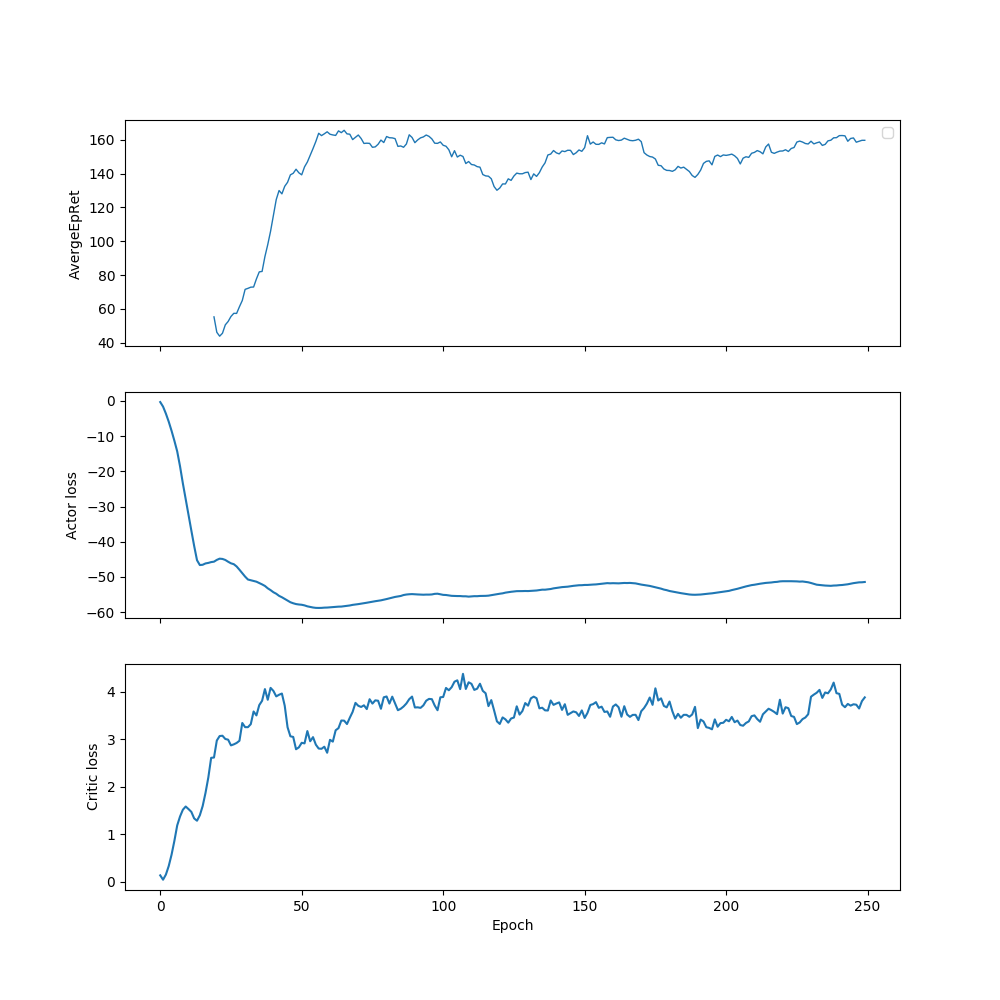

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


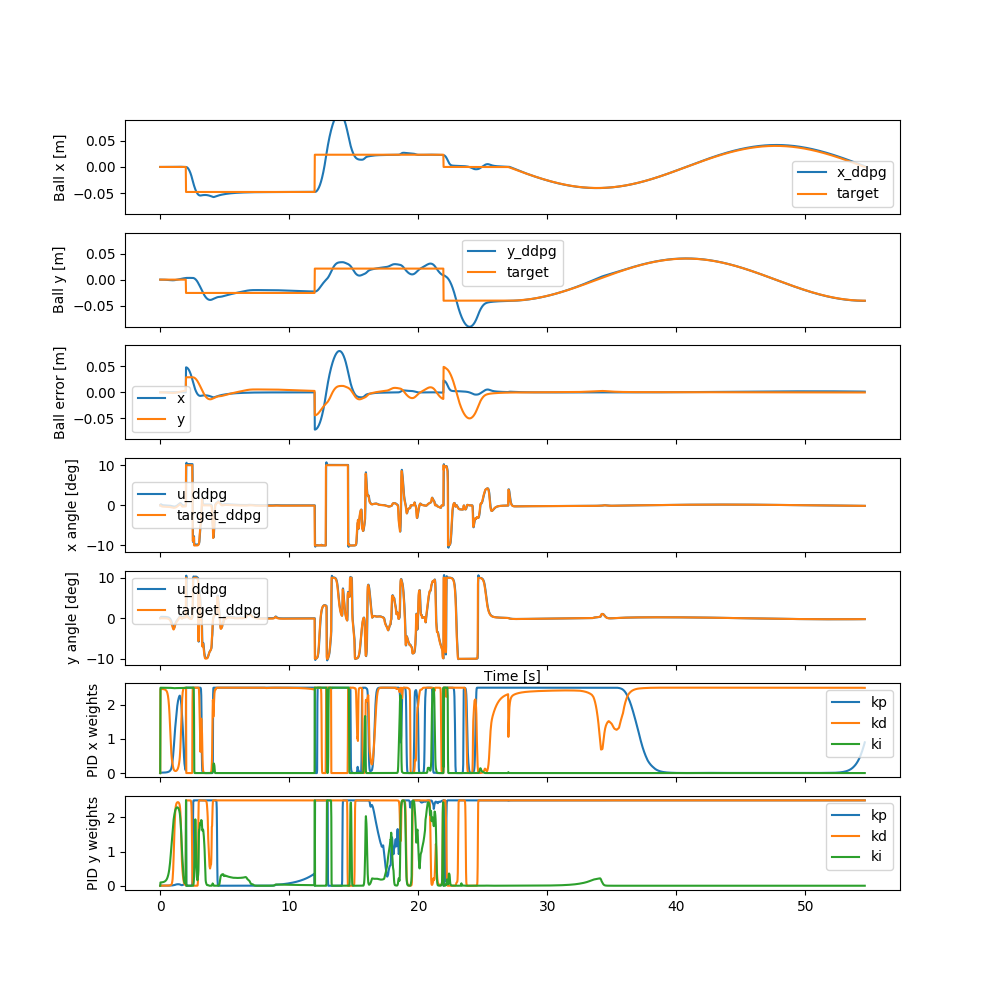

In [9]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [10]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [200]
gamma = 0.99
act = torch.nn.ReLU
name='le0.6_[200]_relu_0.99_hard'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[200]_relu_0.99_hard/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"ReLU",
        "hidden_sizes":	[
            200
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f8f10a19f98>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[200]_relu_0.99_hard",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[200]_relu_0.99_hard/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
            }
        }
    },
    "logger_kwargs

---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |              40 |
|          StdEpRet |            26.3 |
|          MaxEpRet |            68.5 |
|          MinEpRet |            5.04 |
|  AverageTestEpRet |            64.4 |
|      StdTestEpRet |            62.4 |
|      MaxTestEpRet |             168 |
|      MinTestEpRet |             -30 |
|             EpLen |             400 |
|         TestEpLen |             393 |
| TotalEnvInteracts |         8.8e+03 |
|      AverageQVals |            17.4 |
|          StdQVals |            6.39 |
|          MaxQVals |            30.9 |
|          MinQVals |           -18.2 |
|            LossPi |             -18 |
|             LossQ |           0.833 |
|              Time |            52.7 |
---------------------------------------
---------------------------------------
|             Epoch |               9 |
|      AverageEpRet |             124 |
|          StdEpRet |            48.9 |


---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |         -0.0296 |
|          StdEpRet |            28.2 |
|          MaxEpRet |            35.2 |
|          MinEpRet |           -33.9 |
|  AverageTestEpRet |            28.4 |
|      StdTestEpRet |            32.9 |
|      MaxTestEpRet |             119 |
|      MinTestEpRet |           -8.61 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.98e+04 |
|      AverageQVals |              36 |
|          StdQVals |              13 |
|          MaxQVals |              64 |
|          MinQVals |           -31.8 |
|            LossPi |           -36.4 |
|             LossQ |            1.92 |
|              Time |             125 |
---------------------------------------
---------------------------------------
|             Epoch |              19 |
|      AverageEpRet |            16.5 |
|          StdEpRet |            6.64 |


---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             106 |
|          StdEpRet |            22.8 |
|          MaxEpRet |             134 |
|          MinEpRet |            78.6 |
|  AverageTestEpRet |            75.9 |
|      StdTestEpRet |              72 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |           -53.9 |
|             EpLen |             400 |
|         TestEpLen |             393 |
| TotalEnvInteracts |        3.08e+04 |
|      AverageQVals |            44.9 |
|          StdQVals |            18.3 |
|          MaxQVals |            85.3 |
|          MinQVals |           -64.2 |
|            LossPi |           -45.4 |
|             LossQ |            3.77 |
|              Time |             209 |
---------------------------------------
---------------------------------------
|             Epoch |              29 |
|      AverageEpRet |            47.3 |
|          StdEpRet |            80.2 |


---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             157 |
|          StdEpRet |              30 |
|          MaxEpRet |             194 |
|          MinEpRet |             120 |
|  AverageTestEpRet |             141 |
|      StdTestEpRet |            53.4 |
|      MaxTestEpRet |             235 |
|      MinTestEpRet |            38.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.18e+04 |
|      AverageQVals |            51.2 |
|          StdQVals |              18 |
|          MaxQVals |            89.7 |
|          MinQVals |           -62.9 |
|            LossPi |           -51.7 |
|             LossQ |            4.15 |
|              Time |             320 |
---------------------------------------
---------------------------------------
|             Epoch |              39 |
|      AverageEpRet |             203 |
|          StdEpRet |            10.1 |


---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             163 |
|          StdEpRet |            9.89 |
|          MaxEpRet |             173 |
|          MinEpRet |             149 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            36.8 |
|      MaxTestEpRet |             195 |
|      MinTestEpRet |            66.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.28e+04 |
|      AverageQVals |            57.5 |
|          StdQVals |            16.3 |
|          MaxQVals |            94.8 |
|          MinQVals |           -58.7 |
|            LossPi |             -58 |
|             LossQ |            3.23 |
|              Time |             436 |
---------------------------------------
---------------------------------------
|             Epoch |              49 |
|      AverageEpRet |             132 |
|          StdEpRet |              28 |


---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             195 |
|          StdEpRet |            28.5 |
|          MaxEpRet |             218 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            43.6 |
|      MaxTestEpRet |             244 |
|      MinTestEpRet |            70.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.38e+04 |
|      AverageQVals |            59.1 |
|          StdQVals |            14.1 |
|          MaxQVals |            87.1 |
|          MinQVals |           -37.8 |
|            LossPi |           -59.5 |
|             LossQ |            2.84 |
|              Time |             559 |
---------------------------------------
---------------------------------------
|             Epoch |              59 |
|      AverageEpRet |             169 |
|          StdEpRet |              17 |


---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             170 |
|          StdEpRet |            27.3 |
|          MaxEpRet |             208 |
|          MinEpRet |             144 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            45.9 |
|      MaxTestEpRet |             219 |
|      MinTestEpRet |            65.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.48e+04 |
|      AverageQVals |            60.9 |
|          StdQVals |            13.7 |
|          MaxQVals |            90.8 |
|          MinQVals |           -39.7 |
|            LossPi |           -61.3 |
|             LossQ |            3.16 |
|              Time |             662 |
---------------------------------------
---------------------------------------
|             Epoch |              69 |
|      AverageEpRet |             143 |
|          StdEpRet |            46.4 |


---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             207 |
|          StdEpRet |            19.9 |
|          MaxEpRet |             232 |
|          MinEpRet |             183 |
|  AverageTestEpRet |             169 |
|      StdTestEpRet |            39.6 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |            88.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.58e+04 |
|      AverageQVals |            61.3 |
|          StdQVals |            13.2 |
|          MaxQVals |            86.9 |
|          MinQVals |           -49.4 |
|            LossPi |           -61.7 |
|             LossQ |            3.23 |
|              Time |             784 |
---------------------------------------
---------------------------------------
|             Epoch |              79 |
|      AverageEpRet |             135 |
|          StdEpRet |            31.2 |


---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             120 |
|          StdEpRet |            24.7 |
|          MaxEpRet |             154 |
|          MinEpRet |            98.5 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            29.8 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |             105 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.68e+04 |
|      AverageQVals |            61.2 |
|          StdQVals |            12.8 |
|          MaxQVals |            85.6 |
|          MinQVals |           -60.3 |
|            LossPi |           -61.5 |
|             LossQ |            3.55 |
|              Time |             909 |
---------------------------------------
---------------------------------------
|             Epoch |              89 |
|      AverageEpRet |             189 |
|          StdEpRet |            10.7 |


---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             191 |
|          StdEpRet |            40.4 |
|          MaxEpRet |             245 |
|          MinEpRet |             149 |
|  AverageTestEpRet |             154 |
|      StdTestEpRet |            41.1 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |            56.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.08e+05 |
|      AverageQVals |            60.7 |
|          StdQVals |            12.4 |
|          MaxQVals |            81.1 |
|          MinQVals |           -57.5 |
|            LossPi |             -61 |
|             LossQ |            3.23 |
|              Time |        1.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              99 |
|      AverageEpRet |             119 |
|          StdEpRet |            48.4 |


---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             150 |
|          StdEpRet |            18.1 |
|          MaxEpRet |             164 |
|          MinEpRet |             124 |
|  AverageTestEpRet |             159 |
|      StdTestEpRet |            33.7 |
|      MaxTestEpRet |             215 |
|      MinTestEpRet |             108 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.19e+05 |
|      AverageQVals |              60 |
|          StdQVals |            12.1 |
|          MaxQVals |            81.1 |
|          MinQVals |           -57.6 |
|            LossPi |           -60.3 |
|             LossQ |            2.96 |
|              Time |        1.16e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             109 |
|      AverageEpRet |             192 |
|          StdEpRet |            21.8 |


---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             177 |
|          StdEpRet |            11.8 |
|          MaxEpRet |             193 |
|          MinEpRet |             165 |
|  AverageTestEpRet |             151 |
|      StdTestEpRet |            36.7 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            76.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.3e+05 |
|      AverageQVals |              59 |
|          StdQVals |            11.9 |
|          MaxQVals |            79.4 |
|          MinQVals |           -57.3 |
|            LossPi |           -59.3 |
|             LossQ |             2.9 |
|              Time |         1.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             119 |
|      AverageEpRet |             145 |
|          StdEpRet |            40.3 |


---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             116 |
|          StdEpRet |            5.62 |
|          MaxEpRet |             121 |
|          MinEpRet |             108 |
|  AverageTestEpRet |             142 |
|      StdTestEpRet |            40.8 |
|      MaxTestEpRet |             219 |
|      MinTestEpRet |            80.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.41e+05 |
|      AverageQVals |            57.8 |
|          StdQVals |            11.8 |
|          MaxQVals |            78.4 |
|          MinQVals |           -56.1 |
|            LossPi |             -58 |
|             LossQ |            2.99 |
|              Time |        1.43e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             129 |
|      AverageEpRet |             171 |
|          StdEpRet |            40.6 |


---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             157 |
|          StdEpRet |            5.51 |
|          MaxEpRet |             165 |
|          MinEpRet |             152 |
|  AverageTestEpRet |             169 |
|      StdTestEpRet |            39.6 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |            80.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.52e+05 |
|      AverageQVals |            56.5 |
|          StdQVals |              12 |
|          MaxQVals |            78.1 |
|          MinQVals |           -59.4 |
|            LossPi |           -56.8 |
|             LossQ |            3.06 |
|              Time |        1.56e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             139 |
|      AverageEpRet |             147 |
|          StdEpRet |            89.1 |


---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             188 |
|          StdEpRet |            6.56 |
|          MaxEpRet |             195 |
|          MinEpRet |             180 |
|  AverageTestEpRet |             165 |
|      StdTestEpRet |            41.3 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |             104 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.63e+05 |
|      AverageQVals |            55.9 |
|          StdQVals |            11.8 |
|          MaxQVals |            76.9 |
|          MinQVals |           -63.6 |
|            LossPi |           -56.1 |
|             LossQ |            3.34 |
|              Time |        1.69e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             149 |
|      AverageEpRet |             161 |
|          StdEpRet |            16.2 |


---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             140 |
|          StdEpRet |            61.3 |
|          MaxEpRet |             202 |
|          MinEpRet |            56.7 |
|  AverageTestEpRet |             178 |
|      StdTestEpRet |            46.5 |
|      MaxTestEpRet |             264 |
|      MinTestEpRet |              58 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.74e+05 |
|      AverageQVals |            55.5 |
|          StdQVals |            11.3 |
|          MaxQVals |            91.9 |
|          MinQVals |             -57 |
|            LossPi |           -55.8 |
|             LossQ |            3.19 |
|              Time |        1.79e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             159 |
|      AverageEpRet |             218 |
|          StdEpRet |           0.403 |


---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             154 |
|          StdEpRet |            24.1 |
|          MaxEpRet |             188 |
|          MinEpRet |             136 |
|  AverageTestEpRet |             159 |
|      StdTestEpRet |            40.3 |
|      MaxTestEpRet |             222 |
|      MinTestEpRet |            90.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.85e+05 |
|      AverageQVals |            55.2 |
|          StdQVals |            11.4 |
|          MaxQVals |            91.2 |
|          MinQVals |           -66.1 |
|            LossPi |           -55.4 |
|             LossQ |             3.3 |
|              Time |         1.9e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             169 |
|      AverageEpRet |             177 |
|          StdEpRet |            45.2 |


---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             165 |
|          StdEpRet |              18 |
|          MaxEpRet |             187 |
|          MinEpRet |             143 |
|  AverageTestEpRet |             163 |
|      StdTestEpRet |            35.2 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |             100 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.96e+05 |
|      AverageQVals |            54.9 |
|          StdQVals |            11.5 |
|          MaxQVals |            75.7 |
|          MinQVals |           -57.2 |
|            LossPi |           -55.1 |
|             LossQ |            3.08 |
|              Time |        2.03e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             179 |
|      AverageEpRet |             182 |
|          StdEpRet |            11.6 |


---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             174 |
|          StdEpRet |            46.2 |
|          MaxEpRet |             239 |
|          MinEpRet |             140 |
|  AverageTestEpRet |             168 |
|      StdTestEpRet |            53.6 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |            72.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.07e+05 |
|      AverageQVals |            54.1 |
|          StdQVals |            11.3 |
|          MaxQVals |            74.3 |
|          MinQVals |           -52.8 |
|            LossPi |           -54.3 |
|             LossQ |            3.13 |
|              Time |        2.17e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             189 |
|      AverageEpRet |             194 |
|          StdEpRet |              11 |


---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             145 |
|          StdEpRet |            33.7 |
|          MaxEpRet |             184 |
|          MinEpRet |             102 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |            34.5 |
|      MaxTestEpRet |             214 |
|      MinTestEpRet |            91.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.18e+05 |
|      AverageQVals |            53.9 |
|          StdQVals |            11.2 |
|          MaxQVals |              91 |
|          MinQVals |           -56.4 |
|            LossPi |           -54.1 |
|             LossQ |            3.35 |
|              Time |         2.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             199 |
|      AverageEpRet |             142 |
|          StdEpRet |            54.9 |


---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             174 |
|          StdEpRet |            35.6 |
|          MaxEpRet |             203 |
|          MinEpRet |             124 |
|  AverageTestEpRet |             167 |
|      StdTestEpRet |              47 |
|      MaxTestEpRet |             252 |
|      MinTestEpRet |            50.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.29e+05 |
|      AverageQVals |            54.2 |
|          StdQVals |            10.8 |
|          MaxQVals |            73.4 |
|          MinQVals |           -54.7 |
|            LossPi |           -54.4 |
|             LossQ |            2.74 |
|              Time |        2.44e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             209 |
|      AverageEpRet |             172 |
|          StdEpRet |            58.4 |


---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             191 |
|          StdEpRet |            15.6 |
|          MaxEpRet |             210 |
|          MinEpRet |             172 |
|  AverageTestEpRet |             146 |
|      StdTestEpRet |            40.7 |
|      MaxTestEpRet |             224 |
|      MinTestEpRet |            67.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.4e+05 |
|      AverageQVals |            54.2 |
|          StdQVals |            10.9 |
|          MaxQVals |            76.1 |
|          MinQVals |           -56.9 |
|            LossPi |           -54.4 |
|             LossQ |             3.1 |
|              Time |        2.57e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             219 |
|      AverageEpRet |             173 |
|          StdEpRet |            45.4 |


---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             169 |
|          StdEpRet |              20 |
|          MaxEpRet |             193 |
|          MinEpRet |             144 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |              37 |
|      MaxTestEpRet |             218 |
|      MinTestEpRet |            96.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.51e+05 |
|      AverageQVals |              54 |
|          StdQVals |            10.9 |
|          MaxQVals |            96.4 |
|          MinQVals |           -62.8 |
|            LossPi |           -54.2 |
|             LossQ |            3.14 |
|              Time |         2.7e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             229 |
|      AverageEpRet |             208 |
|          StdEpRet |            5.31 |


---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             181 |
|          StdEpRet |            11.2 |
|          MaxEpRet |             192 |
|          MinEpRet |             165 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |            40.2 |
|      MaxTestEpRet |             233 |
|      MinTestEpRet |            82.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.62e+05 |
|      AverageQVals |            53.5 |
|          StdQVals |              11 |
|          MaxQVals |            73.7 |
|          MinQVals |           -66.9 |
|            LossPi |           -53.7 |
|             LossQ |            3.27 |
|              Time |        2.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             239 |
|      AverageEpRet |             165 |
|          StdEpRet |             8.3 |


---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |            99.9 |
|          StdEpRet |            9.97 |
|          MaxEpRet |             114 |
|          MinEpRet |            92.1 |
|  AverageTestEpRet |             168 |
|      StdTestEpRet |            42.8 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |            87.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.73e+05 |
|      AverageQVals |            53.4 |
|          StdQVals |            10.8 |
|          MaxQVals |            73.7 |
|          MinQVals |           -72.3 |
|            LossPi |           -53.6 |
|             LossQ |               3 |
|              Time |        2.94e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             249 |
|      AverageEpRet |             159 |
|          StdEpRet |            32.8 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0001749520217638783


<IPython.core.display.Javascript object>


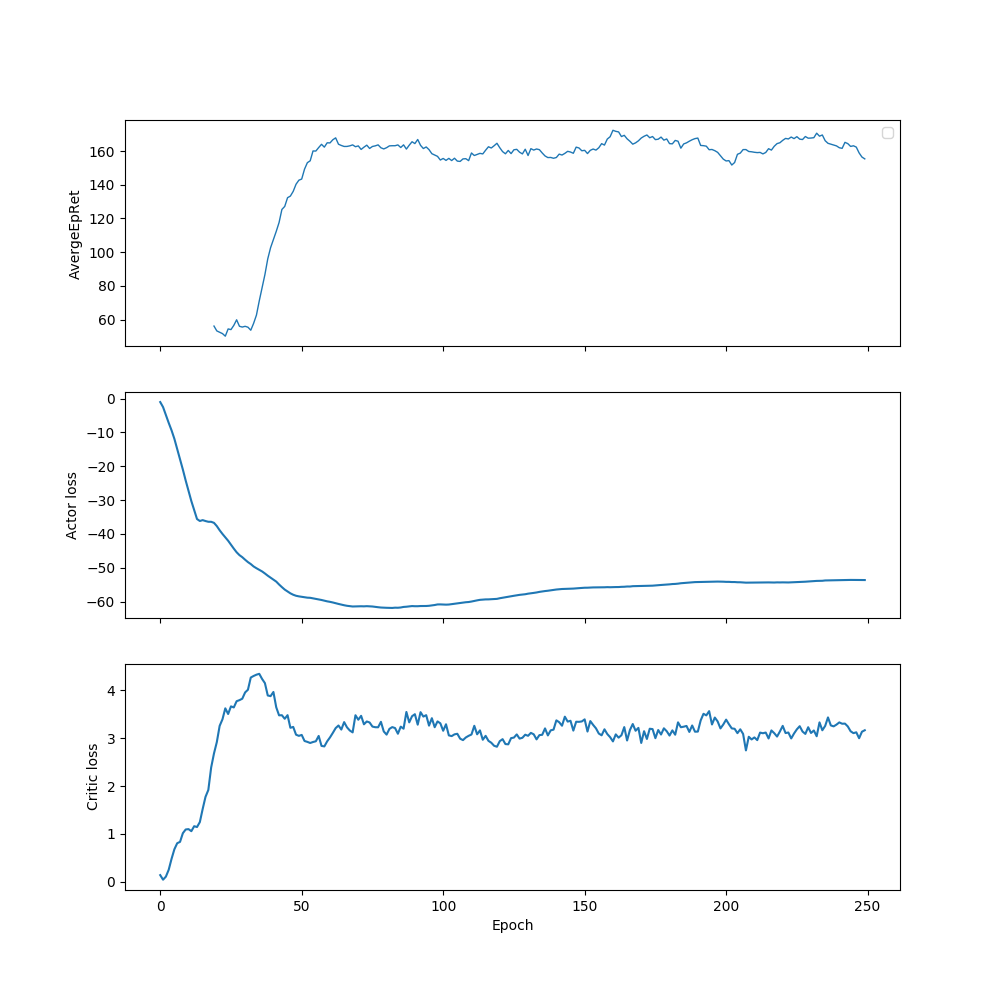

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


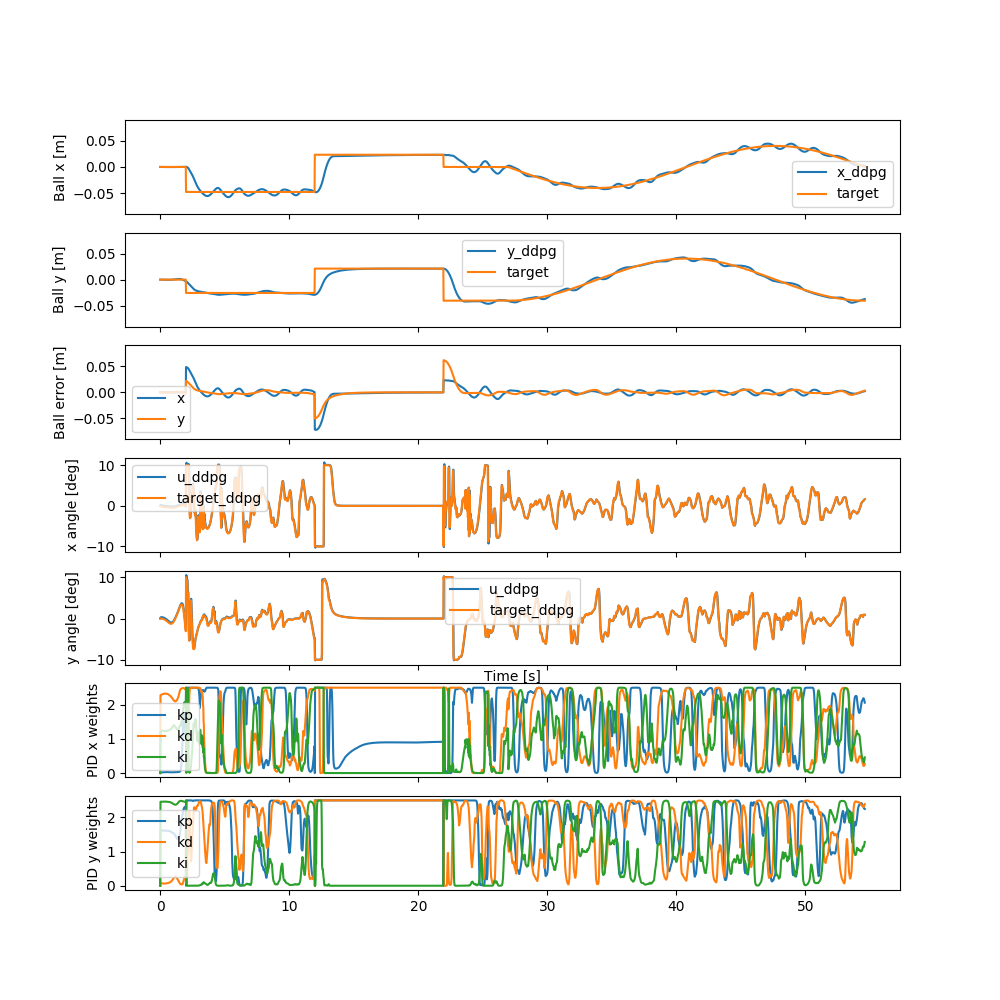

In [11]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [12]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [200,100,50]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[200,100,50]_sigmoid_0.99_hard'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[200,100,50]_sigmoid_0.99_hard/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            200,
            100,
            50
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f8f107b5ef0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[200,100,50]_sigmoid_0.99_hard",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[200,100,50]_sigmoid_0.99_hard/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
 

---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |            65.4 |
|          StdEpRet |            23.9 |
|          MaxEpRet |            99.1 |
|          MinEpRet |            47.4 |
|  AverageTestEpRet |            99.2 |
|      StdTestEpRet |            58.8 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |            4.04 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         8.8e+03 |
|      AverageQVals |            9.41 |
|          StdQVals |            6.11 |
|          MaxQVals |            16.1 |
|          MinQVals |           -13.5 |
|            LossPi |           -9.57 |
|             LossQ |            0.51 |
|              Time |             207 |
---------------------------------------
---------------------------------------
|             Epoch |               9 |
|      AverageEpRet |            93.7 |
|          StdEpRet |            39.1 |


---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             153 |
|          StdEpRet |            47.3 |
|          MaxEpRet |             220 |
|          MinEpRet |             111 |
|  AverageTestEpRet |             108 |
|      StdTestEpRet |            57.6 |
|      MaxTestEpRet |             188 |
|      MinTestEpRet |            16.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.98e+04 |
|      AverageQVals |            18.8 |
|          StdQVals |            8.82 |
|          MaxQVals |            28.4 |
|          MinQVals |           -19.4 |
|            LossPi |           -18.9 |
|             LossQ |            1.45 |
|              Time |             407 |
---------------------------------------
---------------------------------------
|             Epoch |              19 |
|      AverageEpRet |             108 |
|          StdEpRet |            49.9 |


---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |            43.6 |
|          StdEpRet |            41.4 |
|          MaxEpRet |            97.6 |
|          MinEpRet |           -2.82 |
|  AverageTestEpRet |             111 |
|      StdTestEpRet |            65.9 |
|      MaxTestEpRet |             238 |
|      MinTestEpRet |            8.08 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.08e+04 |
|      AverageQVals |              19 |
|          StdQVals |            14.3 |
|          MaxQVals |            38.9 |
|          MinQVals |           -25.6 |
|            LossPi |             -19 |
|             LossQ |               3 |
|              Time |             699 |
---------------------------------------
---------------------------------------
|             Epoch |              29 |
|      AverageEpRet |            26.7 |
|          StdEpRet |            33.9 |


---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |            35.8 |
|          StdEpRet |            52.4 |
|          MaxEpRet |             109 |
|          MinEpRet |           -8.93 |
|  AverageTestEpRet |            96.4 |
|      StdTestEpRet |            55.3 |
|      MaxTestEpRet |             206 |
|      MinTestEpRet |            3.57 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.18e+04 |
|      AverageQVals |            18.7 |
|          StdQVals |            17.4 |
|          MaxQVals |            44.8 |
|          MinQVals |           -33.9 |
|            LossPi |           -18.8 |
|             LossQ |            3.44 |
|              Time |        1.03e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              39 |
|      AverageEpRet |             125 |
|          StdEpRet |            54.1 |


---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |            76.5 |
|          StdEpRet |            36.8 |
|          MaxEpRet |             106 |
|          MinEpRet |            24.7 |
|  AverageTestEpRet |            87.8 |
|      StdTestEpRet |            60.4 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |             9.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.28e+04 |
|      AverageQVals |            18.1 |
|          StdQVals |            19.2 |
|          MaxQVals |            47.4 |
|          MinQVals |           -37.3 |
|            LossPi |           -18.2 |
|             LossQ |            4.32 |
|              Time |        1.26e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              49 |
|      AverageEpRet |             104 |
|          StdEpRet |            37.3 |


---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |              48 |
|          StdEpRet |            36.1 |
|          MaxEpRet |            97.9 |
|          MinEpRet |              14 |
|  AverageTestEpRet |            87.9 |
|      StdTestEpRet |            52.2 |
|      MaxTestEpRet |             193 |
|      MinTestEpRet |            9.29 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.38e+04 |
|      AverageQVals |            17.6 |
|          StdQVals |            19.8 |
|          MaxQVals |            47.9 |
|          MinQVals |           -37.7 |
|            LossPi |           -17.6 |
|             LossQ |            4.29 |
|              Time |        1.51e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              59 |
|      AverageEpRet |             121 |
|          StdEpRet |            12.4 |


---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |            91.5 |
|          StdEpRet |            53.6 |
|          MaxEpRet |             166 |
|          MinEpRet |            43.7 |
|  AverageTestEpRet |            93.3 |
|      StdTestEpRet |            52.6 |
|      MaxTestEpRet |             185 |
|      MinTestEpRet |           -9.45 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.48e+04 |
|      AverageQVals |            17.2 |
|          StdQVals |            19.9 |
|          MaxQVals |              49 |
|          MinQVals |             -40 |
|            LossPi |           -17.3 |
|             LossQ |            4.28 |
|              Time |        1.86e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              69 |
|      AverageEpRet |             105 |
|          StdEpRet |            2.18 |


---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |            46.7 |
|          StdEpRet |            43.3 |
|          MaxEpRet |             108 |
|          MinEpRet |            11.4 |
|  AverageTestEpRet |            98.2 |
|      StdTestEpRet |              52 |
|      MaxTestEpRet |             188 |
|      MinTestEpRet |            30.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.58e+04 |
|      AverageQVals |              17 |
|          StdQVals |            19.8 |
|          MaxQVals |            50.3 |
|          MinQVals |           -41.3 |
|            LossPi |           -17.1 |
|             LossQ |            4.35 |
|              Time |        2.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              79 |
|      AverageEpRet |             122 |
|          StdEpRet |            48.5 |


---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             104 |
|          StdEpRet |            10.1 |
|          MaxEpRet |             118 |
|          MinEpRet |              96 |
|  AverageTestEpRet |             102 |
|      StdTestEpRet |            42.6 |
|      MaxTestEpRet |             186 |
|      MinTestEpRet |            16.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.68e+04 |
|      AverageQVals |            17.4 |
|          StdQVals |            20.1 |
|          MaxQVals |            54.5 |
|          MinQVals |             -42 |
|            LossPi |           -17.5 |
|             LossQ |            4.13 |
|              Time |        2.37e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              89 |
|      AverageEpRet |             117 |
|          StdEpRet |            25.3 |


---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |            72.4 |
|          StdEpRet |            9.67 |
|          MaxEpRet |            85.7 |
|          MinEpRet |            63.2 |
|  AverageTestEpRet |            85.7 |
|      StdTestEpRet |            50.2 |
|      MaxTestEpRet |             177 |
|      MinTestEpRet |            4.95 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.08e+05 |
|      AverageQVals |            17.7 |
|          StdQVals |            20.1 |
|          MaxQVals |            57.5 |
|          MinQVals |           -42.7 |
|            LossPi |           -17.7 |
|             LossQ |            4.08 |
|              Time |        2.59e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              99 |
|      AverageEpRet |            64.4 |
|          StdEpRet |            53.4 |


---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             100 |
|          StdEpRet |            59.5 |
|          MaxEpRet |             168 |
|          MinEpRet |            23.1 |
|  AverageTestEpRet |             113 |
|      StdTestEpRet |            47.2 |
|      MaxTestEpRet |             209 |
|      MinTestEpRet |            26.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.19e+05 |
|      AverageQVals |              18 |
|          StdQVals |              20 |
|          MaxQVals |              59 |
|          MinQVals |           -44.3 |
|            LossPi |             -18 |
|             LossQ |            4.43 |
|              Time |        2.91e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             109 |
|      AverageEpRet |             141 |
|          StdEpRet |            67.4 |


---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             134 |
|          StdEpRet |            85.2 |
|          MaxEpRet |             246 |
|          MinEpRet |            39.2 |
|  AverageTestEpRet |            97.3 |
|      StdTestEpRet |            59.2 |
|      MaxTestEpRet |             199 |
|      MinTestEpRet |           -6.27 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.3e+05 |
|      AverageQVals |            17.8 |
|          StdQVals |            19.8 |
|          MaxQVals |            60.1 |
|          MinQVals |           -42.2 |
|            LossPi |           -17.9 |
|             LossQ |            4.25 |
|              Time |        3.23e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             119 |
|      AverageEpRet |            92.3 |
|          StdEpRet |            51.7 |


---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             141 |
|          StdEpRet |            76.4 |
|          MaxEpRet |             248 |
|          MinEpRet |            77.2 |
|  AverageTestEpRet |            93.8 |
|      StdTestEpRet |            58.8 |
|      MaxTestEpRet |             195 |
|      MinTestEpRet |            1.12 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.41e+05 |
|      AverageQVals |            17.9 |
|          StdQVals |            19.5 |
|          MaxQVals |            60.8 |
|          MinQVals |           -42.9 |
|            LossPi |           -17.9 |
|             LossQ |            4.04 |
|              Time |        3.57e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             129 |
|      AverageEpRet |             202 |
|          StdEpRet |            15.8 |


---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |            80.7 |
|          StdEpRet |            47.6 |
|          MaxEpRet |             136 |
|          MinEpRet |            19.9 |
|  AverageTestEpRet |            75.4 |
|      StdTestEpRet |            45.9 |
|      MaxTestEpRet |             171 |
|      MinTestEpRet |           -14.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.52e+05 |
|      AverageQVals |              18 |
|          StdQVals |            19.3 |
|          MaxQVals |            60.5 |
|          MinQVals |           -43.5 |
|            LossPi |           -18.1 |
|             LossQ |            4.15 |
|              Time |        3.87e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             139 |
|      AverageEpRet |             102 |
|          StdEpRet |            17.4 |


---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             117 |
|          StdEpRet |            47.9 |
|          MaxEpRet |             151 |
|          MinEpRet |              49 |
|  AverageTestEpRet |             105 |
|      StdTestEpRet |              54 |
|      MaxTestEpRet |             203 |
|      MinTestEpRet |            14.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.63e+05 |
|      AverageQVals |            18.4 |
|          StdQVals |            19.2 |
|          MaxQVals |            61.6 |
|          MinQVals |           -44.3 |
|            LossPi |           -18.5 |
|             LossQ |             4.1 |
|              Time |        4.09e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             149 |
|      AverageEpRet |             110 |
|          StdEpRet |            42.7 |


---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |            90.4 |
|          StdEpRet |            28.7 |
|          MaxEpRet |             127 |
|          MinEpRet |            57.3 |
|  AverageTestEpRet |            96.6 |
|      StdTestEpRet |            56.5 |
|      MaxTestEpRet |             215 |
|      MinTestEpRet |             8.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.74e+05 |
|      AverageQVals |            18.6 |
|          StdQVals |            19.3 |
|          MaxQVals |            64.4 |
|          MinQVals |           -45.5 |
|            LossPi |           -18.6 |
|             LossQ |            4.12 |
|              Time |         4.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             159 |
|      AverageEpRet |             101 |
|          StdEpRet |            43.8 |


---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |            47.2 |
|          StdEpRet |            36.2 |
|          MaxEpRet |            83.5 |
|          MinEpRet |           -2.17 |
|  AverageTestEpRet |             103 |
|      StdTestEpRet |            59.7 |
|      MaxTestEpRet |             217 |
|      MinTestEpRet |            23.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.85e+05 |
|      AverageQVals |            18.6 |
|          StdQVals |            19.3 |
|          MaxQVals |            67.4 |
|          MinQVals |           -47.9 |
|            LossPi |           -18.7 |
|             LossQ |             4.1 |
|              Time |         4.5e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             169 |
|      AverageEpRet |            85.7 |
|          StdEpRet |            53.3 |


---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             130 |
|          StdEpRet |            34.8 |
|          MaxEpRet |             158 |
|          MinEpRet |            80.6 |
|  AverageTestEpRet |             101 |
|      StdTestEpRet |            47.9 |
|      MaxTestEpRet |             177 |
|      MinTestEpRet |            7.33 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.96e+05 |
|      AverageQVals |            18.4 |
|          StdQVals |            18.9 |
|          MaxQVals |            68.8 |
|          MinQVals |           -44.7 |
|            LossPi |           -18.5 |
|             LossQ |            3.81 |
|              Time |         4.7e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             179 |
|      AverageEpRet |              41 |
|          StdEpRet |            56.8 |


---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |            61.4 |
|          StdEpRet |            10.6 |
|          MaxEpRet |            76.2 |
|          MinEpRet |            51.7 |
|  AverageTestEpRet |              83 |
|      StdTestEpRet |            59.9 |
|      MaxTestEpRet |             244 |
|      MinTestEpRet |            4.59 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.07e+05 |
|      AverageQVals |            18.6 |
|          StdQVals |            18.6 |
|          MaxQVals |            68.7 |
|          MinQVals |           -41.9 |
|            LossPi |           -18.6 |
|             LossQ |            3.68 |
|              Time |        4.91e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             189 |
|      AverageEpRet |            61.7 |
|          StdEpRet |            44.2 |


---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |            89.7 |
|          StdEpRet |            92.3 |
|          MaxEpRet |             213 |
|          MinEpRet |           -9.85 |
|  AverageTestEpRet |            83.6 |
|      StdTestEpRet |            52.7 |
|      MaxTestEpRet |             203 |
|      MinTestEpRet |           -3.88 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.18e+05 |
|      AverageQVals |            18.5 |
|          StdQVals |            18.7 |
|          MaxQVals |            68.3 |
|          MinQVals |             -43 |
|            LossPi |           -18.6 |
|             LossQ |            3.53 |
|              Time |        5.11e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             199 |
|      AverageEpRet |            76.2 |
|          StdEpRet |              41 |


---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |            85.8 |
|          StdEpRet |            10.7 |
|          MaxEpRet |            99.9 |
|          MinEpRet |            74.2 |
|  AverageTestEpRet |            82.1 |
|      StdTestEpRet |            37.8 |
|      MaxTestEpRet |             154 |
|      MinTestEpRet |              16 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.29e+05 |
|      AverageQVals |            18.5 |
|          StdQVals |            18.6 |
|          MaxQVals |            65.7 |
|          MinQVals |           -41.8 |
|            LossPi |           -18.6 |
|             LossQ |            3.59 |
|              Time |         5.4e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             209 |
|      AverageEpRet |            42.1 |
|          StdEpRet |            26.8 |


---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             122 |
|          StdEpRet |            35.6 |
|          MaxEpRet |             162 |
|          MinEpRet |            75.7 |
|  AverageTestEpRet |            82.6 |
|      StdTestEpRet |            60.5 |
|      MaxTestEpRet |             213 |
|      MinTestEpRet |            4.28 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.4e+05 |
|      AverageQVals |            18.5 |
|          StdQVals |            18.5 |
|          MaxQVals |            64.1 |
|          MinQVals |           -41.9 |
|            LossPi |           -18.5 |
|             LossQ |            3.36 |
|              Time |        5.75e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             219 |
|      AverageEpRet |            78.2 |
|          StdEpRet |            59.2 |


---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             127 |
|          StdEpRet |            42.6 |
|          MaxEpRet |             167 |
|          MinEpRet |              68 |
|  AverageTestEpRet |             113 |
|      StdTestEpRet |            63.3 |
|      MaxTestEpRet |             262 |
|      MinTestEpRet |            21.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.51e+05 |
|      AverageQVals |            18.5 |
|          StdQVals |            18.5 |
|          MaxQVals |            65.7 |
|          MinQVals |           -41.5 |
|            LossPi |           -18.5 |
|             LossQ |            3.42 |
|              Time |        6.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             229 |
|      AverageEpRet |            92.8 |
|          StdEpRet |            16.9 |


---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |            78.4 |
|          StdEpRet |            35.6 |
|          MaxEpRet |             129 |
|          MinEpRet |            49.6 |
|  AverageTestEpRet |            96.5 |
|      StdTestEpRet |            58.6 |
|      MaxTestEpRet |             226 |
|      MinTestEpRet |            8.45 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.62e+05 |
|      AverageQVals |            18.7 |
|          StdQVals |            18.4 |
|          MaxQVals |            69.9 |
|          MinQVals |           -42.2 |
|            LossPi |           -18.8 |
|             LossQ |            3.57 |
|              Time |        6.36e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             239 |
|      AverageEpRet |            88.7 |
|          StdEpRet |            46.3 |


---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             124 |
|          StdEpRet |              39 |
|          MaxEpRet |             167 |
|          MinEpRet |            72.8 |
|  AverageTestEpRet |             120 |
|      StdTestEpRet |            57.1 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            24.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.73e+05 |
|      AverageQVals |            18.6 |
|          StdQVals |            18.2 |
|          MaxQVals |              71 |
|          MinQVals |           -40.1 |
|            LossPi |           -18.7 |
|             LossQ |            3.53 |
|              Time |         6.7e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             249 |
|      AverageEpRet |             137 |
|          StdEpRet |            8.57 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.0005559473115806549


<IPython.core.display.Javascript object>


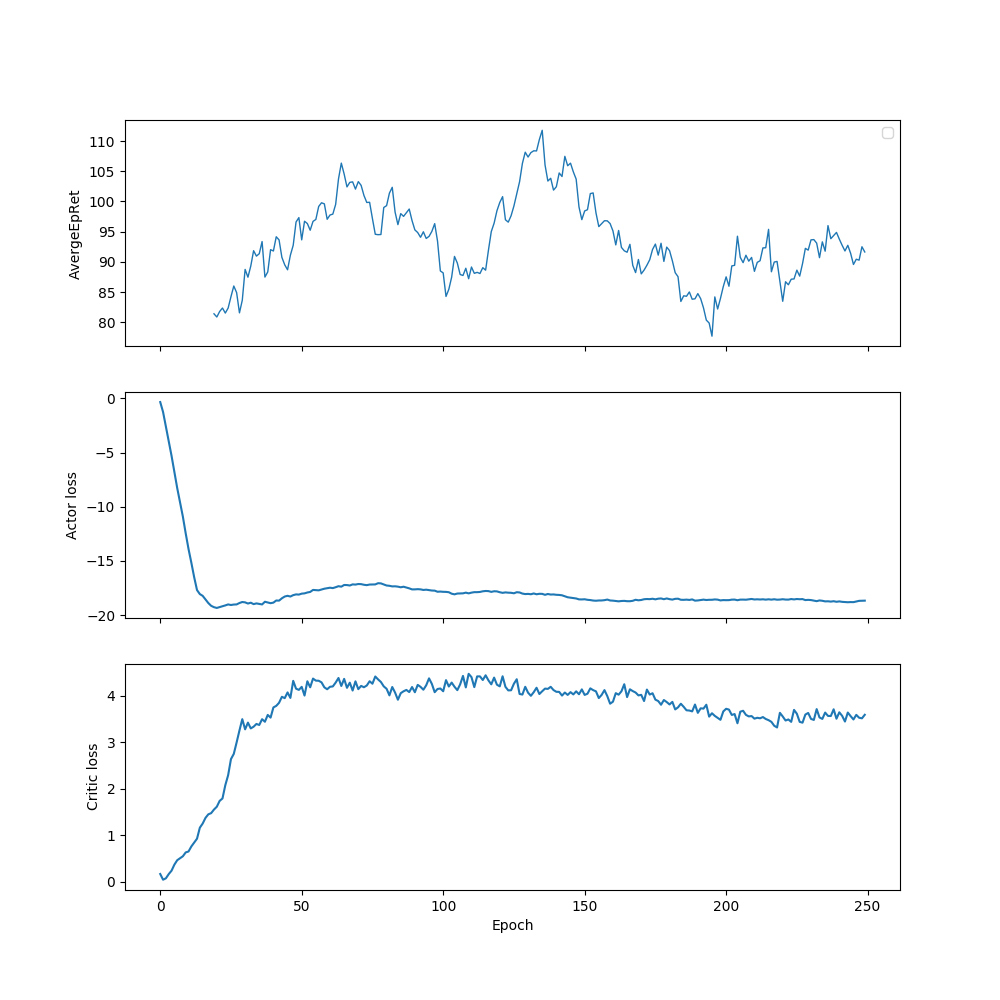

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


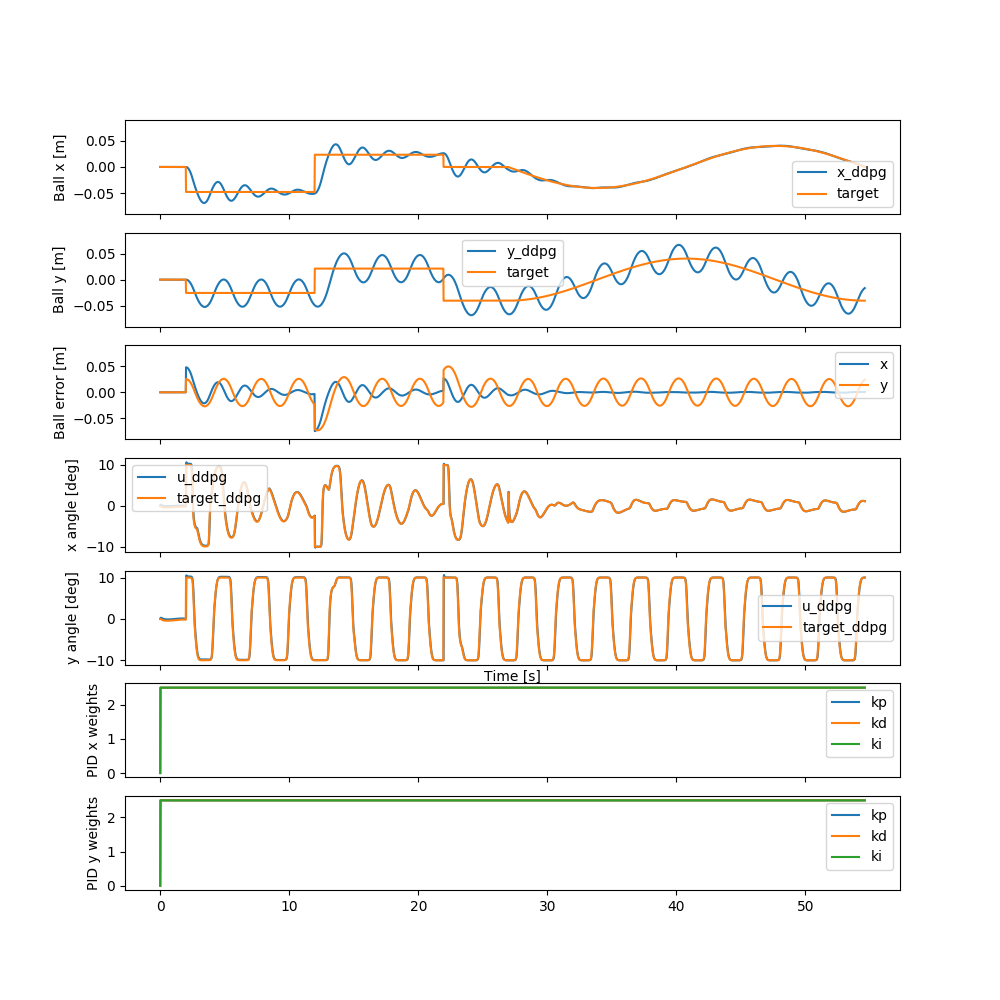

In [13]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()

In [14]:
env = BBEnvPid
ac = PidActorCritic
reward_fn = linear_e_reward
w = 0.6
hidden_size = [200,100]
gamma = 0.99
act = torch.nn.Sigmoid
name='le0.6_[200,100]_sigmoid_0.99_hard'

Logging data to src/data/dyn_pid_controller/explo/le0.6_[200,100]_sigmoid_0.99_hard/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            200,
            100
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"PidActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7f8f104da2b0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/dyn_pid_controller/explo/le0.6_[200,100]_sigmoid_0.99_hard",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/dyn_pid_controller/explo/le0.6_[200,100]_sigmoid_0.99_hard/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
                }
        

---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |            66.4 |
|          StdEpRet |            14.9 |
|          MaxEpRet |            86.6 |
|          MinEpRet |              51 |
|  AverageTestEpRet |             107 |
|      StdTestEpRet |            56.1 |
|      MaxTestEpRet |             218 |
|      MinTestEpRet |             8.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         8.8e+03 |
|      AverageQVals |            11.7 |
|          StdQVals |            3.25 |
|          MaxQVals |            16.6 |
|          MinQVals |           -1.89 |
|            LossPi |           -11.9 |
|             LossQ |           0.128 |
|              Time |             188 |
---------------------------------------
---------------------------------------
|             Epoch |               9 |
|      AverageEpRet |            69.4 |
|          StdEpRet |            14.4 |


---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             102 |
|          StdEpRet |            31.7 |
|          MaxEpRet |             126 |
|          MinEpRet |            57.2 |
|  AverageTestEpRet |            92.6 |
|      StdTestEpRet |            56.2 |
|      MaxTestEpRet |             212 |
|      MinTestEpRet |            15.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.98e+04 |
|      AverageQVals |            22.8 |
|          StdQVals |             7.3 |
|          MaxQVals |            32.3 |
|          MinQVals |           -8.12 |
|            LossPi |           -22.9 |
|             LossQ |           0.938 |
|              Time |             466 |
---------------------------------------
---------------------------------------
|             Epoch |              19 |
|      AverageEpRet |             129 |
|          StdEpRet |            15.4 |


---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             127 |
|          StdEpRet |            59.8 |
|          MaxEpRet |             185 |
|          MinEpRet |              45 |
|  AverageTestEpRet |            75.9 |
|      StdTestEpRet |            46.8 |
|      MaxTestEpRet |             189 |
|      MinTestEpRet |           -11.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.08e+04 |
|      AverageQVals |            23.2 |
|          StdQVals |            13.4 |
|          MaxQVals |            43.8 |
|          MinQVals |           -30.5 |
|            LossPi |           -23.4 |
|             LossQ |            3.07 |
|              Time |             641 |
---------------------------------------
---------------------------------------
|             Epoch |              29 |
|      AverageEpRet |             121 |
|          StdEpRet |            9.27 |


---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |            20.5 |
|          StdEpRet |            17.6 |
|          MaxEpRet |            39.8 |
|          MinEpRet |           -3.65 |
|  AverageTestEpRet |            1.07 |
|      StdTestEpRet |            35.6 |
|      MaxTestEpRet |            81.2 |
|      MinTestEpRet |           -67.9 |
|             EpLen |             289 |
|         TestEpLen |             317 |
| TotalEnvInteracts |        4.18e+04 |
|      AverageQVals |            32.9 |
|          StdQVals |            13.8 |
|          MaxQVals |            54.3 |
|          MinQVals |           -12.3 |
|            LossPi |           -33.4 |
|             LossQ |            2.56 |
|              Time |             798 |
---------------------------------------
---------------------------------------
|             Epoch |              39 |
|      AverageEpRet |            65.6 |
|          StdEpRet |            50.7 |


---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |            94.8 |
|          StdEpRet |            69.1 |
|          MaxEpRet |             160 |
|          MinEpRet |          -0.852 |
|  AverageTestEpRet |            86.5 |
|      StdTestEpRet |            56.5 |
|      MaxTestEpRet |             184 |
|      MinTestEpRet |             -11 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.28e+04 |
|      AverageQVals |            43.4 |
|          StdQVals |            12.8 |
|          MaxQVals |            61.1 |
|          MinQVals |           -6.87 |
|            LossPi |           -43.8 |
|             LossQ |            2.28 |
|              Time |             958 |
---------------------------------------
---------------------------------------
|             Epoch |              49 |
|      AverageEpRet |             116 |
|          StdEpRet |              75 |


---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |            92.1 |
|          StdEpRet |            16.6 |
|          MaxEpRet |             114 |
|          MinEpRet |            73.6 |
|  AverageTestEpRet |             143 |
|      StdTestEpRet |            53.5 |
|      MaxTestEpRet |             217 |
|      MinTestEpRet |           -4.08 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.38e+04 |
|      AverageQVals |            47.9 |
|          StdQVals |            12.6 |
|          MaxQVals |            65.7 |
|          MinQVals |           -4.82 |
|            LossPi |           -48.3 |
|             LossQ |            2.15 |
|              Time |        1.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              59 |
|      AverageEpRet |             190 |
|          StdEpRet |            21.9 |


---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             134 |
|          StdEpRet |            26.9 |
|          MaxEpRet |             165 |
|          MinEpRet |            99.4 |
|  AverageTestEpRet |             136 |
|      StdTestEpRet |              62 |
|      MaxTestEpRet |             229 |
|      MinTestEpRet |           -49.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.48e+04 |
|      AverageQVals |            51.7 |
|          StdQVals |            12.3 |
|          MaxQVals |            68.9 |
|          MinQVals |           -12.3 |
|            LossPi |           -52.1 |
|             LossQ |            2.06 |
|              Time |        1.43e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              69 |
|      AverageEpRet |             157 |
|          StdEpRet |            19.8 |


---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             200 |
|          StdEpRet |              13 |
|          MaxEpRet |             218 |
|          MinEpRet |             189 |
|  AverageTestEpRet |             162 |
|      StdTestEpRet |              37 |
|      MaxTestEpRet |             216 |
|      MinTestEpRet |            95.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.58e+04 |
|      AverageQVals |            53.2 |
|          StdQVals |            12.7 |
|          MaxQVals |            70.9 |
|          MinQVals |           -12.1 |
|            LossPi |           -53.6 |
|             LossQ |            2.45 |
|              Time |        1.71e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              79 |
|      AverageEpRet |             148 |
|          StdEpRet |              42 |


---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             170 |
|          StdEpRet |            30.9 |
|          MaxEpRet |             201 |
|          MinEpRet |             128 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |              42 |
|      MaxTestEpRet |             212 |
|      MinTestEpRet |            60.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.68e+04 |
|      AverageQVals |            54.8 |
|          StdQVals |            11.9 |
|          MaxQVals |            72.4 |
|          MinQVals |           -10.6 |
|            LossPi |           -55.2 |
|             LossQ |            2.17 |
|              Time |        1.99e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              89 |
|      AverageEpRet |             132 |
|          StdEpRet |            16.1 |


---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |            94.7 |
|          StdEpRet |            19.4 |
|          MaxEpRet |             119 |
|          MinEpRet |              71 |
|  AverageTestEpRet |             135 |
|      StdTestEpRet |            50.4 |
|      MaxTestEpRet |             197 |
|      MinTestEpRet |            27.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.08e+05 |
|      AverageQVals |            55.5 |
|          StdQVals |            11.5 |
|          MaxQVals |            73.2 |
|          MinQVals |           -5.68 |
|            LossPi |           -55.9 |
|             LossQ |            2.18 |
|              Time |        2.19e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              99 |
|      AverageEpRet |             155 |
|          StdEpRet |            35.4 |


---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             145 |
|          StdEpRet |            30.5 |
|          MaxEpRet |             186 |
|          MinEpRet |             113 |
|  AverageTestEpRet |             148 |
|      StdTestEpRet |            53.6 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |            49.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.19e+05 |
|      AverageQVals |            55.8 |
|          StdQVals |            11.8 |
|          MaxQVals |            73.5 |
|          MinQVals |           -4.96 |
|            LossPi |           -56.2 |
|             LossQ |            2.66 |
|              Time |        2.35e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             109 |
|      AverageEpRet |             130 |
|          StdEpRet |            57.1 |


---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             195 |
|          StdEpRet |            19.6 |
|          MaxEpRet |             222 |
|          MinEpRet |             176 |
|  AverageTestEpRet |             173 |
|      StdTestEpRet |            36.7 |
|      MaxTestEpRet |             219 |
|      MinTestEpRet |            71.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.3e+05 |
|      AverageQVals |            57.8 |
|          StdQVals |            12.3 |
|          MaxQVals |            75.3 |
|          MinQVals |            -3.6 |
|            LossPi |           -58.2 |
|             LossQ |            2.84 |
|              Time |        2.51e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             119 |
|      AverageEpRet |             176 |
|          StdEpRet |            6.59 |


---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             181 |
|          StdEpRet |            39.6 |
|          MaxEpRet |             212 |
|          MinEpRet |             125 |
|  AverageTestEpRet |             171 |
|      StdTestEpRet |            39.3 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |              69 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.41e+05 |
|      AverageQVals |            59.9 |
|          StdQVals |            11.8 |
|          MaxQVals |            76.5 |
|          MinQVals |           -12.1 |
|            LossPi |           -60.3 |
|             LossQ |            2.63 |
|              Time |        2.67e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             129 |
|      AverageEpRet |             167 |
|          StdEpRet |            7.23 |


---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             151 |
|          StdEpRet |            17.6 |
|          MaxEpRet |             173 |
|          MinEpRet |             130 |
|  AverageTestEpRet |             138 |
|      StdTestEpRet |            50.9 |
|      MaxTestEpRet |             200 |
|      MinTestEpRet |            39.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.52e+05 |
|      AverageQVals |            59.5 |
|          StdQVals |            11.1 |
|          MaxQVals |            75.4 |
|          MinQVals |           -10.3 |
|            LossPi |           -59.8 |
|             LossQ |             2.7 |
|              Time |        2.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             139 |
|      AverageEpRet |             166 |
|          StdEpRet |            32.9 |


---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             203 |
|          StdEpRet |              12 |
|          MaxEpRet |             218 |
|          MinEpRet |             189 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |            43.2 |
|      MaxTestEpRet |             211 |
|      MinTestEpRet |              52 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.63e+05 |
|      AverageQVals |              59 |
|          StdQVals |              11 |
|          MaxQVals |            74.9 |
|          MinQVals |             -13 |
|            LossPi |           -59.3 |
|             LossQ |            2.35 |
|              Time |        2.98e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             149 |
|      AverageEpRet |            85.3 |
|          StdEpRet |              19 |


---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             148 |
|          StdEpRet |            60.1 |
|          MaxEpRet |             205 |
|          MinEpRet |            65.2 |
|  AverageTestEpRet |             131 |
|      StdTestEpRet |            55.5 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |            36.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.74e+05 |
|      AverageQVals |              59 |
|          StdQVals |            10.9 |
|          MaxQVals |            74.9 |
|          MinQVals |           -16.2 |
|            LossPi |           -59.3 |
|             LossQ |            2.55 |
|              Time |        3.13e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             159 |
|      AverageEpRet |             165 |
|          StdEpRet |            39.7 |


---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             179 |
|          StdEpRet |              16 |
|          MaxEpRet |             199 |
|          MinEpRet |             160 |
|  AverageTestEpRet |             122 |
|      StdTestEpRet |            61.9 |
|      MaxTestEpRet |             197 |
|      MinTestEpRet |            -6.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.85e+05 |
|      AverageQVals |            58.7 |
|          StdQVals |              11 |
|          MaxQVals |            74.6 |
|          MinQVals |           -16.5 |
|            LossPi |             -59 |
|             LossQ |            2.61 |
|              Time |        3.27e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             169 |
|      AverageEpRet |            80.7 |
|          StdEpRet |            32.5 |


---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             175 |
|          StdEpRet |              57 |
|          MaxEpRet |             224 |
|          MinEpRet |            94.7 |
|  AverageTestEpRet |             142 |
|      StdTestEpRet |              54 |
|      MaxTestEpRet |             227 |
|      MinTestEpRet |            48.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.96e+05 |
|      AverageQVals |            58.4 |
|          StdQVals |            10.8 |
|          MaxQVals |            74.2 |
|          MinQVals |           -18.9 |
|            LossPi |           -58.7 |
|             LossQ |            2.63 |
|              Time |        3.42e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             179 |
|      AverageEpRet |             152 |
|          StdEpRet |            69.8 |


---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             132 |
|          StdEpRet |            62.6 |
|          MaxEpRet |             196 |
|          MinEpRet |            46.5 |
|  AverageTestEpRet |             147 |
|      StdTestEpRet |            71.8 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |           -36.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.07e+05 |
|      AverageQVals |            57.8 |
|          StdQVals |            10.6 |
|          MaxQVals |            73.8 |
|          MinQVals |             -28 |
|            LossPi |             -58 |
|             LossQ |             2.5 |
|              Time |        3.57e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             189 |
|      AverageEpRet |             135 |
|          StdEpRet |            31.3 |


---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             173 |
|          StdEpRet |            40.3 |
|          MaxEpRet |             214 |
|          MinEpRet |             118 |
|  AverageTestEpRet |             139 |
|      StdTestEpRet |            43.3 |
|      MaxTestEpRet |             218 |
|      MinTestEpRet |            66.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.18e+05 |
|      AverageQVals |              57 |
|          StdQVals |            10.7 |
|          MaxQVals |              73 |
|          MinQVals |           -15.4 |
|            LossPi |           -57.3 |
|             LossQ |            2.66 |
|              Time |        3.73e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             199 |
|      AverageEpRet |             176 |
|          StdEpRet |            24.3 |


---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             128 |
|          StdEpRet |            77.4 |
|          MaxEpRet |             227 |
|          MinEpRet |            38.2 |
|  AverageTestEpRet |             149 |
|      StdTestEpRet |              57 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |            50.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.29e+05 |
|      AverageQVals |            56.8 |
|          StdQVals |            10.9 |
|          MaxQVals |            72.8 |
|          MinQVals |           -35.1 |
|            LossPi |           -57.1 |
|             LossQ |            2.57 |
|              Time |        3.88e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             209 |
|      AverageEpRet |             144 |
|          StdEpRet |            17.3 |


---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             141 |
|          StdEpRet |            46.7 |
|          MaxEpRet |             207 |
|          MinEpRet |             102 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |            48.4 |
|      MaxTestEpRet |             226 |
|      MinTestEpRet |              46 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.4e+05 |
|      AverageQVals |            57.4 |
|          StdQVals |            11.3 |
|          MaxQVals |            74.1 |
|          MinQVals |           -39.3 |
|            LossPi |           -57.7 |
|             LossQ |            2.81 |
|              Time |        4.02e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             219 |
|      AverageEpRet |             171 |
|          StdEpRet |            32.5 |


---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             163 |
|          StdEpRet |            60.8 |
|          MaxEpRet |             222 |
|          MinEpRet |              79 |
|  AverageTestEpRet |             153 |
|      StdTestEpRet |            39.7 |
|      MaxTestEpRet |             221 |
|      MinTestEpRet |            76.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.51e+05 |
|      AverageQVals |            57.5 |
|          StdQVals |            10.7 |
|          MaxQVals |            73.5 |
|          MinQVals |           -12.4 |
|            LossPi |           -57.8 |
|             LossQ |            2.77 |
|              Time |        4.17e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             229 |
|      AverageEpRet |             122 |
|          StdEpRet |            33.6 |


---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             146 |
|          StdEpRet |            38.3 |
|          MaxEpRet |             190 |
|          MinEpRet |            96.8 |
|  AverageTestEpRet |             163 |
|      StdTestEpRet |            54.3 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |            28.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.62e+05 |
|      AverageQVals |            57.2 |
|          StdQVals |            10.5 |
|          MaxQVals |            73.2 |
|          MinQVals |           -24.8 |
|            LossPi |           -57.4 |
|             LossQ |            2.63 |
|              Time |        4.32e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             239 |
|      AverageEpRet |             150 |
|          StdEpRet |            49.6 |


---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             150 |
|          StdEpRet |            36.1 |
|          MaxEpRet |             190 |
|          MinEpRet |             103 |
|  AverageTestEpRet |             173 |
|      StdTestEpRet |            42.8 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |            86.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.73e+05 |
|      AverageQVals |            56.8 |
|          StdQVals |            10.4 |
|          MaxQVals |            71.9 |
|          MinQVals |           -25.9 |
|            LossPi |           -57.1 |
|             LossQ |            2.78 |
|              Time |        4.47e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             249 |
|      AverageEpRet |             204 |
|          StdEpRet |            5.45 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


-0.00016630287509259985


<IPython.core.display.Javascript object>


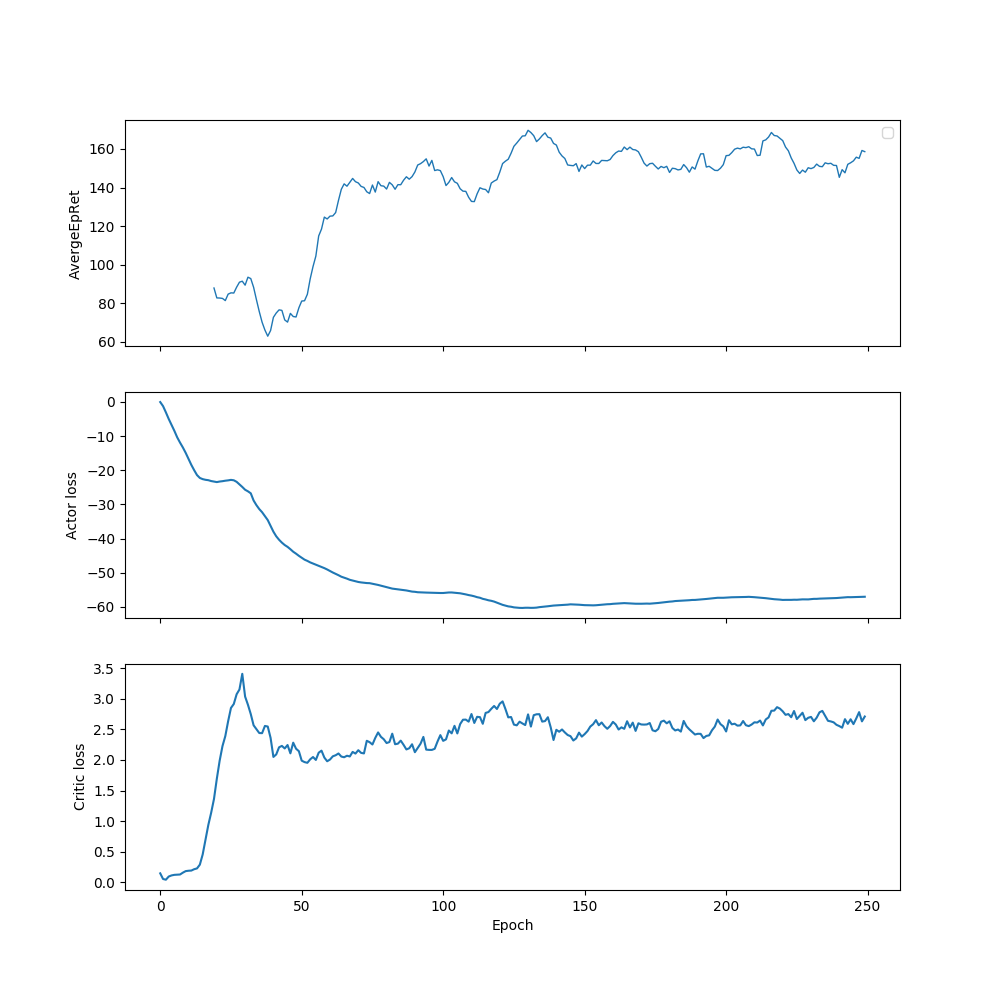

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


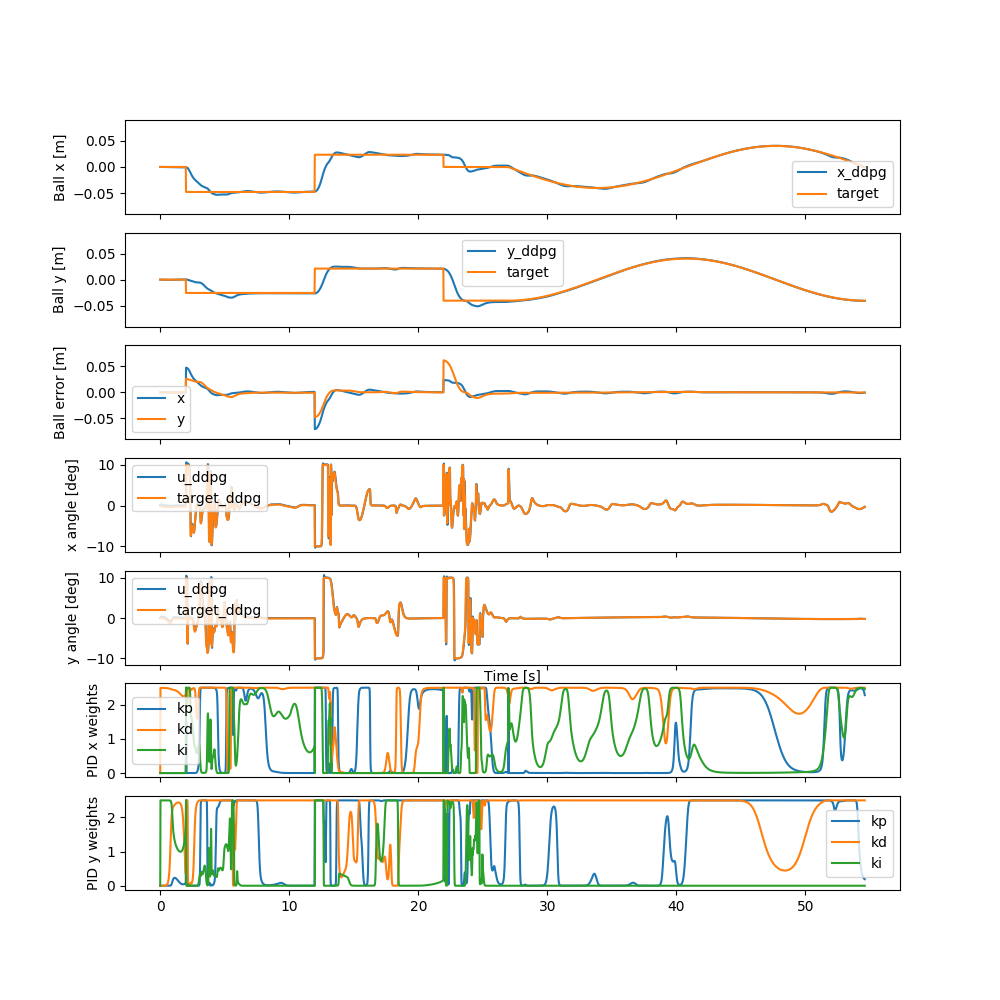

In [15]:
if train:
    spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=act), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
evaluator_ddpg = env()
history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg, kp, kd, ki = evaluator_ddpg.simulate(trained_ac, test_trajectory)

print(loss_ddpg)

log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
axs[0].set_ylabel('AvergeEpRet')
axs[0].legend()
axs[2].set_xlabel('Epoch')

axs[1].plot(log['LossPi'])
axs[1].set_ylabel('Actor loss')
axs[2].set_xlabel('Epoch')

axs[2].plot(log['LossQ'])
axs[2].set_ylabel('Critic loss')
axs[2].set_xlabel('Epoch')

fig, axs = plt.subplots(7, 1, sharex=True, figsize=(10, 10))

axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
axs[0].plot(t, test_trajectory[0, :], label='target')
axs[0].set_ylabel('Ball x [m]')
axs[0].set_ylim([-MAX_X, MAX_X])
axs[0].legend()

axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
axs[1].plot(t, test_trajectory[1, :], label='target')
axs[1].set_ylabel('Ball y [m]')
axs[1].set_ylim([-MAX_X, MAX_X])
axs[1].legend()

axs[2].plot(t, error_ddpg[0, :], label='x')
axs[2].plot(t, error_ddpg[1, :], label='y')
axs[2].set_ylabel('Ball error [m]')
axs[2].set_ylim([-MAX_X, MAX_X])
axs[2].legend()

axs[3].plot(t, angle_ddpg[0, :], label='u_ddpg')
axs[3].plot(t, u_ddpg[0, :], label='target_ddpg')
axs[3].set_ylabel('x angle [deg]')
axs[3].legend()

axs[4].plot(t, angle_ddpg[1, :], label='u_ddpg')
axs[4].plot(t, u_ddpg[1, :], label='target_ddpg')
axs[4].set_xlabel('Time [s]')
axs[4].set_ylabel('y angle [deg]')
axs[4].legend()

axs[5].plot(t, kp[0, :], label='kp')
axs[5].plot(t, kd[0, :], label='kd')
axs[5].plot(t, ki[0, :], label='ki')
axs[5].set_ylabel('PID x weights')
axs[5].legend()

axs[6].plot(t, kp[1, :], label='kp')
axs[6].plot(t, kd[1, :], label='kd')
axs[6].plot(t, ki[1, :], label='ki')
axs[6].set_ylabel('PID y weights')
axs[6].legend()

plt.show()